# Background & Context

You are a Data Scientist for a tourism company named "Visit with us". The Policy Maker of the company wants to enable and establish a viable business model to expand the customer base.

A viable business model is a central concept that helps you to understand the existing ways of doing the business and how to change the ways for the benefit of the tourism sector.

One of the ways to expand the customer base is to introduce a new offering of packages.

Currently, there are 5 types of packages the company is offering - Basic, Standard, Deluxe, Super Deluxe, King. Looking at the data of the last year, we observed that 18% of the customers purchased the packages.

However, the marketing cost was quite high because customers were contacted at random without looking at the available information.

The company is now planning to launch a new product i.e. Wellness Tourism Package. Wellness Tourism is defined as Travel that allows the traveler to maintain, enhance or kick-start a healthy lifestyle, and support or increase one's sense of well-being.

However, this time company wants to harness the available data of existing and potential customers to make the marketing expenditure more efficient.

You as a Data Scientist at "Visit with us" travel company have to analyze the customers' data and information to provide recommendations to the Policy Maker and Marketing Team and also build a model to predict the potential customer who is going to purchase the newly introduced travel package.


# Objective

To predict which customer is more likely to purchase the newly introduced travel package.

# Data Dictionary

**Data Dictionary - Tourism.csv** 

`CustomerID`: Unique customer ID. Primary key for table.

`ProdTaken`: Whether the customer has purchased a package or not (0: No, 1: Yes). Presumably from a survey.

`Age`: Age of customer

`TypeofContact`: How customer was contacted (Company Invited or Self Inquiry)

`CityTier`: City tier depends on the development of a city, population, facilities, and living standards. The categories are ordered  in terms of the development of the city, facilities, living standards, etc. i.e. Tier 1 > Tier 2 > Tier 3. City tier refers to the city tier where the customer resides. 

`Occupation`: Occupation of customer

`Gender`: Gender of customer

`NumberOfPersonVisiting`: Total number of persons planning to take the trip with the customer

`PreferredPropertyStar`: Preferred hotel property rating by customer

`MaritalStatus`: Marital status of customer. Unmarried and single are not the same in the marital status feature, since an “unmarried” person could potentially have a partner but not be married to them, whereas a "single" person is merely one without a partner. 

`NumberOfTrips`: Average number of trips in a year by customer

`Passport`: The customer has a passport or not (0: No, 1: Yes)

`OwnCar`: Whether the customers own a car or not (0: No, 1: Yes)

`NumberOfChildrenVisiting`: Total number of children with age less than 5 planning to take the trip with the customer

`Designation`: Designation of the customer in the current organization. Designation of the customer in the organization the customer is working in currently.

`MonthlyIncome`: Gross monthly income of the customer in USD ($).

**Customer interaction data**: 

`PitchSatisfactionScore`: Sales pitch satisfaction score

`ProductPitched`: Product pitched by the salesperson

`NumberOfFollowups`: Total number of follow-ups has been done by the salesperson after the sales pitch

`DurationOfPitch`: Duration of the pitch by a salesperson to the customer


# Notes

- But here we have a **bool** data type. What should we do here?
- In Python, True and False are cast implicitly into integers:

    `True == 1`
    
    `False == 0`
    
    This means that an algorithm running in pure Python should work without conversion.

# Project Statement

**Target variable:** 
`ProdTaken`.

**What are we doing?** 
Creating an inferential model on the training data from a sample of this dataset. Then using the same model to predict the liklihood that a customer will purchase a package using the `ProdTaken` feature. We will look at the model's accuracy (and other metrics) to gauge the reliability of the prediction in applying it to a marketing campaign. We will give insights from analysis and recommendations using the business context.

**What variables explain the change in the target variable?**
We will look at each variable individually for it's validity to be used in the an inferential model. Then we will prune where necessary or allow the hyperparameter tuning to decide for us based on the type of algorithm we use.


# Libraries

In [1]:
#juypter libraries
# https://pypi.org/project/memory-profiler/
#from memory_profiler import profile

# for data analysis
# Libraries to help with reading and manipulating data
import numpy as np
import pandas as pd
from pandas_profiling import ProfileReport
import scipy.stats as stats
import statsmodels.api as sm
import statsmodels.stats.api as sms

# for data visualization
# Libraries to help with data visualization
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

# modeling building
from sklearn import metrics # to get diferent metric scores
from sklearn.impute import SimpleImputer
from sklearn import tree
from statsmodels.tools.tools import add_constant
from sklearn.model_selection import train_test_split # library to split data
from sklearn.tree import DecisionTreeClassifier

# Libraries to import decision tree classifier and different ensemble classifiers
import ray
# Start Ray. If you're connecting to an existing cluster, you would use
# https://buildmedia.readthedocs.org/media/pdf/ray/stable/ray.pdf
# ray.init(address=<cluster-address>) instead.
ray.init(ignore_reinit_error=True,log_to_driver=False)

from tune_sklearn import TuneGridSearchCV
from sklearn.model_selection import GridSearchCV
from sklearn.ensemble import BaggingClassifier, RandomForestClassifier, GradientBoostingClassifier, StackingRegressor, AdaBoostClassifier
from sklearn.ensemble import StackingClassifier
from xgboost import XGBRegressor
from xgboost import XGBClassifier
import xgboost as xgb #https://xgboost.readthedocs.io/en/latest/python/python_intro.html

# model performrance
from sklearn.metrics import accuracy_score, recall_score, precision_score, f1_score,roc_auc_score, roc_curve, confusion_matrix, precision_recall_curve

# Libtune to tune model, get different metric scores
from sklearn import metrics
from sklearn.metrics import confusion_matrix, classification_report, accuracy_score, precision_score, recall_score, f1_score

from statsmodels.stats.outliers_influence import variance_inflation_factor

# Libraries to split data, impute missing values
from sklearn.impute import SimpleImputer

# for juyter notebook
# Library to suppress warnings or deprecation notes
!jupyter nbextension enable --py widgetsnbextension
pd.set_option("display.max_columns", None) # removes the limit from the number of displayed columns and rows.
pd.set_option("display.max_rows", 200)

import warnings
warnings.filterwarnings(action='ignore')
pd.set_option(
"display.float_format", lambda x: "%.2f" % x)  # To supress numerical display in scientific notations

2021-07-25 02:04:49,166	INFO services.py:1272 -- View the Ray dashboard at http://127.0.0.1:8265
Enabling notebook extension jupyter-js-widgets/extension...
      - Validating: ok


In [1]:
from platform import python_version
print(python_version())

import dataframe_image as dfi

3.8.8


ModuleNotFoundError: No module named 'dataframe_image'

# Reading and Viewing

Loading the data into python to explore and understand it.

File was given as an .xlsx so I took it and split out the raw data to feed into the notebook. The first tab in the notebook was a data dictionary (code book) that was used to generate the dictionary above.

In [3]:
# read the file
df = pd.read_csv("Tourism.csv")
print(f"There are {df.shape[0]} rows and {df.shape[1]} columns.")  # f-string

# Create a copy of the dataframe
df = df.copy()

# View shape of the dataframe
print(f"The dataframe shape is {df.shape}")

There are 4888 rows and 20 columns.
The dataframe shape is (4888, 20)


In [4]:
# read top rows
df.head(10)

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,200000,1,41.00,Self Enquiry,3,6.00,Salaried,Female,3,3.00,Deluxe,3.00,Single,1.00,1,2,1,0.00,Manager,20993.00
1,200001,0,49.00,Company Invited,1,14.00,Salaried,Male,3,4.00,Deluxe,4.00,Divorced,2.00,0,3,1,2.00,Manager,20130.00
2,200002,1,37.00,Self Enquiry,1,8.00,Free Lancer,Male,3,4.00,Basic,3.00,Single,7.00,1,3,0,0.00,Executive,17090.00
3,200003,0,33.00,Company Invited,1,9.00,Salaried,Female,2,3.00,Basic,3.00,Divorced,2.00,1,5,1,1.00,Executive,17909.00
4,200004,0,NaN,Self Enquiry,1,8.00,Small Business,Male,2,3.00,Basic,4.00,Divorced,1.00,0,5,1,0.00,Executive,18468.00
5,200005,0,32.00,Company Invited,1,8.00,Salaried,Male,3,3.00,Basic,3.00,Single,1.00,0,5,1,1.00,Executive,18068.00
6,200006,0,59.00,Self Enquiry,1,9.00,Small Business,Female,2,2.00,Basic,5.00,Divorced,5.00,1,2,1,1.00,Executive,17670.00
7,200007,0,30.00,Self Enquiry,1,30.00,Salaried,Male,3,3.00,Basic,3.00,Married,2.00,0,2,0,1.00,Executive,17693.00
8,200008,0,38.00,Company Invited,1,29.00,Salaried,Male,2,4.00,Standard,3.00,Unmarried,1.00,0,3,0,0.00,Senior Manager,24526.00
9,200009,0,36.00,Self Enquiry,1,33.00,Small Business,Male,3,3.00,Deluxe,3.00,Divorced,7.00,0,3,1,0.00,Manager,20237.00


In [5]:
# read bottom rows
df.tail(10)

,CustomerID,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
4878,204878,1,35.00,Self Enquiry,1,17.00,Small Business,Male,3,4.00,Deluxe,5.00,Unmarried,3.00,0,4,0,1.00,Manager,24803.00
4879,204879,1,26.00,Self Enquiry,2,27.00,Small Business,Female,4,4.00,Basic,4.00,Married,2.00,1,3,0,2.00,Executive,22347.00
4880,204880,1,59.00,Self Enquiry,1,28.00,Small Business,Female,4,4.00,Deluxe,4.00,Married,6.00,0,3,1,2.00,Manager,28686.00
4881,204881,1,41.00,Self Enquiry,2,25.00,Salaried,Male,3,2.00,Basic,5.00,Married,2.00,0,1,1,2.00,Executive,21065.00
4882,204882,1,37.00,Self Enquiry,2,20.00,Salaried,Male,3,5.00,Basic,5.00,Married,6.00,1,5,1,2.00,Executive,23317.00
4883,204883,1,49.00,Self Enquiry,3,9.00,Small Business,Male,3,5.00,Deluxe,4.00,Unmarried,2.00,1,1,1,1.00,Manager,26576.00
4884,204884,1,28.00,Company Invited,1,31.00,Salaried,Male,4,5.00,Basic,3.00,Single,3.00,1,3,1,2.00,Executive,21212.00
4885,204885,1,52.00,Self Enquiry,3,17.00,Salaried,Female,4,4.00,Standard,4.00,Married,7.00,0,1,1,3.00,Senior Manager,31820.00
4886,204886,1,19.00,Self Enquiry,3,16.00,Small Business,Male,3,4.00,Basic,3.00,Single,3.00,0,5,0,2.00,Executive,20289.00
4887,204887,1,36.00,Self Enquiry,1,14.00,Salaried,Male,4,4.00,Basic,4.00,Unmarried,3.00,1,3,1,2.00,Executive,24041.00


In [6]:
# Get the information on the df
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 4888 entries, 0 to 4887
Data columns (total 20 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   CustomerID                4888 non-null   int64  
 1   ProdTaken                 4888 non-null   int64  
 2   Age                       4662 non-null   float64
 3   TypeofContact             4863 non-null   object 
 4   CityTier                  4888 non-null   int64  
 5   DurationOfPitch           4637 non-null   float64
 6   Occupation                4888 non-null   object 
 7   Gender                    4888 non-null   object 
 8   NumberOfPersonVisiting    4888 non-null   int64  
 9   NumberOfFollowups         4843 non-null   float64
 10  ProductPitched            4888 non-null   object 
 11  PreferredPropertyStar     4862 non-null   float64
 12  MaritalStatus             4888 non-null   object 
 13  NumberOfTrips             4748 non-null   float64
 14  Passport

+ Mix of integer and categorical d-types.

+ There are some missing values that will need to be treated.

+ There may be some misclassification of d-types that need cleaning.

`CustomerID`: Useful for SQL but not here. We can safely drop this.

`ProdTaken`: Our target variable. A categorical binary.

`Age`: quantitative discrete by year. Need to remove the float points. Can be left for modeling.

`TypeofContact`: A categorical nominal. These will need encoding and checking for normality.

`CityTier`: A categorical ordinal. These will need to be one-hot-encoded.

`Occupation`: A categorical nominal variable. They will need encoding for modeling. Need to check for normality in spelling, etc.

`Gender`: A categorical binary. Will need to check for any 3rd options.

`NumberOfPersonVisiting`: A quantitative discrete. Will need to check for outliers that are beyond common sense.

`PreferredPropertyStar`: A quantitative discrete variable. Will need to remove float points.

`MaritalStatus`: Marital status of customer

`NumberOfTrips`: A quantative discrete. Will need checking for sanity. Need to remove float points.

`Passport`: A categorical binary. Will need to check for non-binary values. 

`OwnCar`: A categorical binary. Will need to check for non-binary values.

`NumberOfChildrenVisiting`: A quantitative discrete variable. Will need to remove float points. May want to relabel the header to be "<5".

`Designation`: A categorical nominal variable. Will need checking for sanity. Will need to encode for modeling.

`MonthlyIncome`: A quantitative continuous. Will need to check for uncommon outliers.

*Customer interaction data*: 

`PitchSatisfactionScore`: A quantitative discrete. Will need to check for user-input errors. 

`ProductPitched`: A categorical nominal. It will need dummy variables. It will need checking for regularization. Will need to encode for modeling.

`NumberOfFollowups`: A quantitative discrete. Will need to check for user-input errors. 

`DurationOfPitch`: A quantitative continuous. Can be left for modeling. Assumed it is in minutes.

# Data Pre-Processing

1. Prepare the data for analysis: i.e., dropping and sanity check
2. Missing value Treatment
3. Outlier Detection(treat, if needed- why or why not )
4. Feature Engineering

## Sanity Check

We need to check for common sense and data-entry errors by exploring the data a little and making any changes.

In [7]:
# crosstabs
pd.crosstab(df.Gender, df.MaritalStatus)

MaritalStatus,Divorced,Married,Single,Unmarried
Gender,,,,
Fe Male,0,0,3,152
Female,386,896,384,151
Male,564,1444,529,379


We found a data-entry error "Fe Male" that will need correction.

In [8]:
# replace a string
df.replace(to_replace="Fe Male",value="Female", inplace=True)

In [9]:
# checek replacement
pd.crosstab(df.Gender, df.MaritalStatus)

MaritalStatus,Divorced,Married,Single,Unmarried
Gender,,,,
Female,386,896,387,303
Male,564,1444,529,379


It looks that the replacement took.

#### Duplicate data

In [10]:
# find dupes
df[df.duplicated()].count()

CustomerID                  0
ProdTaken                   0
Age                         0
TypeofContact               0
CityTier                    0
DurationOfPitch             0
Occupation                  0
Gender                      0
NumberOfPersonVisiting      0
NumberOfFollowups           0
ProductPitched              0
PreferredPropertyStar       0
MaritalStatus               0
NumberOfTrips               0
Passport                    0
PitchSatisfactionScore      0
OwnCar                      0
NumberOfChildrenVisiting    0
Designation                 0
MonthlyIncome               0
dtype: int64

No duplicates found.

#### Unique Values

In [11]:
# check the number of unique values in each column of the dataframe
df.nunique().sort_values(ascending=False)

CustomerID                  4888
MonthlyIncome               2475
Age                           44
DurationOfPitch               34
NumberOfTrips                 12
NumberOfFollowups              6
Designation                    5
PitchSatisfactionScore         5
ProductPitched                 5
NumberOfPersonVisiting         5
MaritalStatus                  4
Occupation                     4
NumberOfChildrenVisiting       4
CityTier                       3
PreferredPropertyStar          3
ProdTaken                      2
TypeofContact                  2
Gender                         2
Passport                       2
OwnCar                         2
dtype: int64

In [12]:
# View the unique items in each row
for i in df.columns:
    display(i, pd.DataFrame(df[i].unique()))

'CustomerID'

,0
0,200000
1,200001
2,200002
3,200003
4,200004
...,...
4883,204883
4884,204884
4885,204885
4886,204886


'ProdTaken'

,0
0,1
1,0


'Age'

,0
0,41.00
1,49.00
2,37.00
3,33.00
4,NaN
5,32.00
6,59.00
7,30.00
8,38.00
9,36.00


'TypeofContact'

,0
0,Self Enquiry
1,Company Invited
2,NaN


'CityTier'

,0
0,3
1,1
2,2


'DurationOfPitch'

,0
0,6.00
1,14.00
2,8.00
3,9.00
4,30.00
5,29.00
6,33.00
7,22.00
8,21.00
9,32.00


'Occupation'

,0
0,Salaried
1,Free Lancer
2,Small Business
3,Large Business


'Gender'

,0
0,Female
1,Male


'NumberOfPersonVisiting'

,0
0,3
1,2
2,1
3,4
4,5


'NumberOfFollowups'

,0
0,3.00
1,4.00
2,2.00
3,5.00
4,NaN
5,1.00
6,6.00


'ProductPitched'

,0
0,Deluxe
1,Basic
2,Standard
3,Super Deluxe
4,King


'PreferredPropertyStar'

,0
0,3.00
1,4.00
2,5.00
3,NaN


'MaritalStatus'

,0
0,Single
1,Divorced
2,Married
3,Unmarried


'NumberOfTrips'

,0
0,1.00
1,2.00
2,7.00
3,5.00
4,6.00
5,3.00
6,4.00
7,19.00
8,21.00
9,8.00


'Passport'

,0
0,1
1,0


'PitchSatisfactionScore'

,0
0,2
1,3
2,5
3,4
4,1


'OwnCar'

,0
0,1
1,0


'NumberOfChildrenVisiting'

,0
0,0.00
1,2.00
2,1.00
3,NaN
4,3.00


'Designation'

,0
0,Manager
1,Executive
2,Senior Manager
3,AVP
4,VP


'MonthlyIncome'

,0
0,20993.00
1,20130.00
2,17090.00
3,17909.00
4,18468.00
...,...
2471,24068.00
2472,23082.00
2473,22097.00
2474,22995.00


- All customers in many different geographic areas with a scale of mortgage sizes and a smaller range of incomes. 
- A smaller range on spending on credit cards for customers with a broader range of experience than age. 
- There are only 0-4 family members and education covers the scale. The binary variables are showing up correctly.

## Dropping Variables

Customer ID is interesting from a marketing perspective but not the type of thing that we want to be predicting on. We will drop it.

In [13]:
# drop a column
df = df.drop("CustomerID",axis=1, inplace=False)

In [14]:
# check drop
df.columns

Index(['ProdTaken', 'Age', 'TypeofContact', 'CityTier', 'DurationOfPitch',
       'Occupation', 'Gender', 'NumberOfPersonVisiting', 'NumberOfFollowups',
       'ProductPitched', 'PreferredPropertyStar', 'MaritalStatus',
       'NumberOfTrips', 'Passport', 'PitchSatisfactionScore', 'OwnCar',
       'NumberOfChildrenVisiting', 'Designation', 'MonthlyIncome'],
      dtype='object')

## Missing Values

This is important to do in general but also to do before dtype conversion so that the code doesn't break.

In [15]:
# create a list of columns with empty, or na values
nulls = df.columns[df.isna().any().tolist()]

In [16]:
# looking at which columns have the most missing values
df.isnull().sum().sort_values(ascending=False)  # numpy.nan and None

DurationOfPitch             251
MonthlyIncome               233
Age                         226
NumberOfTrips               140
NumberOfChildrenVisiting     66
NumberOfFollowups            45
PreferredPropertyStar        26
TypeofContact                25
Designation                   0
OwnCar                        0
PitchSatisfactionScore        0
Passport                      0
ProdTaken                     0
MaritalStatus                 0
NumberOfPersonVisiting        0
Gender                        0
Occupation                    0
CityTier                      0
ProductPitched                0
dtype: int64

In [17]:
# replace nan's
df["TypeofContact"].replace(np.nan,"missing value",inplace=True)

In [18]:
# check nans
df[df["TypeofContact"].isna()]

,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome


**Observations**
There are a lot of missing values in `DurationOfPitch`, `MonthlyIncome`, and others. These will need correction based on the data type and context.

In [19]:
num_missing = df.isnull().sum(axis=1)
for n in num_missing.value_counts().sort_index().index:
    if n > 0:
        print(f'For the rows with exactly {n} missing values, NAs are found in:')
        n_miss_per_col = df[num_missing == n].isnull().sum()
        print(n_miss_per_col[n_miss_per_col > 0])
        print('\n\n')
        

For the rows with exactly 1 missing values, NAs are found in:
Age                          96
DurationOfPitch             154
NumberOfFollowups            45
PreferredPropertyStar        26
NumberOfTrips               140
NumberOfChildrenVisiting     66
MonthlyIncome                 6
dtype: int64



For the rows with exactly 2 missing values, NAs are found in:
Age                130
DurationOfPitch     97
MonthlyIncome      227
dtype: int64





We will impute missing values only after splitting into Train / Test for modeling as we only want to use the average or median from the training in the test data since we do not know what the test data (the model doesn't known) holds.

## DType Imputing

In [20]:
df.dtypes

ProdTaken                     int64
Age                         float64
TypeofContact                object
CityTier                      int64
DurationOfPitch             float64
Occupation                   object
Gender                       object
NumberOfPersonVisiting        int64
NumberOfFollowups           float64
ProductPitched               object
PreferredPropertyStar       float64
MaritalStatus                object
NumberOfTrips               float64
Passport                      int64
PitchSatisfactionScore        int64
OwnCar                        int64
NumberOfChildrenVisiting    float64
Designation                  object
MonthlyIncome               float64
dtype: object

In [21]:
# Create categoricals for object types
for feature in df.columns: # Loop through all columns in the dataframe
    if df[feature].dtype == 'object': # Only apply for columns with categorical strings
        df[feature] = pd.Categorical(df[feature])# Replace strings with an integer
df.head(10)

,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
0,1,41.00,Self Enquiry,3,6.00,Salaried,Female,3,3.00,Deluxe,3.00,Single,1.00,1,2,1,0.00,Manager,20993.00
1,0,49.00,Company Invited,1,14.00,Salaried,Male,3,4.00,Deluxe,4.00,Divorced,2.00,0,3,1,2.00,Manager,20130.00
2,1,37.00,Self Enquiry,1,8.00,Free Lancer,Male,3,4.00,Basic,3.00,Single,7.00,1,3,0,0.00,Executive,17090.00
3,0,33.00,Company Invited,1,9.00,Salaried,Female,2,3.00,Basic,3.00,Divorced,2.00,1,5,1,1.00,Executive,17909.00
4,0,NaN,Self Enquiry,1,8.00,Small Business,Male,2,3.00,Basic,4.00,Divorced,1.00,0,5,1,0.00,Executive,18468.00
5,0,32.00,Company Invited,1,8.00,Salaried,Male,3,3.00,Basic,3.00,Single,1.00,0,5,1,1.00,Executive,18068.00
6,0,59.00,Self Enquiry,1,9.00,Small Business,Female,2,2.00,Basic,5.00,Divorced,5.00,1,2,1,1.00,Executive,17670.00
7,0,30.00,Self Enquiry,1,30.00,Salaried,Male,3,3.00,Basic,3.00,Married,2.00,0,2,0,1.00,Executive,17693.00
8,0,38.00,Company Invited,1,29.00,Salaried,Male,2,4.00,Standard,3.00,Unmarried,1.00,0,3,0,0.00,Senior Manager,24526.00
9,0,36.00,Self Enquiry,1,33.00,Small Business,Male,3,3.00,Deluxe,3.00,Divorced,7.00,0,3,1,0.00,Manager,20237.00


In [22]:
df.dtypes

ProdTaken                      int64
Age                          float64
TypeofContact               category
CityTier                       int64
DurationOfPitch              float64
Occupation                  category
Gender                      category
NumberOfPersonVisiting         int64
NumberOfFollowups            float64
ProductPitched              category
PreferredPropertyStar        float64
MaritalStatus               category
NumberOfTrips                float64
Passport                       int64
PitchSatisfactionScore         int64
OwnCar                         int64
NumberOfChildrenVisiting     float64
Designation                 category
MonthlyIncome                float64
dtype: object

## Outlier Detection

Let's examine some of the maximum values that stand out as outliers. They could be data entry errors. It is preferable to treat the outliers as dropping the entire row will lead to loss of information.

#### Visualizing Outliers

In [23]:
numerical_features = df.select_dtypes(include=["int64","int32", "float64"])

'ProdTaken'

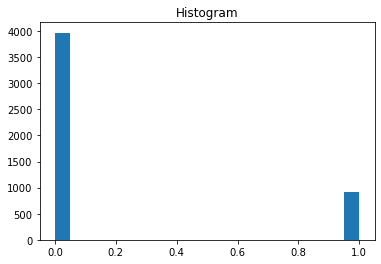

'ProdTaken'

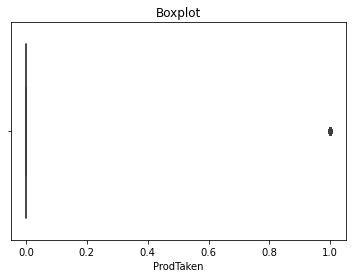

'Age'

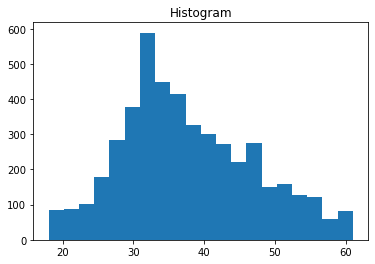

'Age'

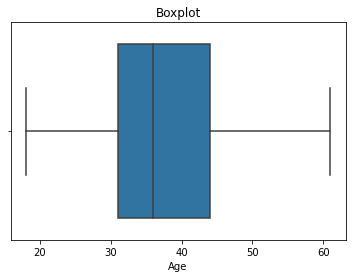

'CityTier'

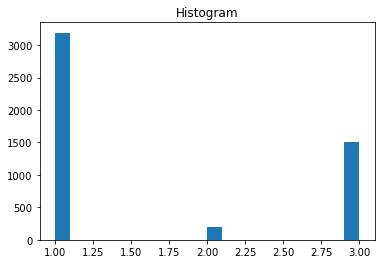

'CityTier'

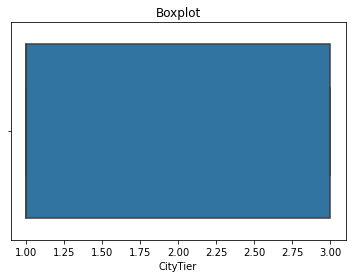

'DurationOfPitch'

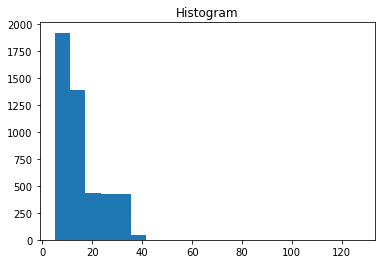

'DurationOfPitch'

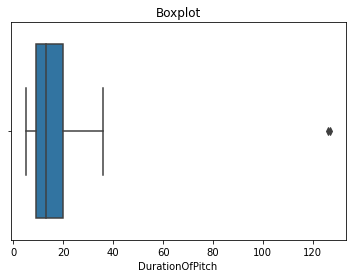

'NumberOfPersonVisiting'

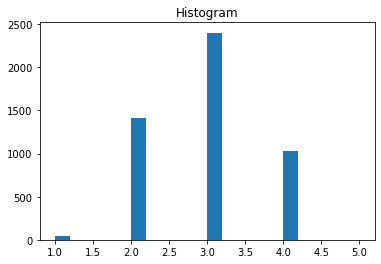

'NumberOfPersonVisiting'

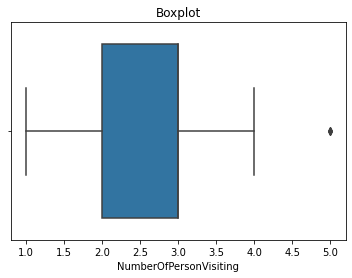

'NumberOfFollowups'

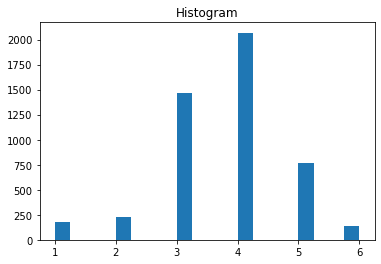

'NumberOfFollowups'

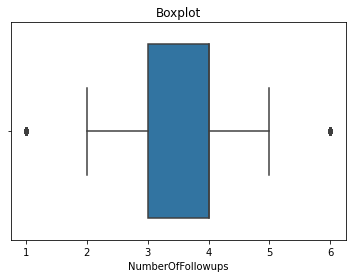

'PreferredPropertyStar'

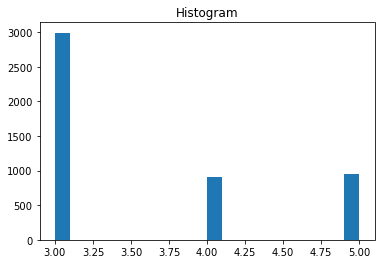

'PreferredPropertyStar'

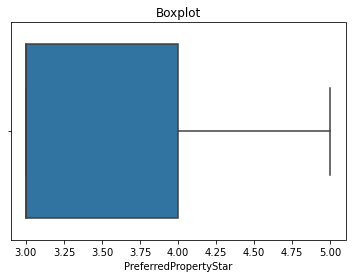

'NumberOfTrips'

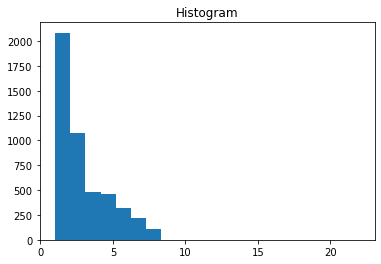

'NumberOfTrips'

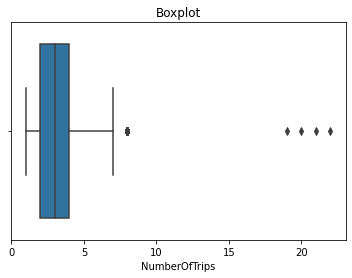

'Passport'

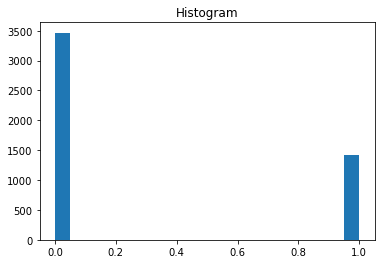

'Passport'

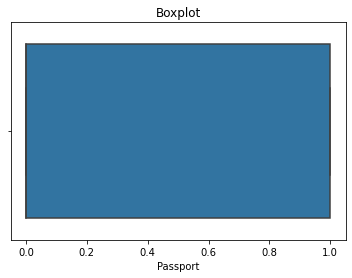

'PitchSatisfactionScore'

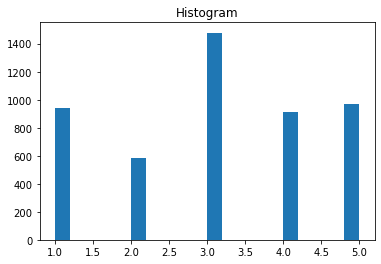

'PitchSatisfactionScore'

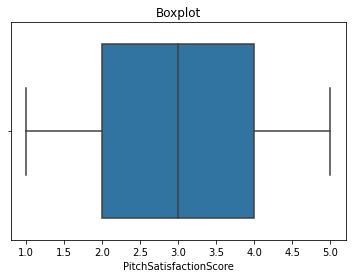

'OwnCar'

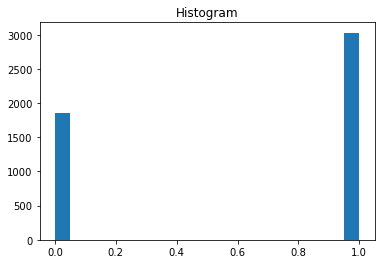

'OwnCar'

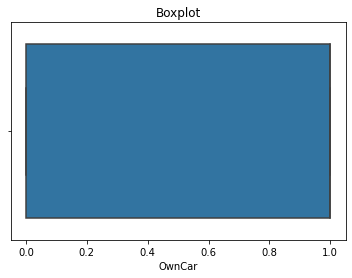

'NumberOfChildrenVisiting'

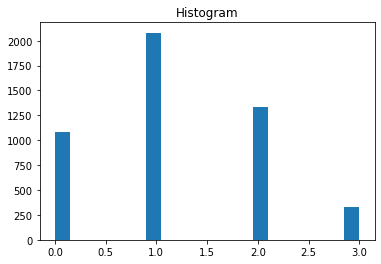

'NumberOfChildrenVisiting'

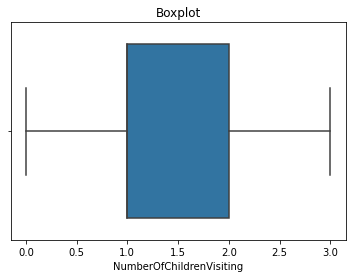

'MonthlyIncome'

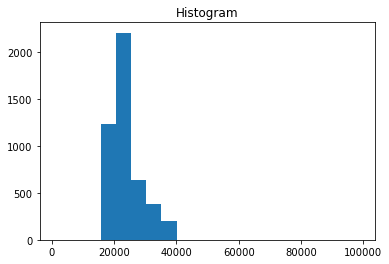

'MonthlyIncome'

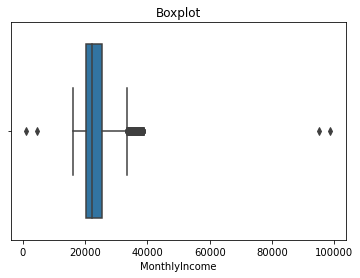

In [24]:
# for every column in dataframe make a histogram and boxplot
for (column_name, column_data) in numerical_features.iteritems():
    plt.hist(column_data, 20)
    plt.title("Histogram")
    display(column_name)
    plt.show()

    sns.boxplot(column_data)
    plt.title("Boxplot")
    display(column_name)
    plt.show()

1. `CCAvg ` has a few outside the 4*IQR.
2. `Mortgage` has a large amount of outliers on the high range.
3. `Personal_Loan ` has a the expected 480 non-loan purchasers.

#### Outlier Treatment

`MontlyIncome` is the only feature showing strong outliers. 

`NumberOfTrips` has a few. 

`Duration of Pitch` has a couple outliers that can be safely dropped.

In [25]:
df[(df.MonthlyIncome>40000) | (df.MonthlyIncome<12000)]

,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
38,0,36.00,Self Enquiry,1,11.00,Salaried,Female,2,4.00,Basic,NaN,Divorced,1.00,1,2,1,0.00,Executive,95000.00
142,0,38.00,Self Enquiry,1,9.00,Large Business,Female,2,3.00,Deluxe,3.00,Single,4.00,1,5,0,0.00,Manager,1000.00
2482,0,37.00,Self Enquiry,1,12.00,Salaried,Female,3,5.00,Basic,5.00,Divorced,2.00,1,2,1,1.00,Executive,98678.00
2586,0,39.00,Self Enquiry,1,10.00,Large Business,Female,3,4.00,Deluxe,3.00,Single,5.00,1,5,0,1.00,Manager,4678.00


In [26]:
df[df.NumberOfTrips>10]

,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
385,1,30.00,Company Invited,1,10.00,Large Business,Male,2,3.00,Basic,3.00,Single,19.00,1,4,1,1.00,Executive,17285.00
816,0,39.00,Company Invited,1,15.00,Salaried,Male,3,3.00,Deluxe,4.00,Unmarried,21.00,0,2,1,0.00,Manager,21782.00
2829,1,31.00,Company Invited,1,11.00,Large Business,Male,3,4.00,Basic,3.00,Single,20.00,1,4,1,2.00,Executive,20963.00
3260,0,40.00,Company Invited,1,16.00,Salaried,Male,4,4.00,Deluxe,4.00,Unmarried,22.00,0,2,1,1.00,Manager,25460.00


In [27]:
df[df['DurationOfPitch']>40]

,ProdTaken,Age,TypeofContact,CityTier,DurationOfPitch,Occupation,Gender,NumberOfPersonVisiting,NumberOfFollowups,ProductPitched,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
1434,0,NaN,Company Invited,3,126.00,Salaried,Male,2,3.00,Basic,3.00,Married,3.00,0,1,1,1.00,Executive,18482.00
3878,0,53.00,Company Invited,3,127.00,Salaried,Male,3,4.00,Basic,3.00,Married,4.00,0,1,1,2.00,Executive,22160.00


In [28]:
#Dropping observaions with duration of pitch greater than 40. There are just 2 such observations
df.drop(index=df[df.DurationOfPitch>37].index,inplace=True)

#Dropping observation with monthly income less than 12000 or greater than 40000. There are just 4 such observations
df.drop(index=df[(df.MonthlyIncome>40000) | (df.MonthlyIncome<12000)].index,inplace=True)

#Dropping observations with number of trips greater than 8. There are just 4 such observations
df.drop(index=df[df.NumberOfTrips>10].index,inplace=True)

In [29]:
# print rows remaining
len(df)

4878

## Feature Engineering

In [30]:
# dataframe skew
df.skew()

ProdTaken                   1.60
Age                         0.38
CityTier                    0.74
DurationOfPitch             0.91
NumberOfPersonVisiting      0.03
NumberOfFollowups          -0.37
PreferredPropertyStar       0.89
NumberOfTrips               0.88
Passport                    0.92
PitchSatisfactionScore     -0.13
OwnCar                     -0.49
NumberOfChildrenVisiting    0.27
MonthlyIncome               1.03
dtype: float64

In [31]:
# standard deviation of each column
df.std()

ProdTaken                     0.39
Age                           9.32
CityTier                      0.92
DurationOfPitch               8.21
NumberOfPersonVisiting        0.72
NumberOfFollowups             1.00
PreferredPropertyStar         0.80
NumberOfTrips                 1.78
Passport                      0.45
PitchSatisfactionScore        1.37
OwnCar                        0.49
NumberOfChildrenVisiting      0.86
MonthlyIncome              5147.66
dtype: float64

There is no apparent change after transformations so they will be skipped and there is no assumption about normality on independent variable (https://www.statisticssolutions.com/free-resources/directory-of-statistical-analyses/assumptions-of-logistic-regression/).

In [32]:
# get info
df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 4878 entries, 0 to 4887
Data columns (total 19 columns):
 #   Column                    Non-Null Count  Dtype   
---  ------                    --------------  -----   
 0   ProdTaken                 4878 non-null   int64   
 1   Age                       4653 non-null   float64 
 2   TypeofContact             4878 non-null   category
 3   CityTier                  4878 non-null   int64   
 4   DurationOfPitch           4627 non-null   float64 
 5   Occupation                4878 non-null   category
 6   Gender                    4878 non-null   category
 7   NumberOfPersonVisiting    4878 non-null   int64   
 8   NumberOfFollowups         4833 non-null   float64 
 9   ProductPitched            4878 non-null   category
 10  PreferredPropertyStar     4853 non-null   float64 
 11  MaritalStatus             4878 non-null   category
 12  NumberOfTrips             4738 non-null   float64 
 13  Passport                  4878 non-null   int64 

## Insights

- Most of the data-types are either **int64** or **float64**.
- `MonthlyIncome` and `ProdTaken` are the only columns that have a strong skew.
- We have categoricals to one-hot encode

# Exploratory Data Analysis

### Set-up for visualization

In [33]:
categoricals = df.select_dtypes(include=["object", "category", "string"])
global categoricals
[categoricals]

[        TypeofContact      Occupation  Gender ProductPitched MaritalStatus  \
 0        Self Enquiry        Salaried  Female         Deluxe        Single   
 1     Company Invited        Salaried    Male         Deluxe      Divorced   
 2        Self Enquiry     Free Lancer    Male          Basic        Single   
 3     Company Invited        Salaried  Female          Basic      Divorced   
 4        Self Enquiry  Small Business    Male          Basic      Divorced   
 ...               ...             ...     ...            ...           ...   
 4883     Self Enquiry  Small Business    Male         Deluxe     Unmarried   
 4884  Company Invited        Salaried    Male          Basic        Single   
 4885     Self Enquiry        Salaried  Female       Standard       Married   
 4886     Self Enquiry  Small Business    Male          Basic        Single   
 4887     Self Enquiry        Salaried    Male          Basic     Unmarried   
 
          Designation  
 0            Manager  
 1

In [34]:
# Subset the dataframe based on numeric and categorical types
numerical_features = df.select_dtypes(include=["int64", "float64"])
global numerical_features
# [numerical_features]

In [35]:
def perc_on_bar(feature):
    '''
    plot
    feature: categorical feature
    the function won't work if a column is passed in hue parameter
    '''
    #Creating a countplot for the feature
    sns.set(rc={'figure.figsize':(10,5)})
    ax=sns.countplot(x=feature, data=df)
    
    total = len(feature) # length of the column
    for p in ax.patches:
        percentage = '{:.1f}%'.format(100 * p.get_height()/total) # percentage of each class of the category
        x = p.get_x() + p.get_width() / 2 - 0.1 # width of the plot
        y = p.get_y() + p.get_height()           # hieght of the plot
        ax.annotate(percentage, (x, y), size = 14) # annotate the percantage 
        
    plt.show() # show the plot

## EDA Report

### Univariate

In [36]:
# summary stats
df.describe().T

,count,mean,std,min,25%,50%,75%,max
ProdTaken,4878.00,0.19,0.39,0.00,0.00,0.00,0.00,1.00
Age,4653.00,37.62,9.32,18.00,31.00,36.00,44.00,61.00
CityTier,4878.00,1.65,0.92,1.00,1.00,1.00,3.00,3.00
DurationOfPitch,4627.00,15.45,8.21,5.00,9.00,13.00,20.00,36.00
NumberOfPersonVisiting,4878.00,2.91,0.72,1.00,2.00,3.00,3.00,5.00
NumberOfFollowups,4833.00,3.71,1.00,1.00,3.00,4.00,4.00,6.00
PreferredPropertyStar,4853.00,3.58,0.80,3.00,3.00,3.00,4.00,5.00
NumberOfTrips,4738.00,3.22,1.78,1.00,2.00,3.00,4.00,8.00
Passport,4878.00,0.29,0.45,0.00,0.00,0.00,1.00,1.00
PitchSatisfactionScore,4878.00,3.08,1.37,1.00,2.00,3.00,4.00,5.00


- `ProdTaken` is mostly 0's
- Mean `Age` is close to 40.
- `NumberOfTrips` people take is wide: from 1 to 22.

In [37]:
# categorical stats
df.describe(include=['category']).T

,count,unique,top,freq
TypeofContact,4878,3,Self Enquiry,3440
Occupation,4878,4,Salaried,2362
Gender,4878,2,Male,2910
ProductPitched,4878,5,Basic,1836
MaritalStatus,4878,4,Married,2338
Designation,4878,5,Executive,1836


- The most widely used contact is self-enquireies.
- There are more males represented than females.
- The majority of customers are married.

In [38]:
# Function to perform statistical analysis on every numeric and categorical variable in the dataframe
pd.set_option("display.max_colwidth", 5000)

# define function for statistical analysis
def univar_num(dataframe):  # argument is the whole dataframe

    # Print statistics for numeric variables
    # Mode (or most popular)
    print("\n Mode Analysis \n", df.mode("index")[0:2])
    print("\n Sum Analysis \n", numerical_features.sum())  # Sum analysis
    # Variance analysis
    print("\n Variance analysis \n", numerical_features.var())
    print(
        "\n Absolute Deviation or Mean Absolute Deviation \n", numerical_features.mad()
    )  # Absolute Deviation or Mean Absolute Deviation
    print("\n  Skew analysis \n ", numerical_features.skew())  # Skew analysis

    return

In [39]:
# Run dataframe through function
univar_num(numerical_features)


 Mode Analysis 
    ProdTaken   Age TypeofContact  CityTier  DurationOfPitch Occupation Gender  \
0       0.00 35.00  Self Enquiry      1.00             9.00   Salaried   Male   
1        NaN   NaN           NaN       NaN              NaN        NaN    NaN   

   NumberOfPersonVisiting  NumberOfFollowups ProductPitched  \
0                    3.00               4.00          Basic   
1                     NaN                NaN            NaN   

   PreferredPropertyStar MaritalStatus  NumberOfTrips  Passport  \
0                   3.00       Married           2.00      0.00   
1                    NaN           NaN            NaN       NaN   

   PitchSatisfactionScore  OwnCar  NumberOfChildrenVisiting Designation  \
0                    3.00    1.00                      1.00   Executive   
1                     NaN     NaN                       NaN         NaN   

   MonthlyIncome  
0       17342.00  
1       20855.00  

 Sum Analysis 
 ProdTaken                        918.00
Age   

- The count of customers who took a package is 920/4488.
- The most popular number of followsups to customers is 4.
- `CityTier` has a variance close to 1.

In [40]:
# Frequency tables for every feature
for (
    column_name,
    column_data,
) in (
    df.iteritems()
):  # for every column in the dataframe return the column name and Series of data
    display((column_name, column_data.value_counts()))

('ProdTaken',
 0    3960
 1     918
 Name: ProdTaken, dtype: int64)

('Age',
 35.00    237
 36.00    230
 34.00    211
 31.00    202
 30.00    198
 32.00    197
 33.00    189
 37.00    184
 29.00    178
 38.00    175
 41.00    155
 39.00    148
 28.00    147
 40.00    145
 42.00    142
 27.00    138
 43.00    130
 46.00    121
 45.00    116
 26.00    106
 44.00    105
 51.00     90
 47.00     88
 50.00     86
 25.00     74
 52.00     68
 53.00     65
 48.00     65
 49.00     65
 55.00     64
 54.00     61
 56.00     58
 24.00     56
 22.00     46
 23.00     46
 59.00     44
 21.00     41
 20.00     38
 19.00     32
 58.00     31
 60.00     29
 57.00     29
 18.00     14
 61.00      9
 Name: Age, dtype: int64)

('TypeofContact',
 Self Enquiry       3440
 Company Invited    1413
 missing value        25
 Name: TypeofContact, dtype: int64)

('CityTier',
 1    3182
 3    1498
 2     198
 Name: CityTier, dtype: int64)

('DurationOfPitch',
 9.00     482
 7.00     342
 8.00     333
 6.00     307
 16.00    273
 15.00    268
 14.00    253
 10.00    242
 13.00    223
 11.00    203
 12.00    194
 17.00    172
 30.00     95
 22.00     89
 31.00     83
 23.00     79
 18.00     75
 32.00     74
 29.00     74
 21.00     73
 25.00     73
 26.00     72
 27.00     72
 24.00     70
 35.00     66
 20.00     65
 28.00     61
 19.00     57
 33.00     57
 34.00     50
 36.00     44
 5.00       6
 Name: DurationOfPitch, dtype: int64)

('Occupation',
 Salaried          2362
 Small Business    2084
 Large Business     430
 Free Lancer          2
 Name: Occupation, dtype: int64)

('Gender',
 Male      2910
 Female    1968
 Name: Gender, dtype: int64)

('NumberOfPersonVisiting',
 3    2397
 2    1414
 4    1025
 1      39
 5       3
 Name: NumberOfPersonVisiting, dtype: int64)

('NumberOfFollowups',
 4.00    2063
 3.00    1462
 5.00     767
 2.00     229
 1.00     176
 6.00     136
 Name: NumberOfFollowups, dtype: int64)

('ProductPitched',
 Basic           1836
 Deluxe          1728
 Standard         742
 Super Deluxe     342
 King             230
 Name: ProductPitched, dtype: int64)

('PreferredPropertyStar',
 3.00    2987
 5.00     955
 4.00     911
 Name: PreferredPropertyStar, dtype: int64)

('MaritalStatus',
 Married      2338
 Divorced      948
 Single        912
 Unmarried     680
 Name: MaritalStatus, dtype: int64)

('NumberOfTrips',
 2.00    1463
 3.00    1078
 1.00     619
 4.00     476
 5.00     457
 6.00     322
 7.00     218
 8.00     105
 Name: NumberOfTrips, dtype: int64)

('Passport',
 0    3462
 1    1416
 Name: Passport, dtype: int64)

('PitchSatisfactionScore',
 3    1478
 5     968
 1     940
 4     910
 2     582
 Name: PitchSatisfactionScore, dtype: int64)

('OwnCar',
 1    3024
 0    1854
 Name: OwnCar, dtype: int64)

('NumberOfChildrenVisiting',
 1.00    2075
 2.00    1333
 0.00    1079
 3.00     325
 Name: NumberOfChildrenVisiting, dtype: int64)

('Designation',
 Executive         1836
 Manager           1728
 Senior Manager     742
 AVP                342
 VP                 230
 Name: Designation, dtype: int64)

('MonthlyIncome',
 20855.00    7
 21020.00    7
 21288.00    7
 17342.00    7
 24950.00    6
            ..
 23741.00    1
 27311.00    1
 21628.00    1
 25194.00    1
 18537.00    1
 Name: MonthlyIncome, Length: 2469, dtype: int64)

- The `MonthlyIncome` is oddly grouped at 22347. This could be a survey design error.
- The vast majority of customers have a designation of Executive.
- More customers tend to bring 1 or 2 children rather than 0 or 3 on trips

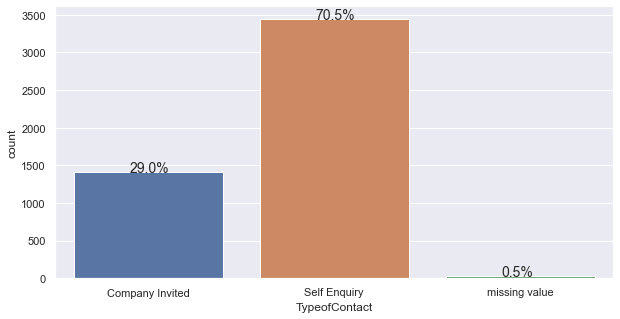

None

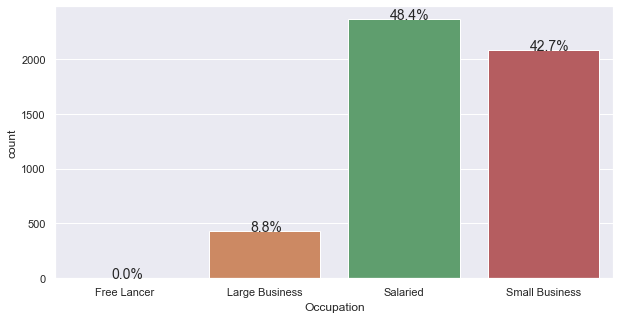

None

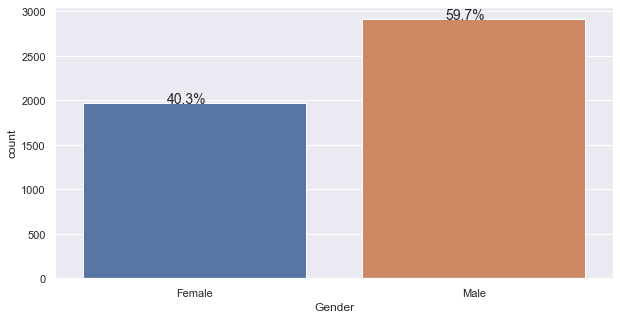

None

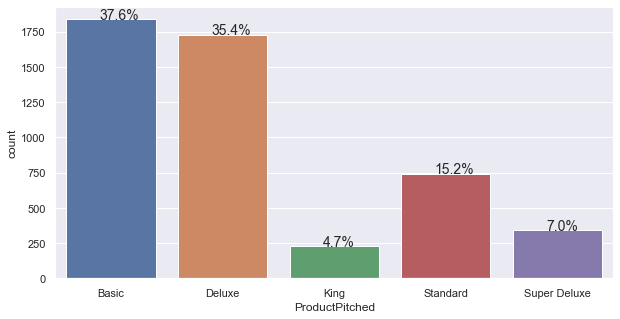

None

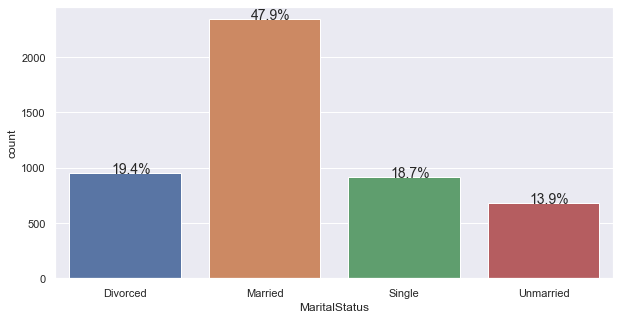

None

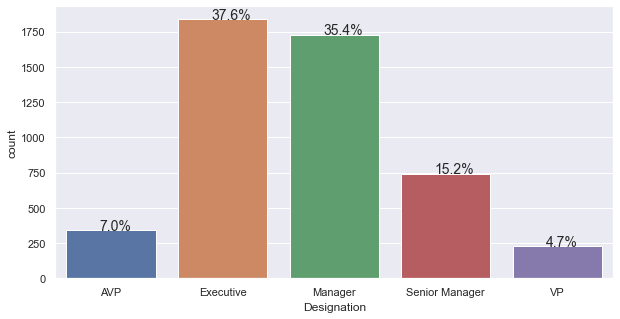

None

In [41]:
# show a barplot with percent on every categorical column
for i in categoricals:
    str(i)
    display(perc_on_bar(df[i]))

- The Basic and Deluxe packages are pitched many more times than the others.
- The Salaried customers far outweigh the freelancing customers.
- There is generally a 2:1 or 3:1 to weighting for most categorical variables.

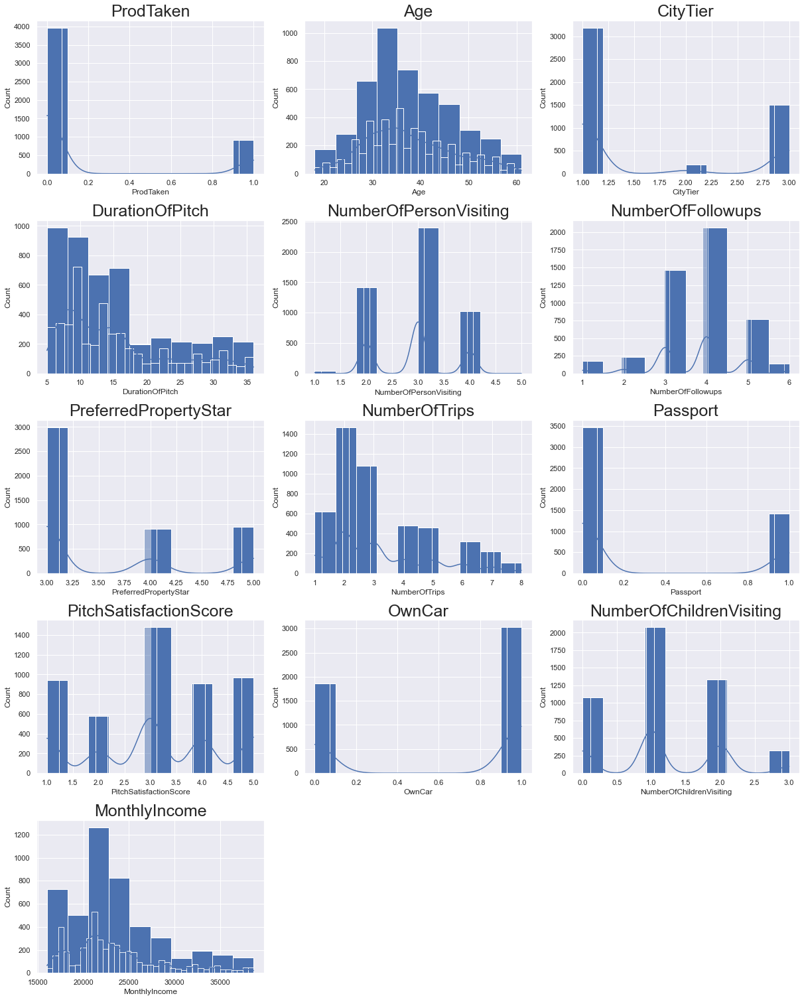

In [42]:
# From DSBA_SLF_MLS1_LifeExpectancyCaseStudy
all_col = df.select_dtypes(include=["float64", "int64"]).columns.tolist()

plt.figure(figsize=(17, 75))

for i in range(len(all_col)):
    plt.subplot(18, 3, i + 1)
    plt.hist(df[all_col[i]])
    sns.histplot(
        df[all_col[i]], kde=True
    )  # you can comment the previous line and run this one to get distribution curves
    plt.tight_layout()
    plt.title(all_col[i], fontsize=25)

plt.show()

- `CityTier` of 1 outweights the other tiers.
- The `NumberofPersonVisiting` is almost normal in distribution.
- The `PitchSatisfactionScore` tends to be above 2.5.

In [43]:
### Code from Mounika of GreatLearning as given in the Uber Case study ###

# While doing uni-variate analysis of numerical variables we want to study their central tendency
# and dispersion.
# Let us write a function that will help us create boxplot and histogram for any input numerical
# variable.
# This function takes the numerical column as the input and returns the boxplots
# and histograms for the variable.
# Let us see if this help us write faster and cleaner code.
def histogram_boxplot(feature, figsize=(15, 10), bins=None):
    """Boxplot and histogram combined
    feature: 1-d feature array
    figsize: size of fig (default (9,8))
    bins: number of bins (default None / auto)
    """
    f2, (ax_box2, ax_hist2) = plt.subplots(
        nrows=2,  # Number of rows of the subplot grid= 2
        sharex=True,  # x-axis will be shared among all subplots
        gridspec_kw={"height_ratios": (0.25, 0.75)},
        figsize=figsize,
    )  # creating the 2 subplots
    sns.boxplot(
        feature, ax=ax_box2, showmeans=True, color="red"
    )  # boxplot will be created and a star will indicate the mean value of the column
    sns.distplot(feature, kde=F, ax=ax_hist2, bins=bins) if bins else sns.distplot(
        feature, kde=False, ax=ax_hist2
    )  # For histogram
    ax_hist2.axvline(
        np.mean(feature), color="g", linestyle="--"
    )  # Add mean to the histogram
    ax_hist2.axvline(
        np.median(feature), color="black", linestyle="-"
    )  # Add median to the histogram

ProdTaken                   None
Age                         None
CityTier                    None
DurationOfPitch             None
NumberOfPersonVisiting      None
NumberOfFollowups           None
PreferredPropertyStar       None
NumberOfTrips               None
Passport                    None
PitchSatisfactionScore      None
OwnCar                      None
NumberOfChildrenVisiting    None
MonthlyIncome               None
dtype: object

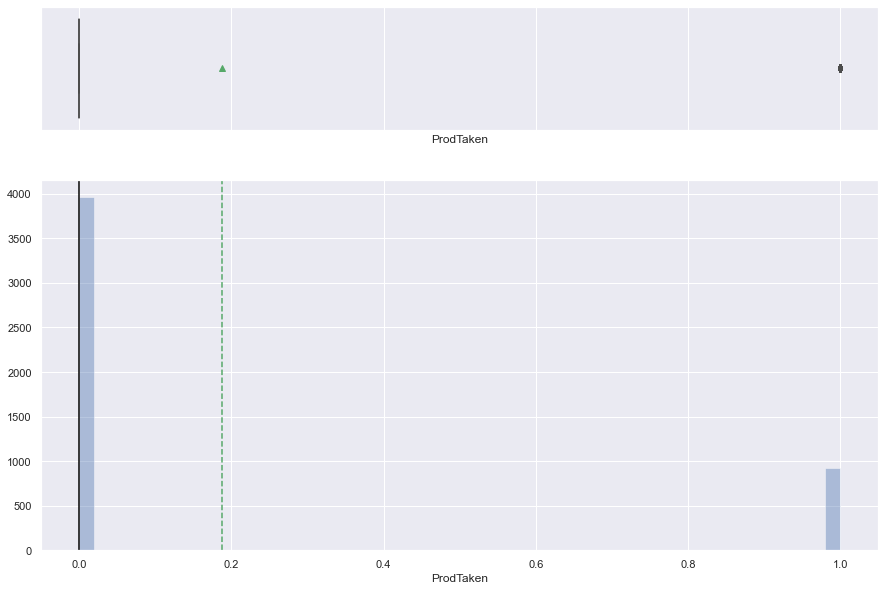

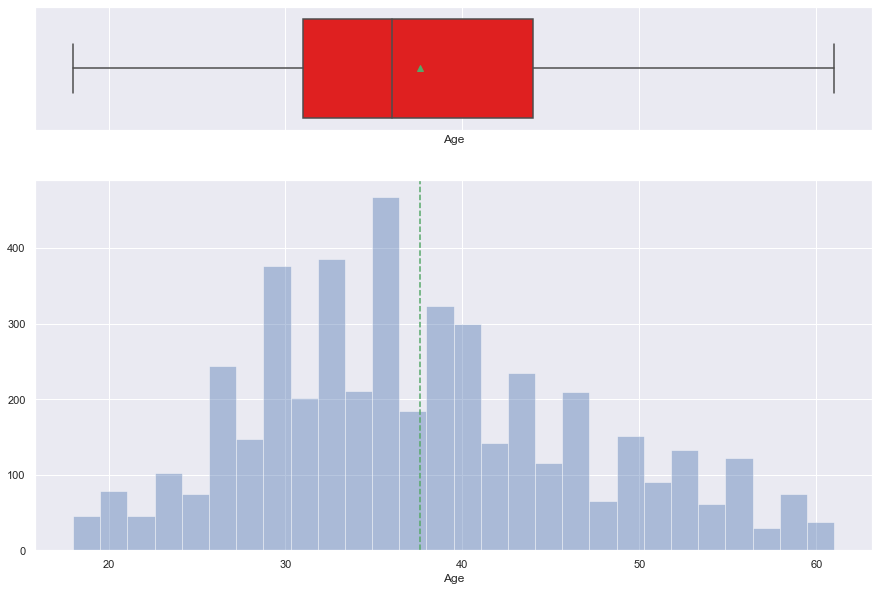

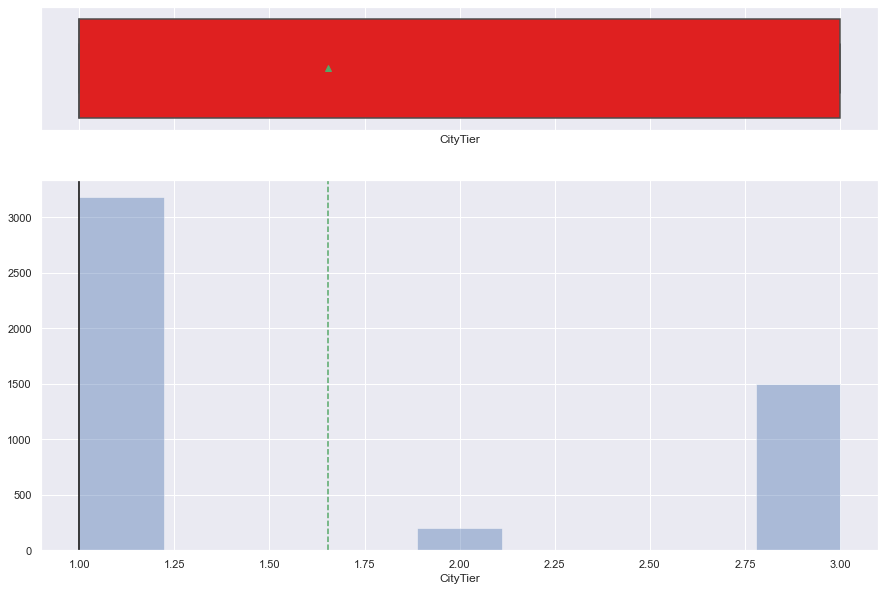

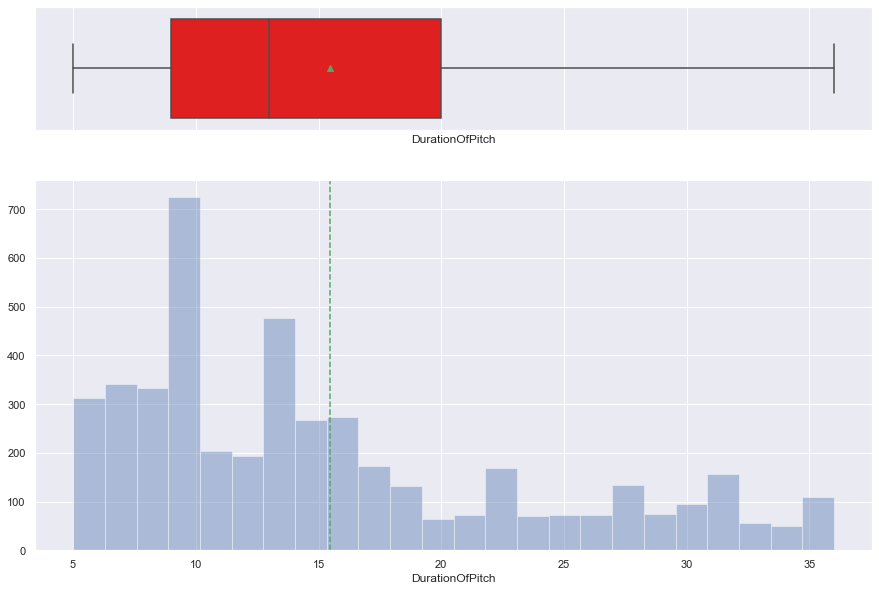

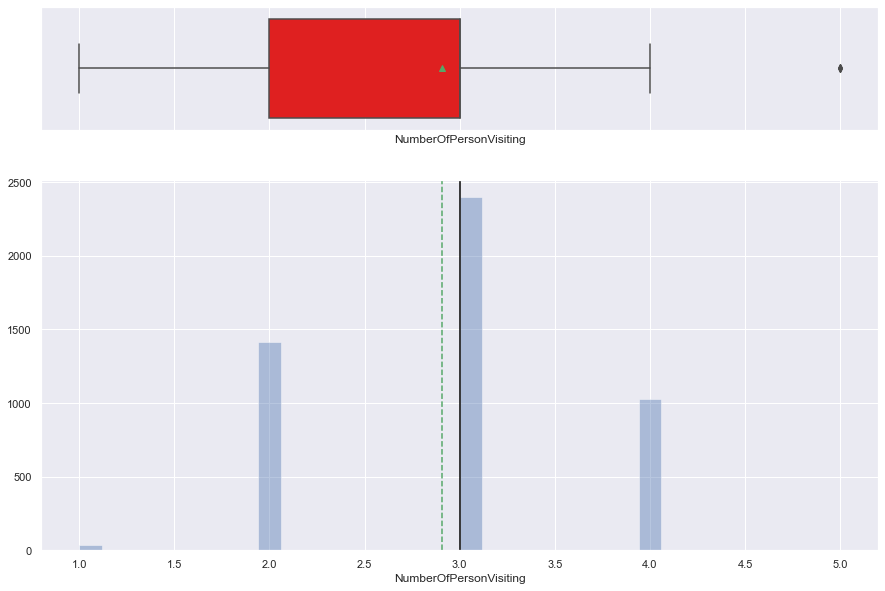

...

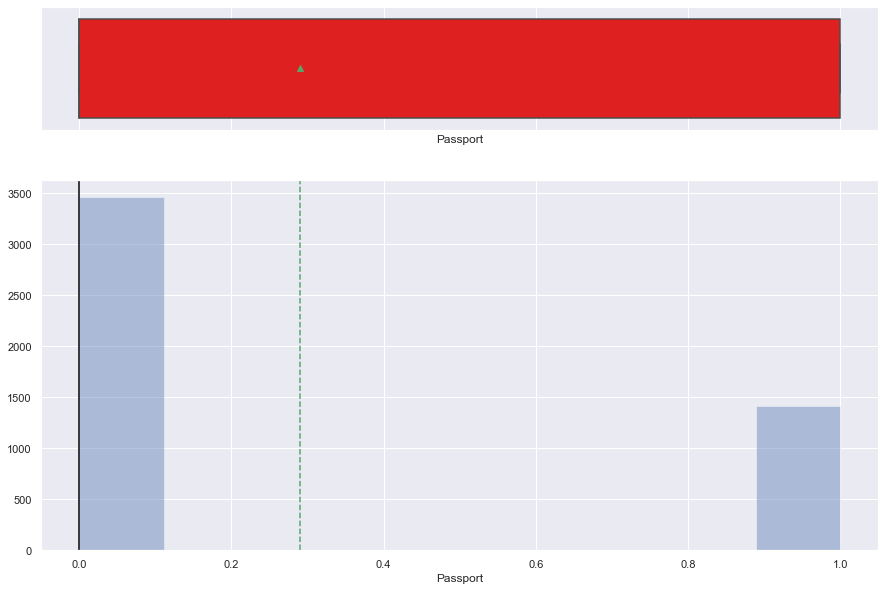

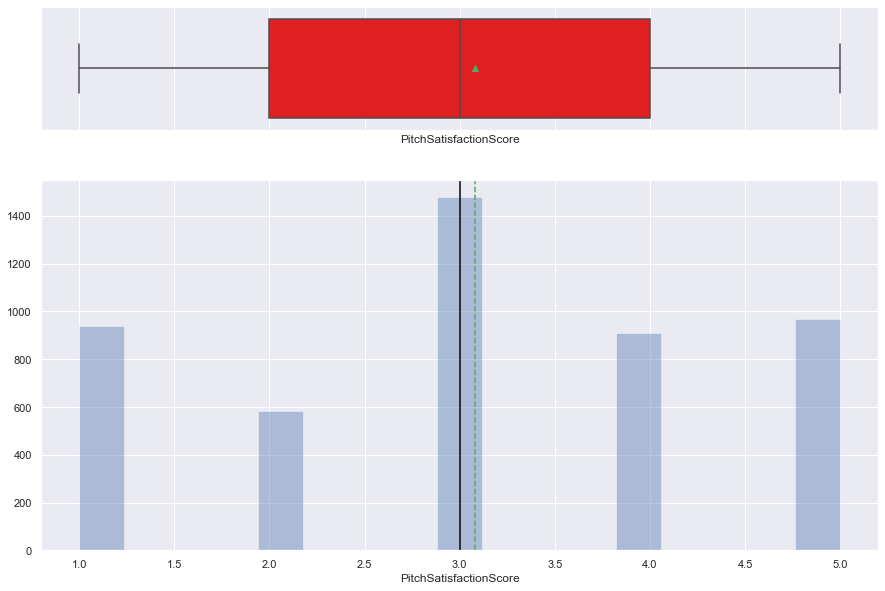

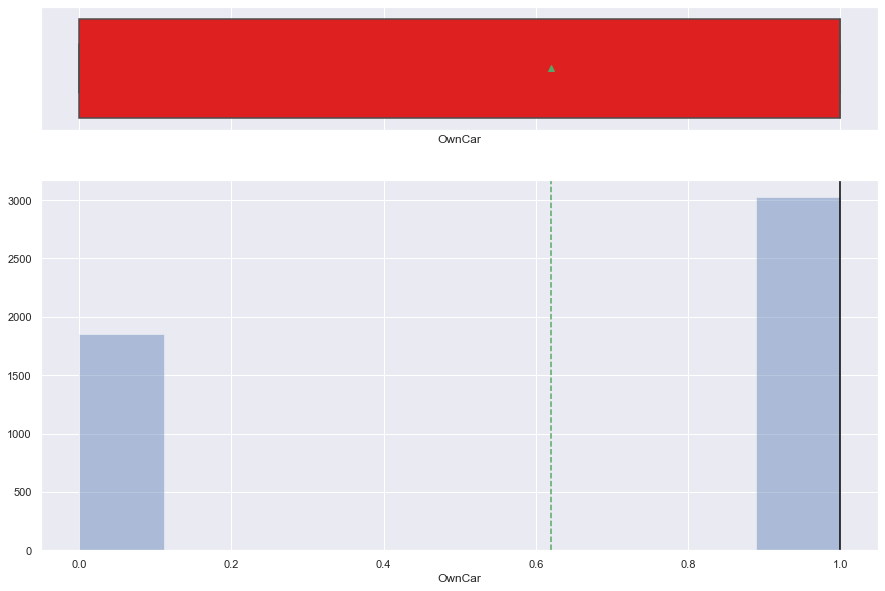

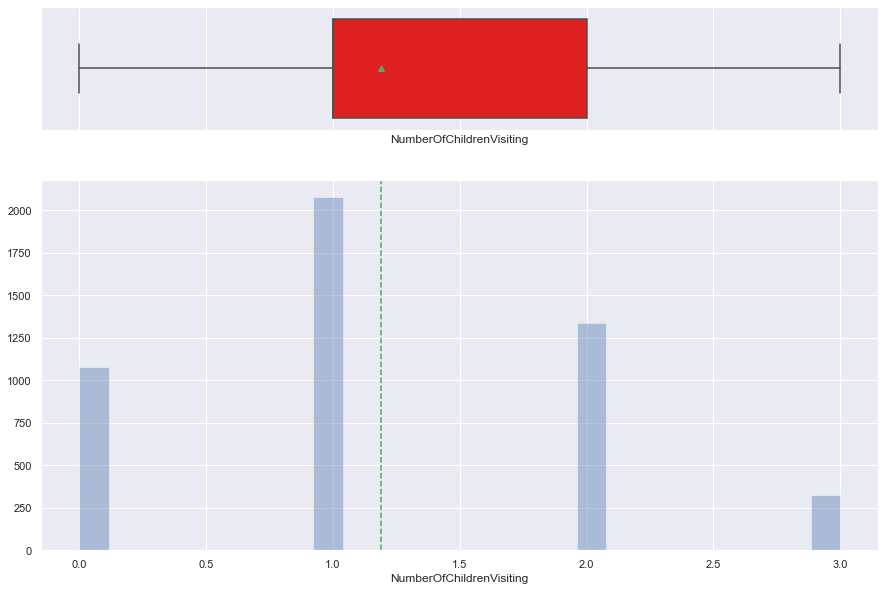

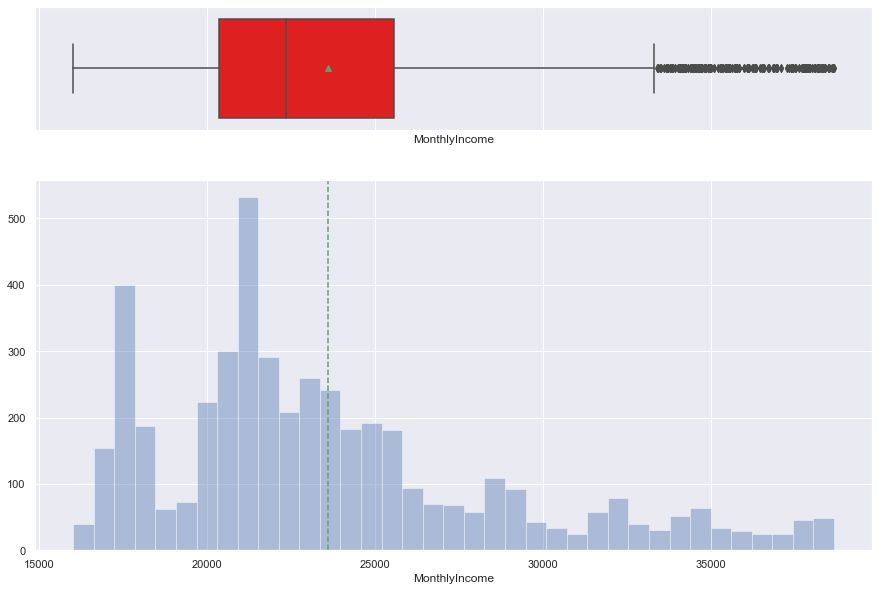

In [44]:
display(numerical_features.apply(lambda x: histogram_boxplot(x)))

- The majority of customers do own a car.
- The `PitchSatisfactionScore` is nearly normally distributed.
- The majority of customers do not own a passport.

In [45]:
# Function to create distribution and statistical plots for each numerical feature in the dataframe
def univar_vis(dataframe):

    sns.set(style="ticks")
    sns.set_style("darkgrid")

    # Univariate visualization of categoricals variables
    for (column_name_c, column_data_c) in categoricals.iteritems():

        print(column_name_c, "Count Plot")
        plt.figure(figsize=(20, 10))
        sns.countplot(x=column_data_c)  # Bar plot against a numeric variable
        plt.show()

        """
        print(column_name_c, "Distribution Plot")
        plt.figure(figsize=(20, 10))
        sns.displot(data=column_data_c)  # distribution plot
        plt.show()
        """

    # Univariate visualization of numeric variables
    for (column_name, column_data) in numerical_features.iteritems():

        print(column_name, "Histogram")
        sns.histplot(df[column_name], kde=True)  # histogram
        plt.figure(figsize=(20, 10))
        plt.show()

        """
        print(column_name, "Distribution Plot")
        plt.figure(figsize=(20, 10))
        sns.displot(data=column_data)  # distribution plot
        plt.show()
        """

        print(column_name, "Density Plot")
        sns.kdeplot(
            data=column_data, x=numerical_features[column_name]
        )  # Kernel distribution
        plt.figure(figsize=(20, 10))
        plt.show()

        print(column_name, "Box Plot")
        sns.boxplot(data=column_data, y=df[column_name])  # Box plot
        plt.figure(figsize=(20, 10))
        plt.show()

        # raise Exception("End to kill infinite loop")

    return

TypeofContact Count Plot


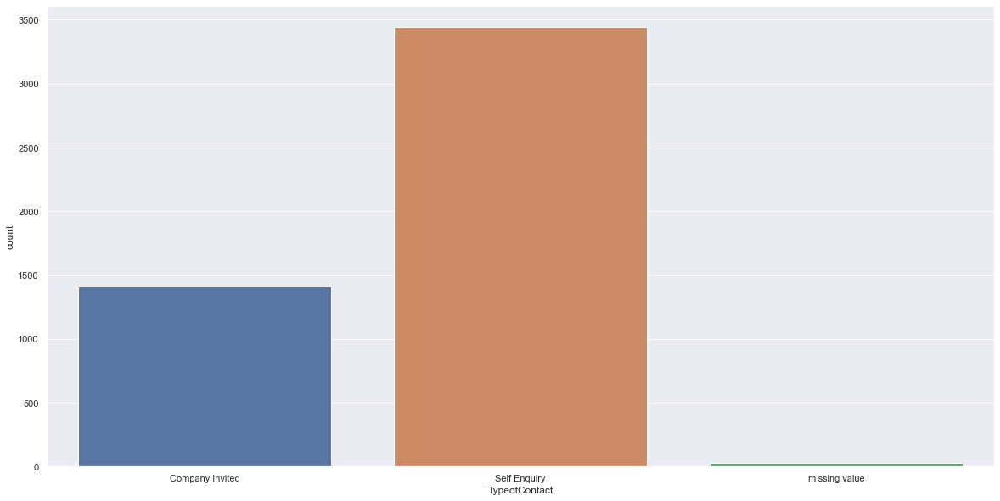

Occupation Count Plot


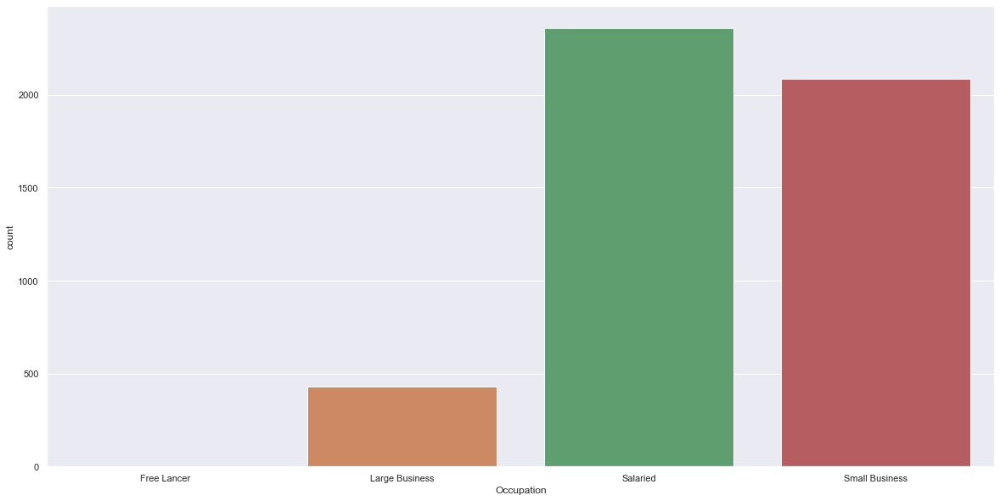

Gender Count Plot


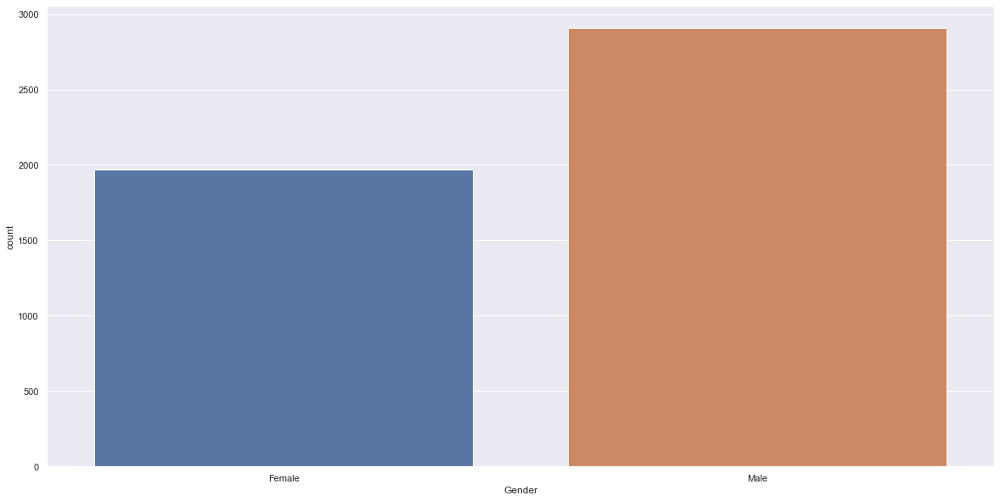

ProductPitched Count Plot


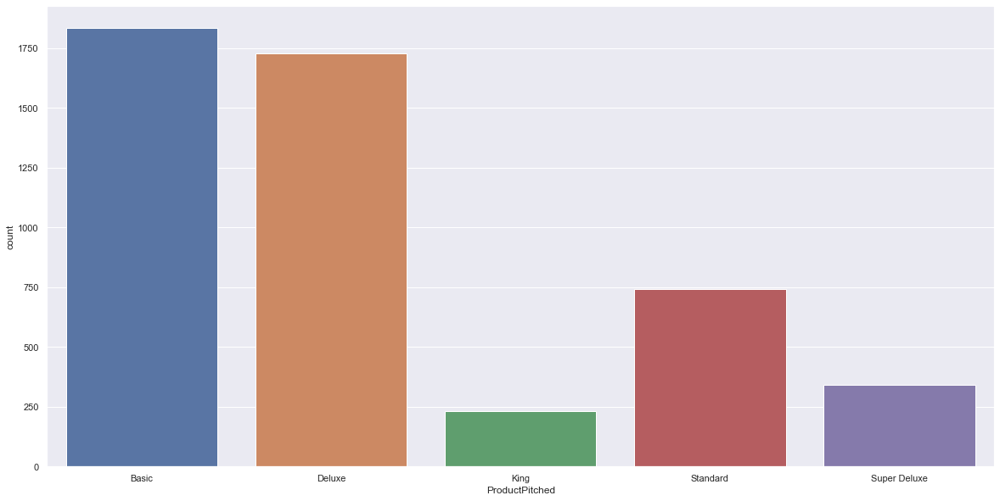

MaritalStatus Count Plot


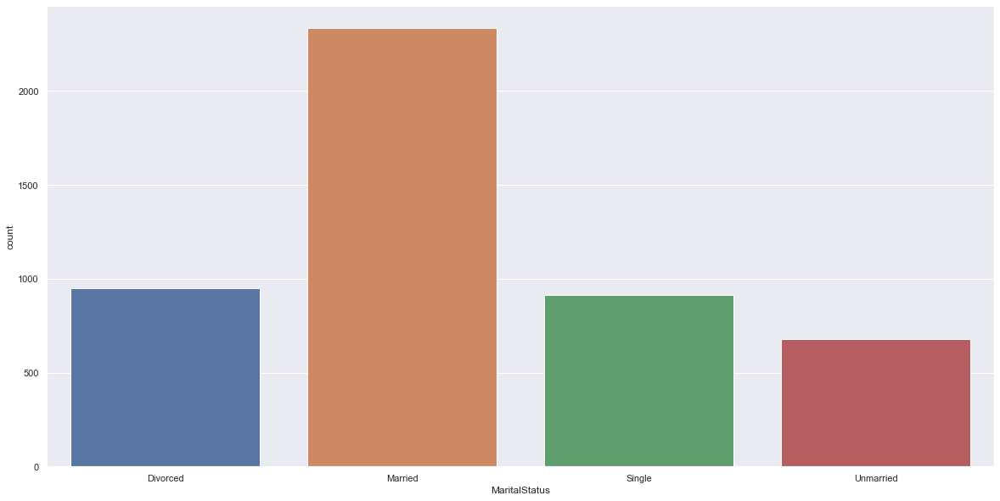

Designation Count Plot


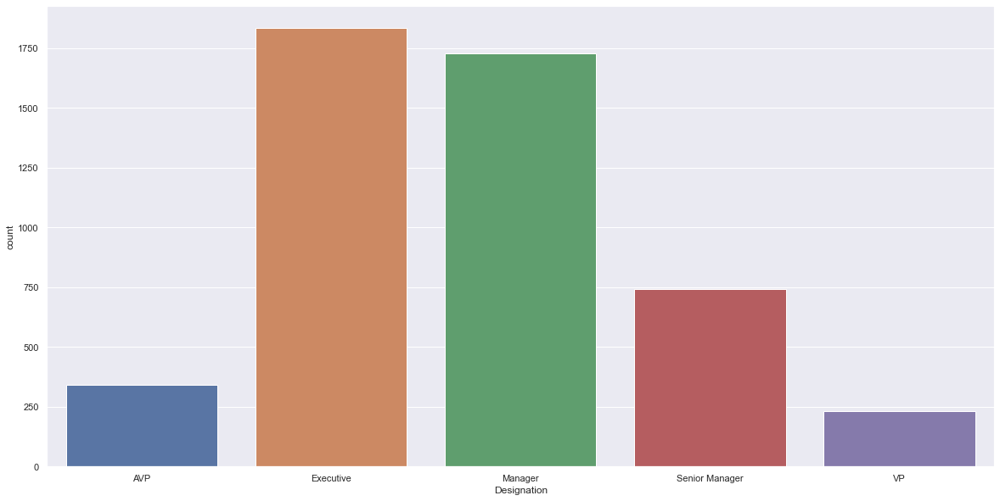

ProdTaken Histogram


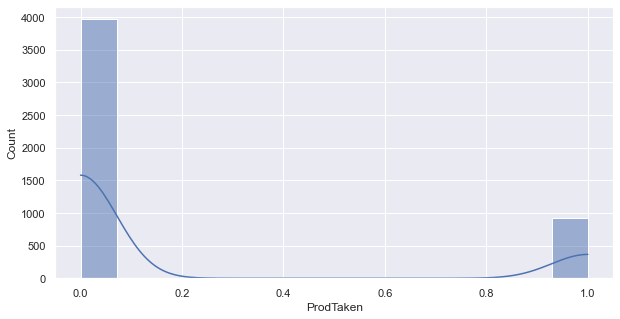

<Figure size 1440x720 with 0 Axes>

ProdTaken Density Plot


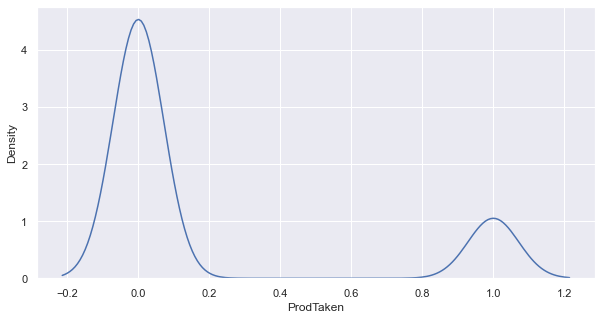

<Figure size 1440x720 with 0 Axes>

ProdTaken Box Plot


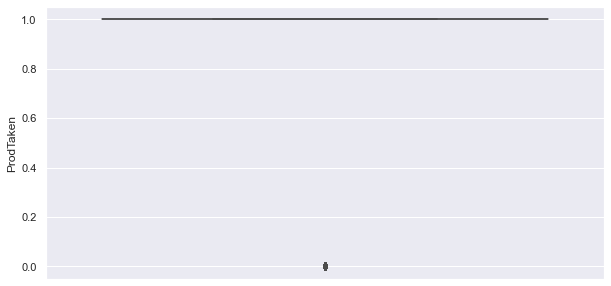

<Figure size 1440x720 with 0 Axes>

Age Histogram


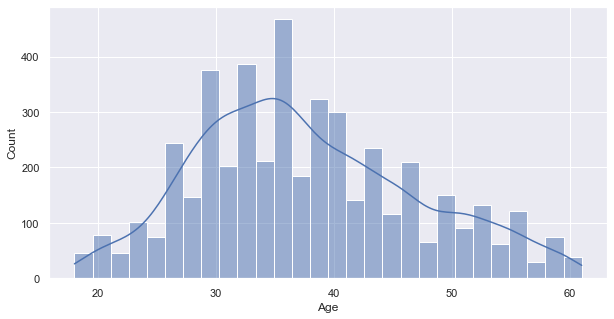

<Figure size 1440x720 with 0 Axes>

Age Density Plot


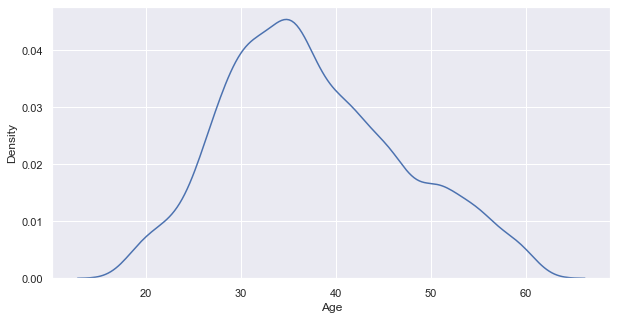

<Figure size 1440x720 with 0 Axes>

Age Box Plot


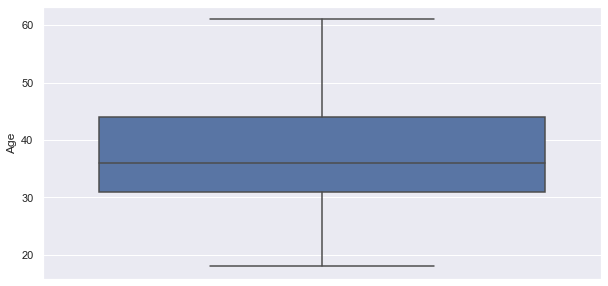

<Figure size 1440x720 with 0 Axes>

CityTier Histogram


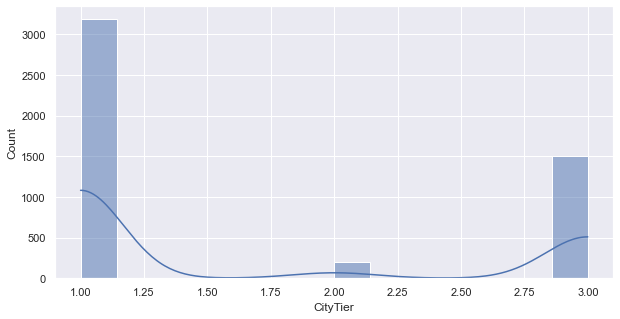

<Figure size 1440x720 with 0 Axes>

CityTier Density Plot


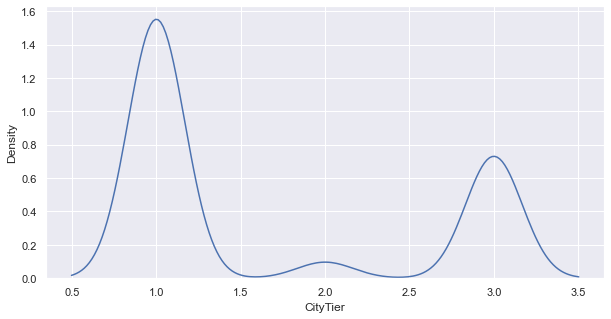

<Figure size 1440x720 with 0 Axes>

CityTier Box Plot


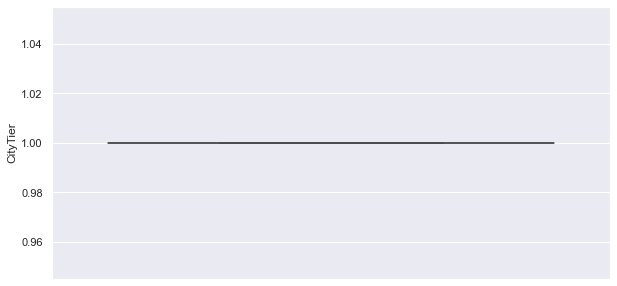

<Figure size 1440x720 with 0 Axes>

DurationOfPitch Histogram


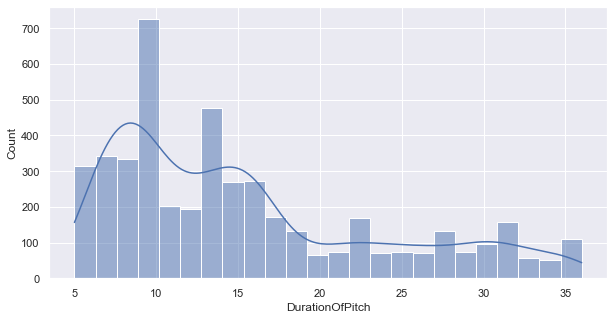

<Figure size 1440x720 with 0 Axes>

DurationOfPitch Density Plot


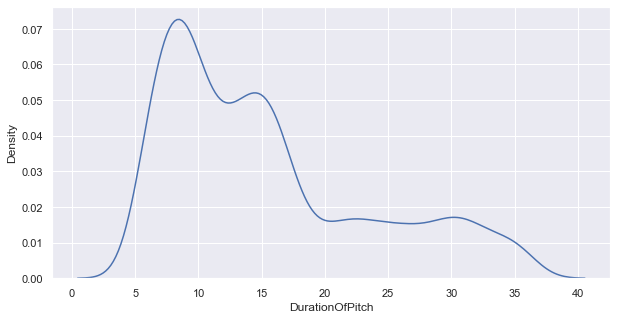

<Figure size 1440x720 with 0 Axes>

DurationOfPitch Box Plot


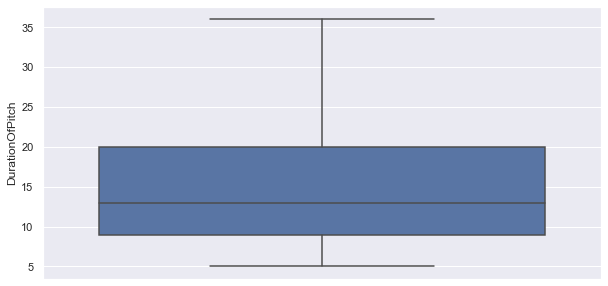

<Figure size 1440x720 with 0 Axes>

NumberOfPersonVisiting Histogram


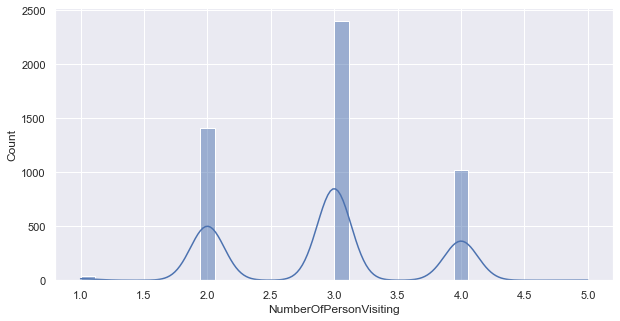

<Figure size 1440x720 with 0 Axes>

NumberOfPersonVisiting Density Plot


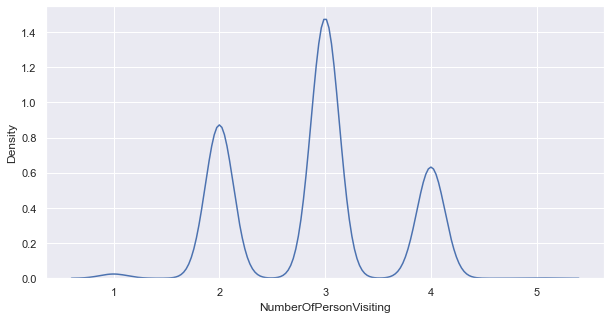

<Figure size 1440x720 with 0 Axes>

NumberOfPersonVisiting Box Plot


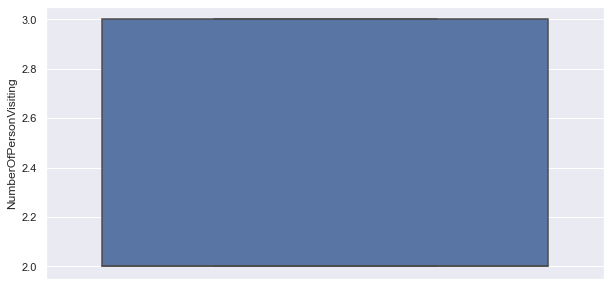

<Figure size 1440x720 with 0 Axes>

NumberOfFollowups Histogram


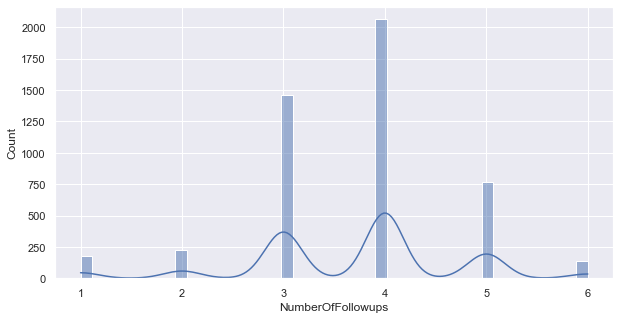

<Figure size 1440x720 with 0 Axes>

NumberOfFollowups Density Plot


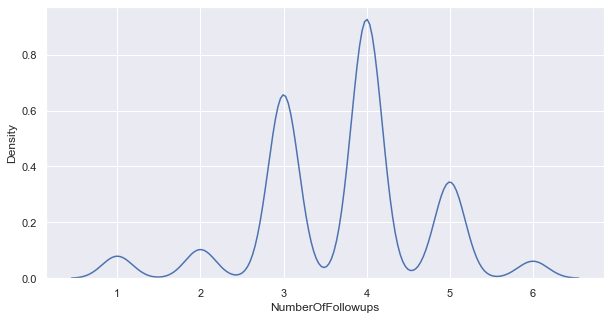

<Figure size 1440x720 with 0 Axes>

NumberOfFollowups Box Plot


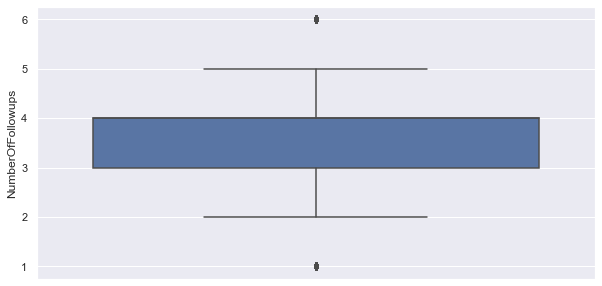

<Figure size 1440x720 with 0 Axes>

PreferredPropertyStar Histogram


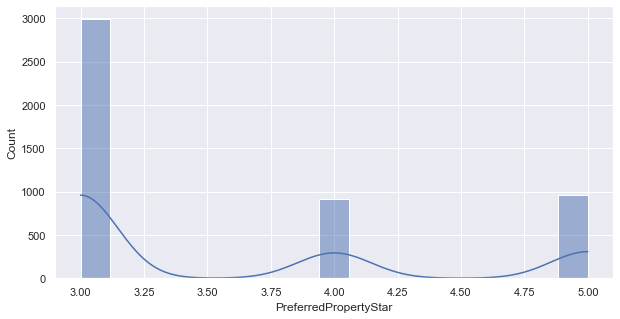

<Figure size 1440x720 with 0 Axes>

PreferredPropertyStar Density Plot


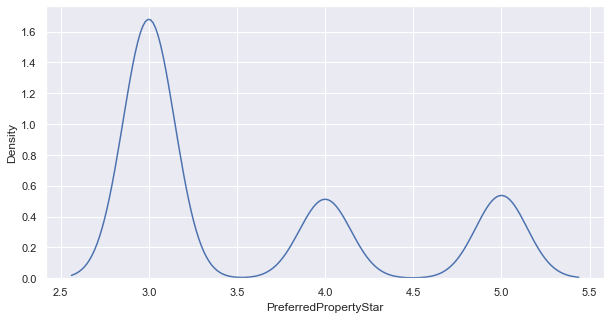

<Figure size 1440x720 with 0 Axes>

PreferredPropertyStar Box Plot


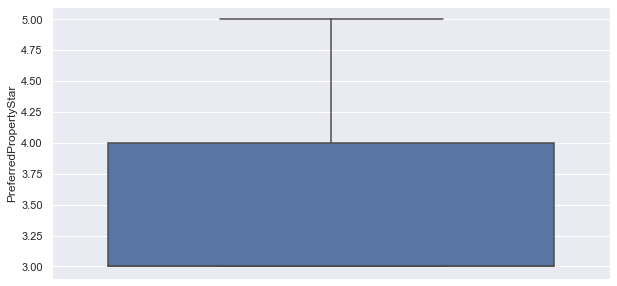

<Figure size 1440x720 with 0 Axes>

NumberOfTrips Histogram


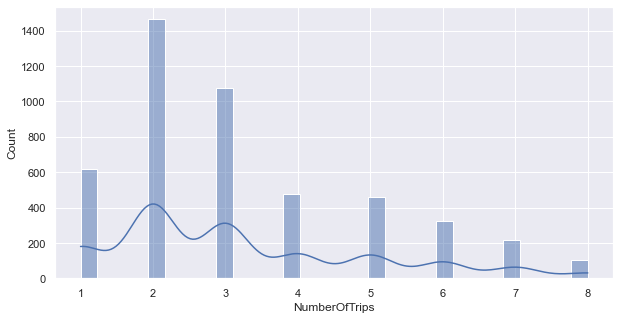

<Figure size 1440x720 with 0 Axes>

NumberOfTrips Density Plot


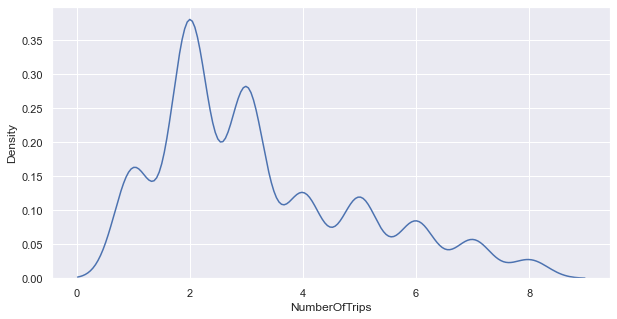

<Figure size 1440x720 with 0 Axes>

NumberOfTrips Box Plot


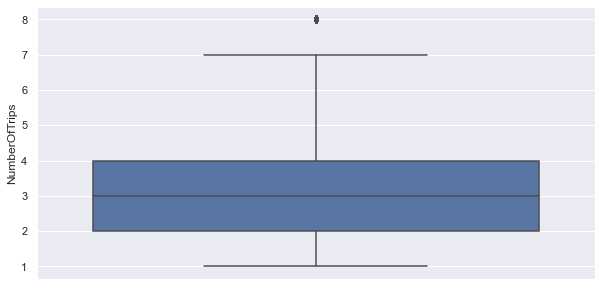

<Figure size 1440x720 with 0 Axes>

Passport Histogram


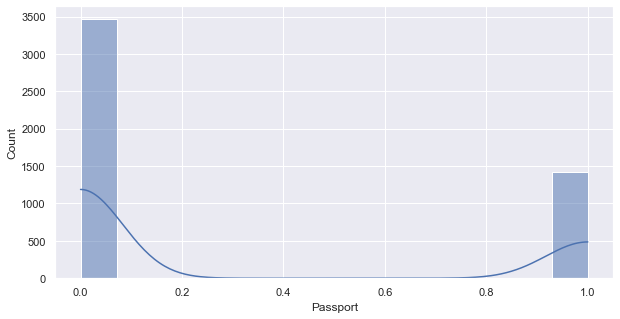

<Figure size 1440x720 with 0 Axes>

Passport Density Plot


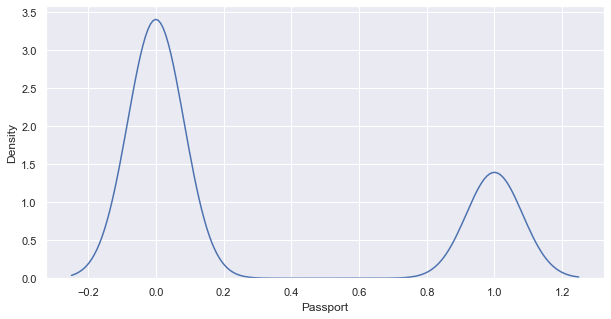

<Figure size 1440x720 with 0 Axes>

Passport Box Plot


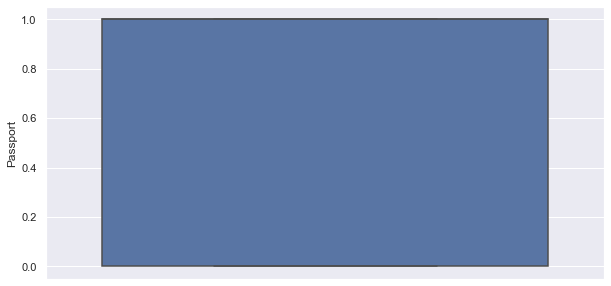

<Figure size 1440x720 with 0 Axes>

PitchSatisfactionScore Histogram


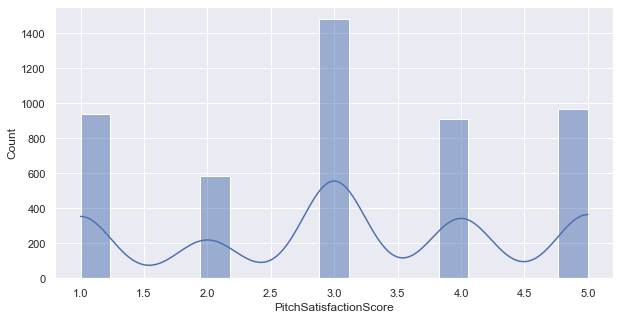

<Figure size 1440x720 with 0 Axes>

PitchSatisfactionScore Density Plot


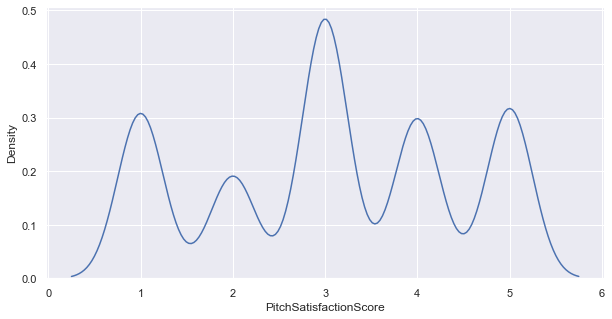

<Figure size 1440x720 with 0 Axes>

PitchSatisfactionScore Box Plot


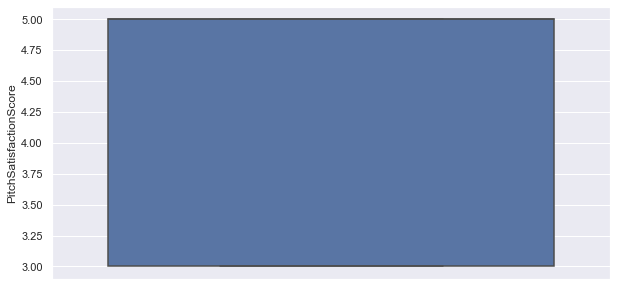

<Figure size 1440x720 with 0 Axes>

OwnCar Histogram


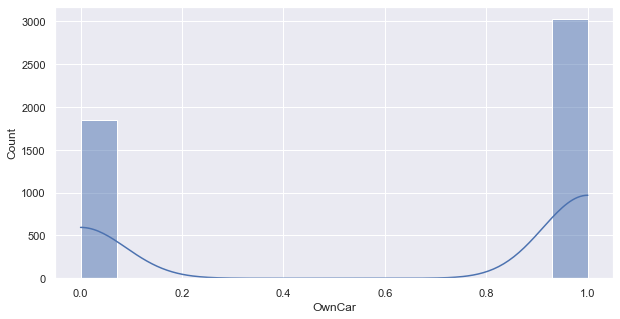

<Figure size 1440x720 with 0 Axes>

OwnCar Density Plot


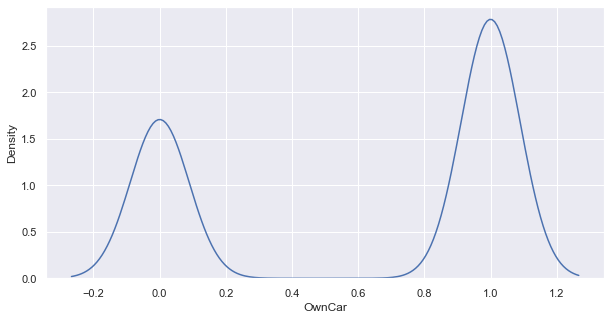

<Figure size 1440x720 with 0 Axes>

OwnCar Box Plot


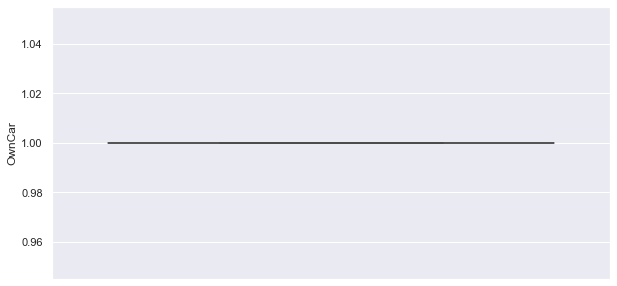

<Figure size 1440x720 with 0 Axes>

NumberOfChildrenVisiting Histogram


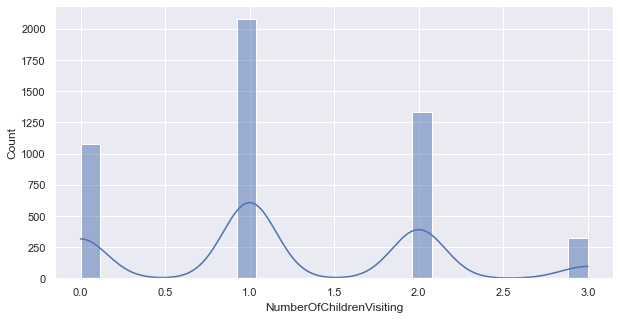

<Figure size 1440x720 with 0 Axes>

NumberOfChildrenVisiting Density Plot


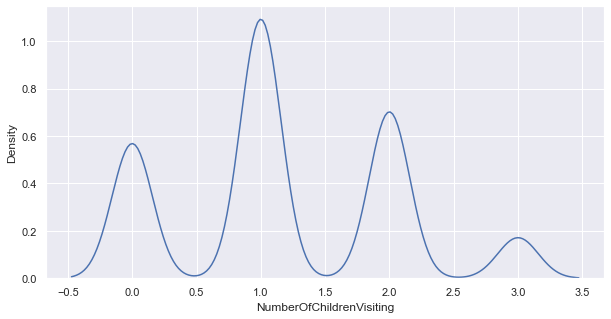

<Figure size 1440x720 with 0 Axes>

NumberOfChildrenVisiting Box Plot


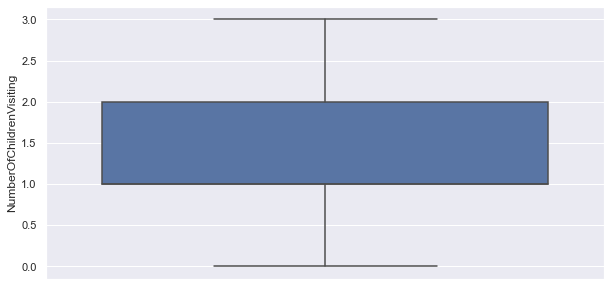

<Figure size 1440x720 with 0 Axes>

MonthlyIncome Histogram


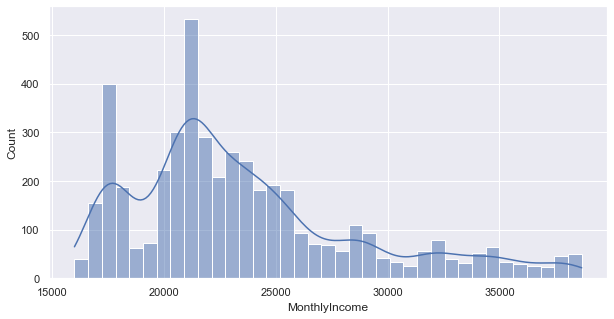

<Figure size 1440x720 with 0 Axes>

MonthlyIncome Density Plot


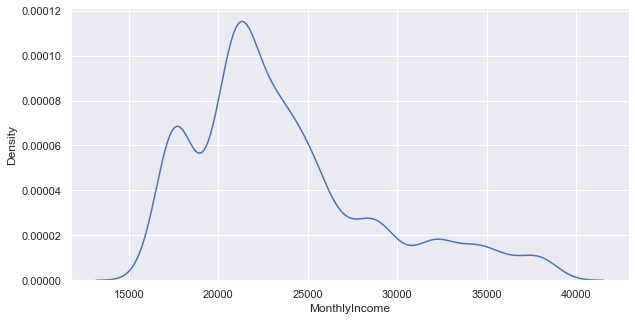

<Figure size 1440x720 with 0 Axes>

MonthlyIncome Box Plot


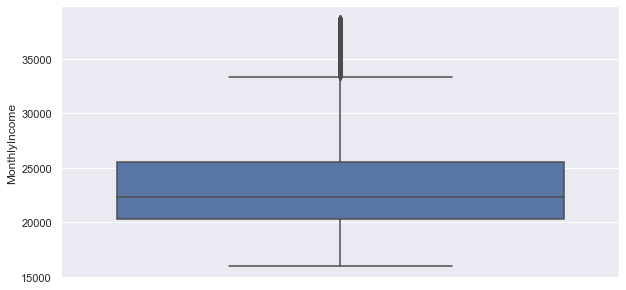

<Figure size 1440x720 with 0 Axes>

In [46]:
# Run dataframe through function
univar_vis(df)

- Small business owners follow close behind the salaried employee customer type.
- Married customers make up perhaps more than all the divorced and single customers combined.
- Manager type customers are a close second to Executives. While, VP's and AVP are a clear last.

### Bivariate

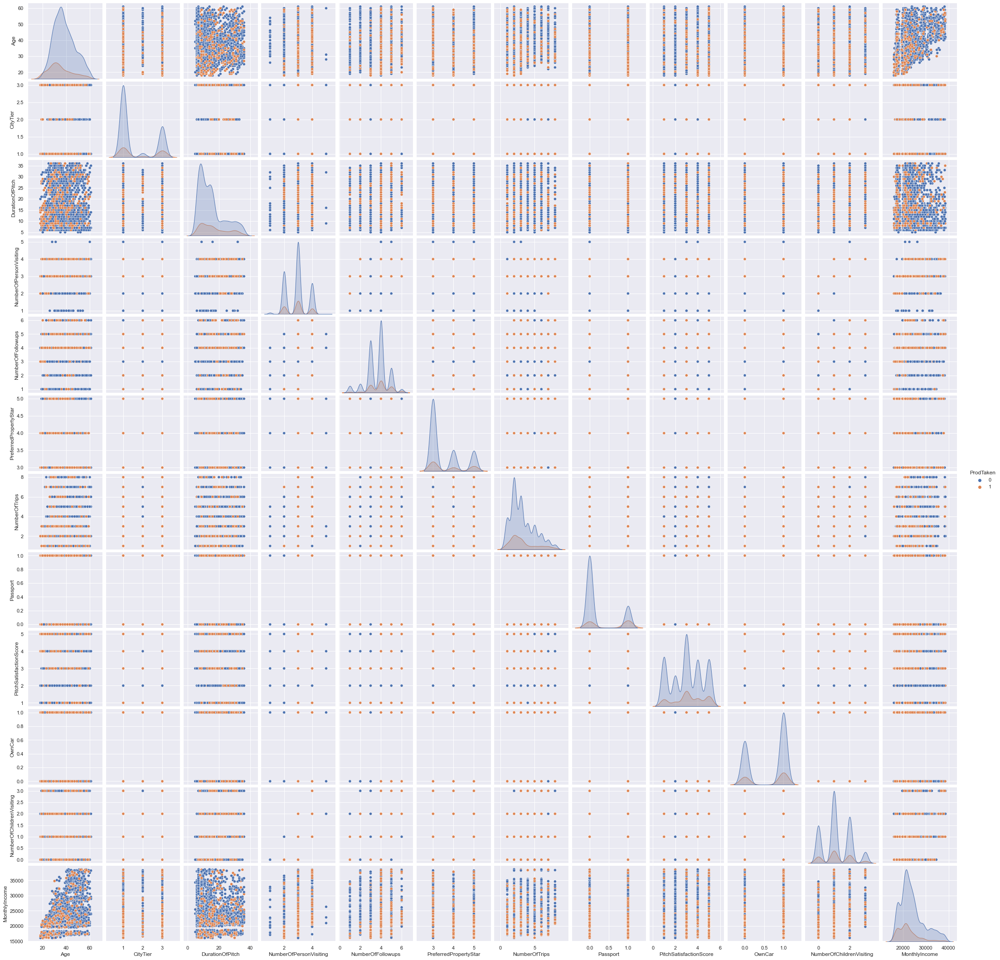

In [47]:
# Covariance analysis
sns.pairplot(data=df, hue="ProdTaken")
plt.show()

- Visually, only `Age` and `MonthlyIncome` show any near-linear relationship.
- It is difficult to read with all the variables so further analysis will be needed.

#### Categoricals

ProdTaken by TypeofContact Bar Plot


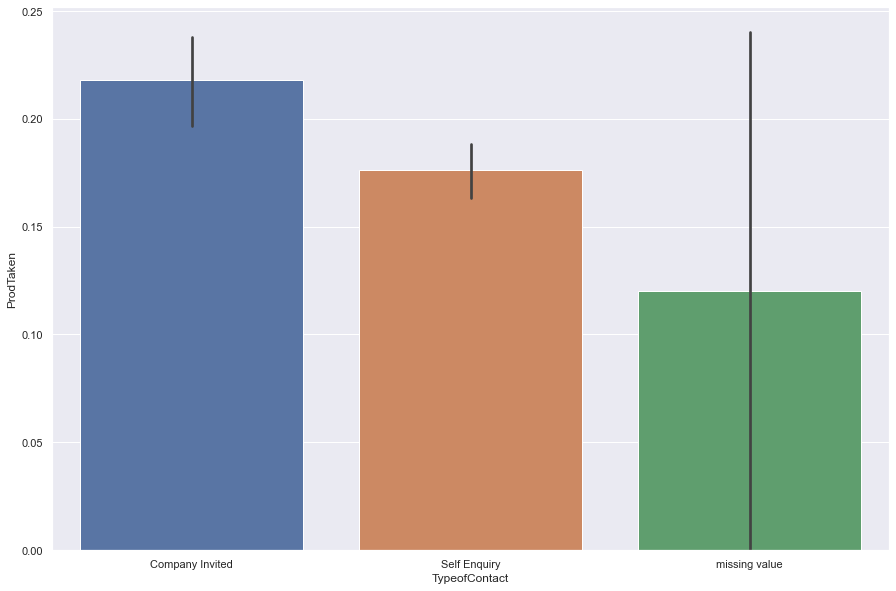

ProdTaken by TypeofContact Box Plot


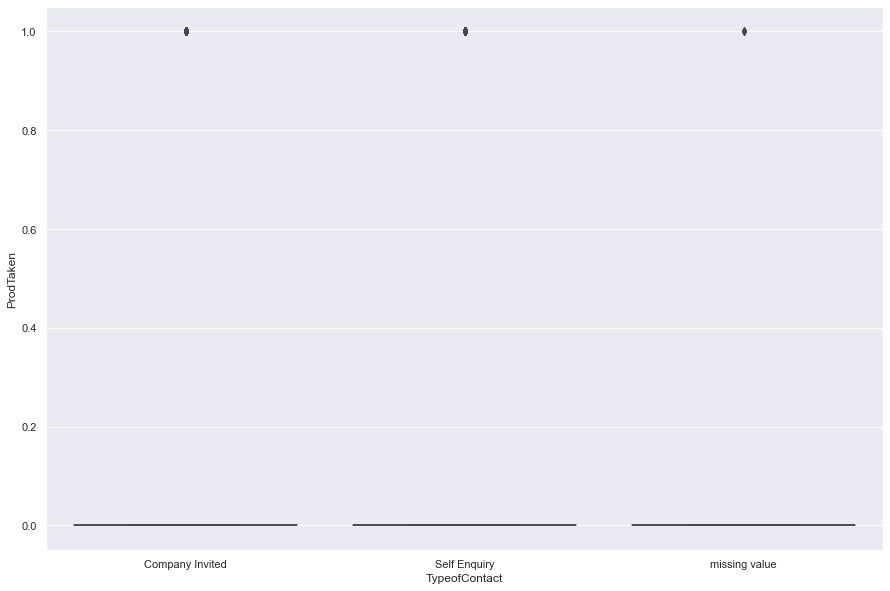

ProdTaken by TypeofContact Strip Plot


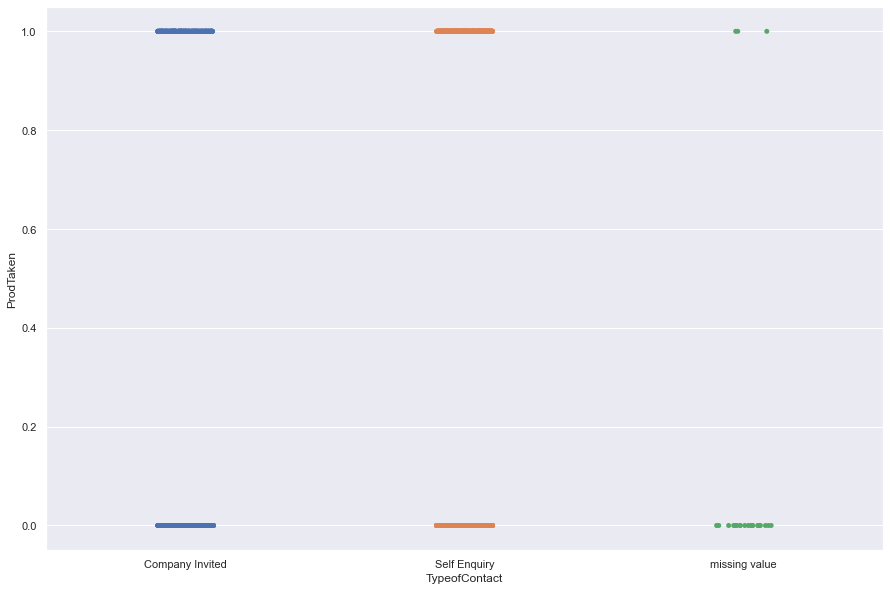

ProdTaken by Occupation Bar Plot


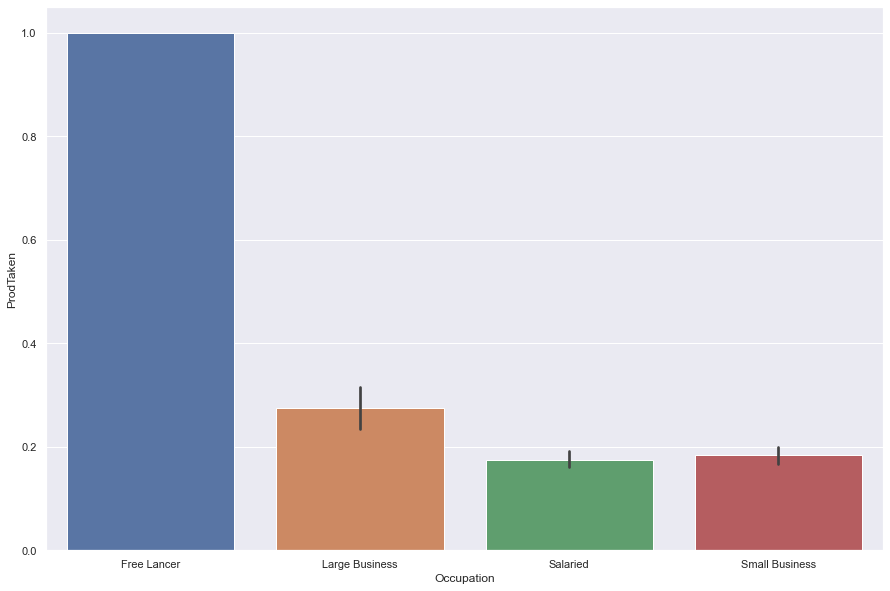

ProdTaken by Occupation Box Plot


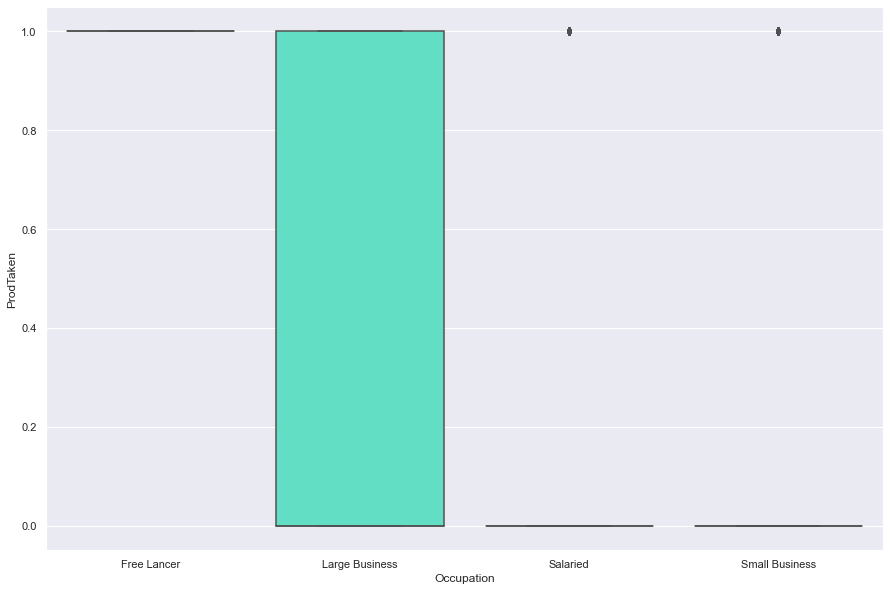

ProdTaken by Occupation Strip Plot


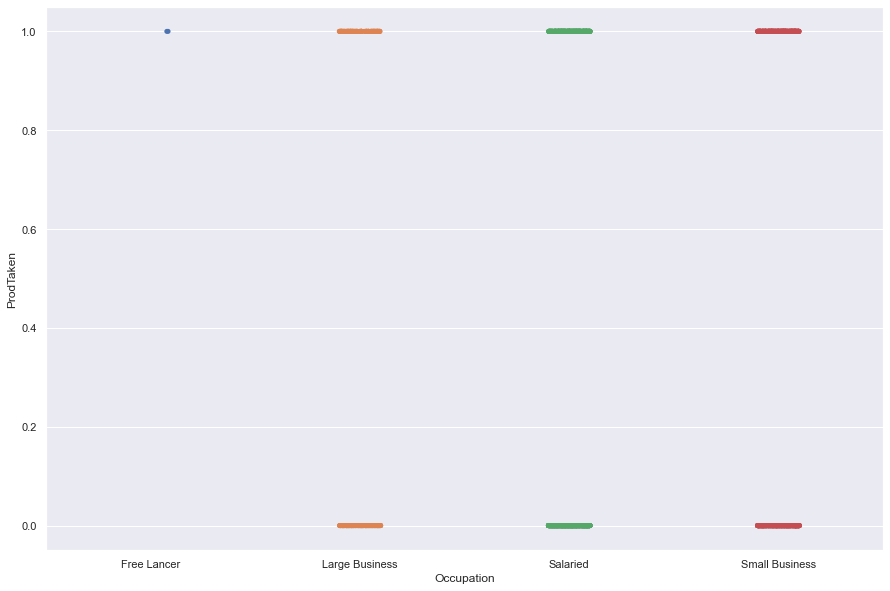

ProdTaken by Gender Bar Plot


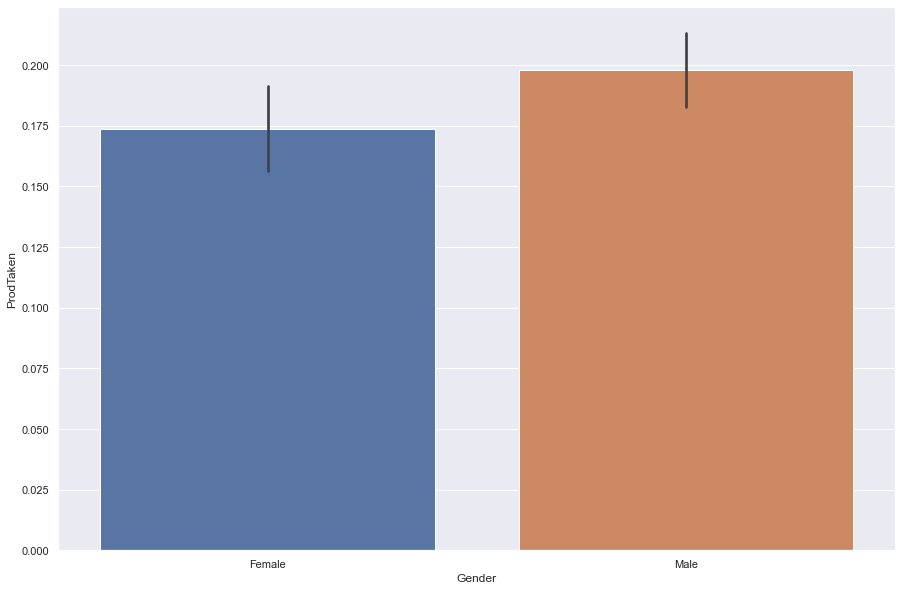

ProdTaken by Gender Box Plot


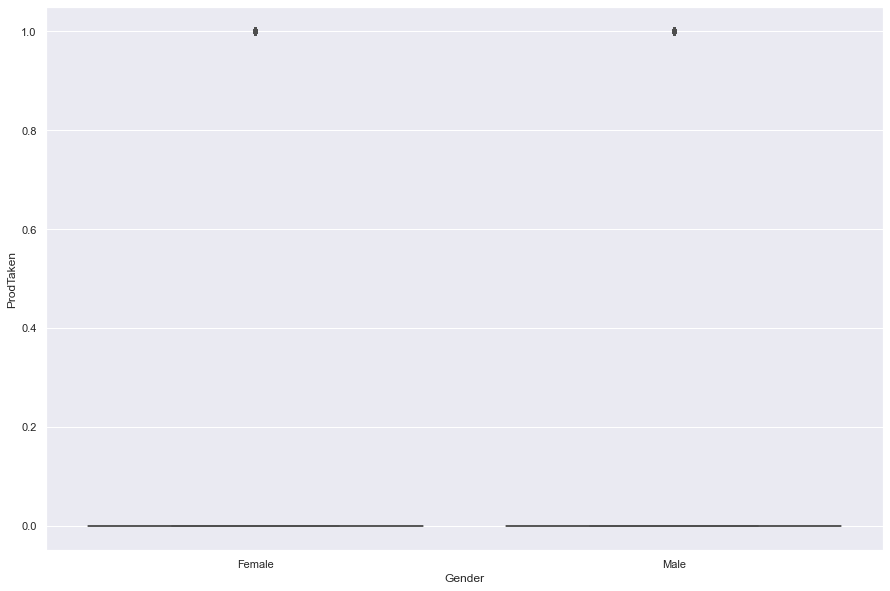

ProdTaken by Gender Strip Plot


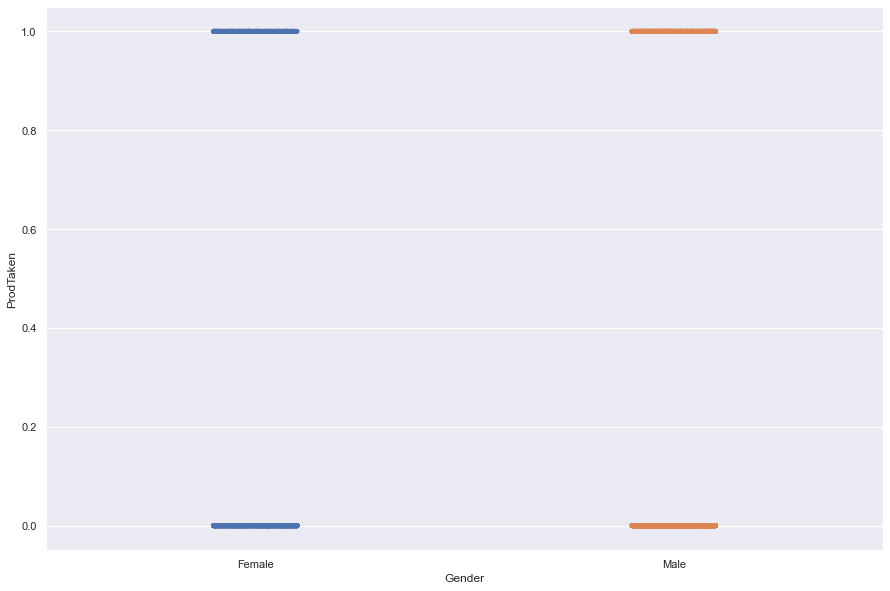

ProdTaken by ProductPitched Bar Plot


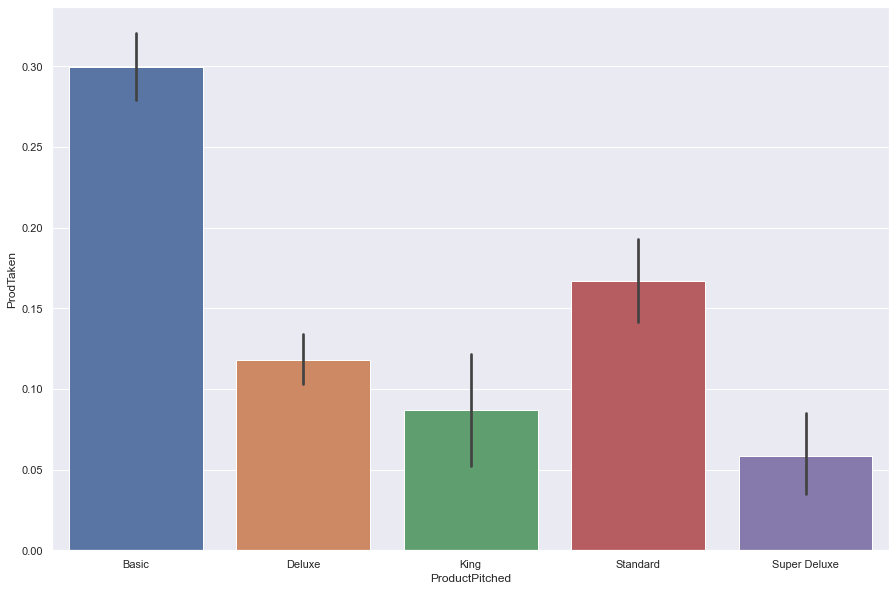

ProdTaken by ProductPitched Box Plot


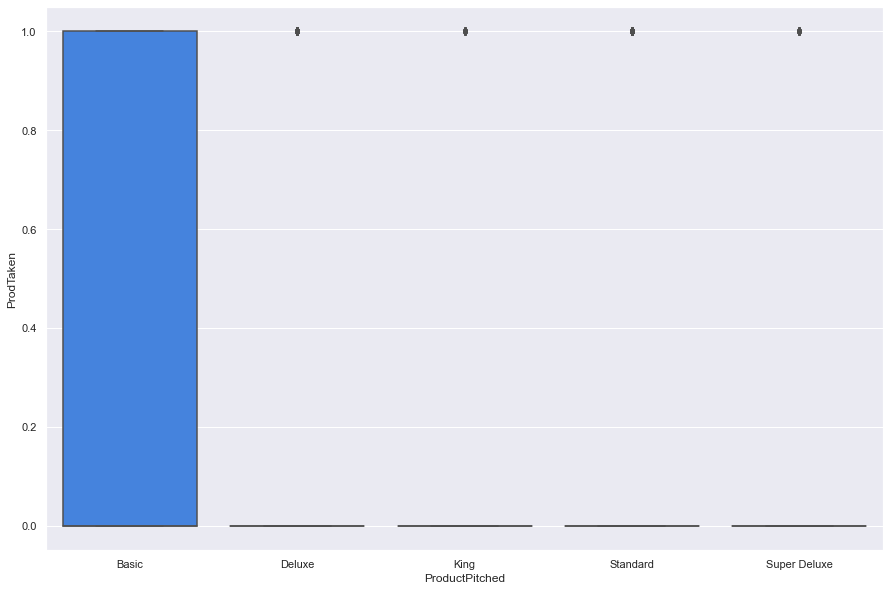

ProdTaken by ProductPitched Strip Plot


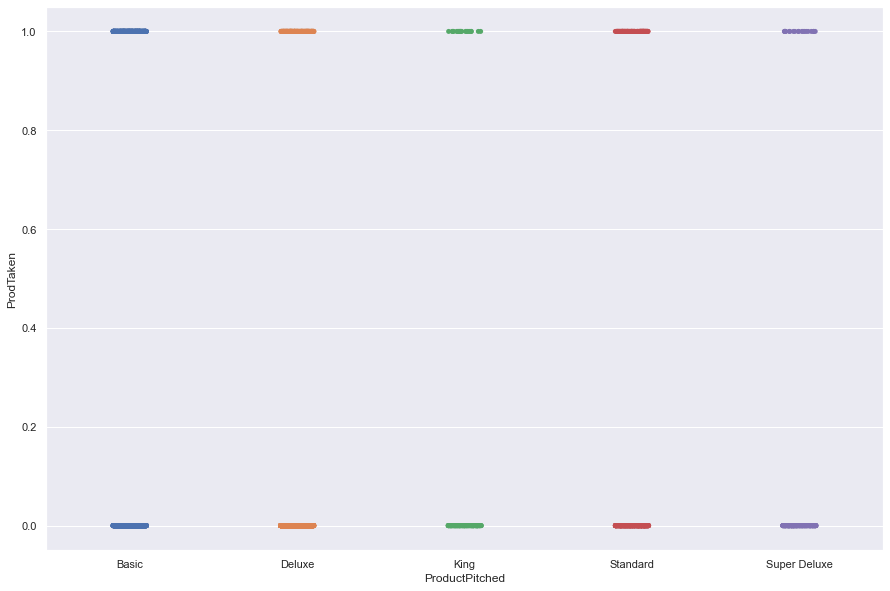

ProdTaken by MaritalStatus Bar Plot


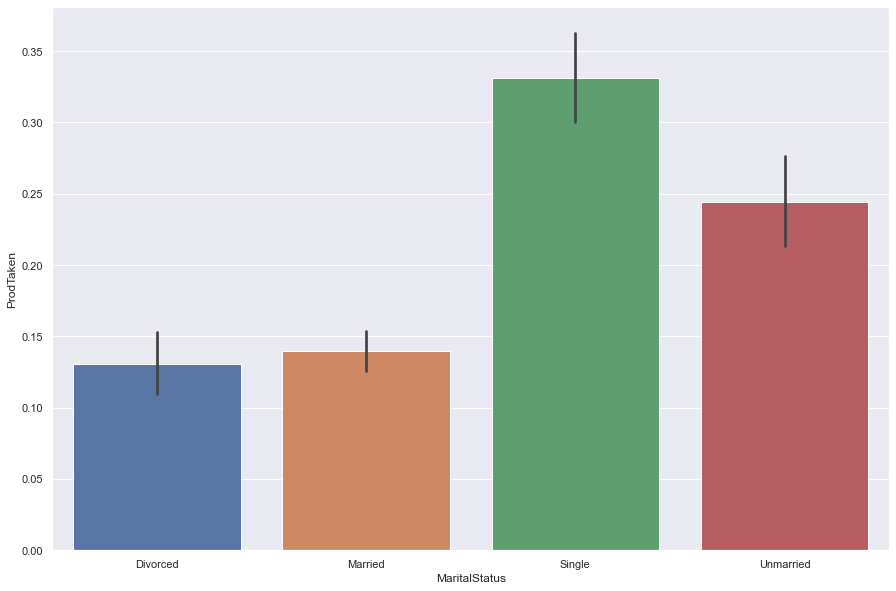

ProdTaken by MaritalStatus Box Plot


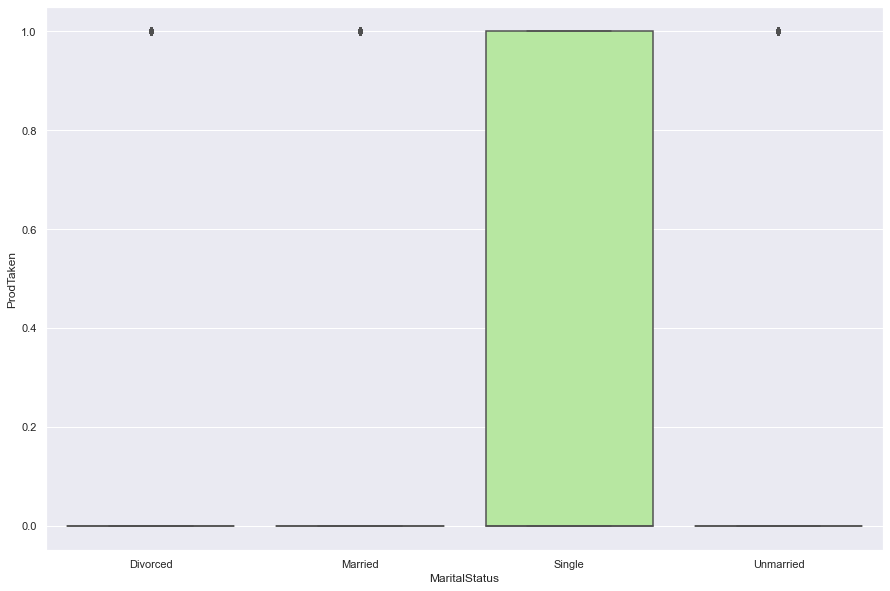

ProdTaken by MaritalStatus Strip Plot


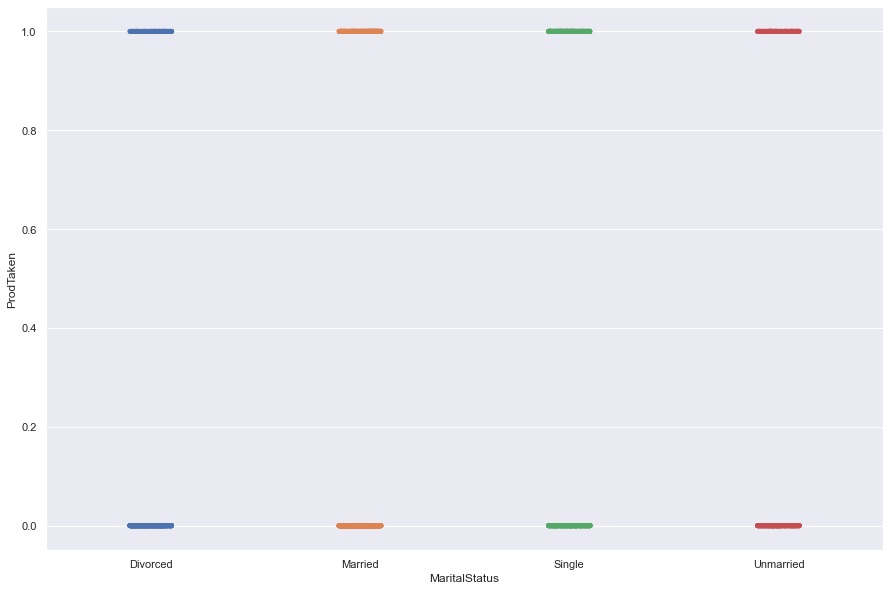

ProdTaken by Designation Bar Plot


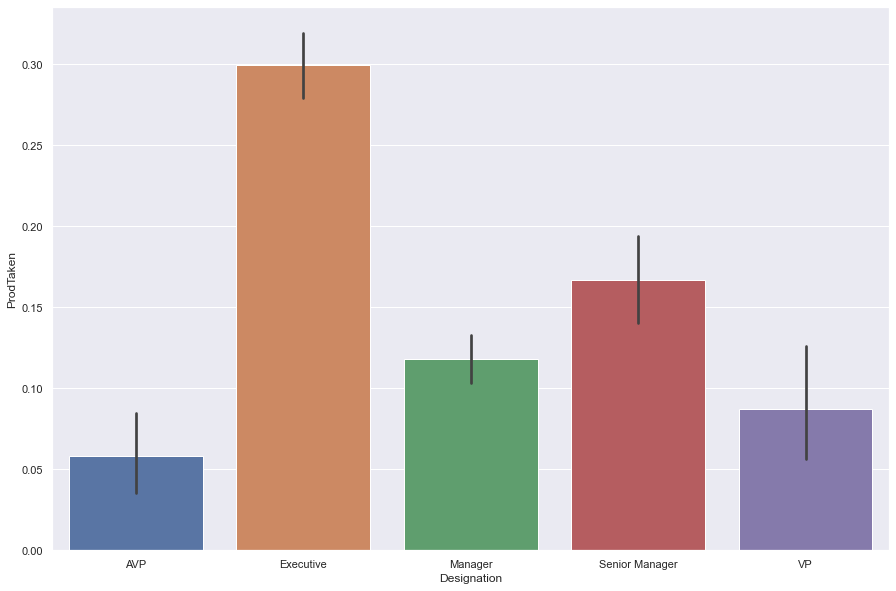

ProdTaken by Designation Box Plot


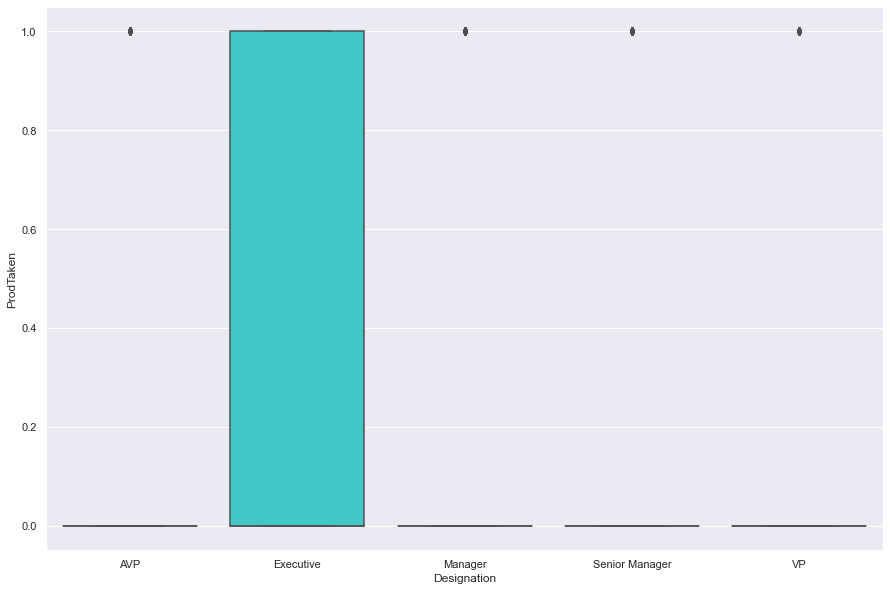

ProdTaken by Designation Strip Plot


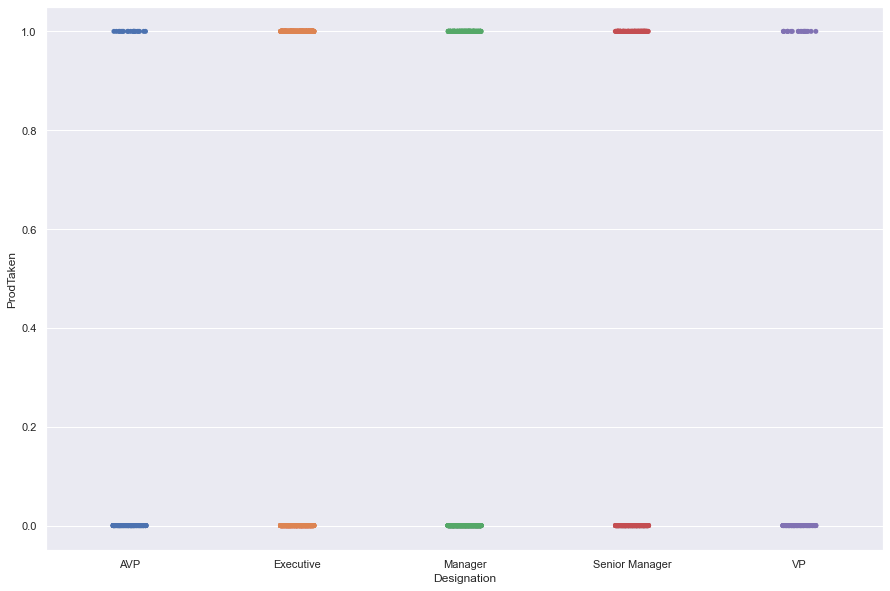

Age by TypeofContact Bar Plot


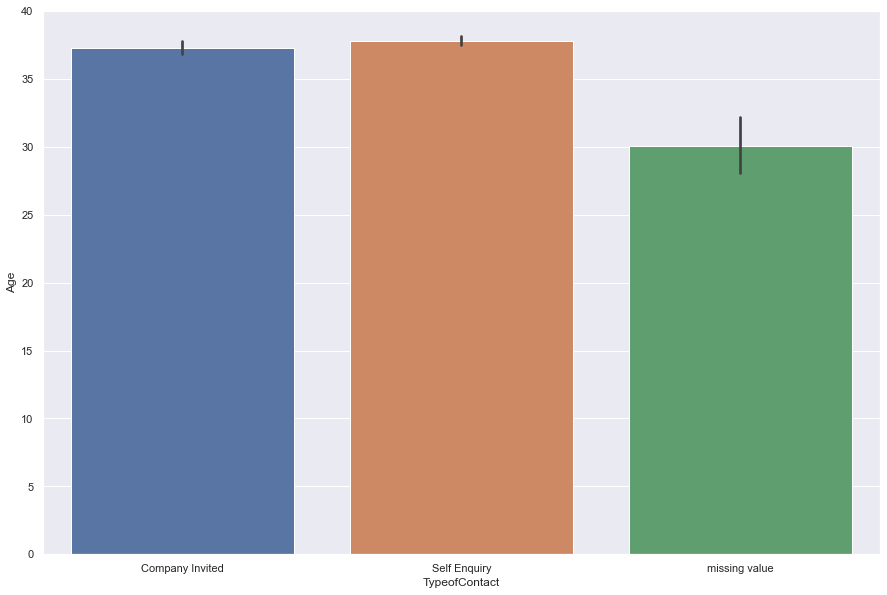

Age by TypeofContact Box Plot


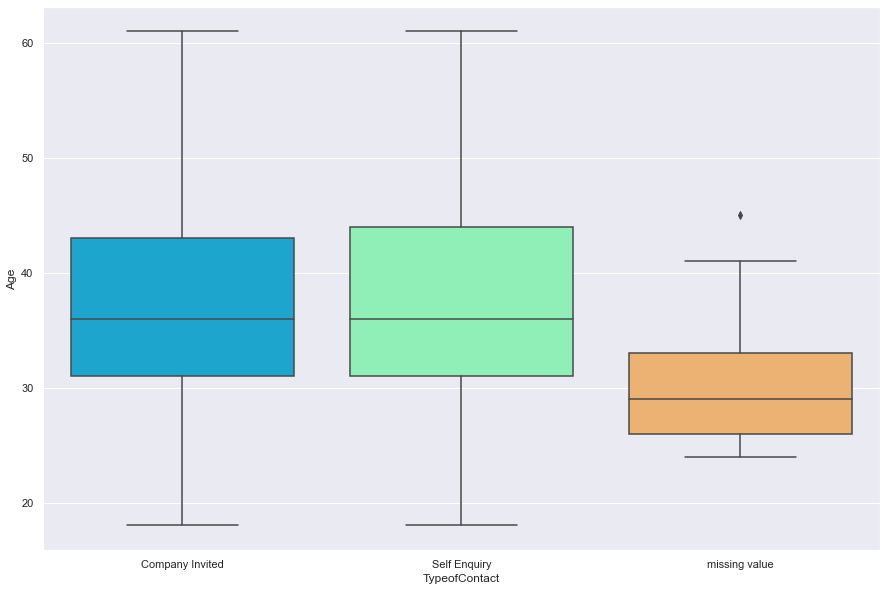

Age by TypeofContact Strip Plot


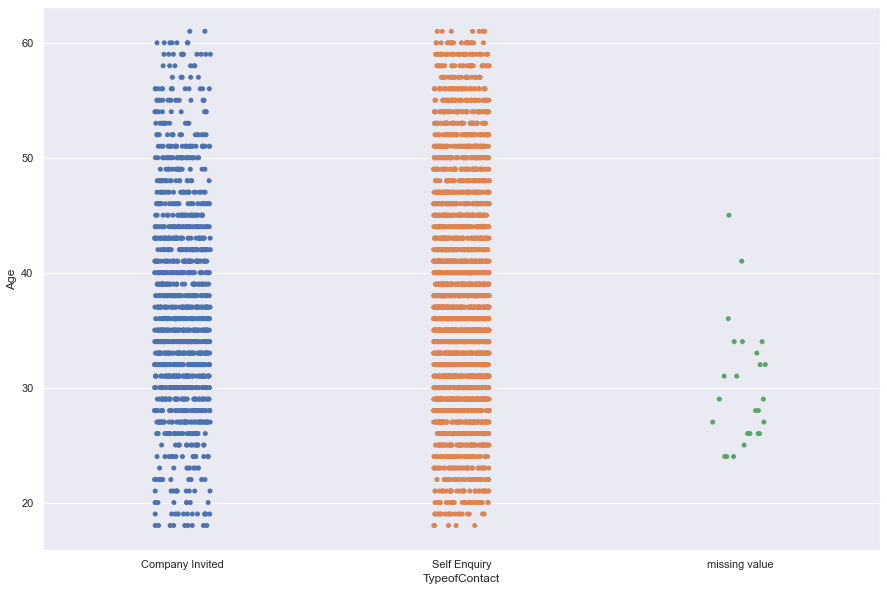

Age by Occupation Bar Plot


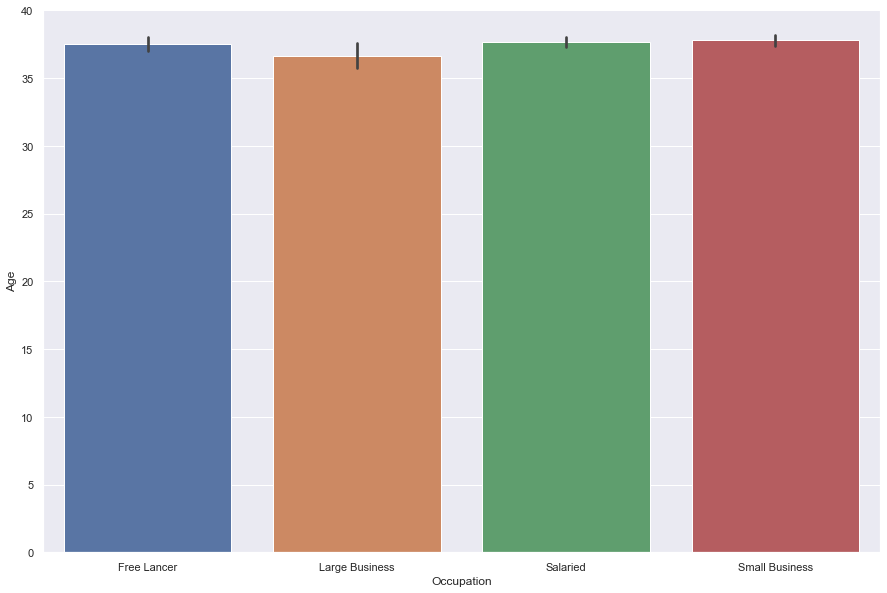

Age by Occupation Box Plot


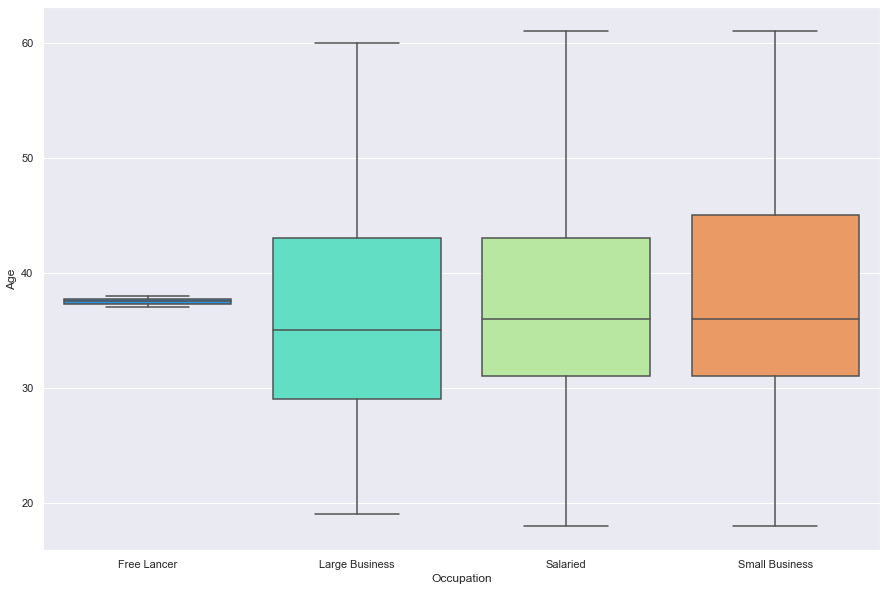

Age by Occupation Strip Plot


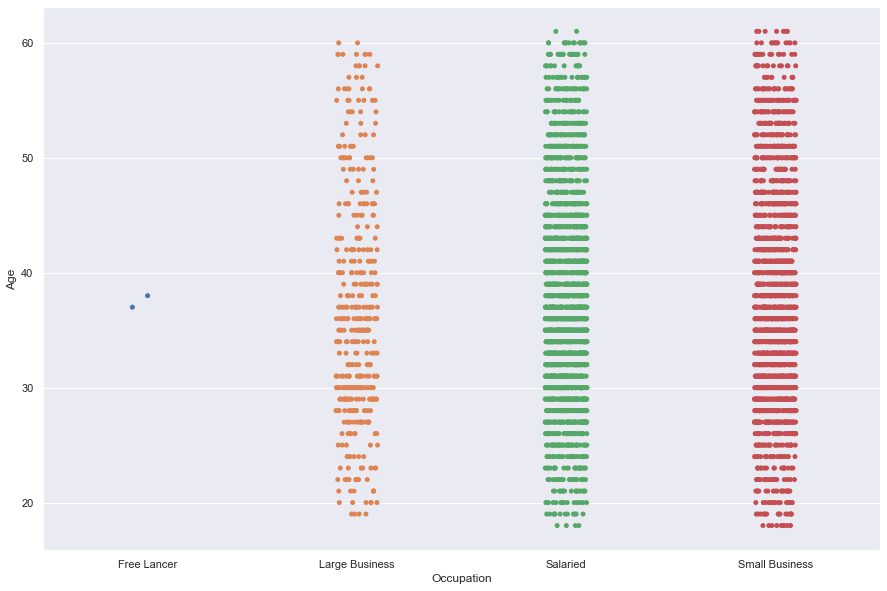

Age by Gender Bar Plot


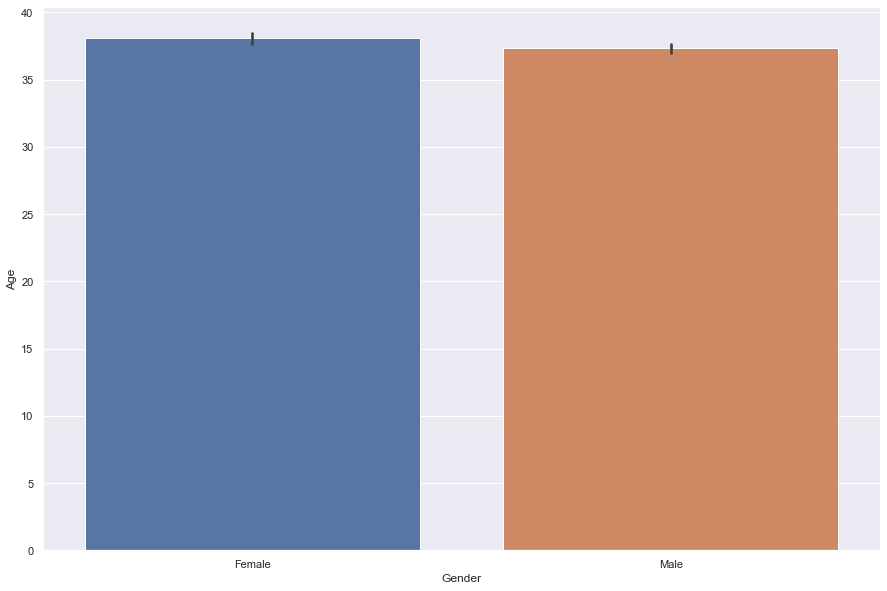

Age by Gender Box Plot


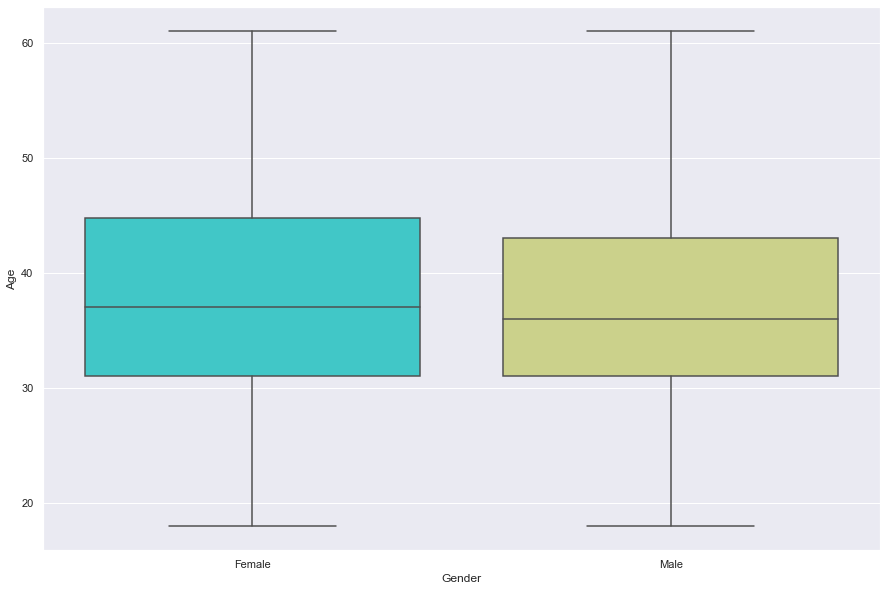

Age by Gender Strip Plot


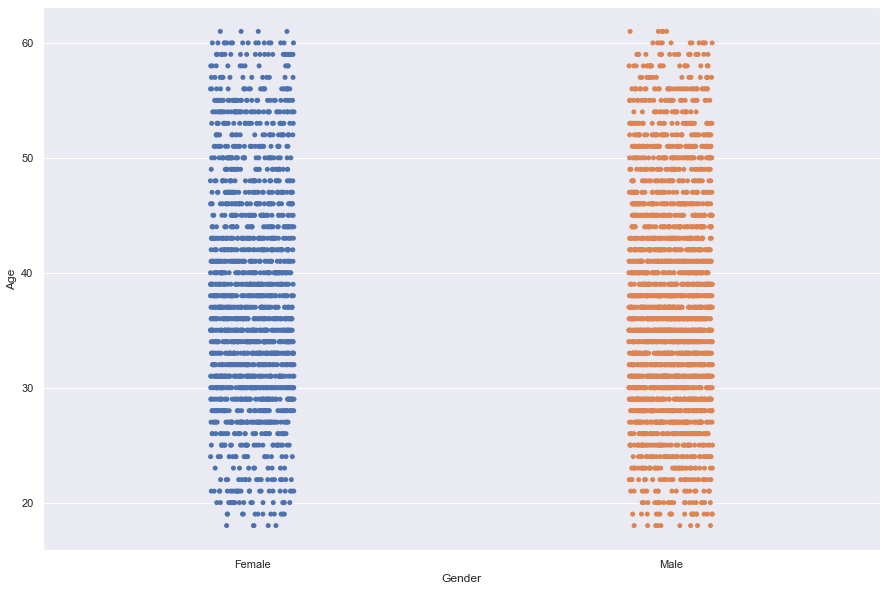

Age by ProductPitched Bar Plot


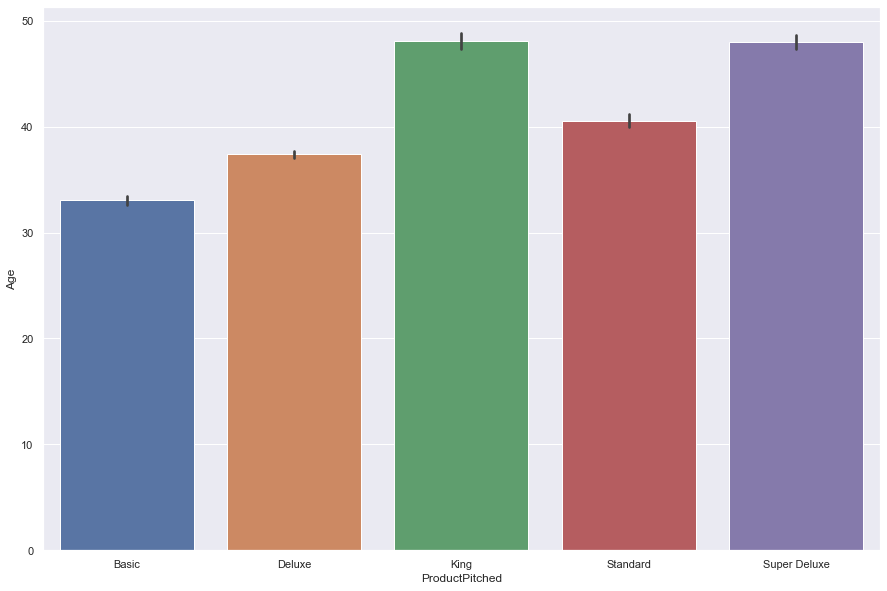

Age by ProductPitched Box Plot


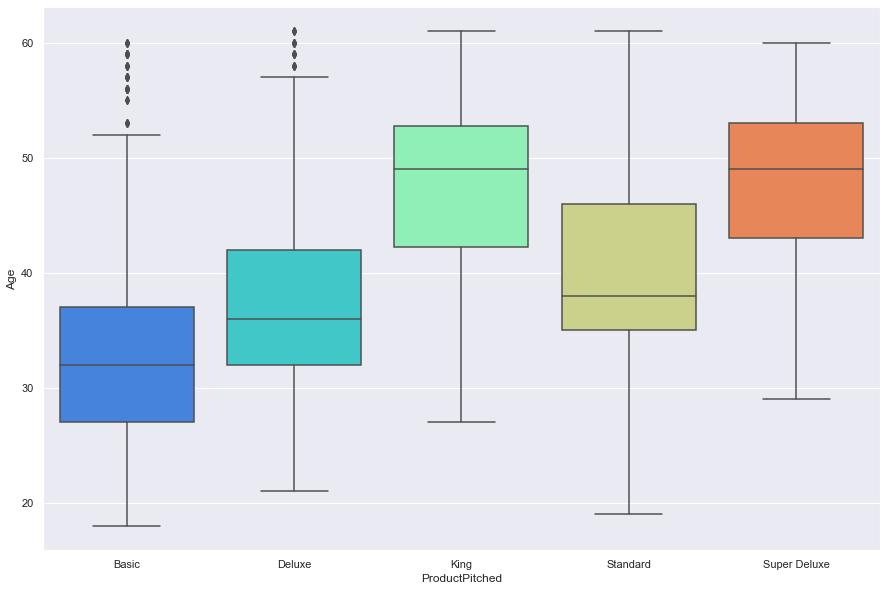

Age by ProductPitched Strip Plot


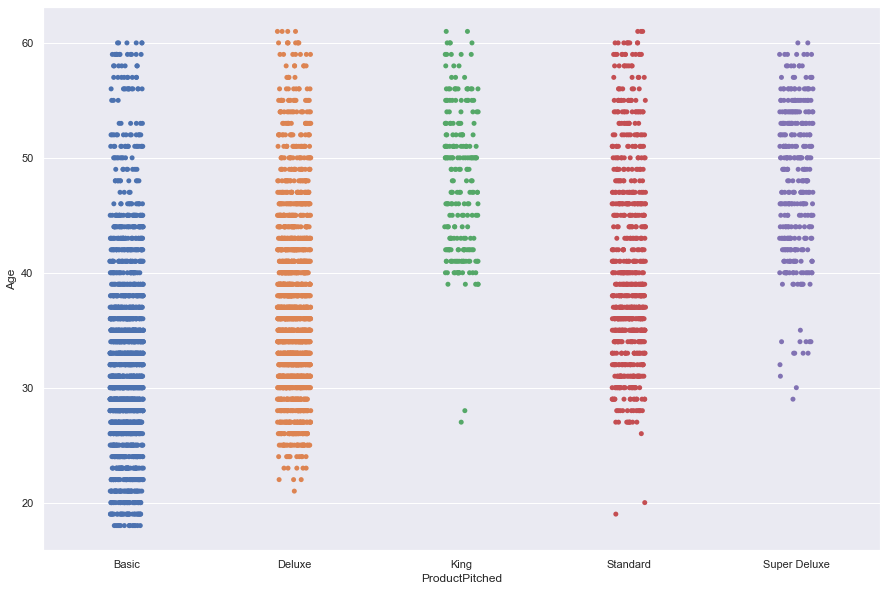

Age by MaritalStatus Bar Plot


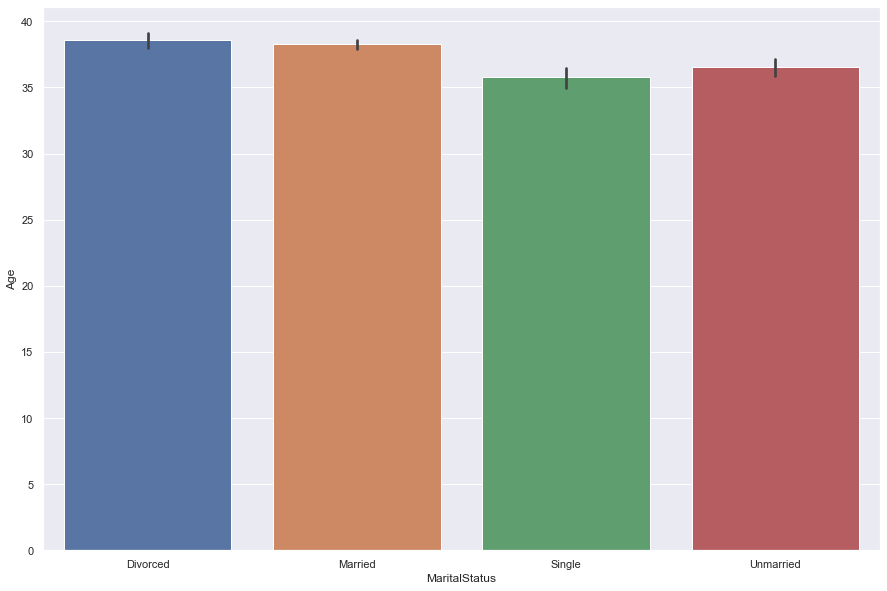

Age by MaritalStatus Box Plot


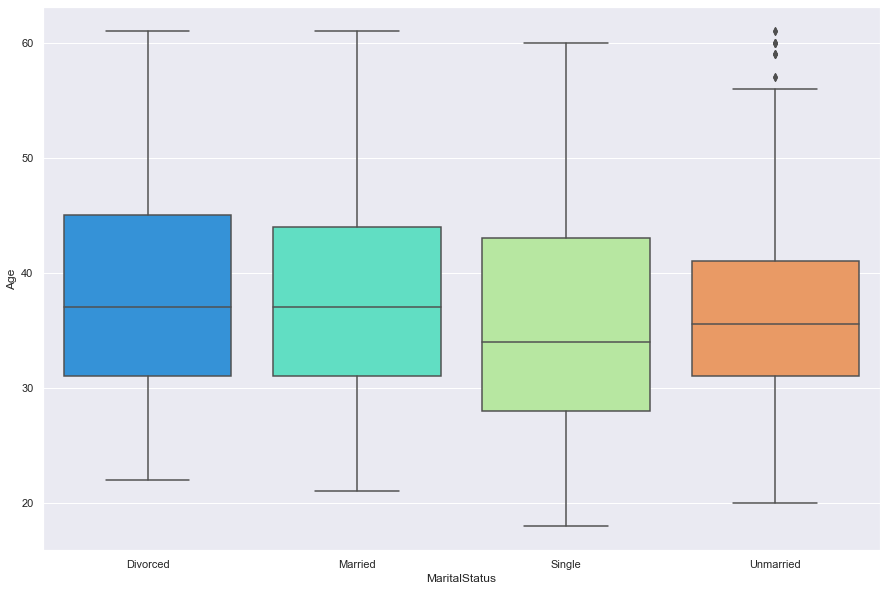

Age by MaritalStatus Strip Plot


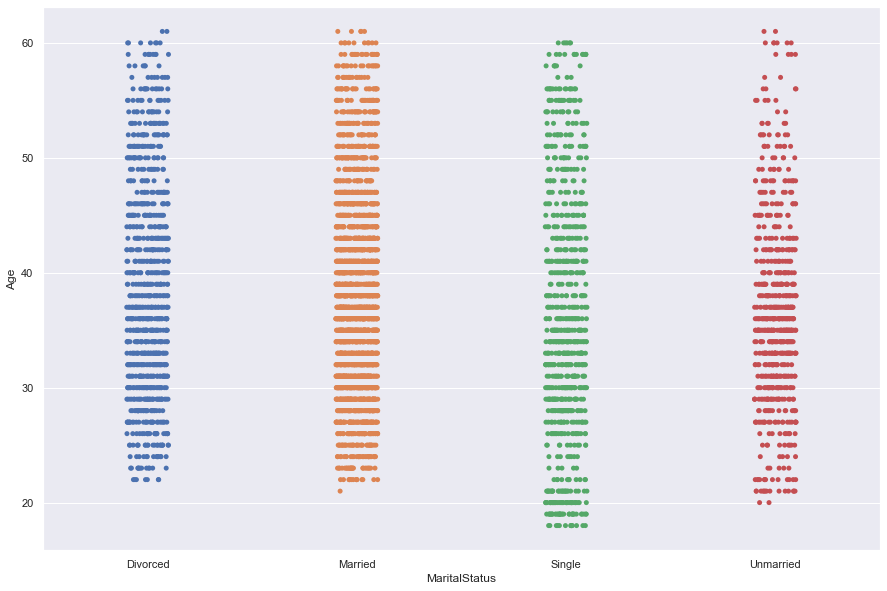

Age by Designation Bar Plot


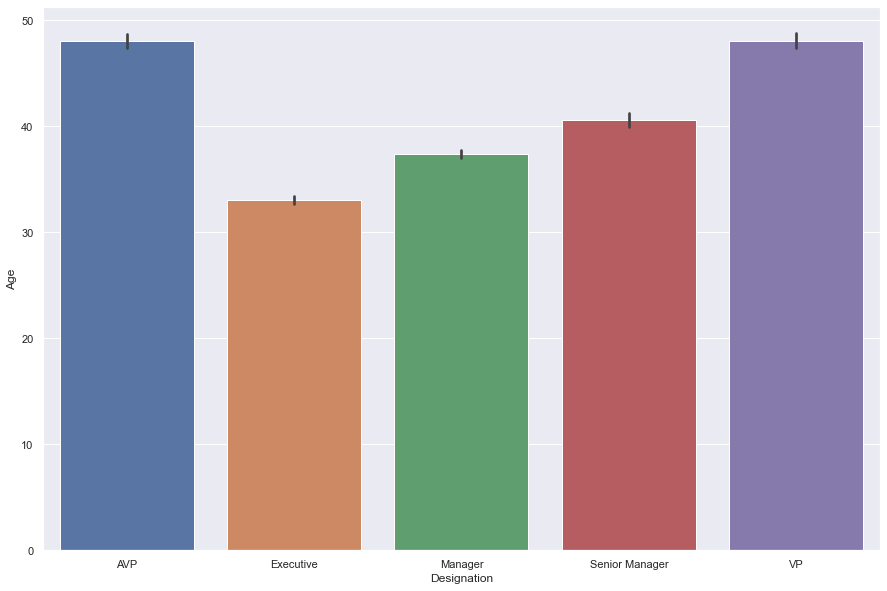

Age by Designation Box Plot


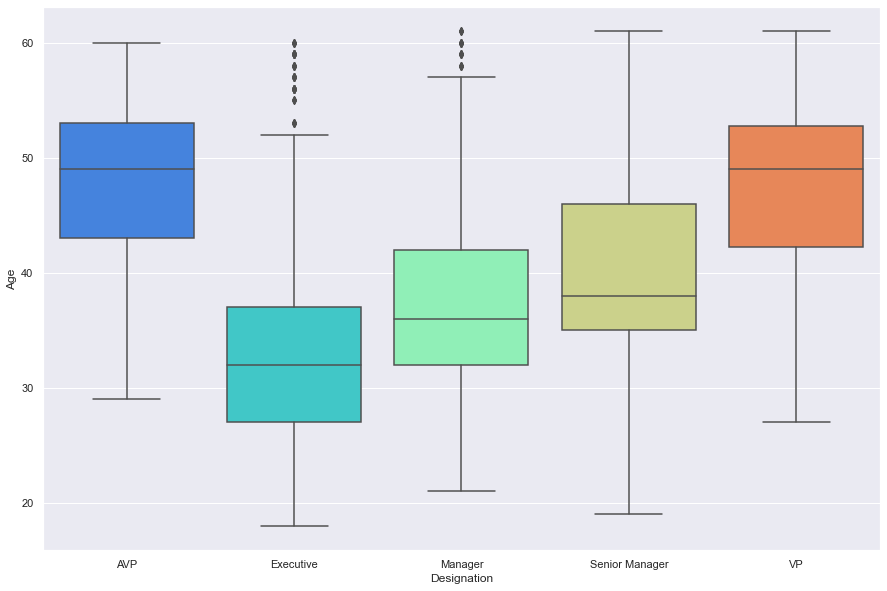

Age by Designation Strip Plot


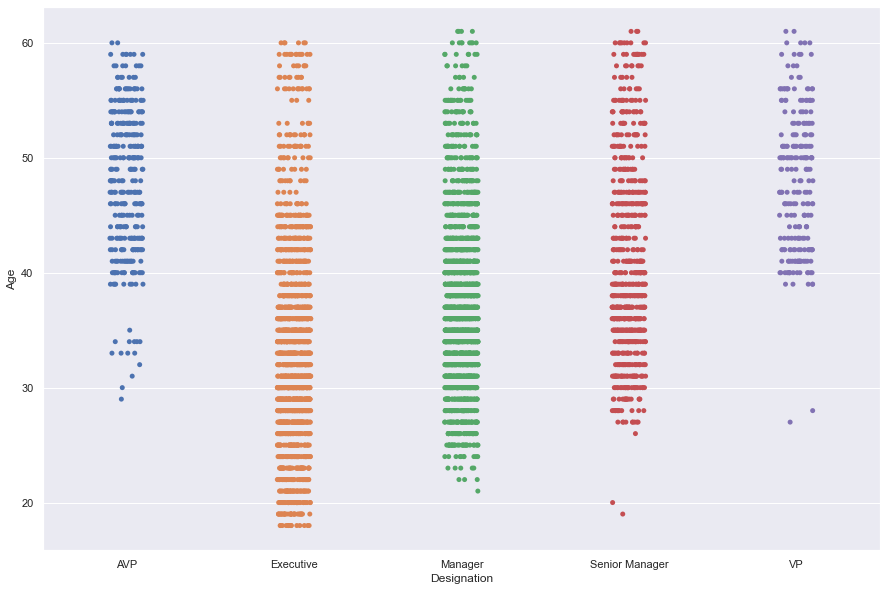

CityTier by TypeofContact Bar Plot


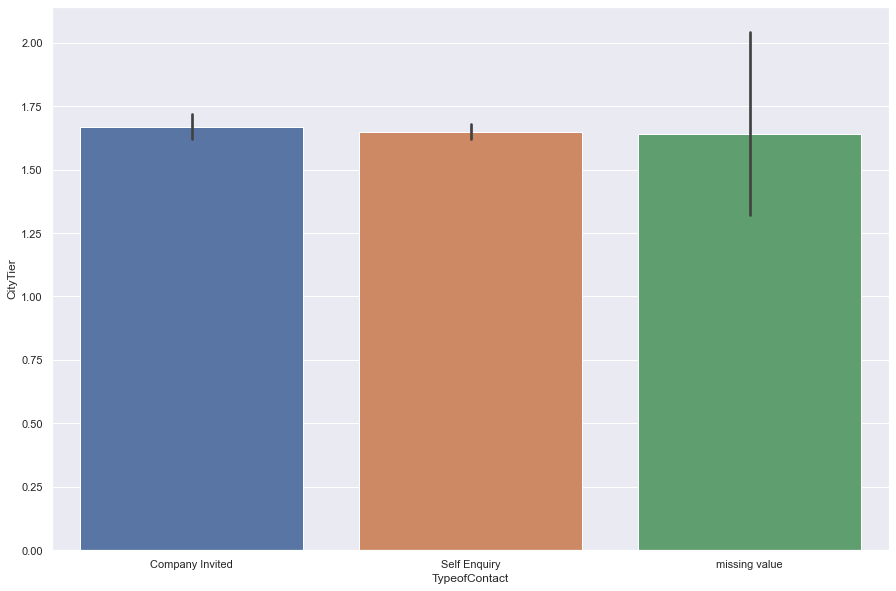

CityTier by TypeofContact Box Plot


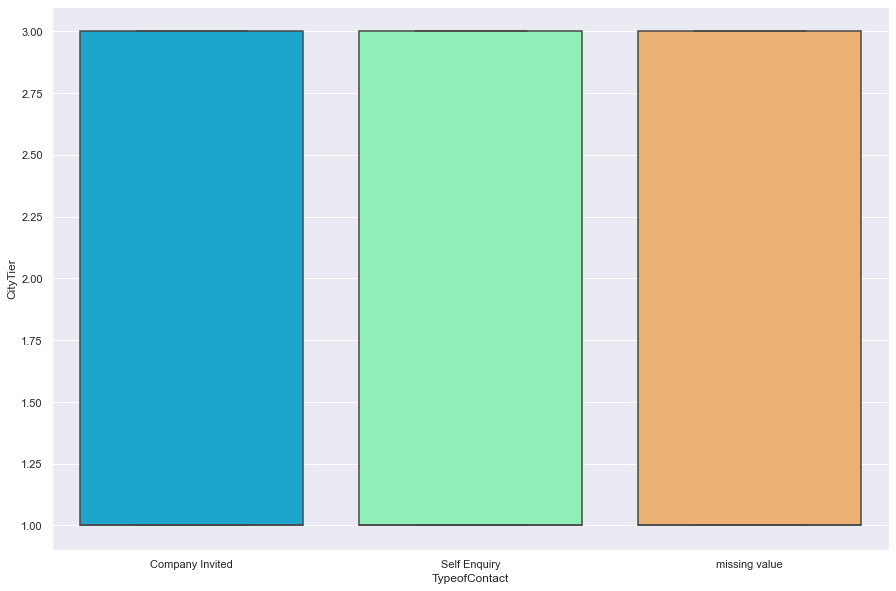

CityTier by TypeofContact Strip Plot


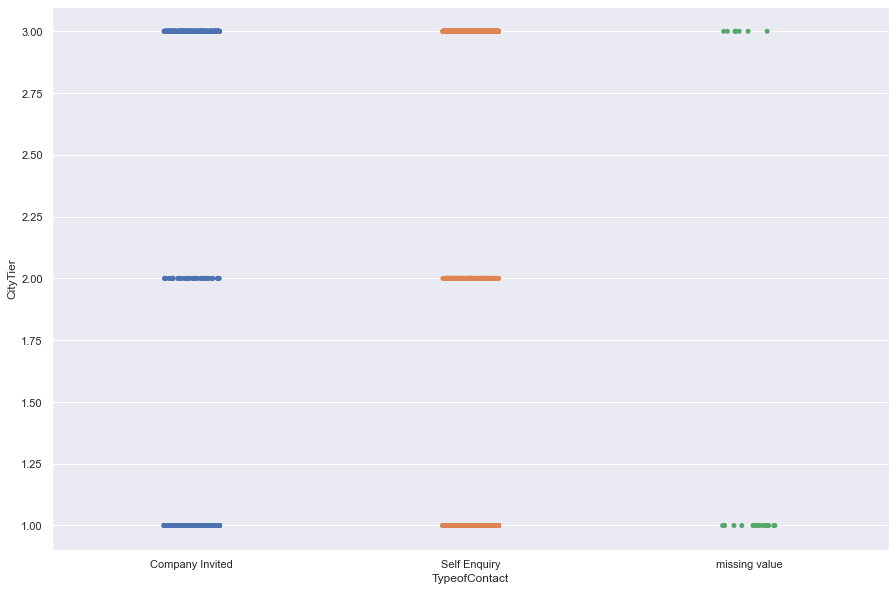

CityTier by Occupation Bar Plot


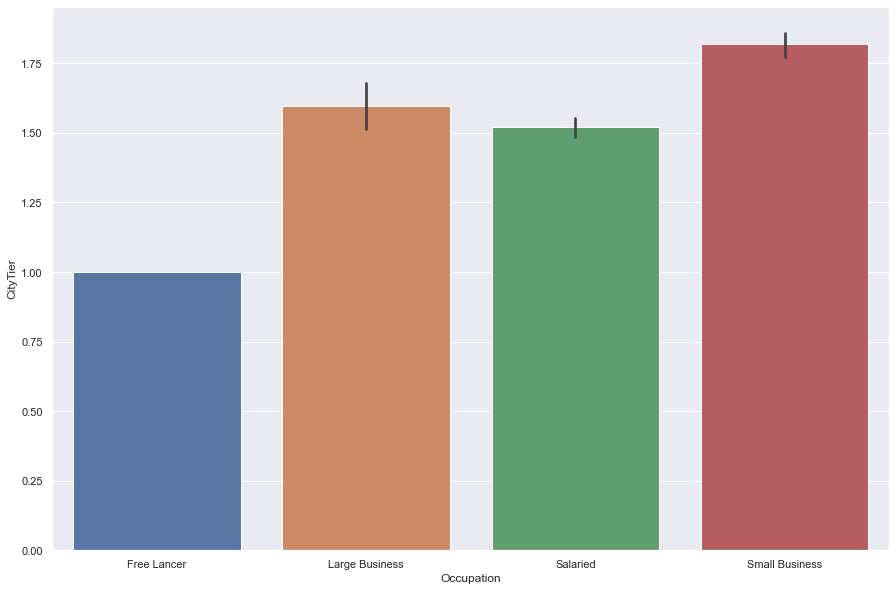

CityTier by Occupation Box Plot


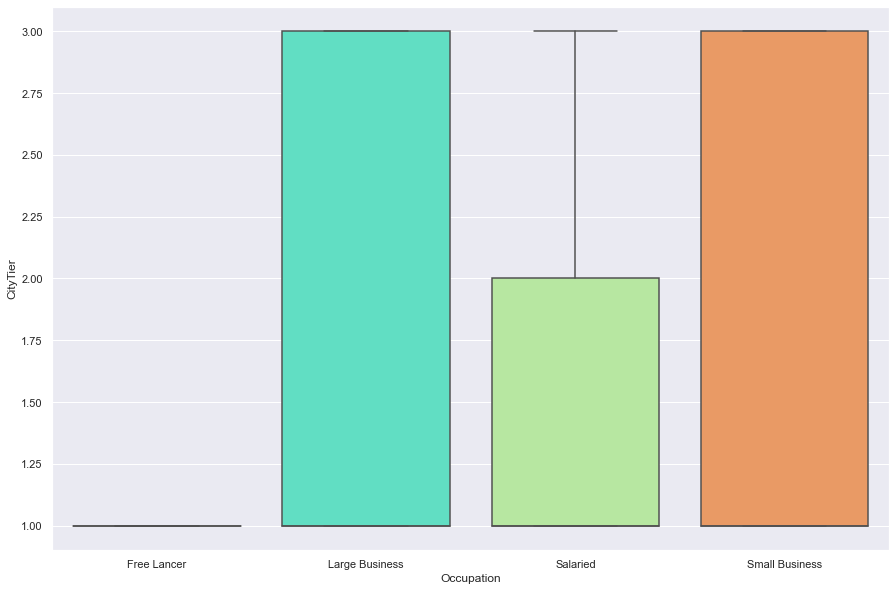

CityTier by Occupation Strip Plot


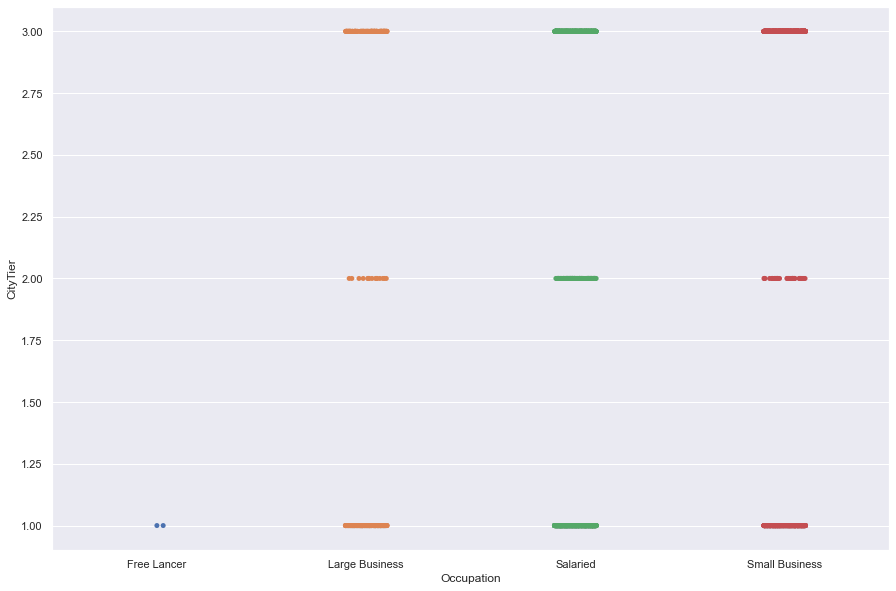

CityTier by Gender Bar Plot


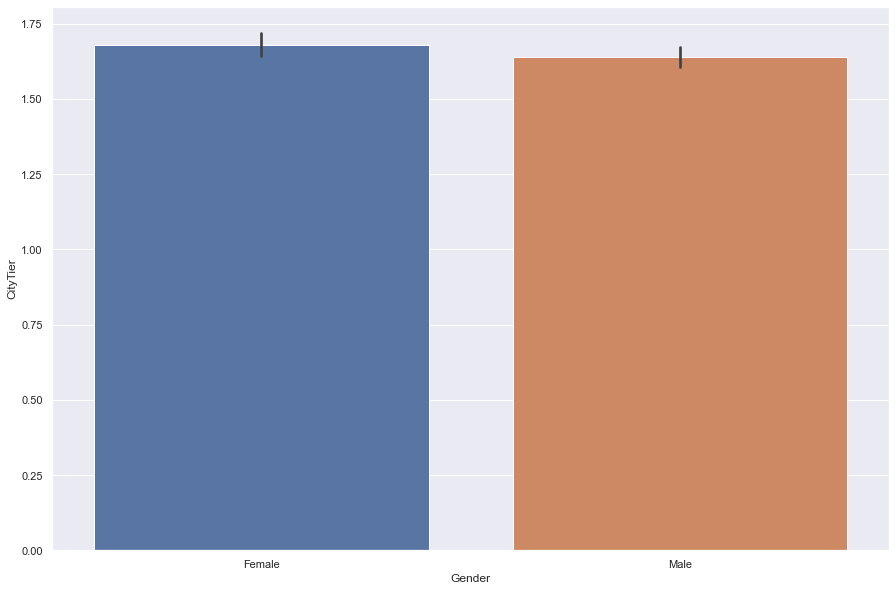

CityTier by Gender Box Plot


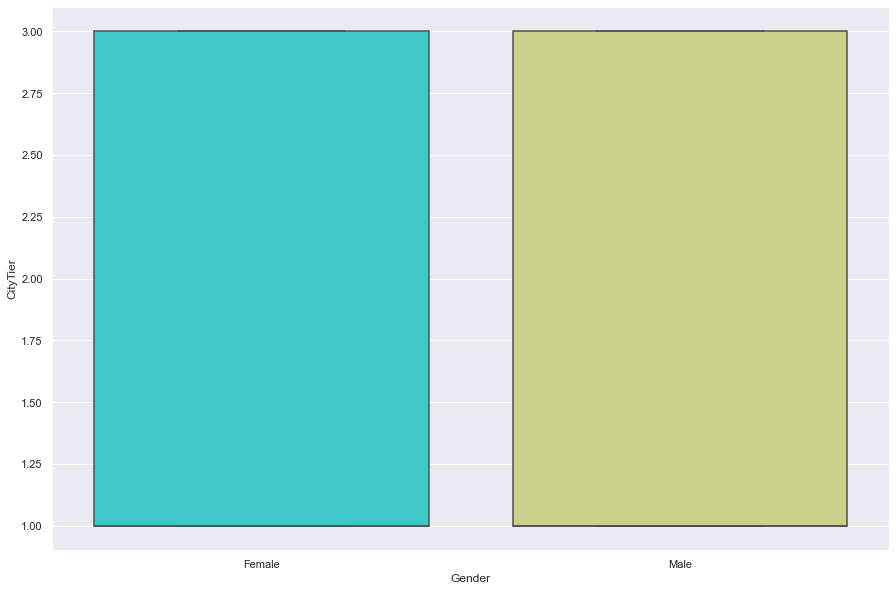

CityTier by Gender Strip Plot


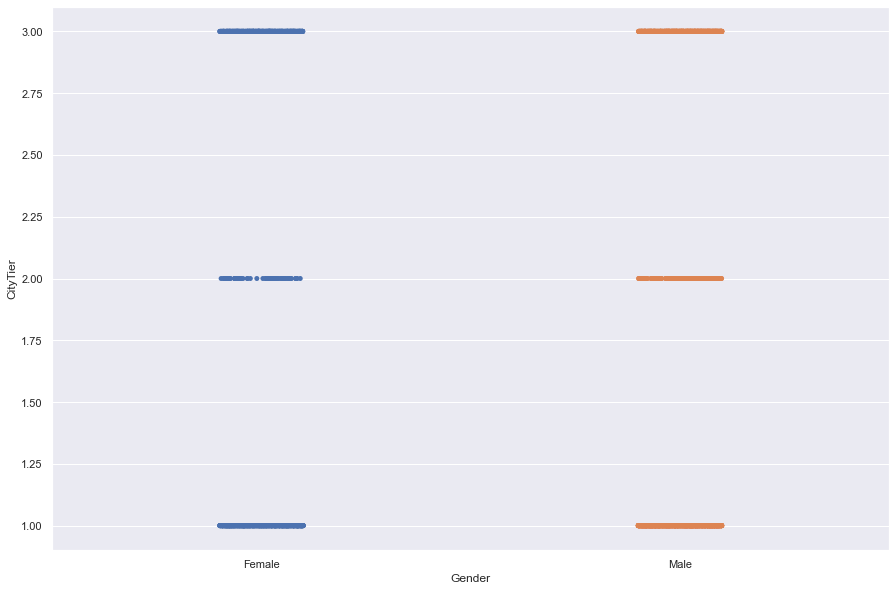

CityTier by ProductPitched Bar Plot


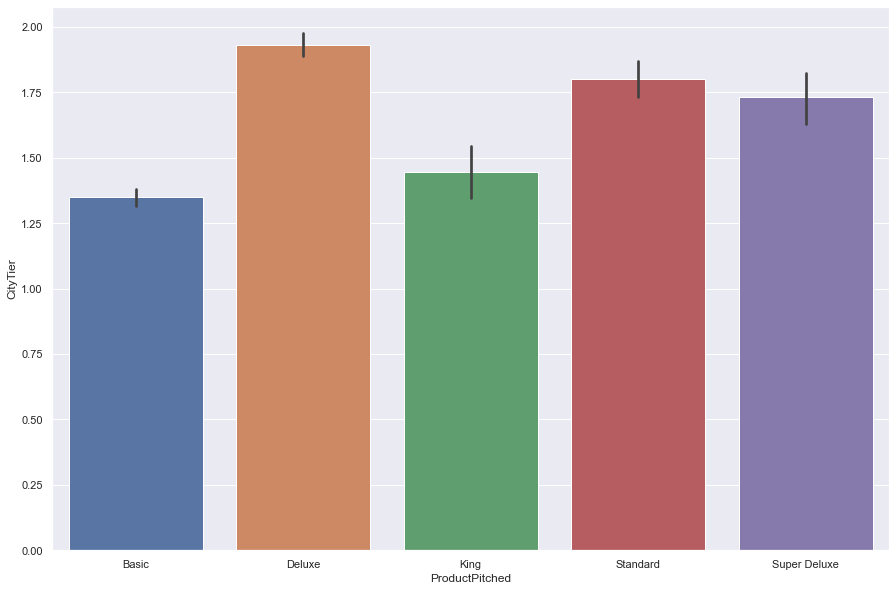

CityTier by ProductPitched Box Plot


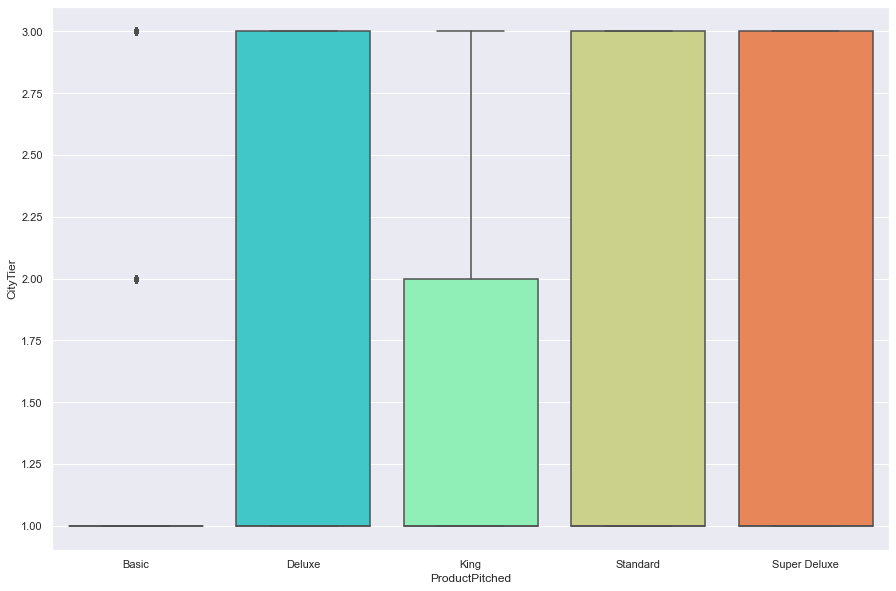

CityTier by ProductPitched Strip Plot


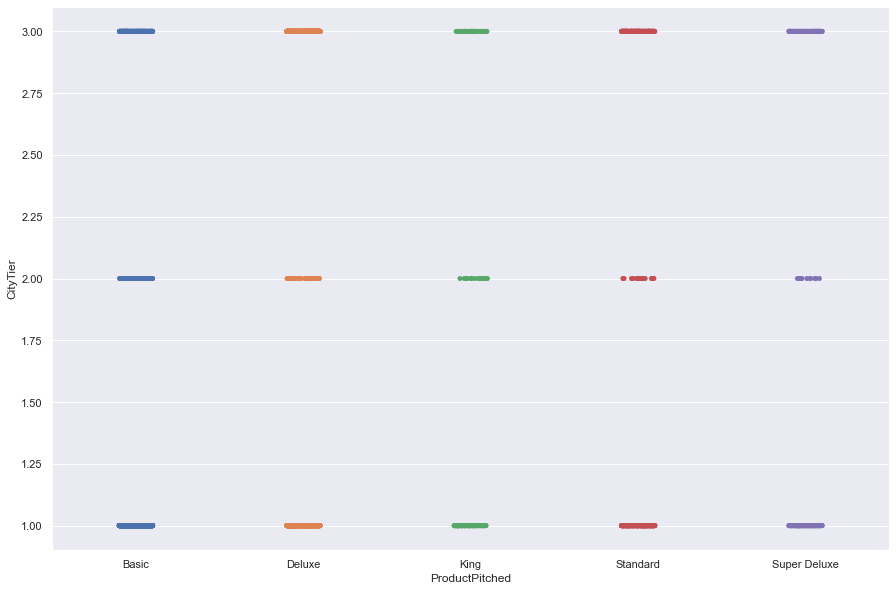

CityTier by MaritalStatus Bar Plot


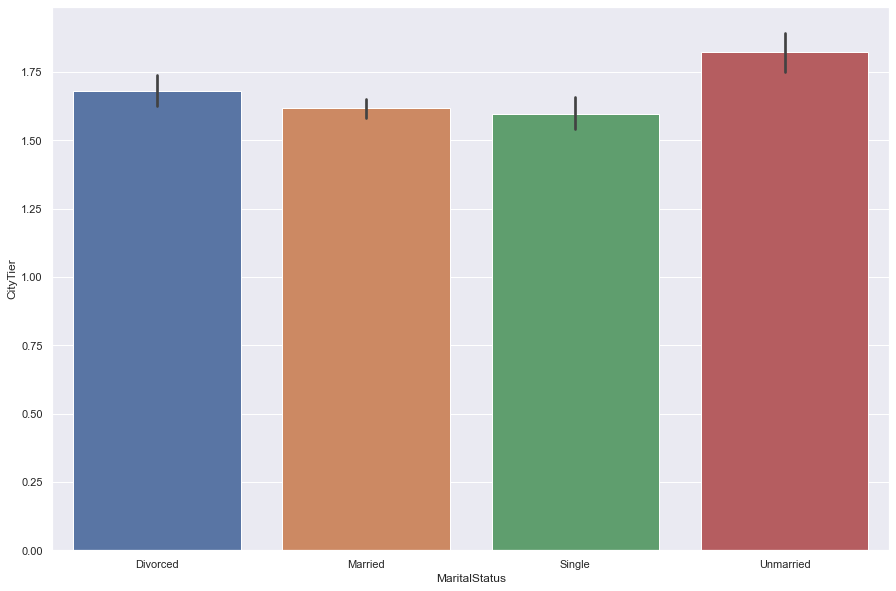

CityTier by MaritalStatus Box Plot


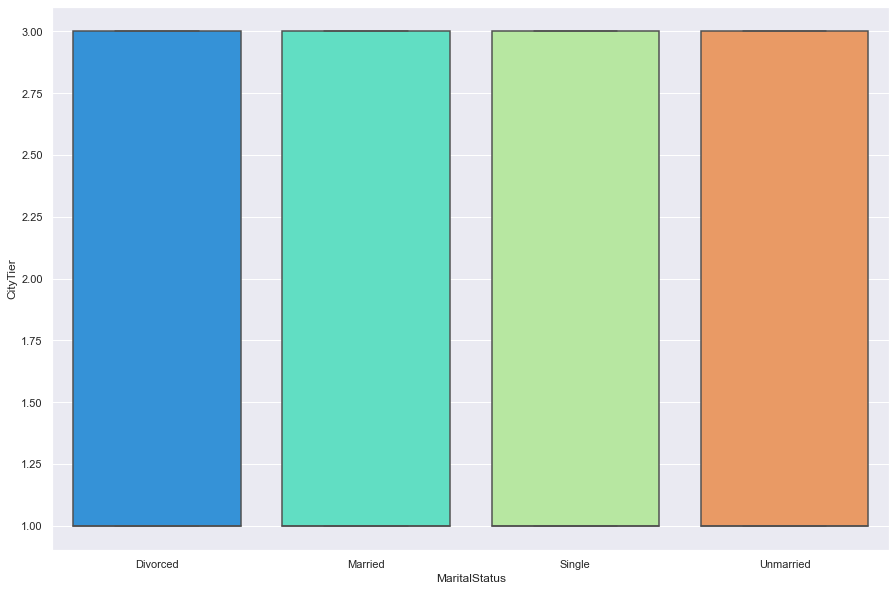

CityTier by MaritalStatus Strip Plot


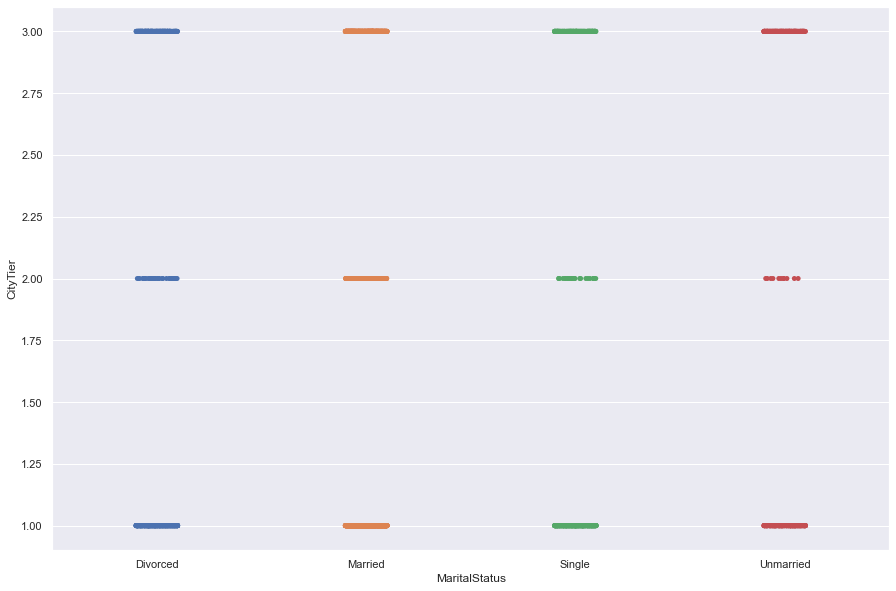

CityTier by Designation Bar Plot


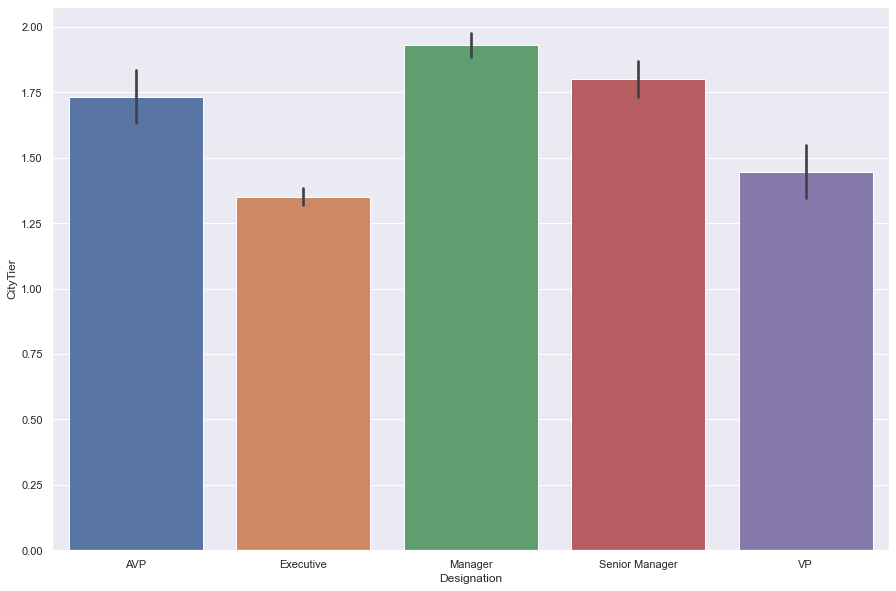

CityTier by Designation Box Plot


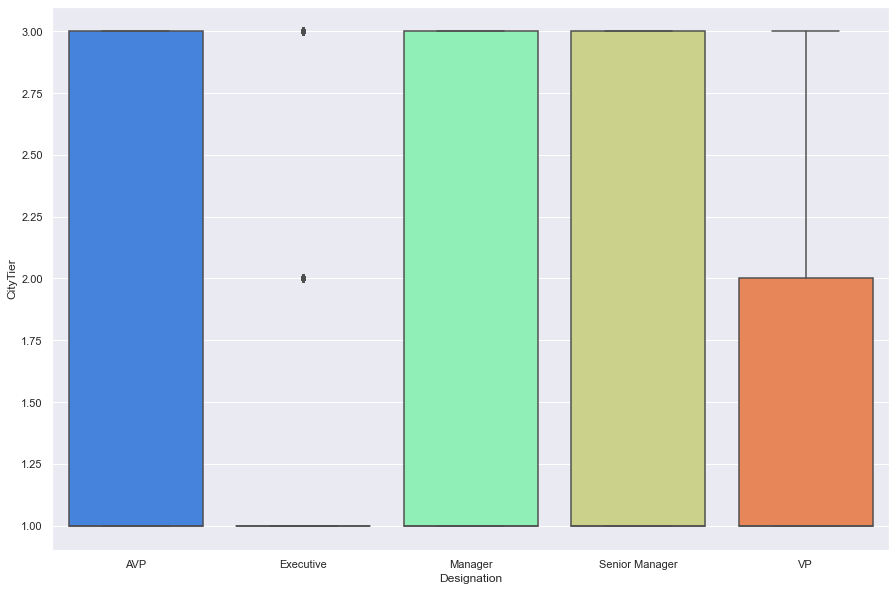

CityTier by Designation Strip Plot


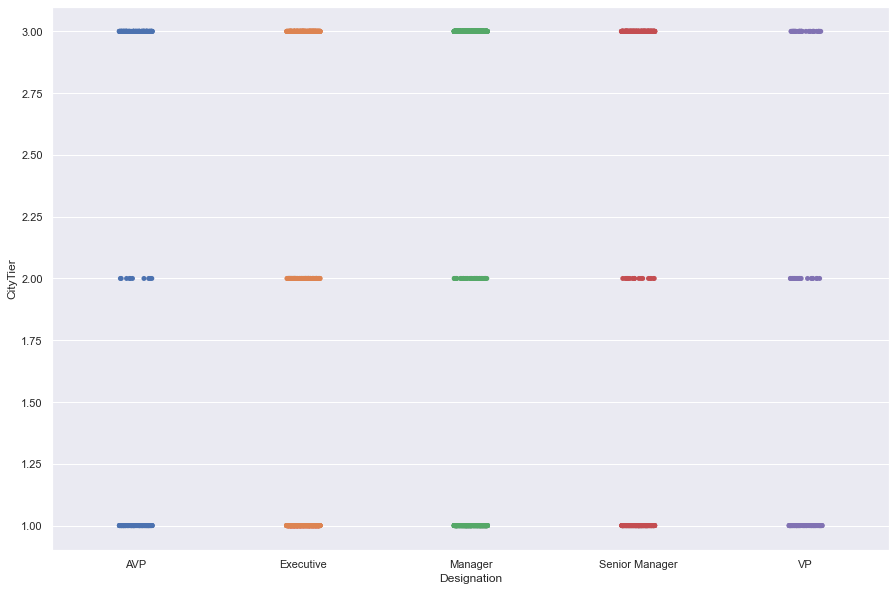

DurationOfPitch by TypeofContact Bar Plot


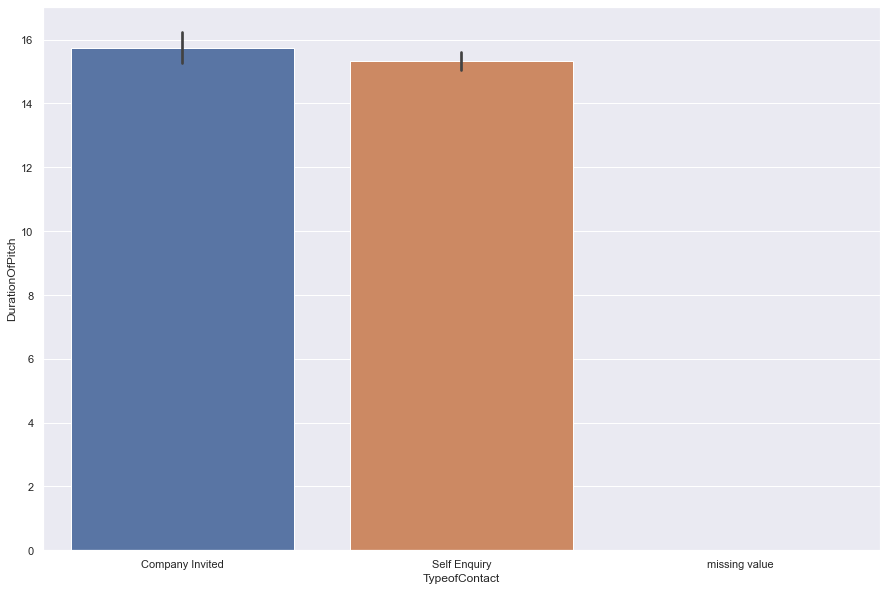

DurationOfPitch by TypeofContact Box Plot


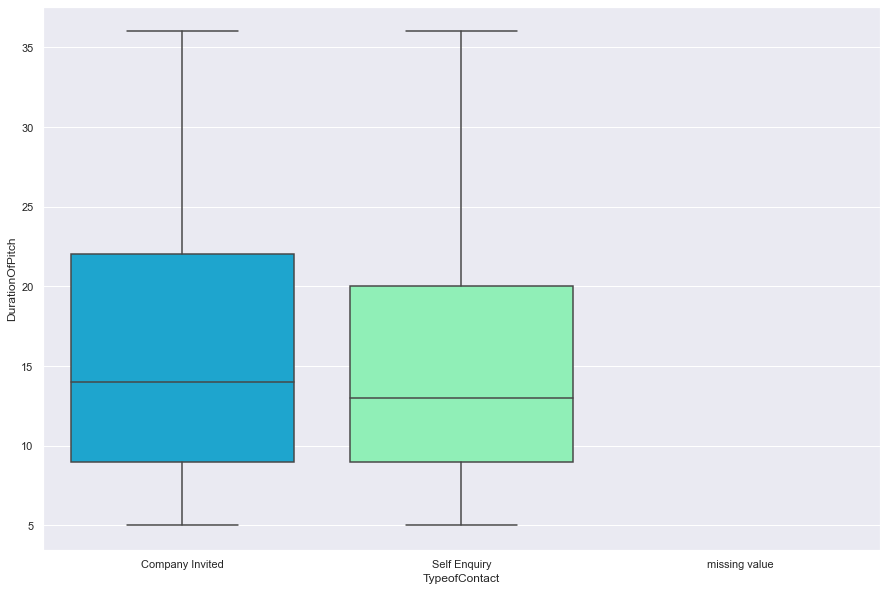

DurationOfPitch by TypeofContact Strip Plot


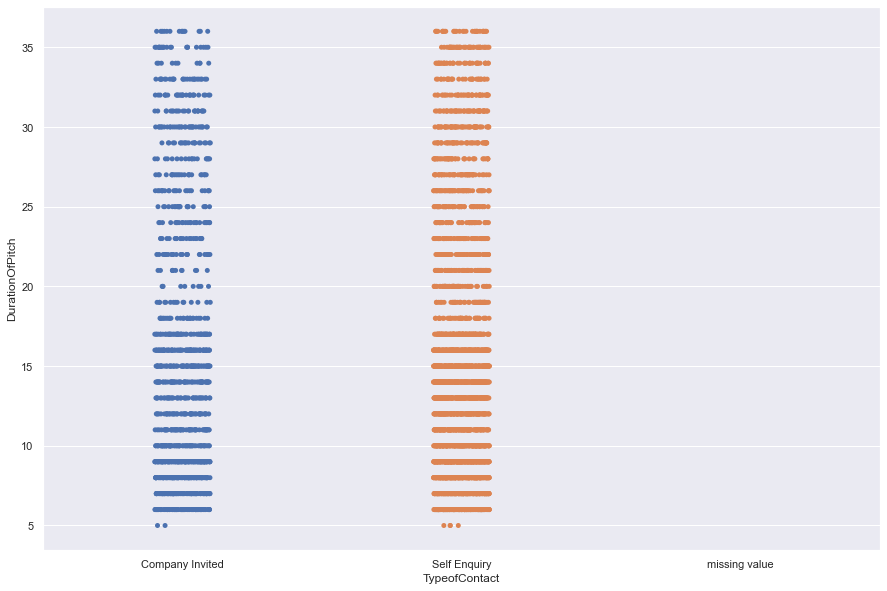

DurationOfPitch by Occupation Bar Plot


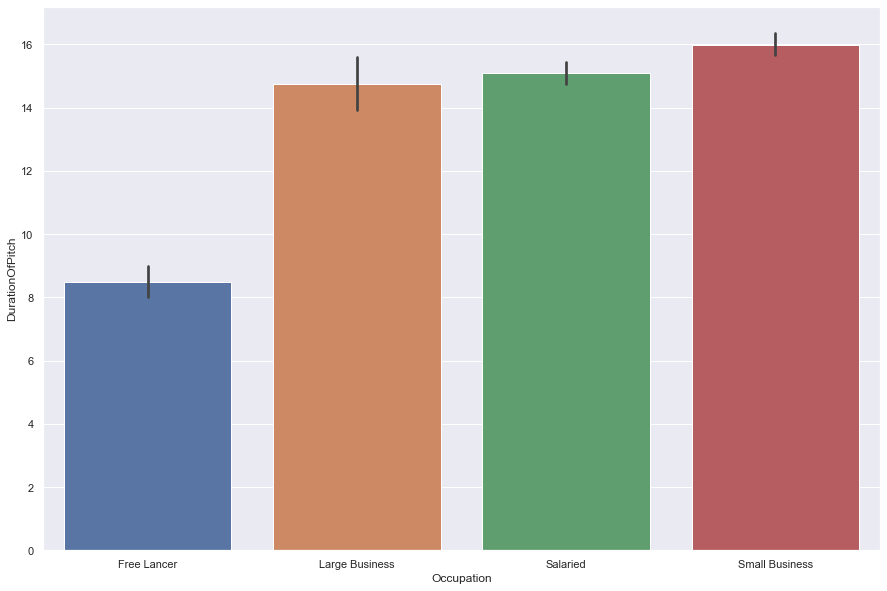

DurationOfPitch by Occupation Box Plot


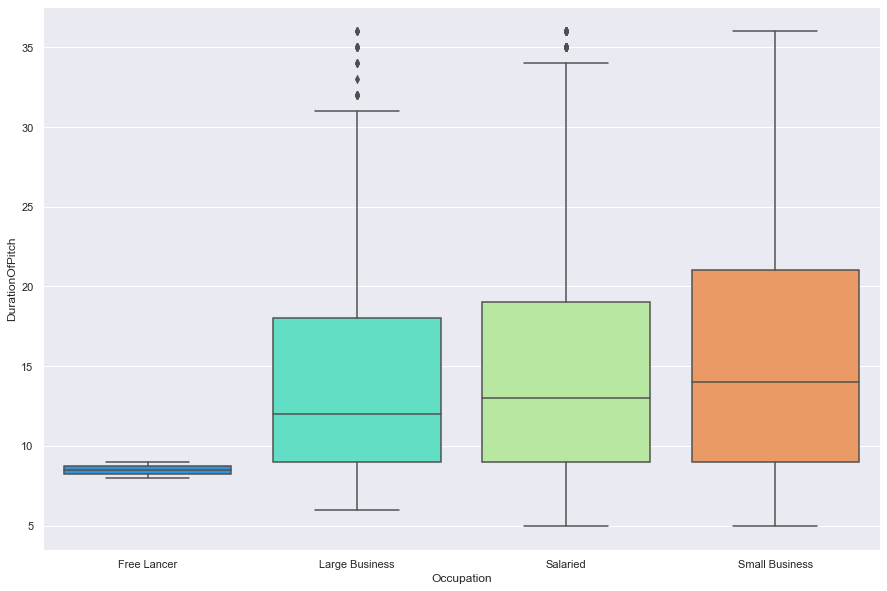

DurationOfPitch by Occupation Strip Plot


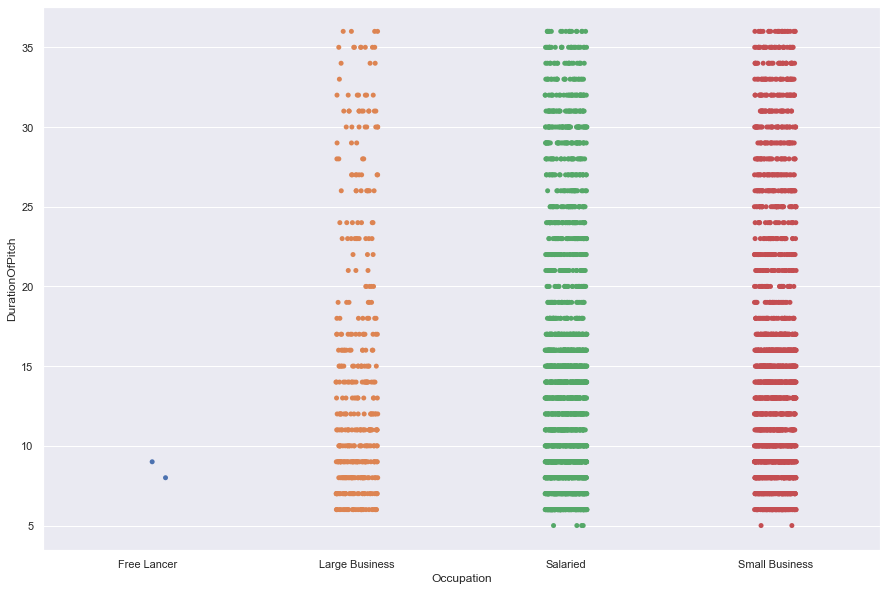

DurationOfPitch by Gender Bar Plot


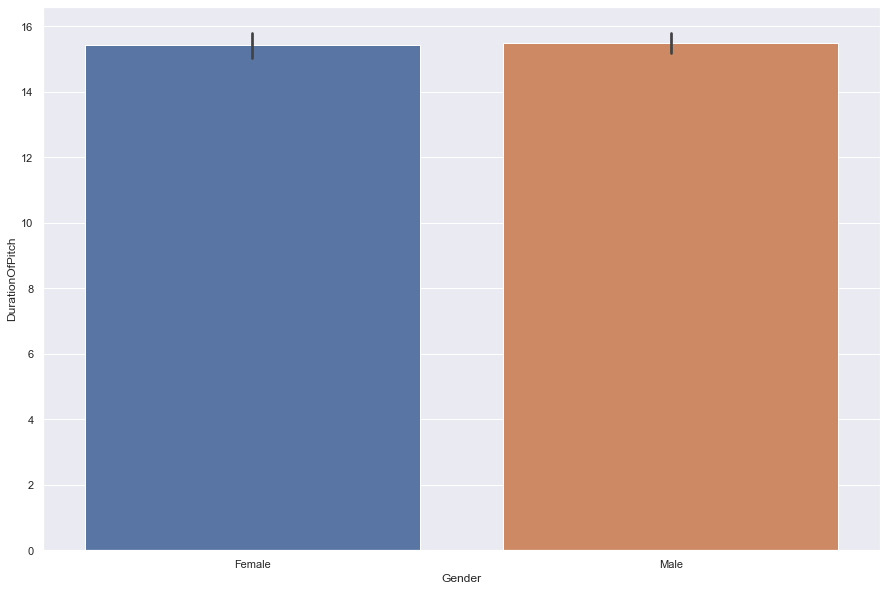

DurationOfPitch by Gender Box Plot


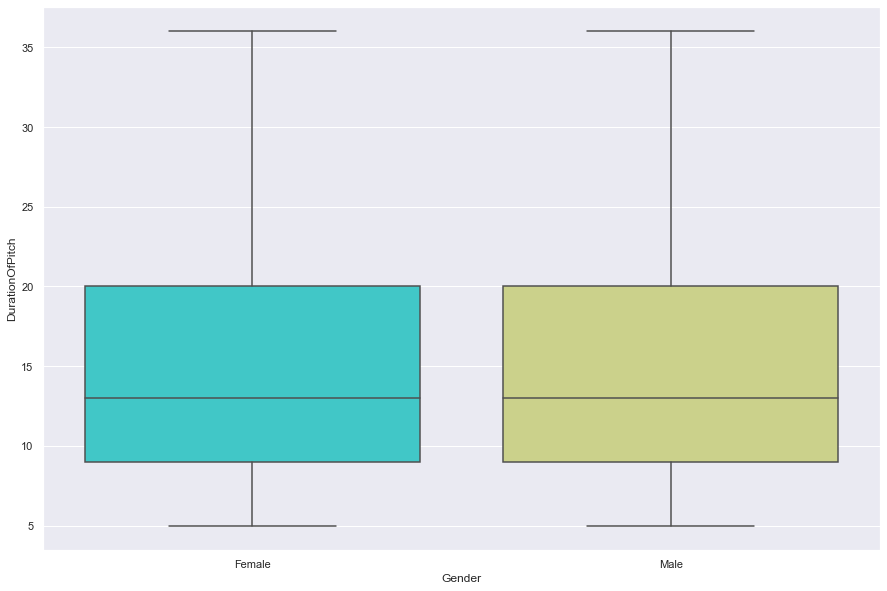

DurationOfPitch by Gender Strip Plot


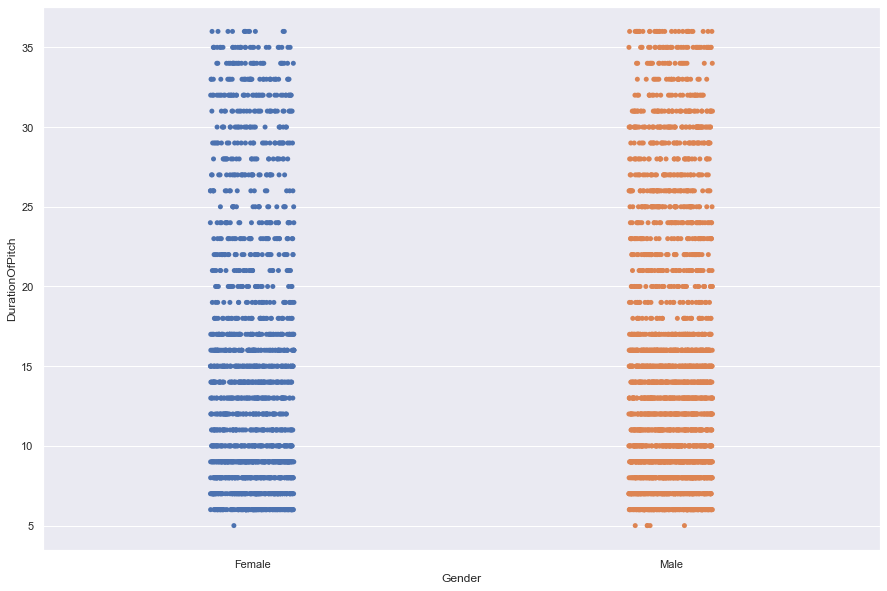

DurationOfPitch by ProductPitched Bar Plot


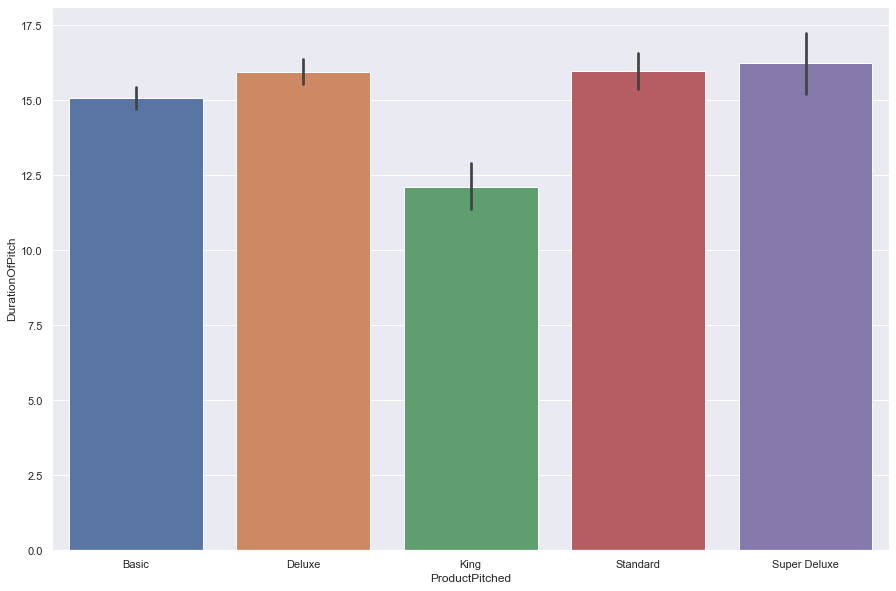

DurationOfPitch by ProductPitched Box Plot


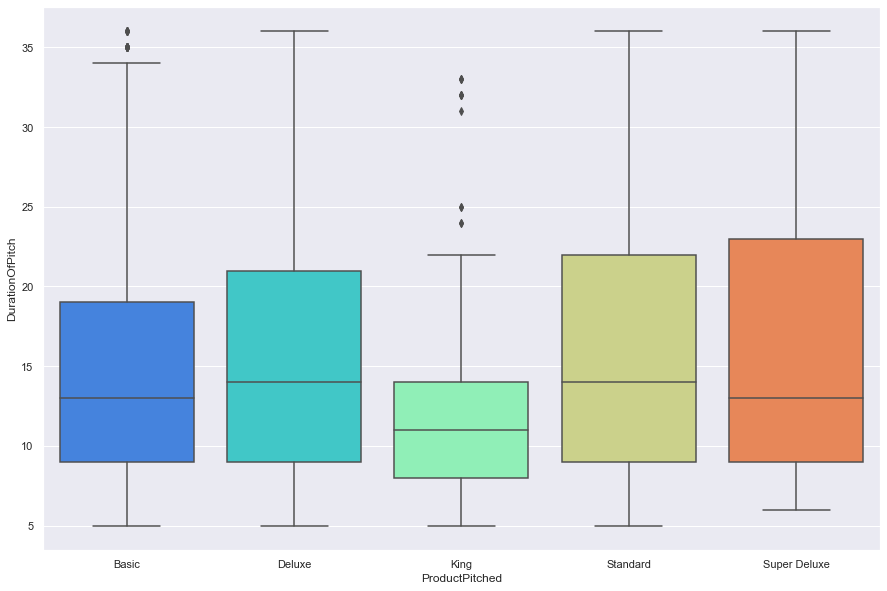

DurationOfPitch by ProductPitched Strip Plot


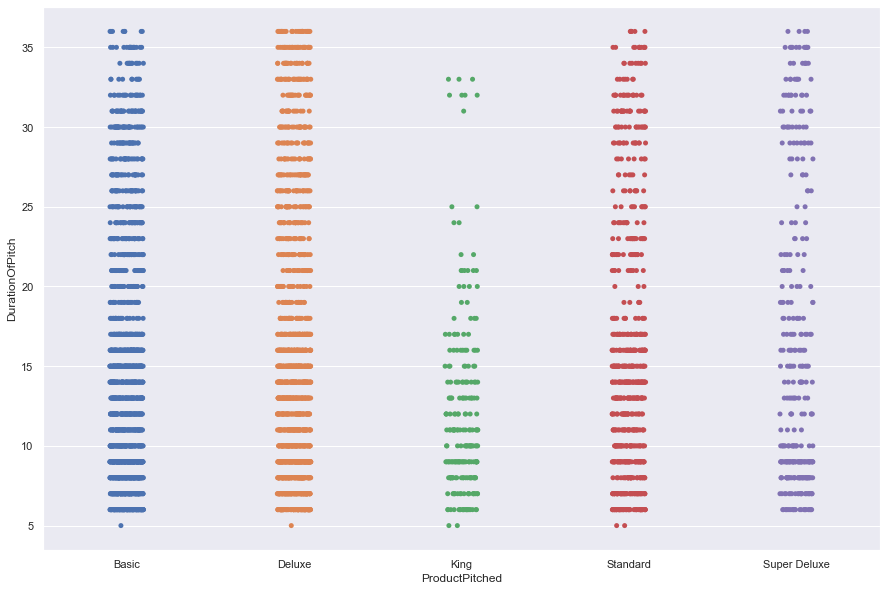

DurationOfPitch by MaritalStatus Bar Plot


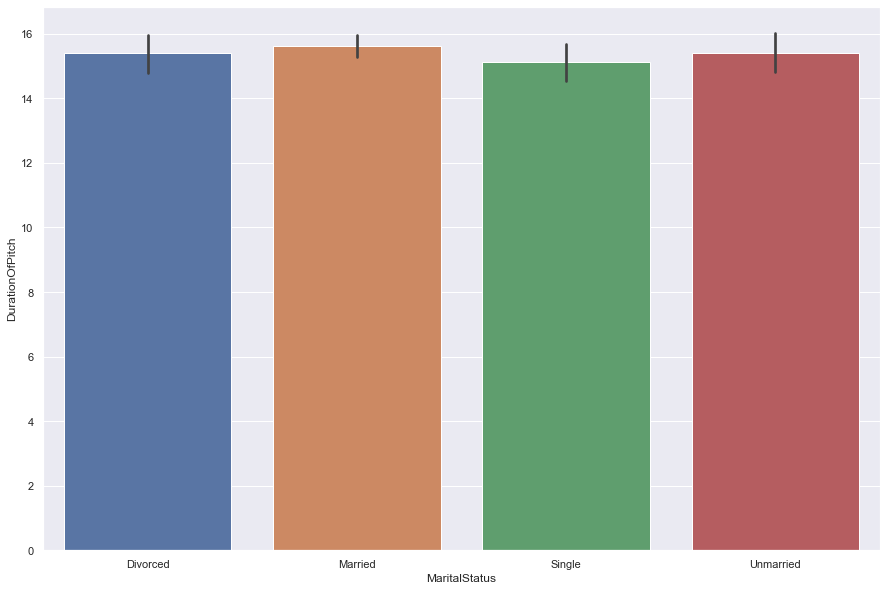

DurationOfPitch by MaritalStatus Box Plot


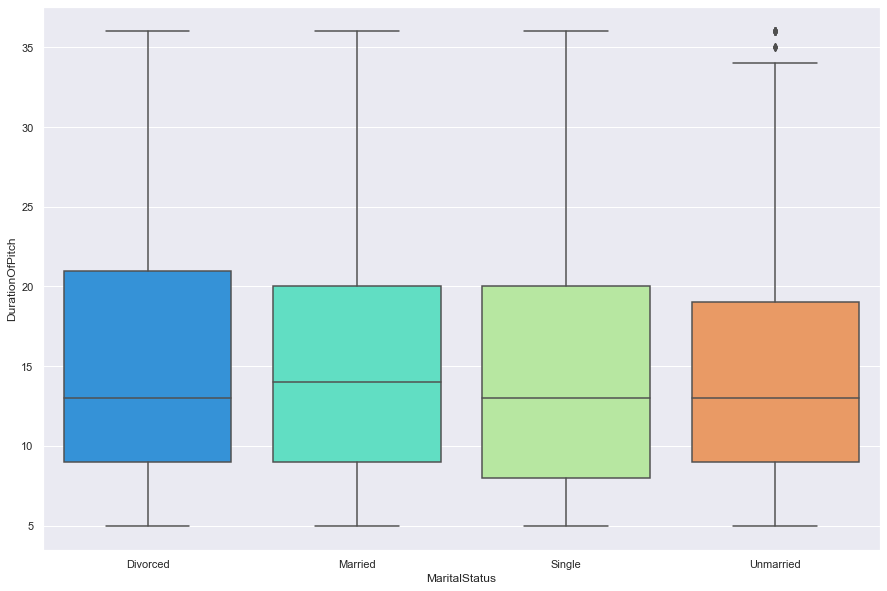

DurationOfPitch by MaritalStatus Strip Plot


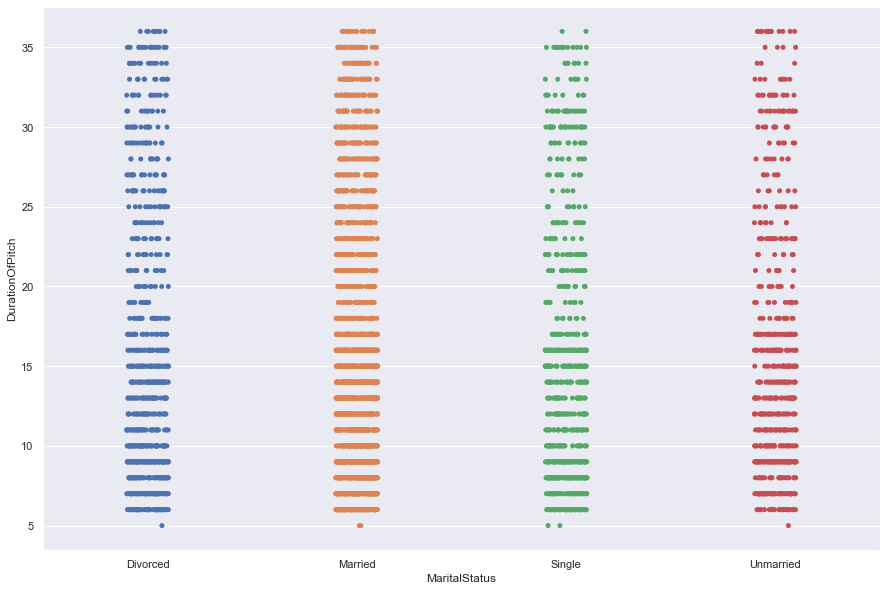

DurationOfPitch by Designation Bar Plot


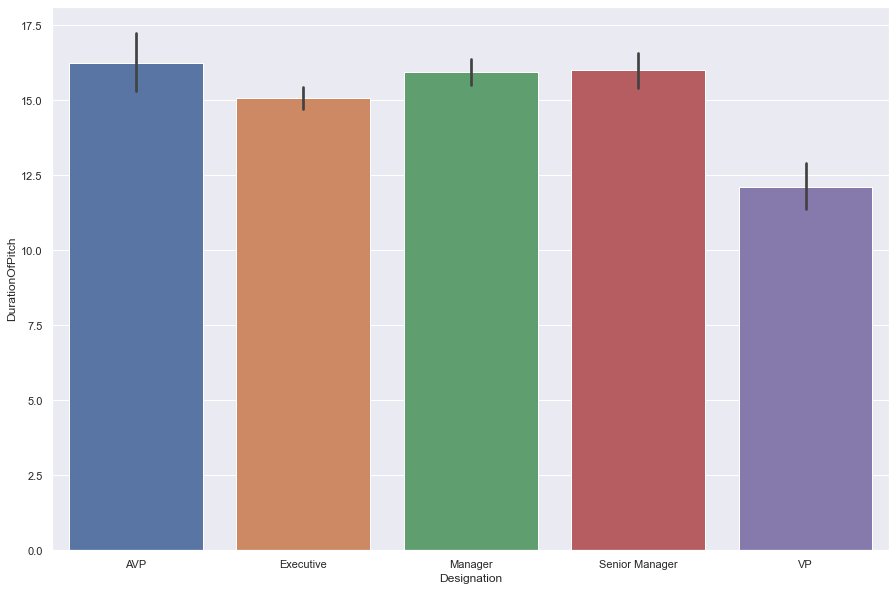

DurationOfPitch by Designation Box Plot


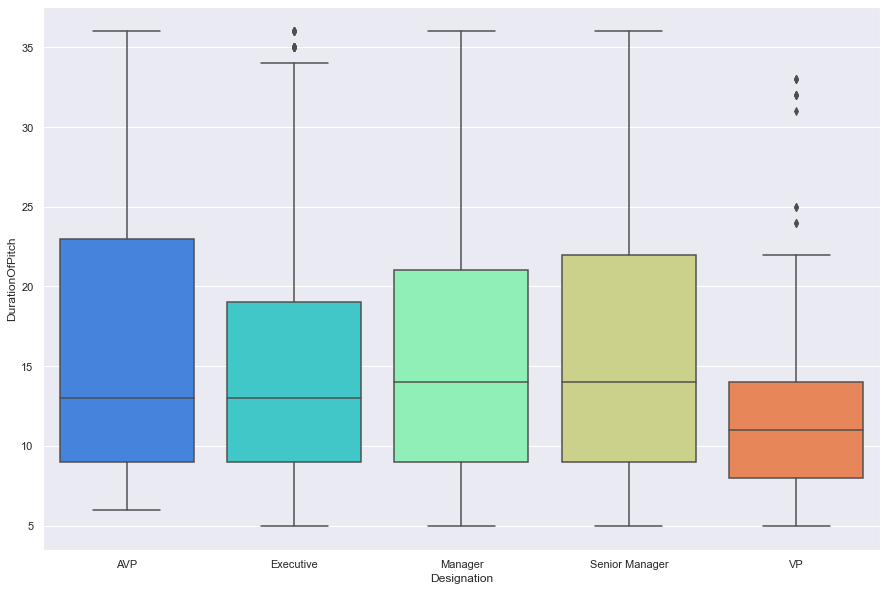

DurationOfPitch by Designation Strip Plot


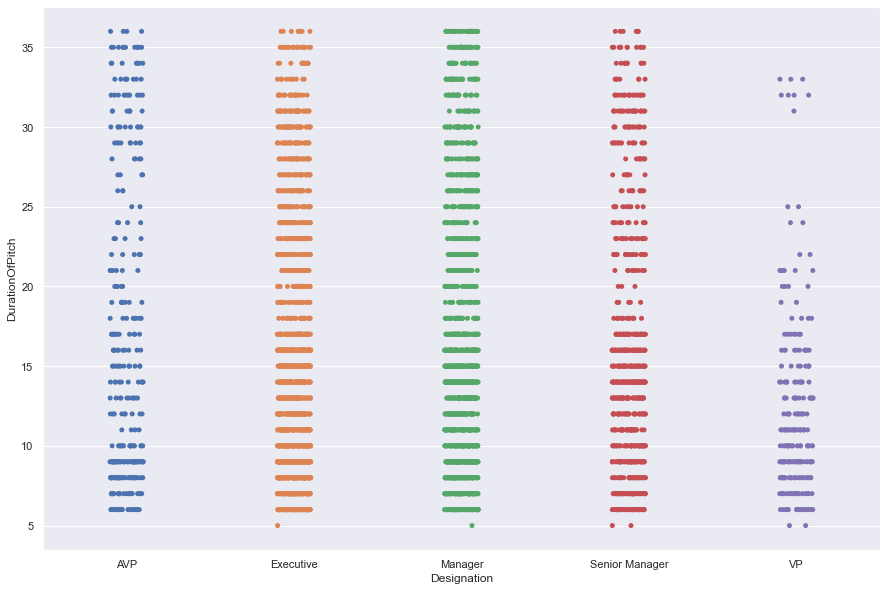

NumberOfPersonVisiting by TypeofContact Bar Plot


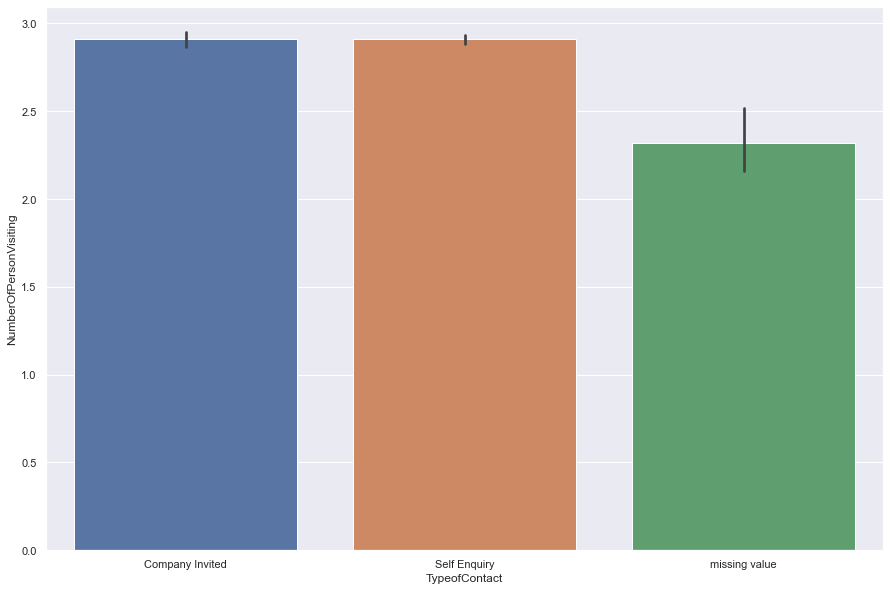

NumberOfPersonVisiting by TypeofContact Box Plot


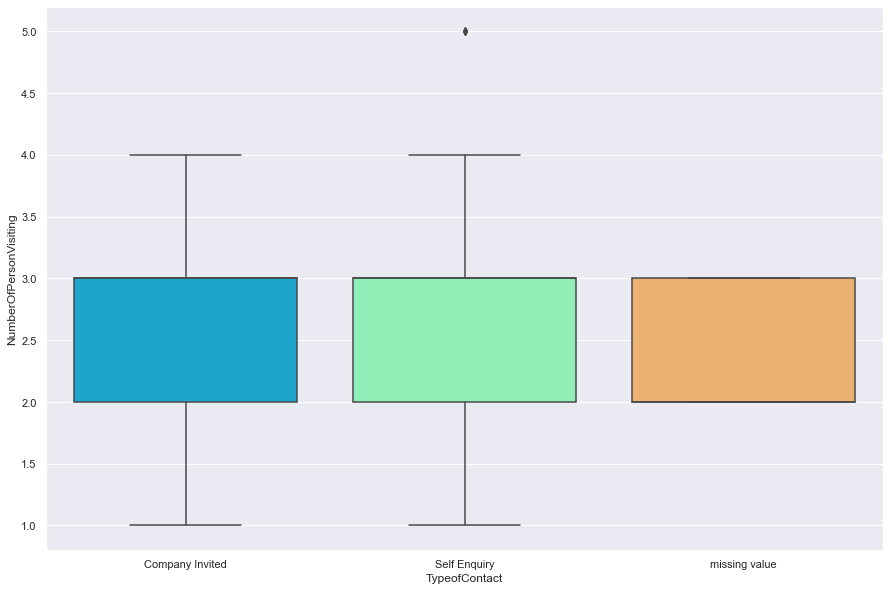

NumberOfPersonVisiting by TypeofContact Strip Plot


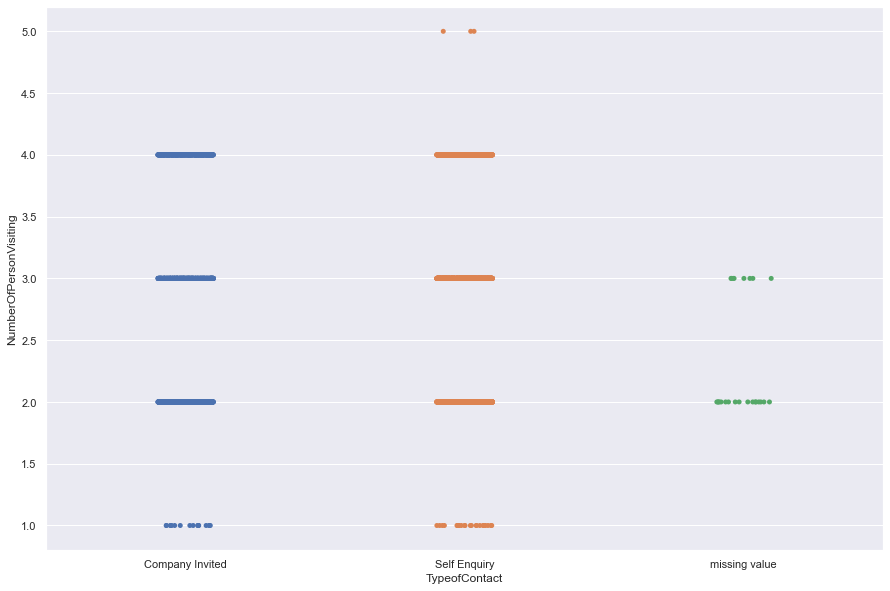

NumberOfPersonVisiting by Occupation Bar Plot


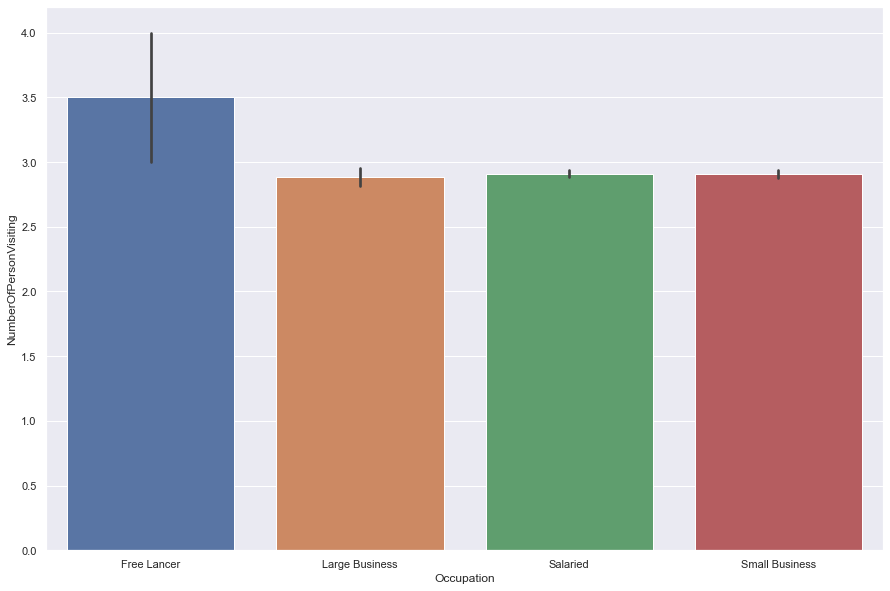

NumberOfPersonVisiting by Occupation Box Plot


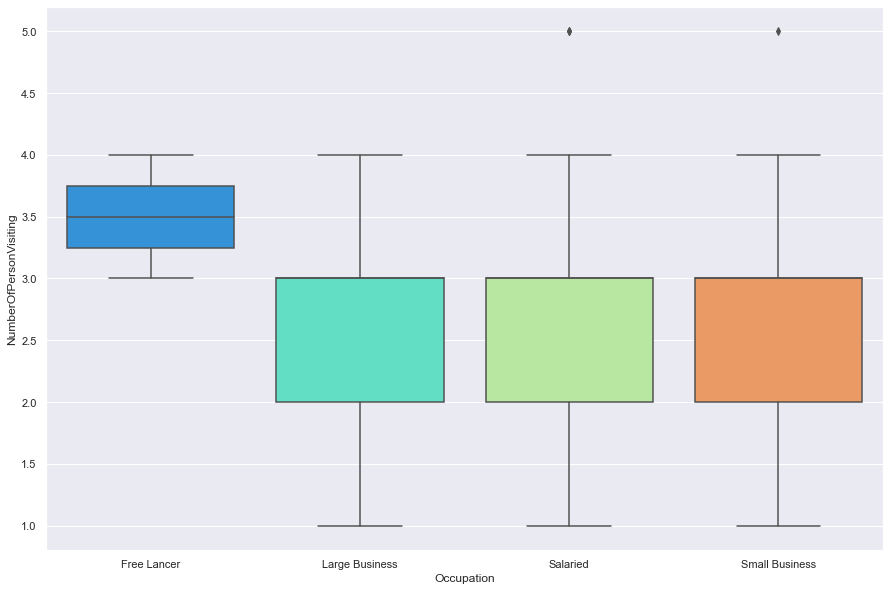

NumberOfPersonVisiting by Occupation Strip Plot


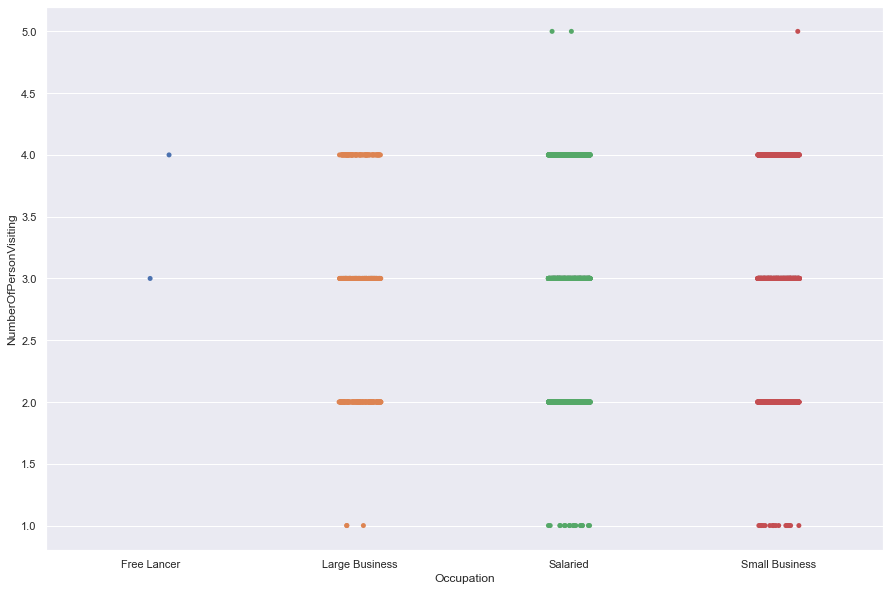

NumberOfPersonVisiting by Gender Bar Plot


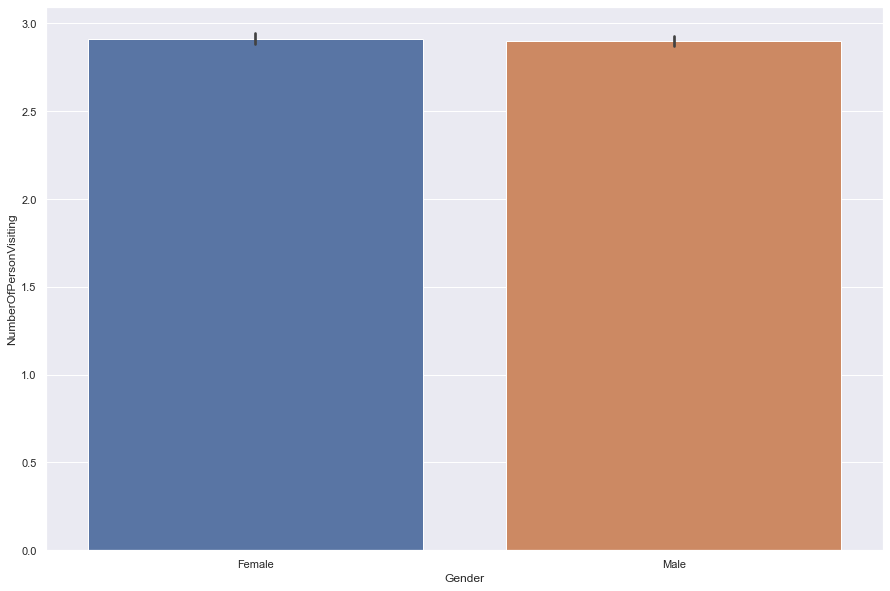

NumberOfPersonVisiting by Gender Box Plot


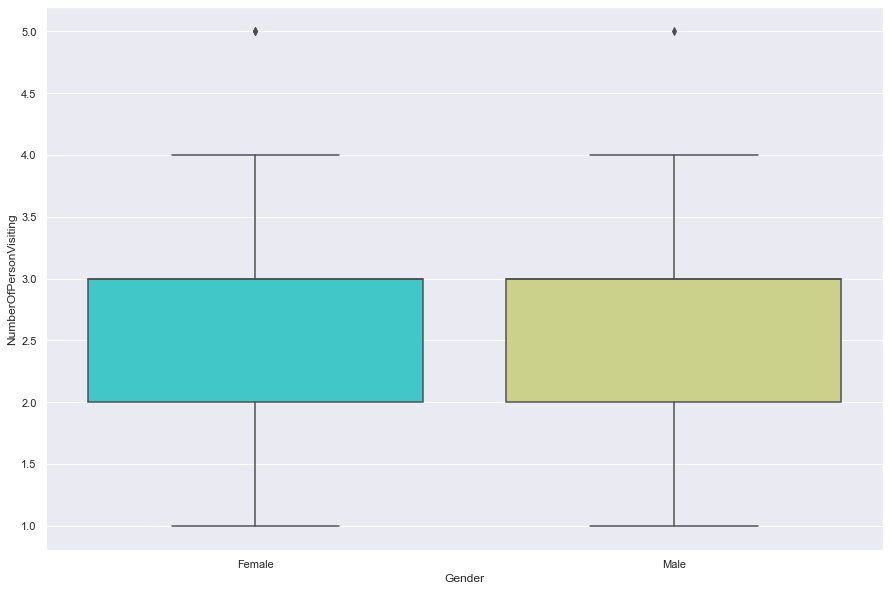

NumberOfPersonVisiting by Gender Strip Plot


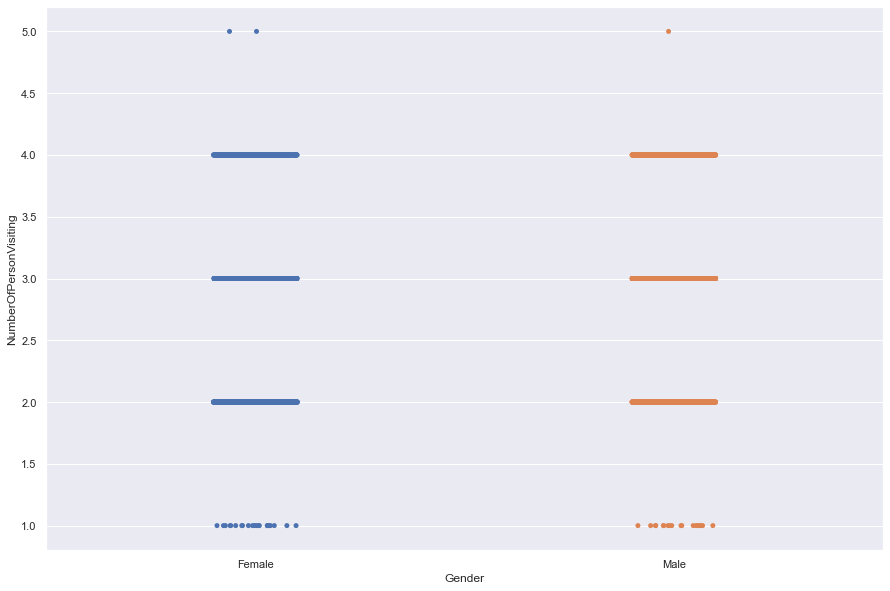

NumberOfPersonVisiting by ProductPitched Bar Plot


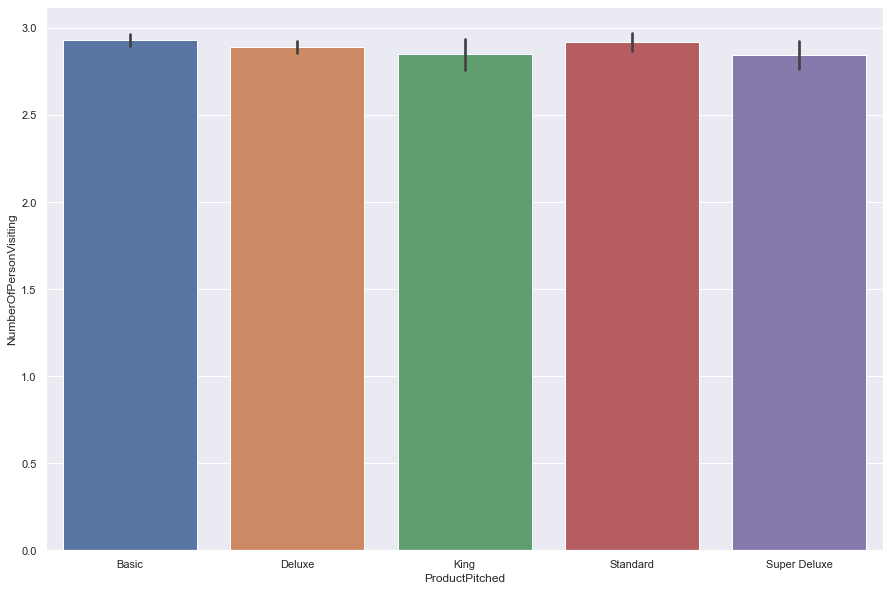

NumberOfPersonVisiting by ProductPitched Box Plot


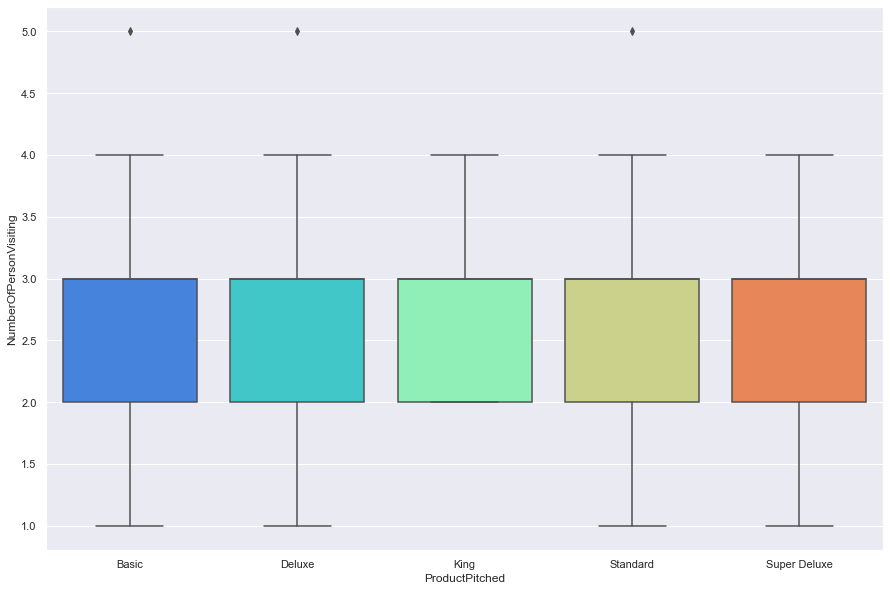

NumberOfPersonVisiting by ProductPitched Strip Plot


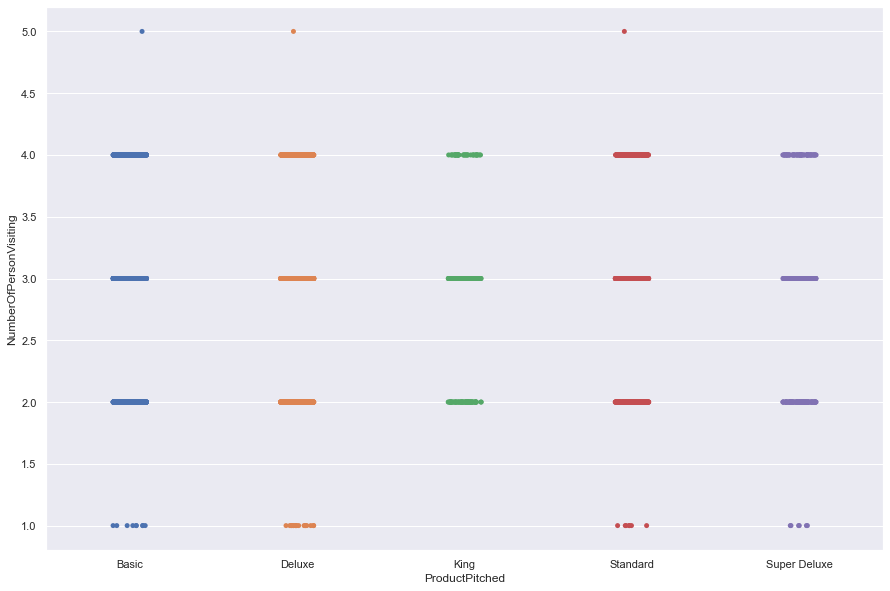

NumberOfPersonVisiting by MaritalStatus Bar Plot


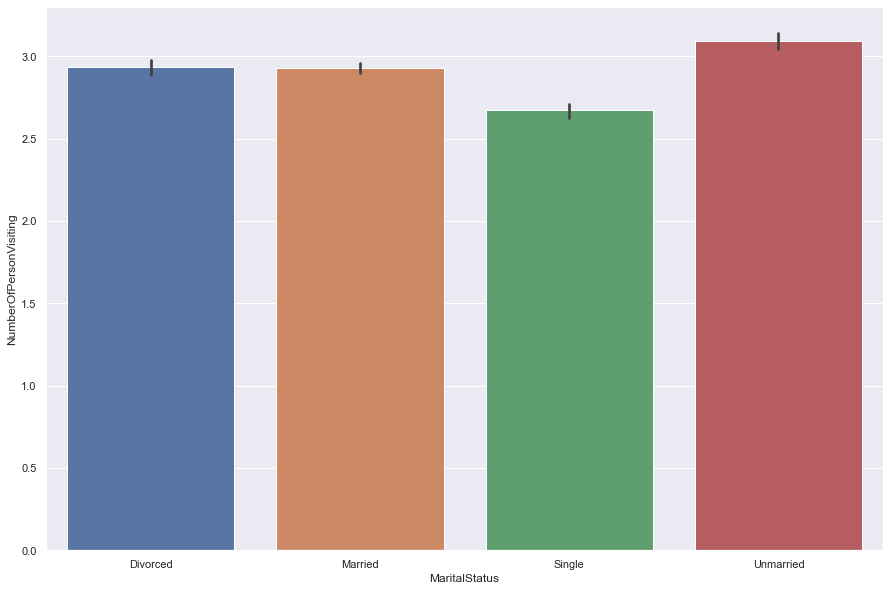

NumberOfPersonVisiting by MaritalStatus Box Plot


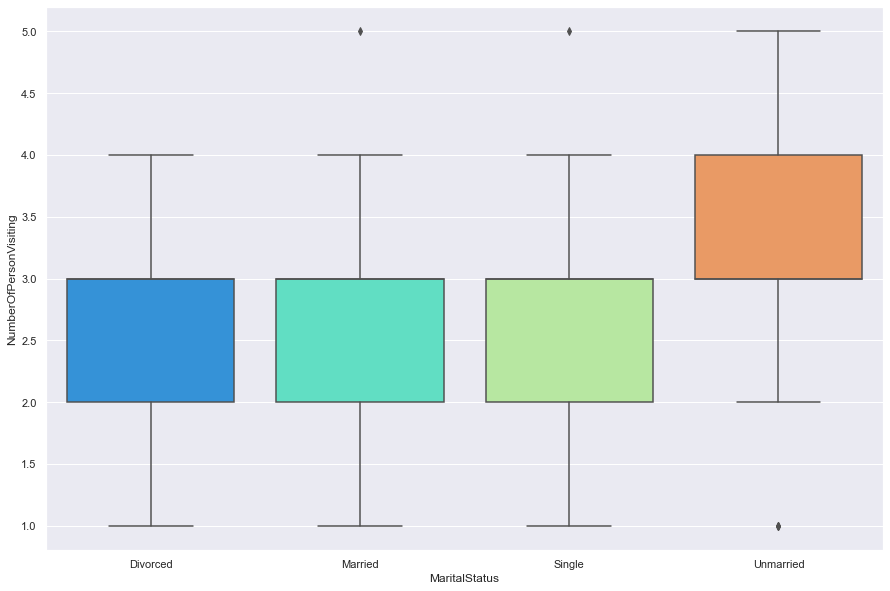

NumberOfPersonVisiting by MaritalStatus Strip Plot


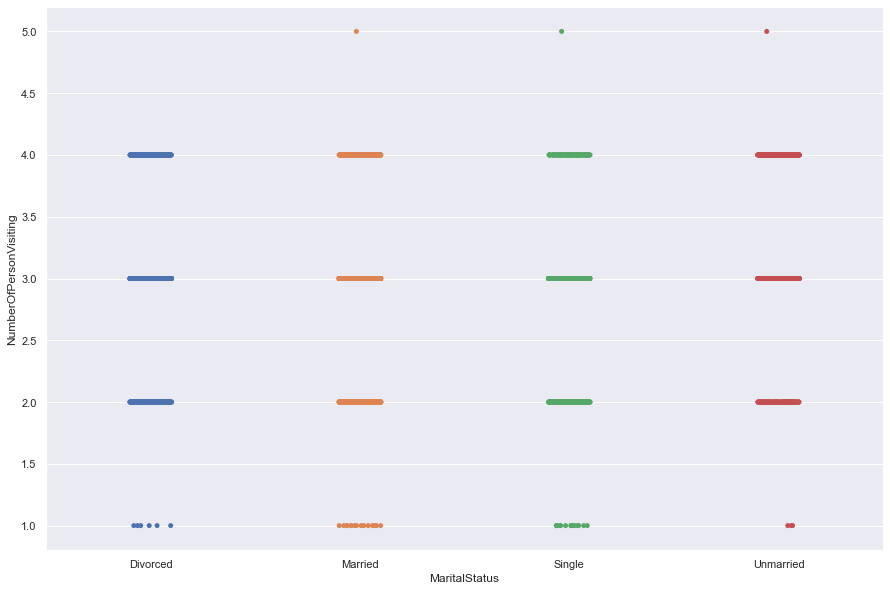

NumberOfPersonVisiting by Designation Bar Plot


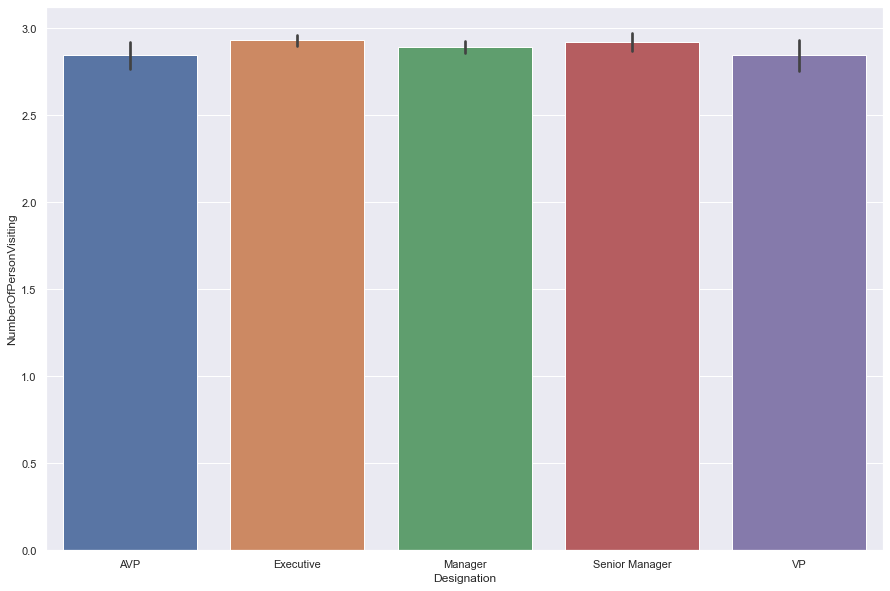

NumberOfPersonVisiting by Designation Box Plot


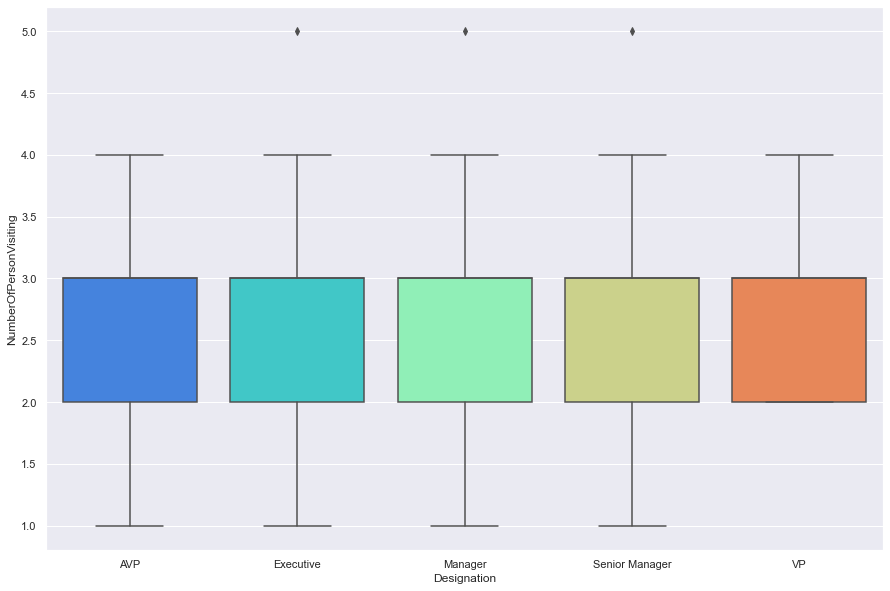

NumberOfPersonVisiting by Designation Strip Plot


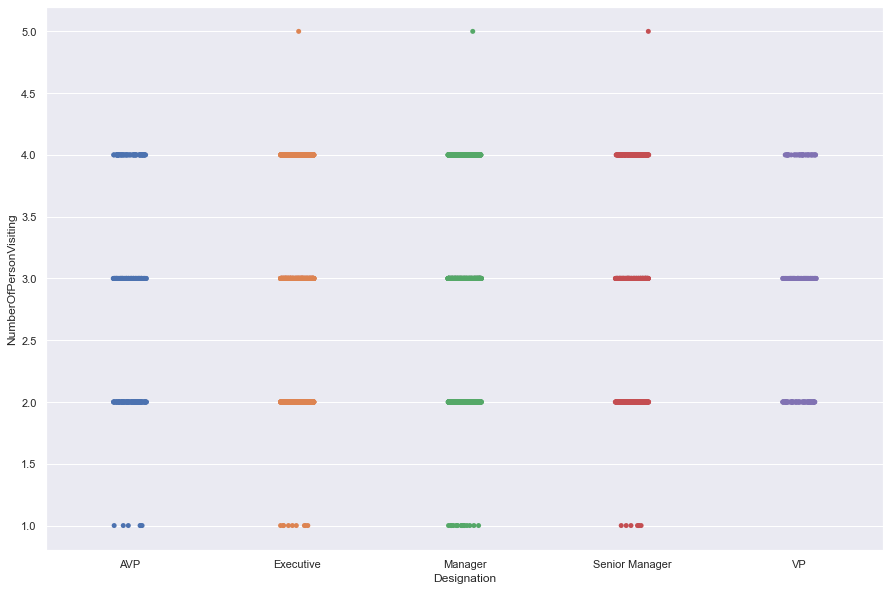

NumberOfFollowups by TypeofContact Bar Plot


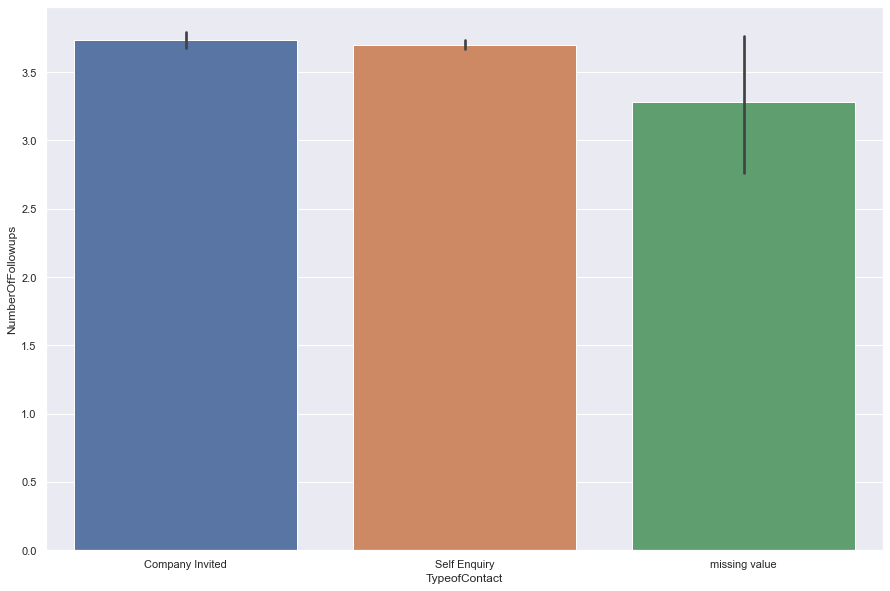

NumberOfFollowups by TypeofContact Box Plot


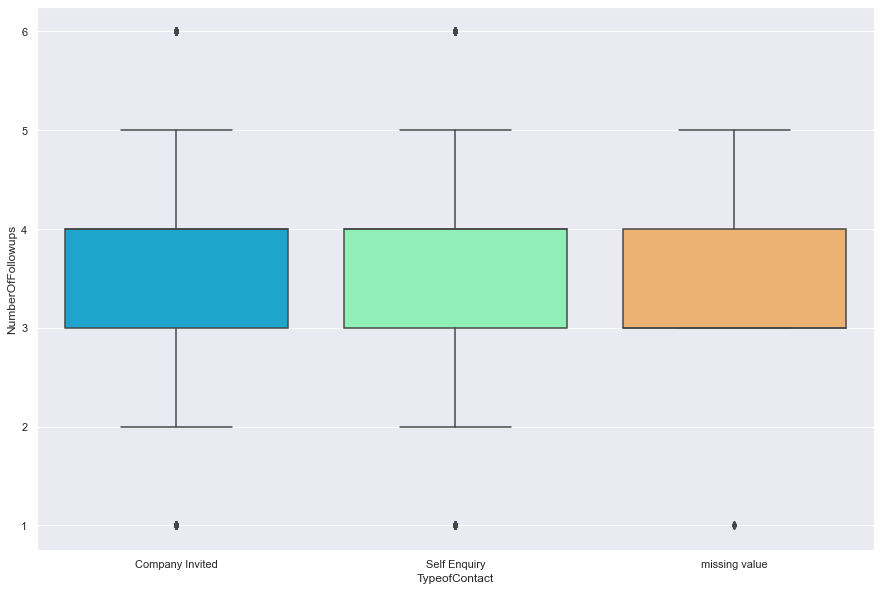

NumberOfFollowups by TypeofContact Strip Plot


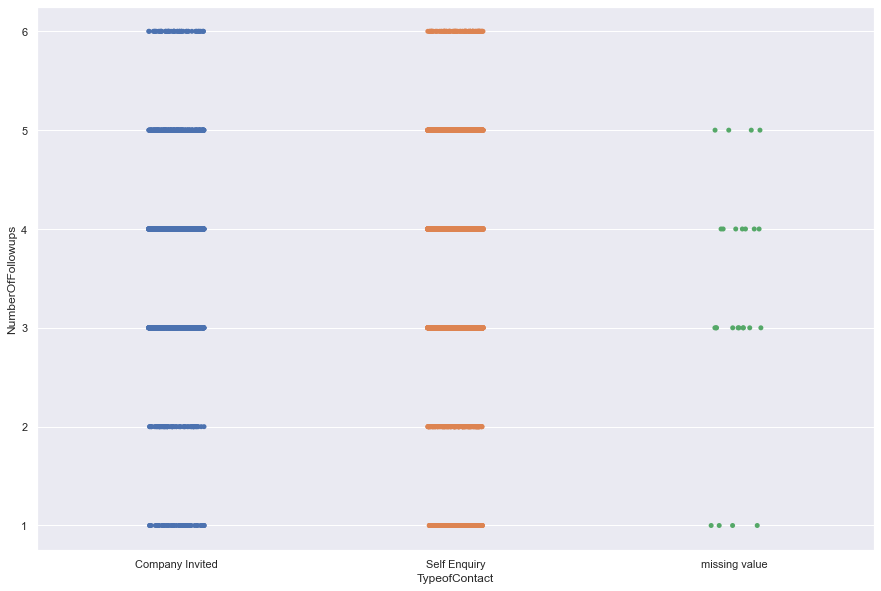

NumberOfFollowups by Occupation Bar Plot


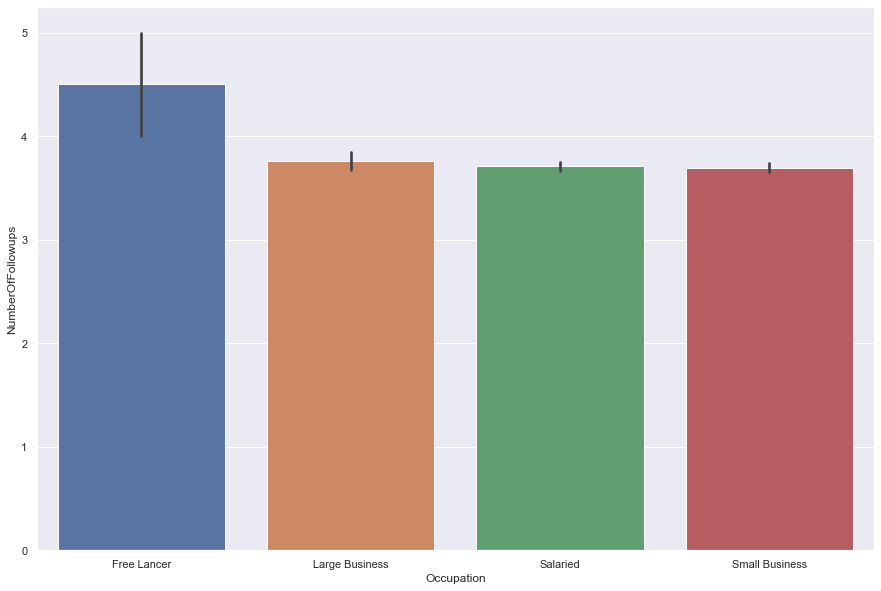

NumberOfFollowups by Occupation Box Plot


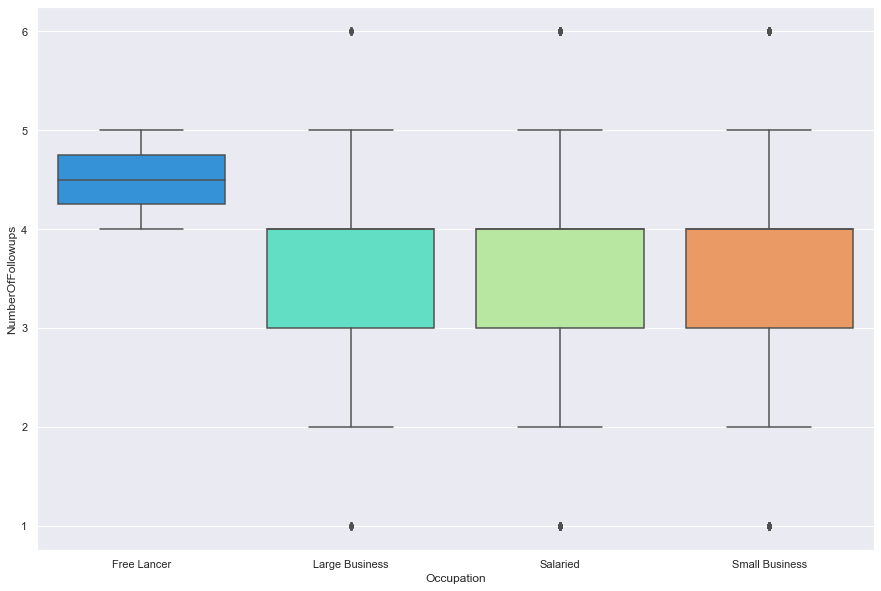

NumberOfFollowups by Occupation Strip Plot


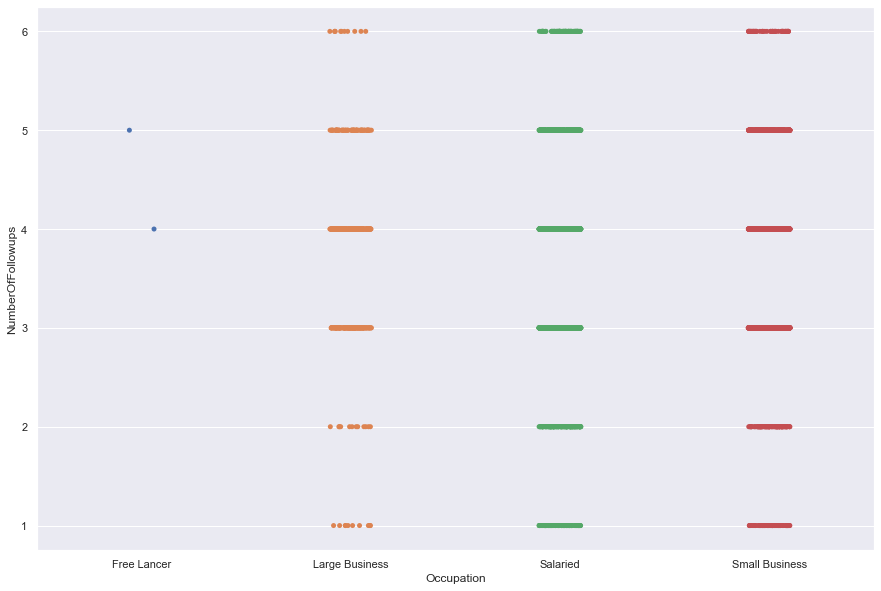

NumberOfFollowups by Gender Bar Plot


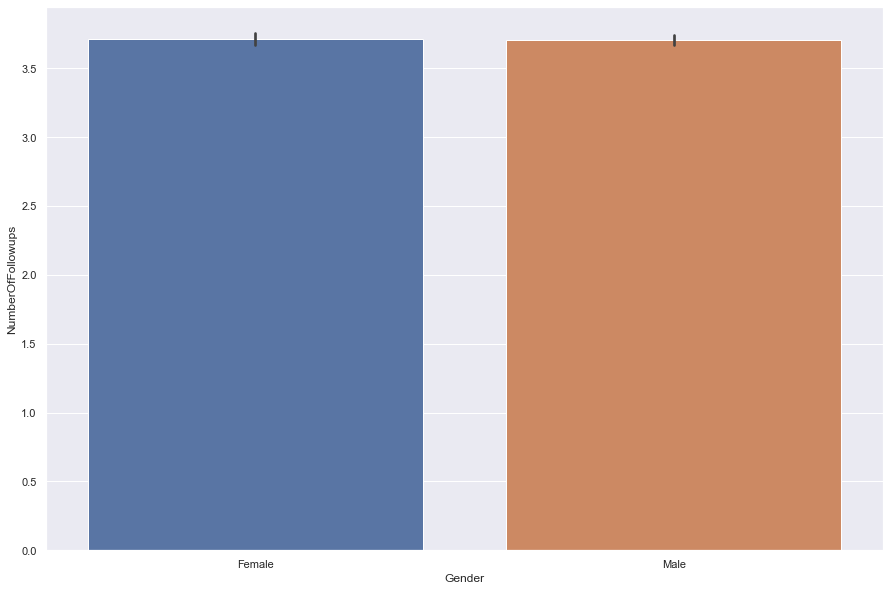

NumberOfFollowups by Gender Box Plot


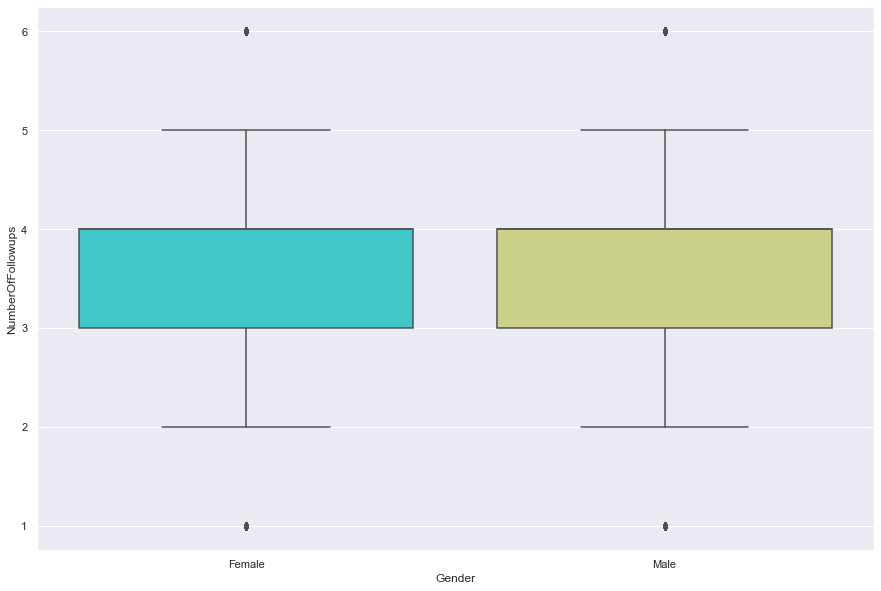

NumberOfFollowups by Gender Strip Plot


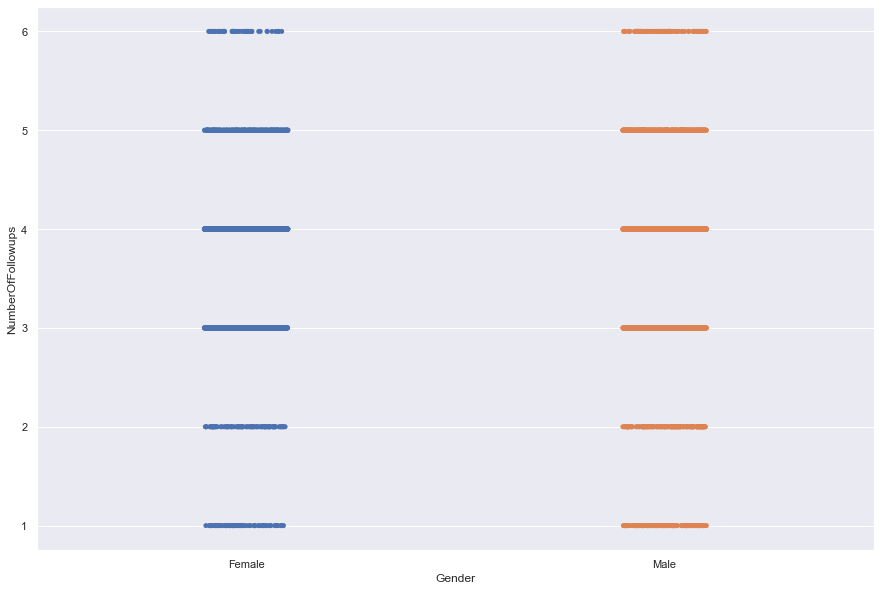

NumberOfFollowups by ProductPitched Bar Plot


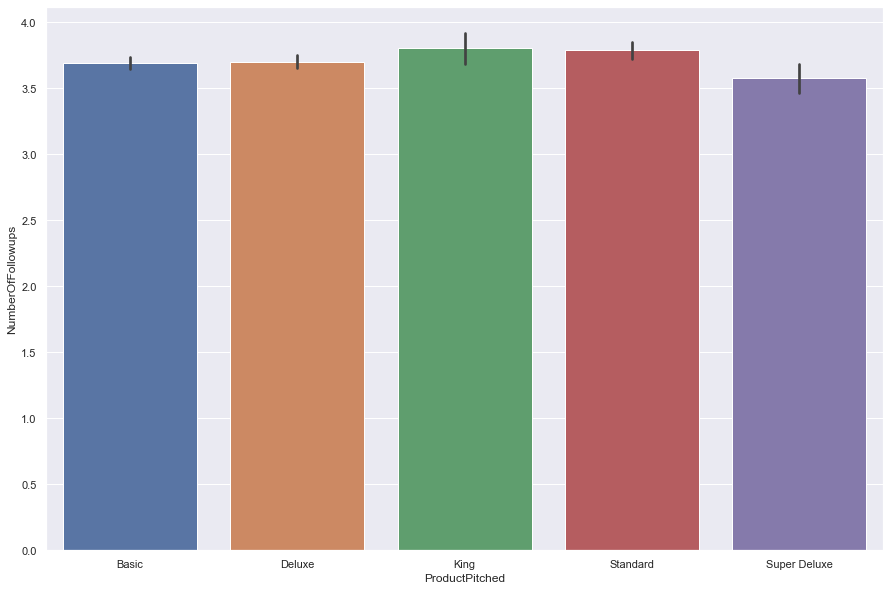

NumberOfFollowups by ProductPitched Box Plot


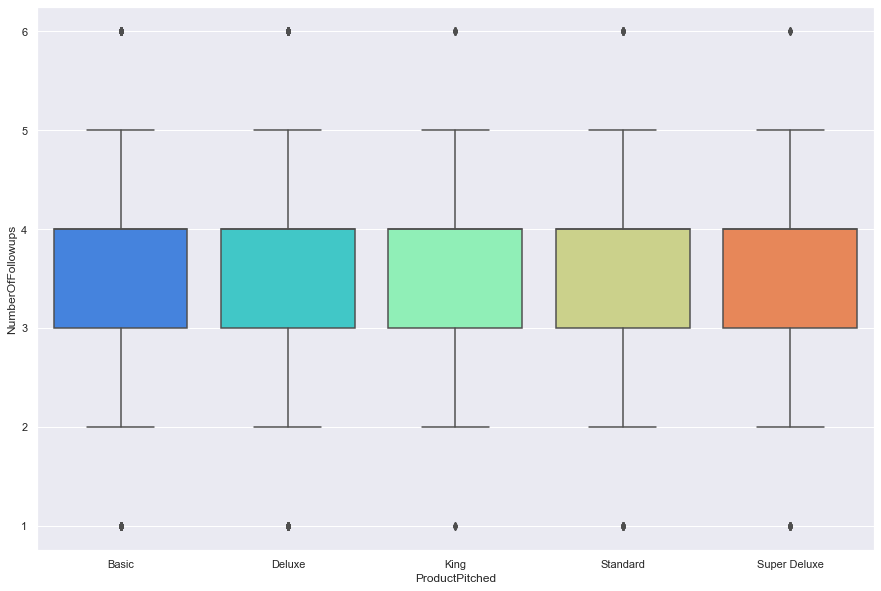

NumberOfFollowups by ProductPitched Strip Plot


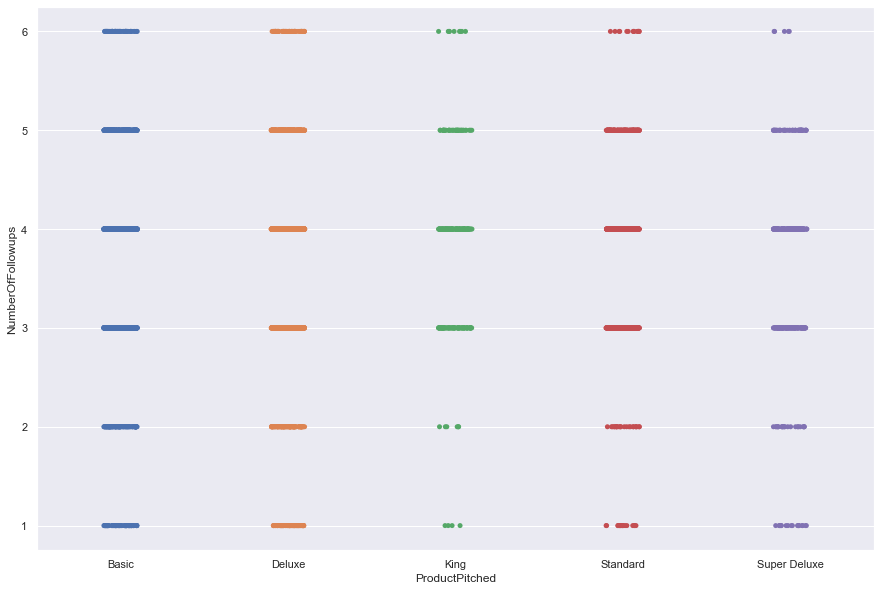

NumberOfFollowups by MaritalStatus Bar Plot


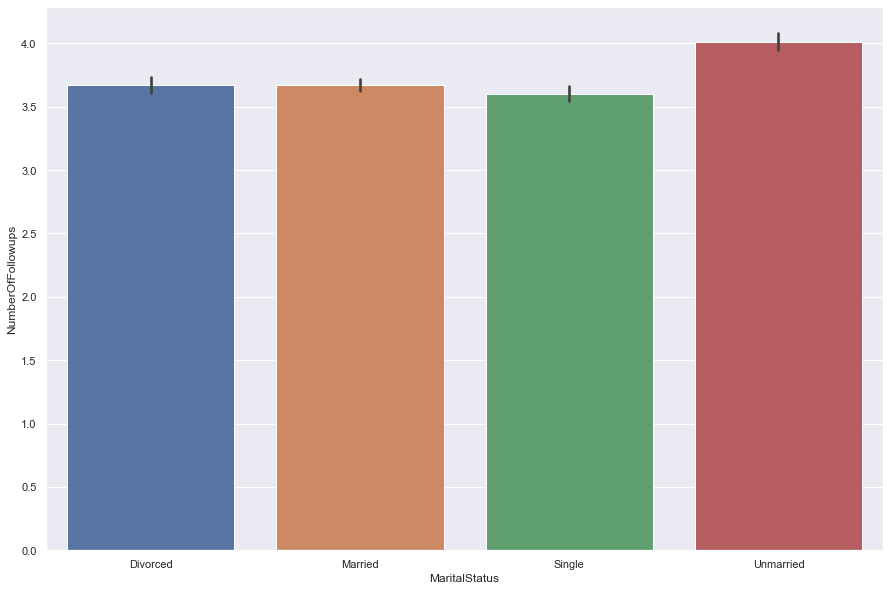

NumberOfFollowups by MaritalStatus Box Plot


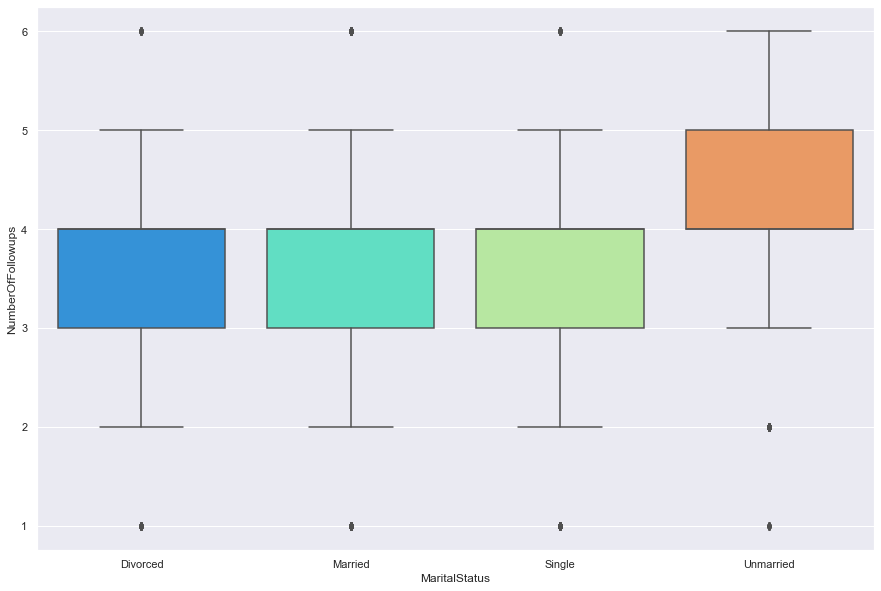

NumberOfFollowups by MaritalStatus Strip Plot


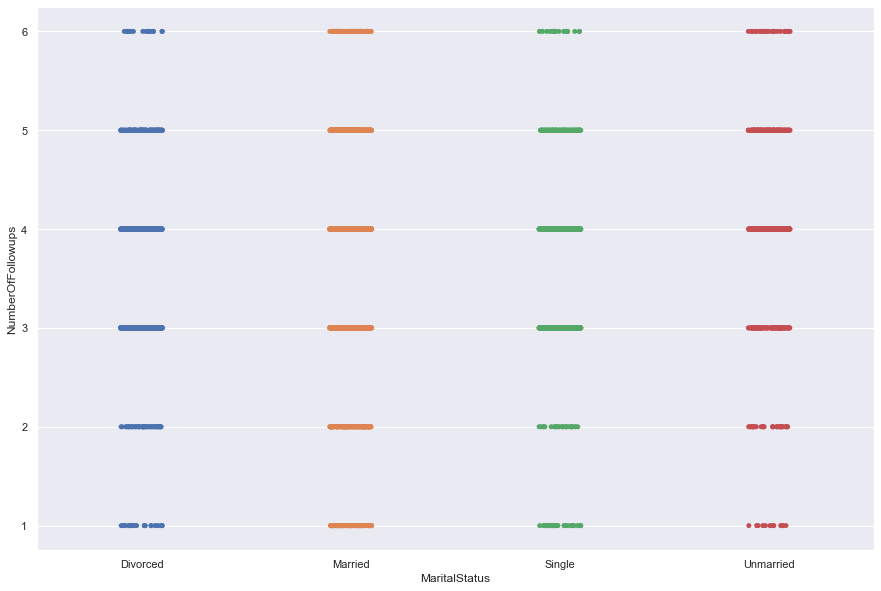

NumberOfFollowups by Designation Bar Plot


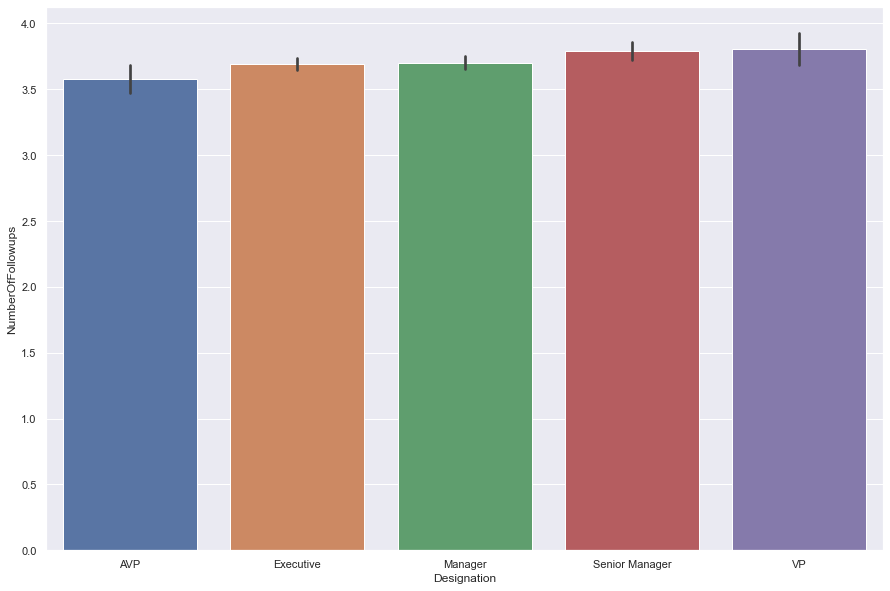

NumberOfFollowups by Designation Box Plot


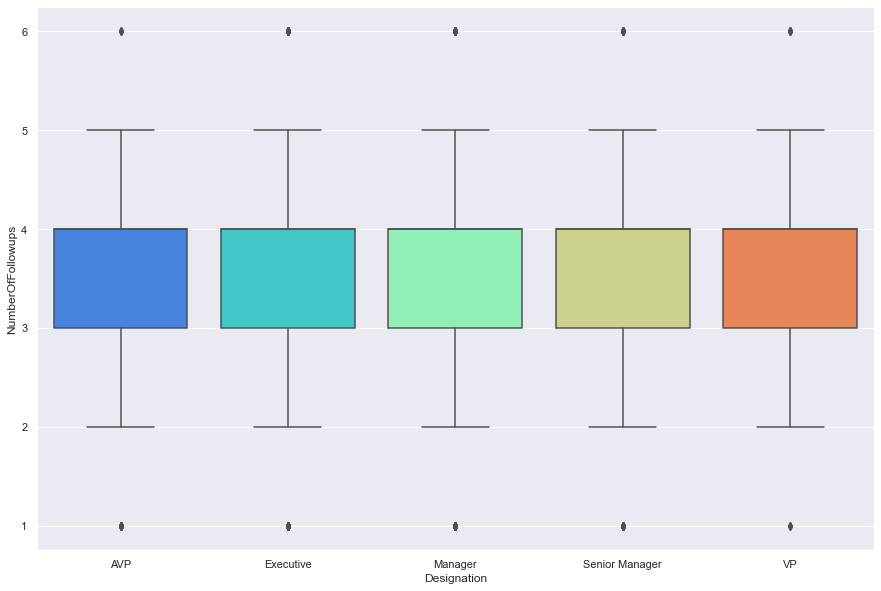

NumberOfFollowups by Designation Strip Plot


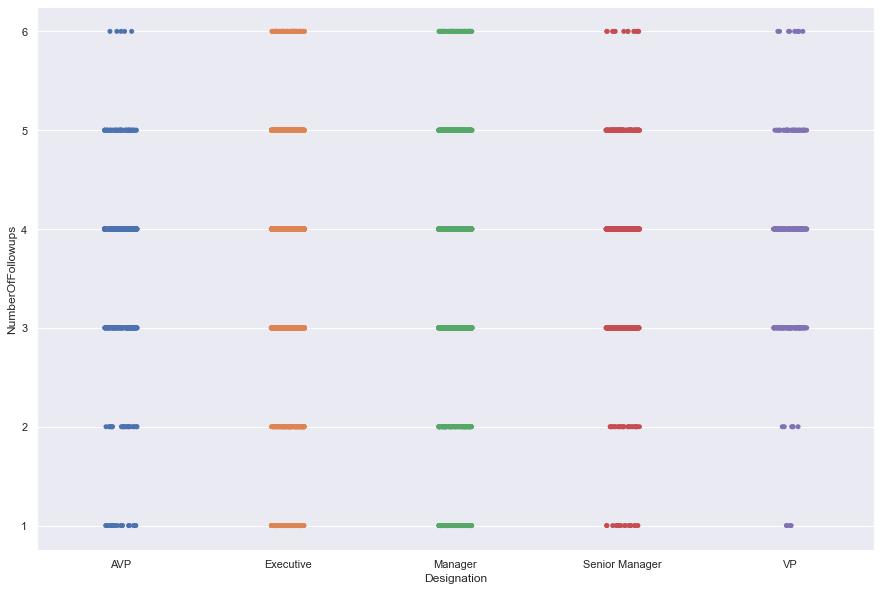

PreferredPropertyStar by TypeofContact Bar Plot


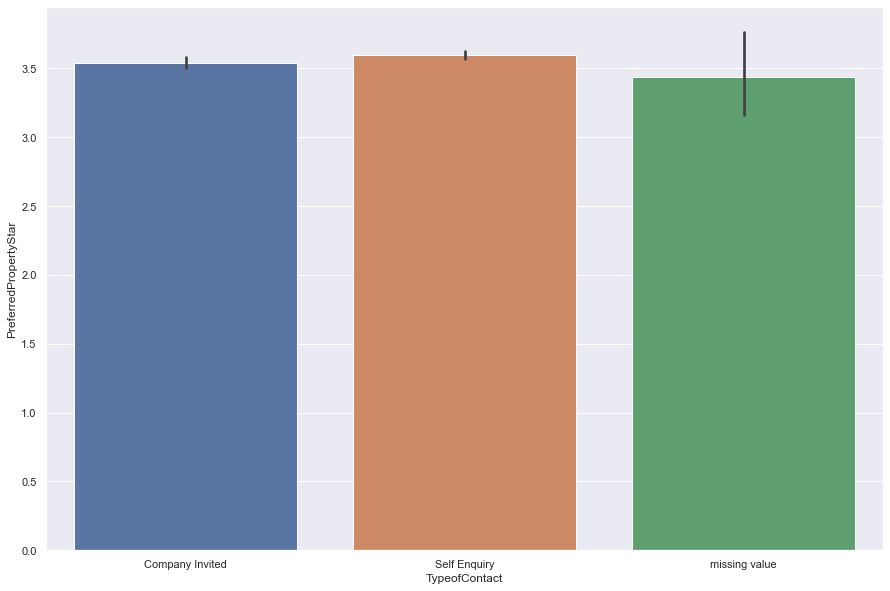

PreferredPropertyStar by TypeofContact Box Plot


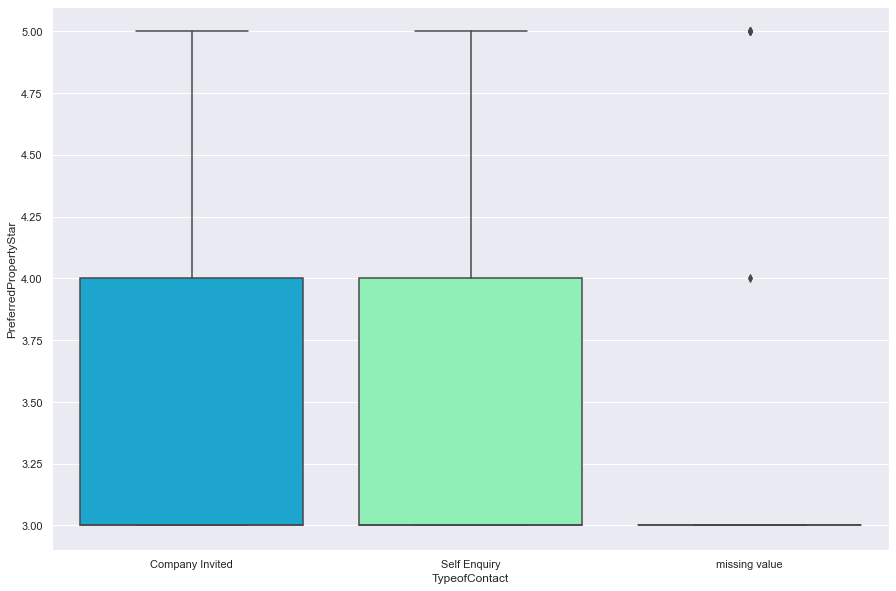

PreferredPropertyStar by TypeofContact Strip Plot


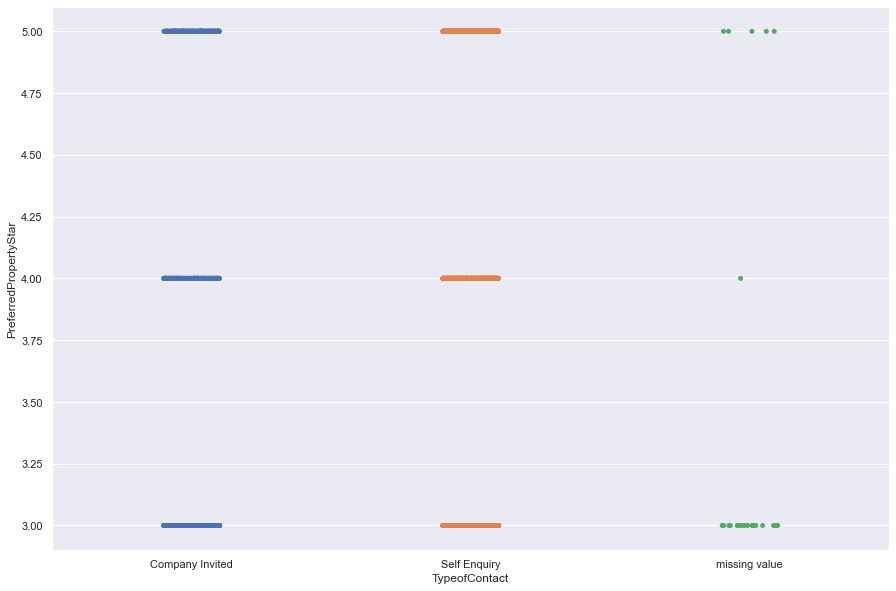

PreferredPropertyStar by Occupation Bar Plot


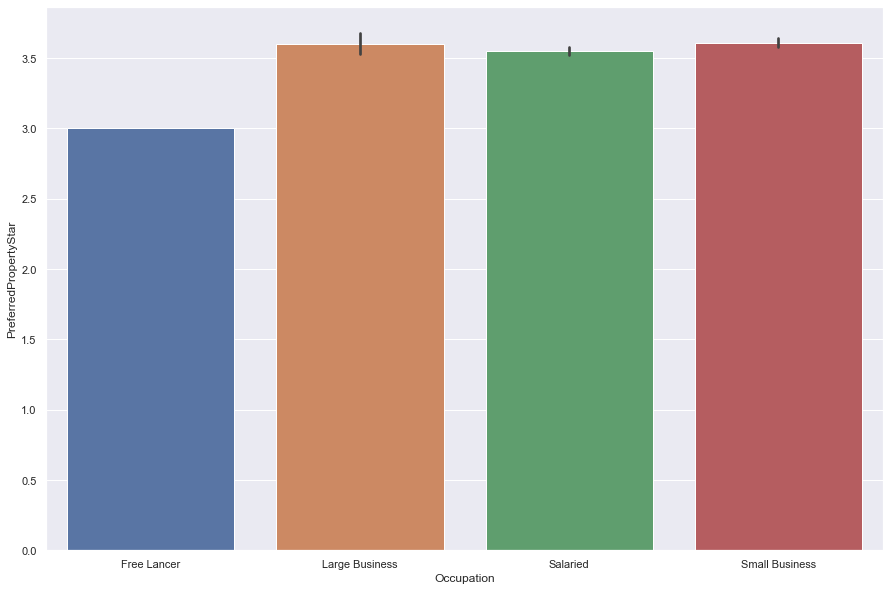

PreferredPropertyStar by Occupation Box Plot


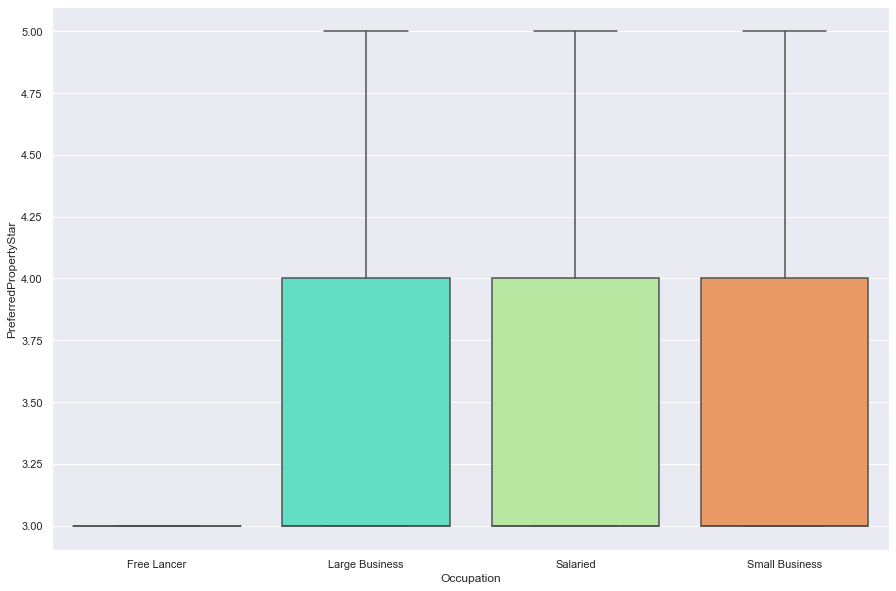

PreferredPropertyStar by Occupation Strip Plot


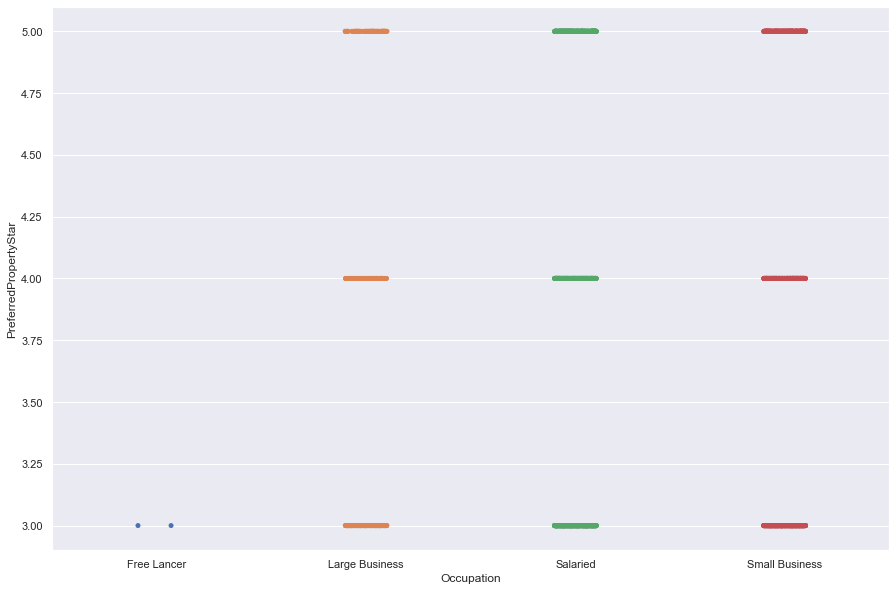

PreferredPropertyStar by Gender Bar Plot


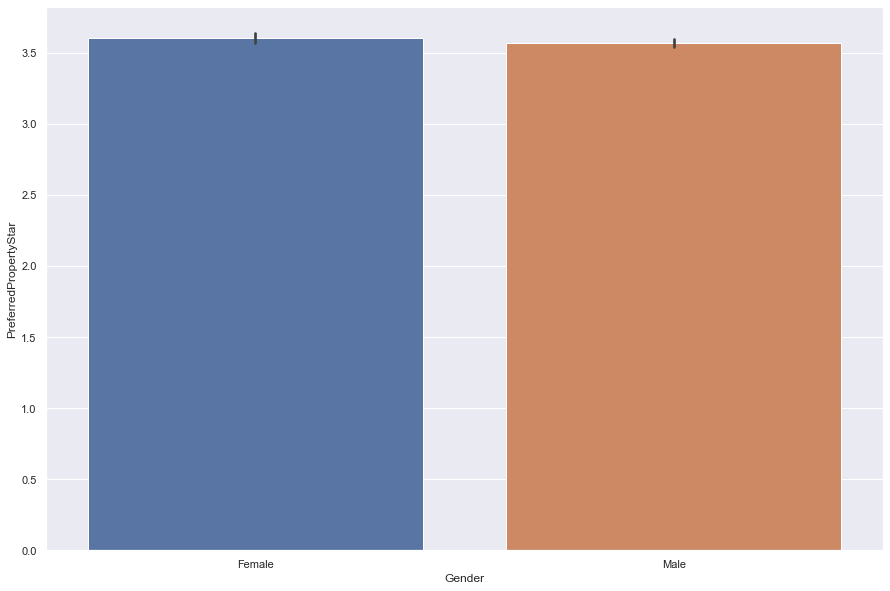

PreferredPropertyStar by Gender Box Plot


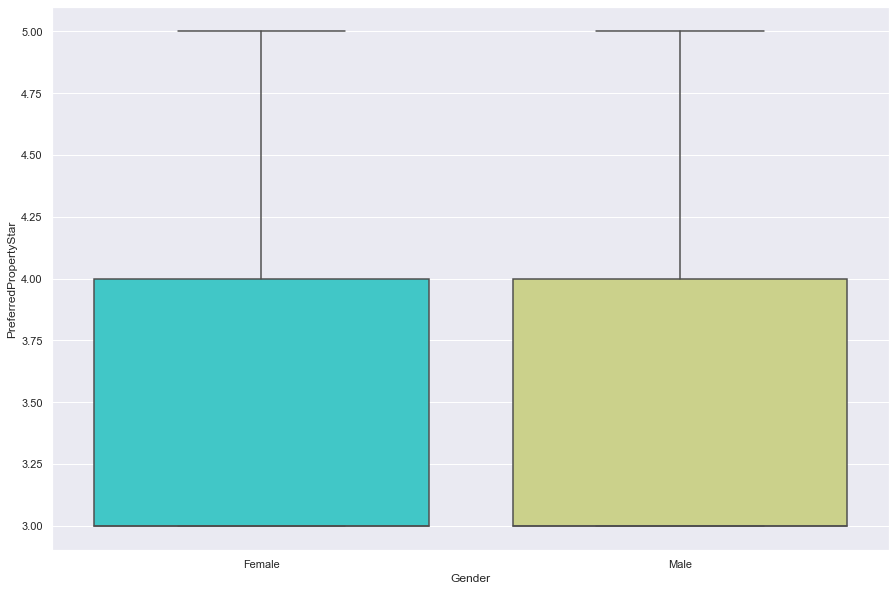

PreferredPropertyStar by Gender Strip Plot


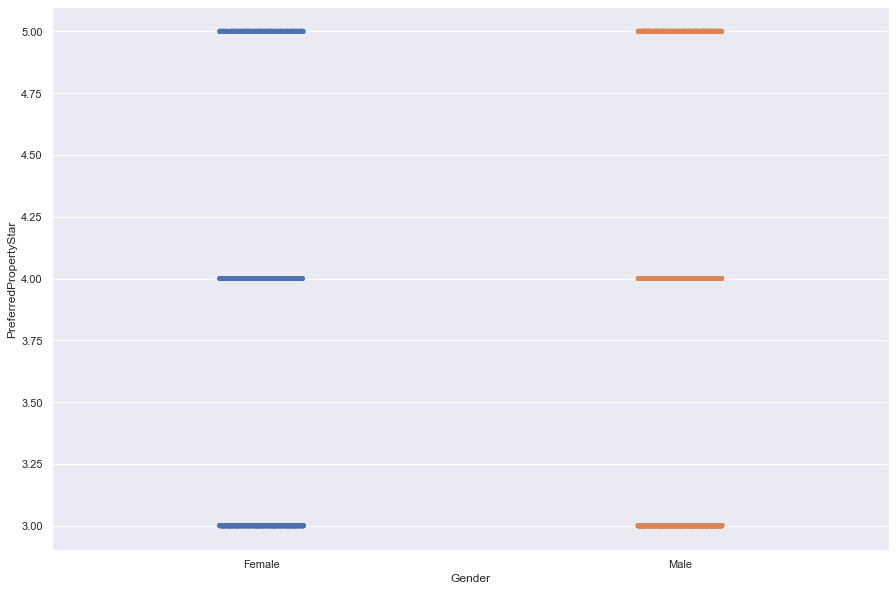

PreferredPropertyStar by ProductPitched Bar Plot


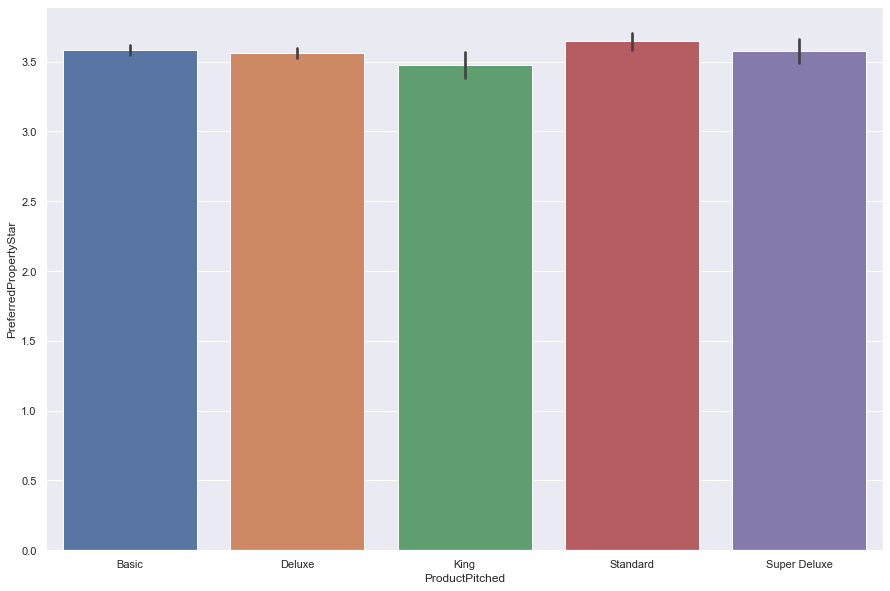

PreferredPropertyStar by ProductPitched Box Plot


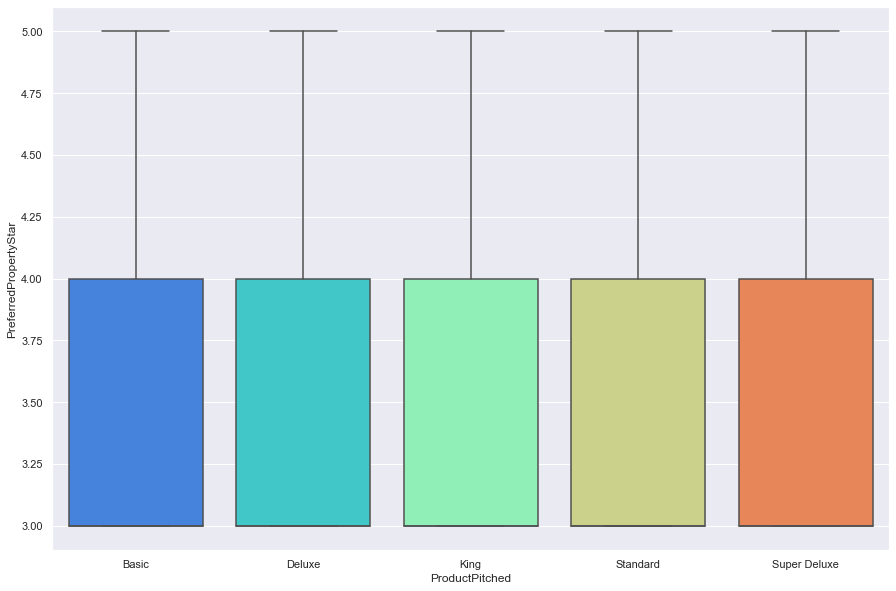

PreferredPropertyStar by ProductPitched Strip Plot


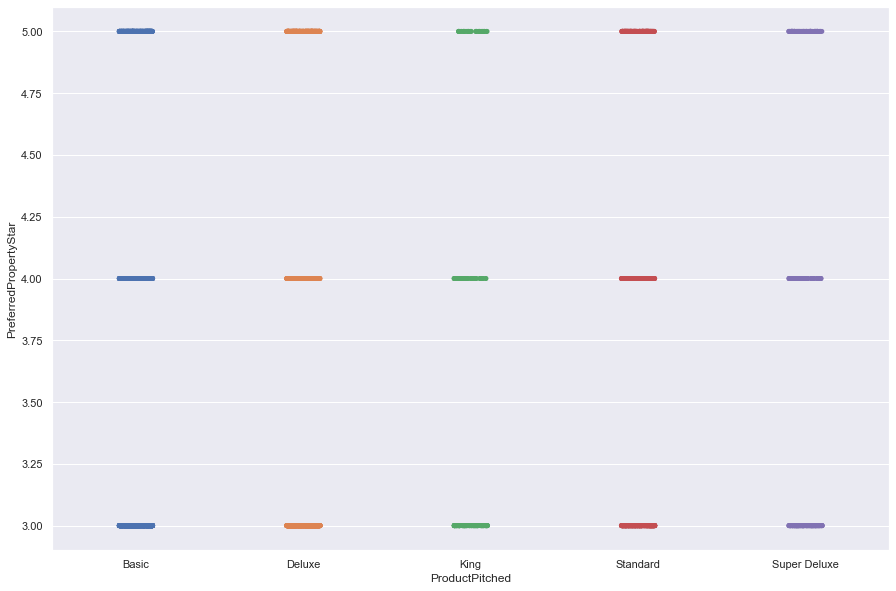

PreferredPropertyStar by MaritalStatus Bar Plot


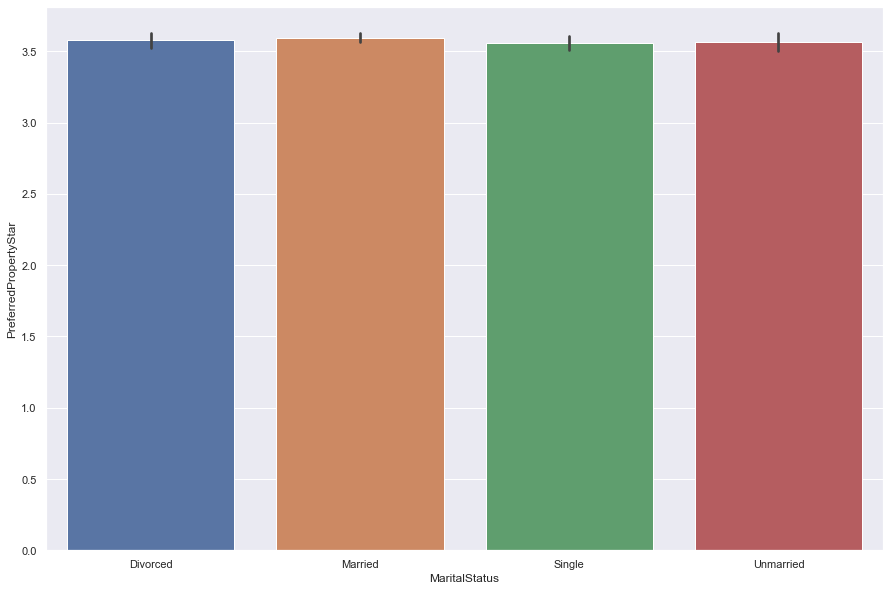

PreferredPropertyStar by MaritalStatus Box Plot


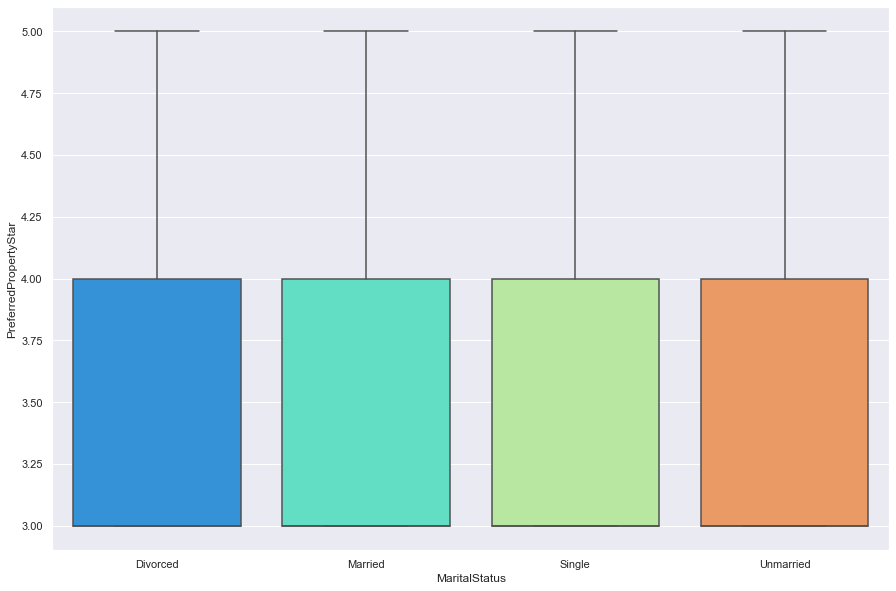

PreferredPropertyStar by MaritalStatus Strip Plot


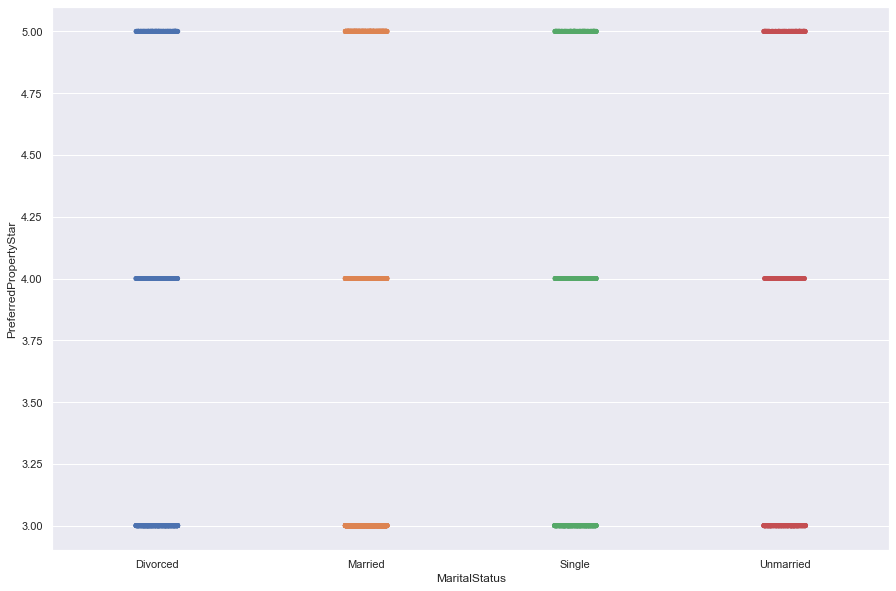

PreferredPropertyStar by Designation Bar Plot


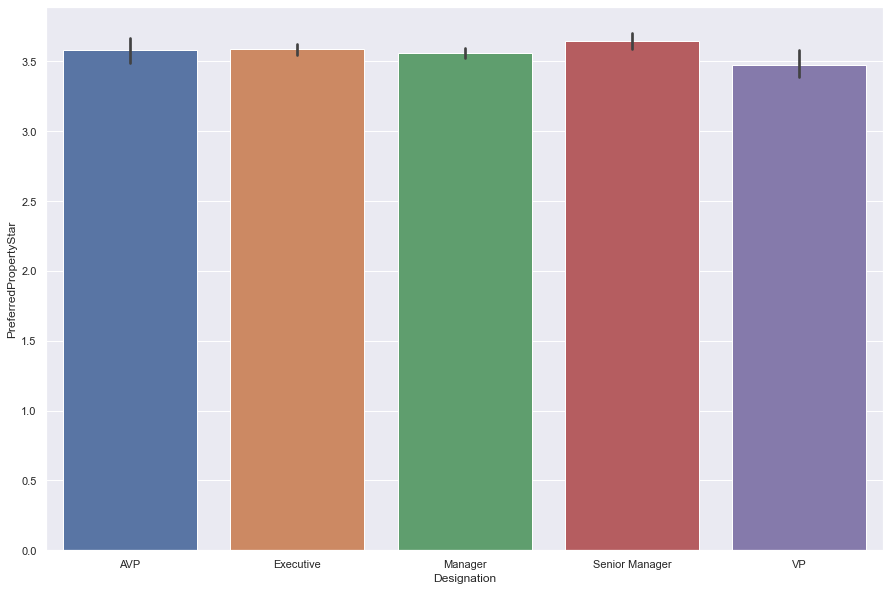

PreferredPropertyStar by Designation Box Plot


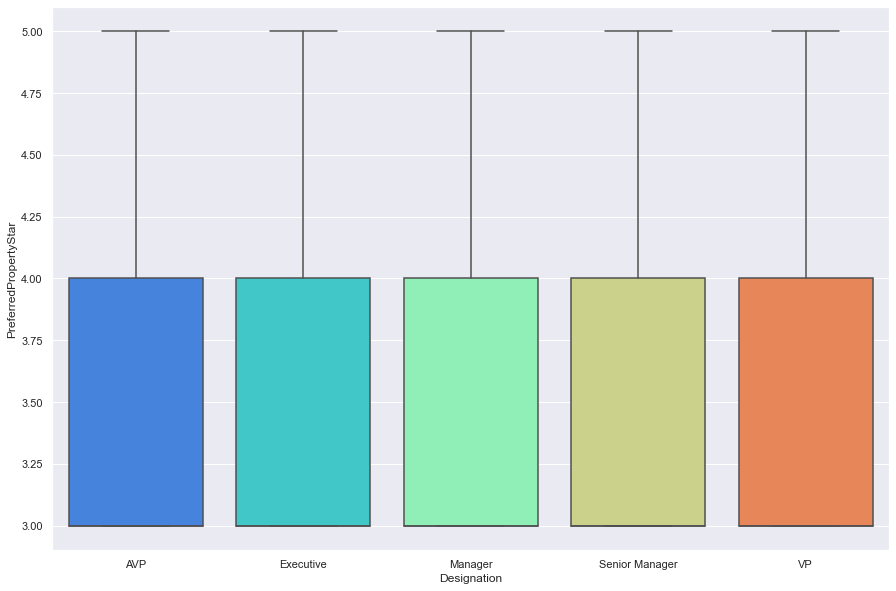

PreferredPropertyStar by Designation Strip Plot


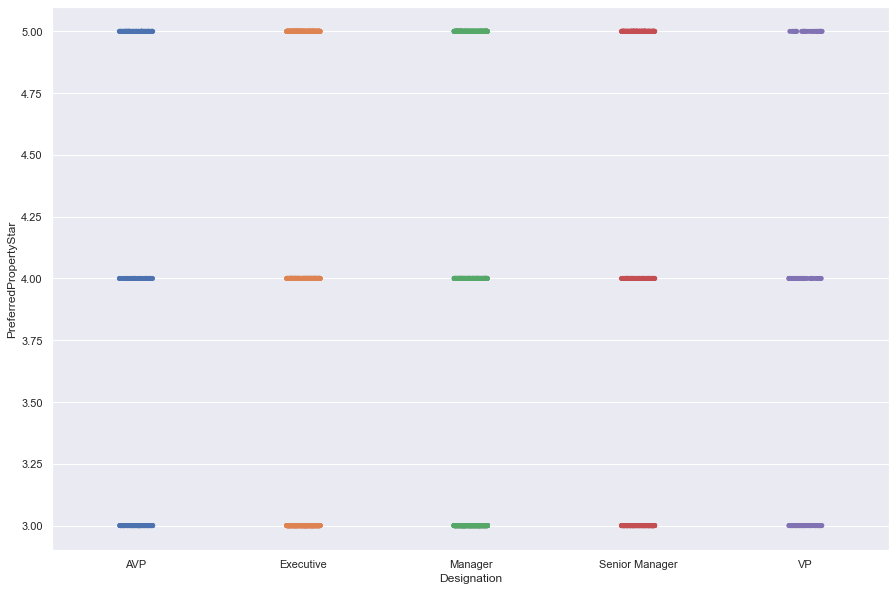

NumberOfTrips by TypeofContact Bar Plot


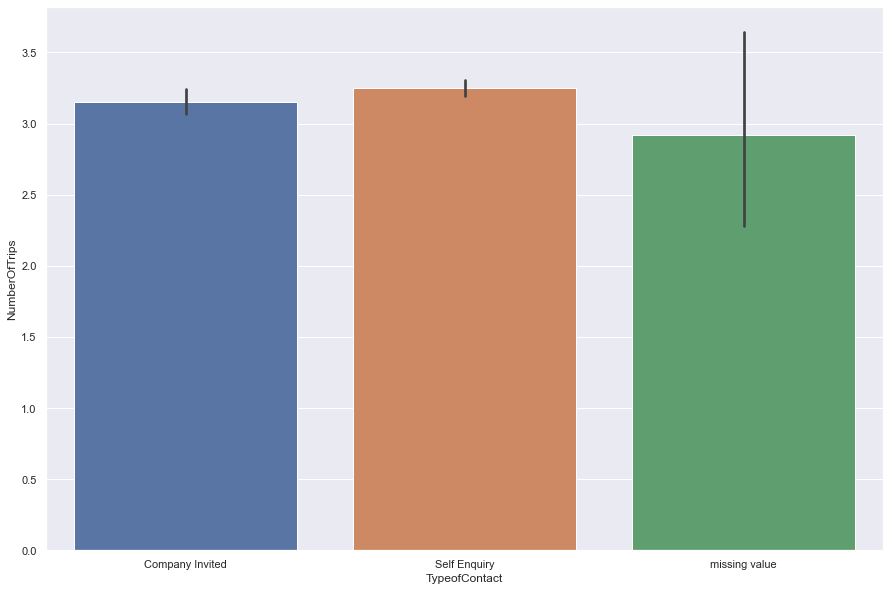

NumberOfTrips by TypeofContact Box Plot


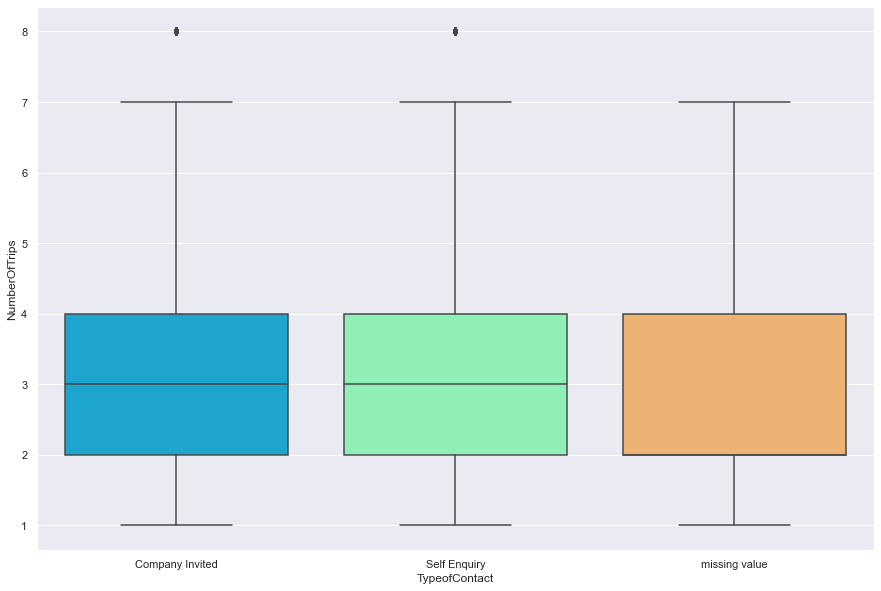

NumberOfTrips by TypeofContact Strip Plot


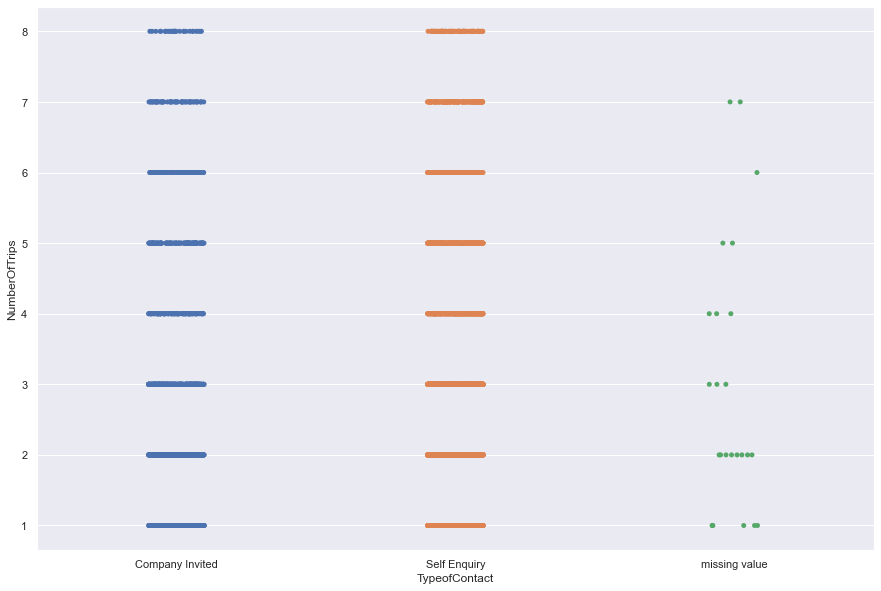

NumberOfTrips by Occupation Bar Plot


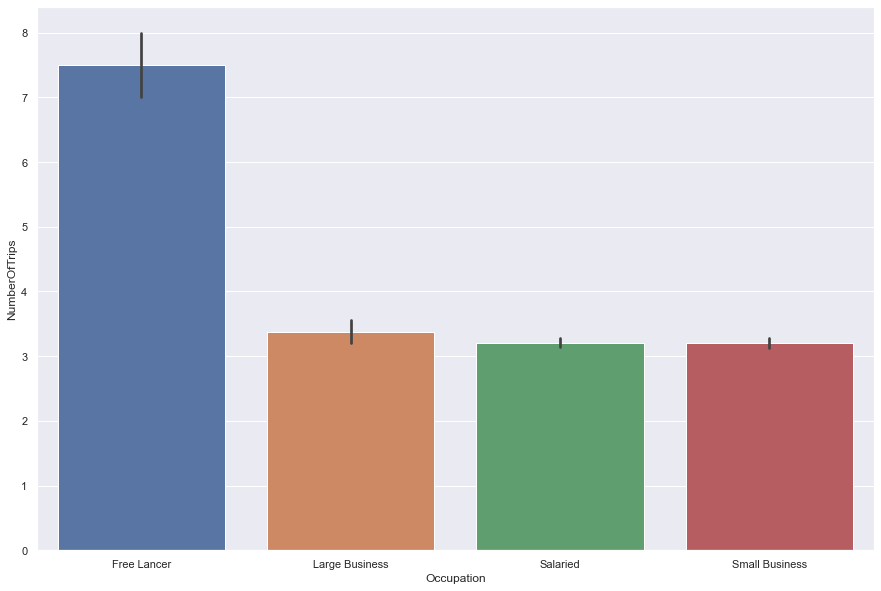

NumberOfTrips by Occupation Box Plot


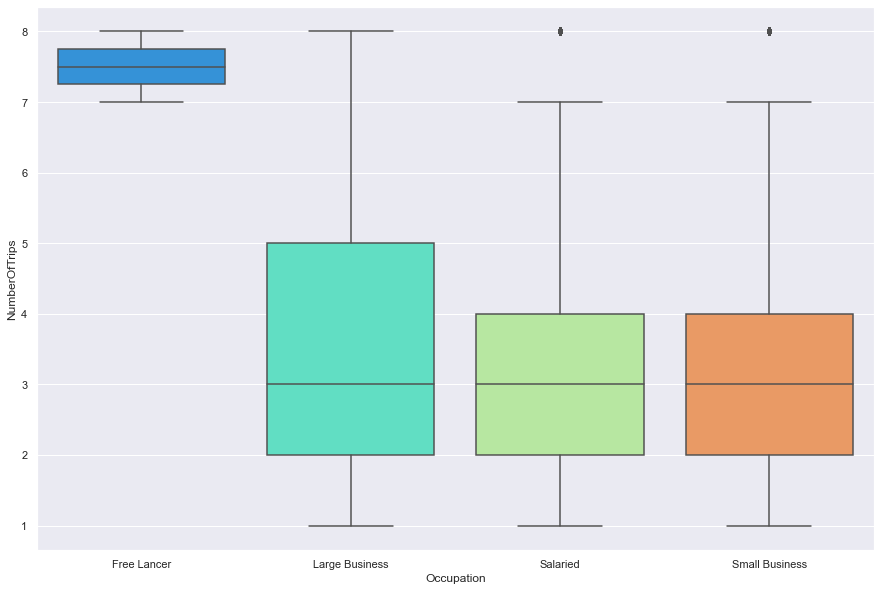

NumberOfTrips by Occupation Strip Plot


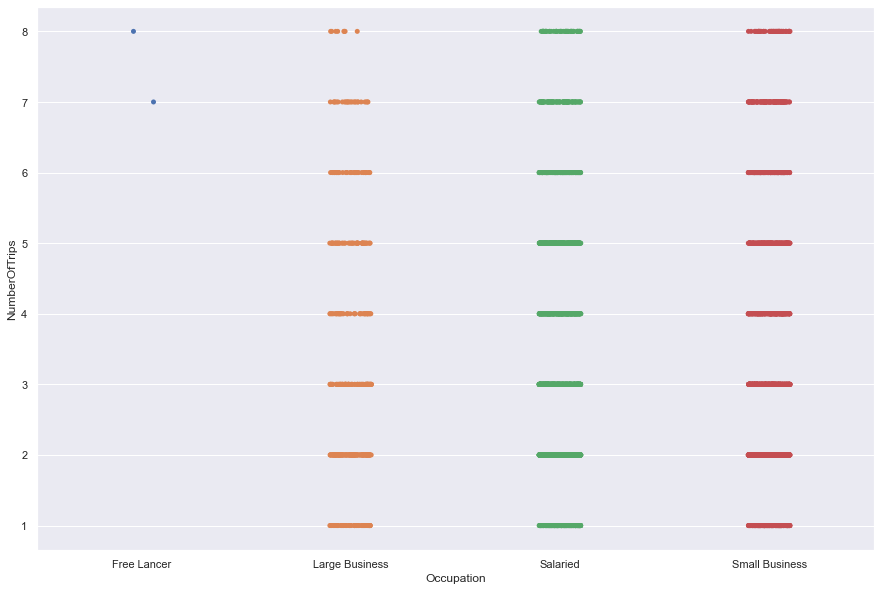

NumberOfTrips by Gender Bar Plot


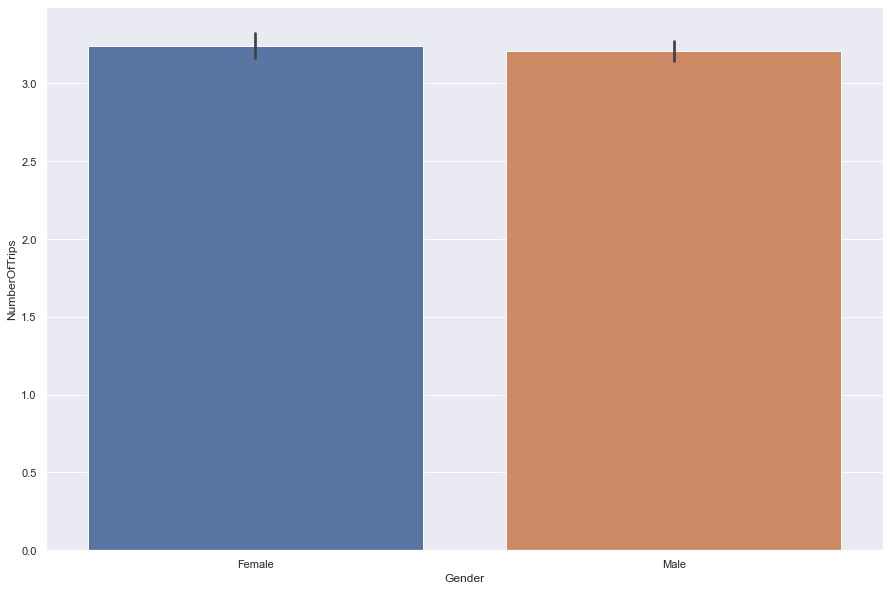

NumberOfTrips by Gender Box Plot


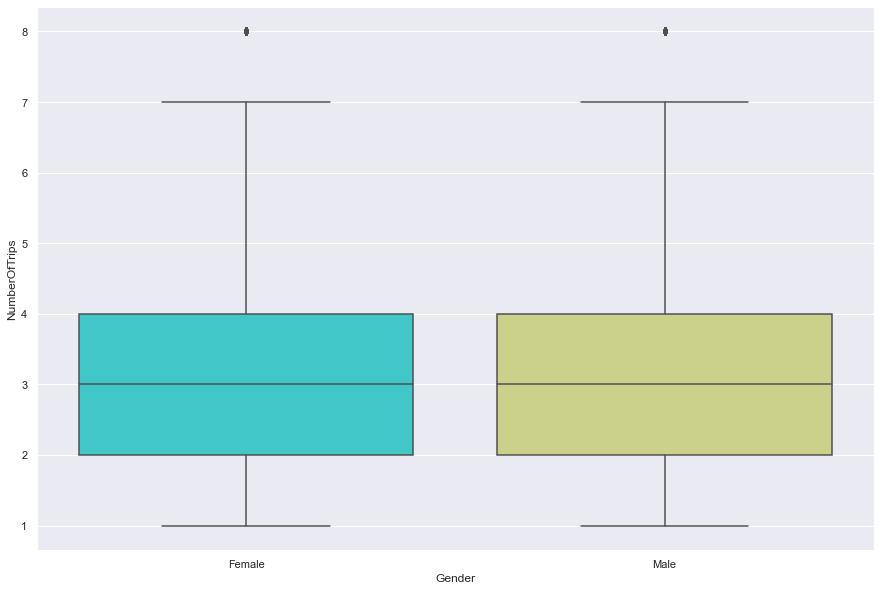

NumberOfTrips by Gender Strip Plot


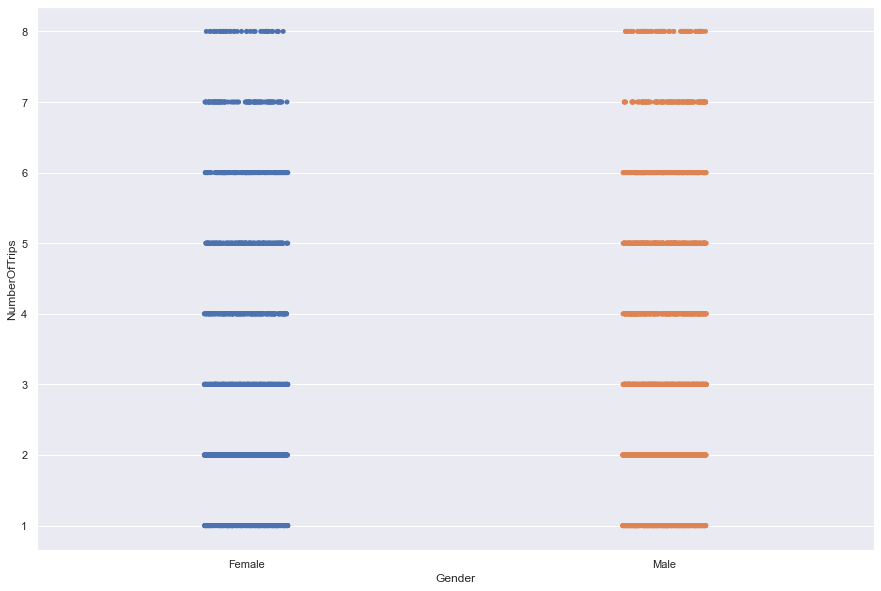

NumberOfTrips by ProductPitched Bar Plot


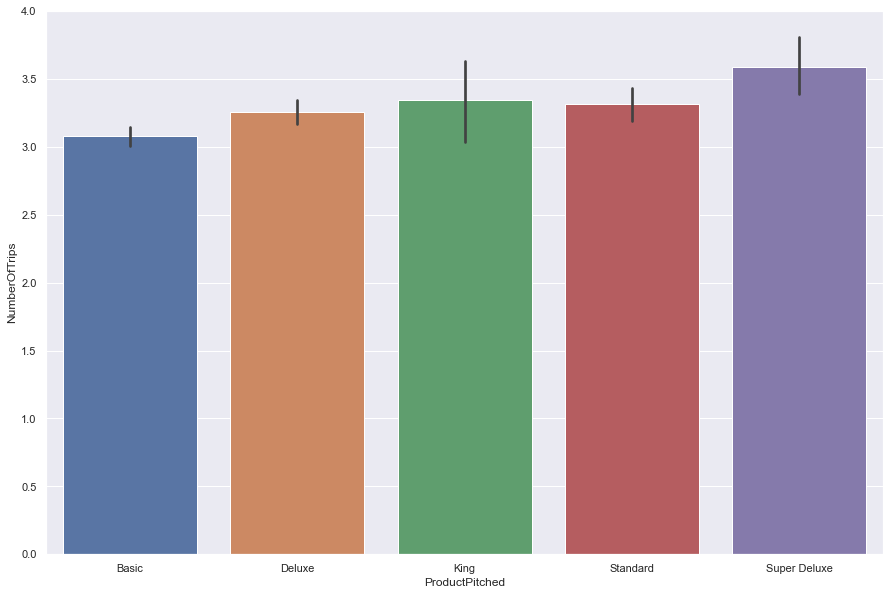

NumberOfTrips by ProductPitched Box Plot


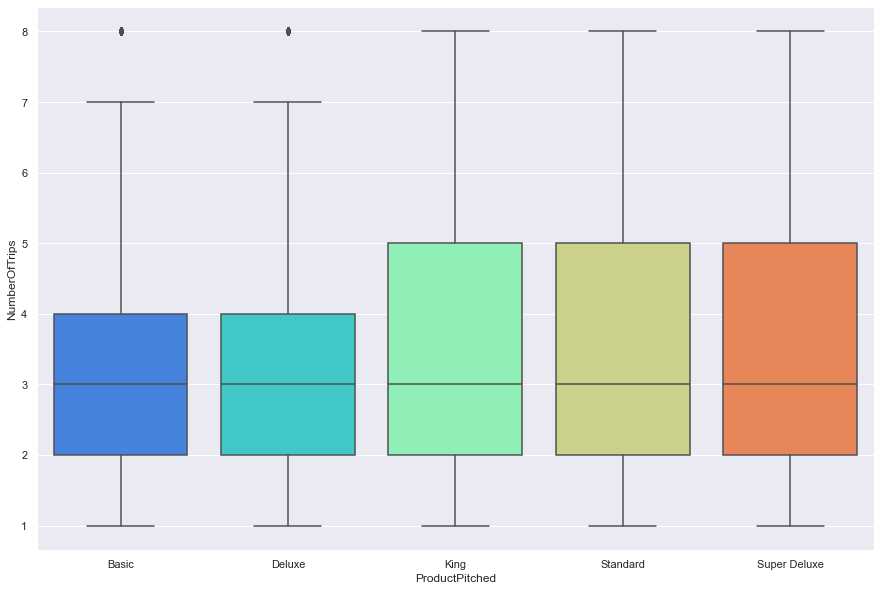

NumberOfTrips by ProductPitched Strip Plot


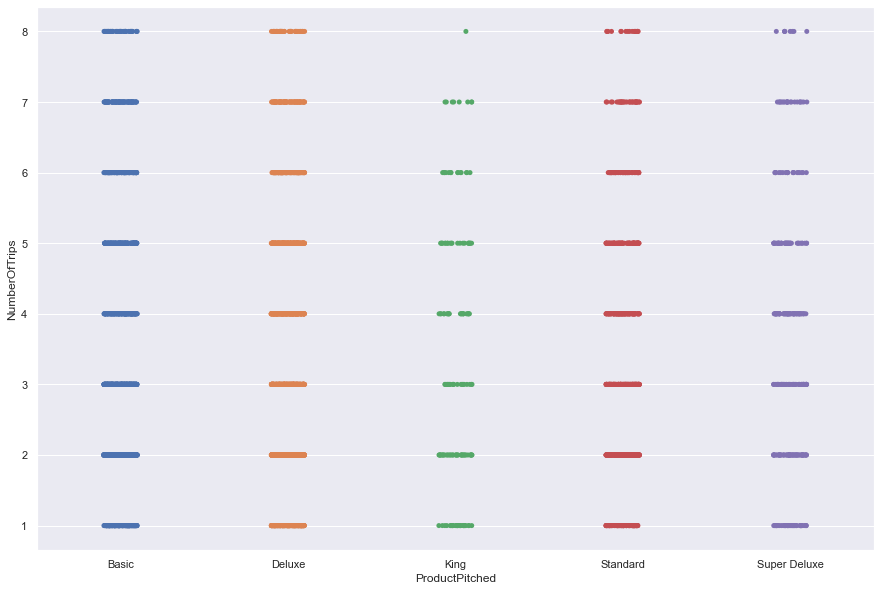

NumberOfTrips by MaritalStatus Bar Plot


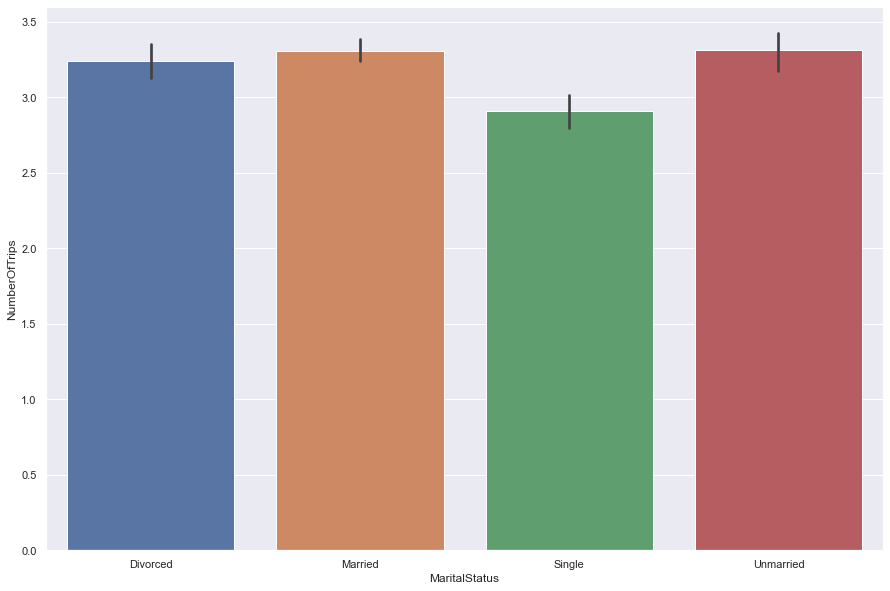

NumberOfTrips by MaritalStatus Box Plot


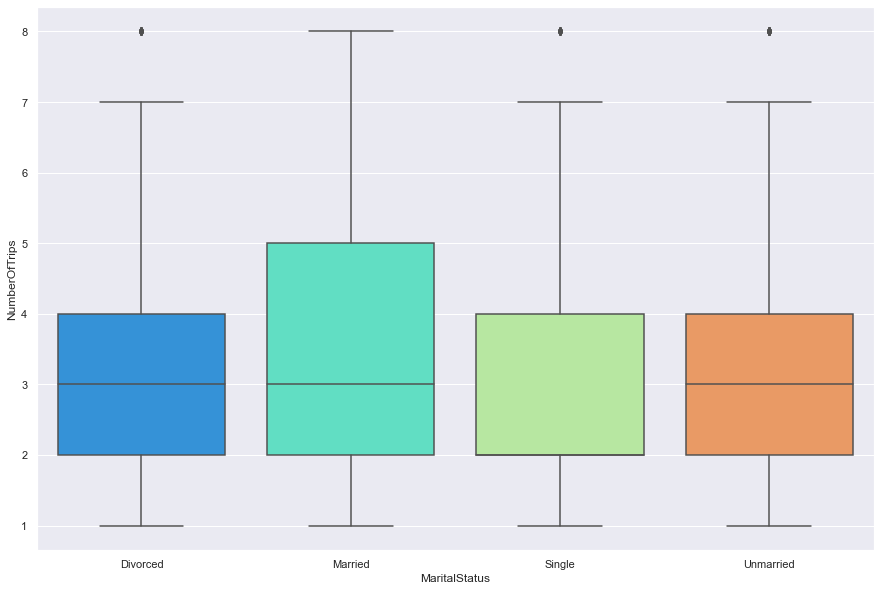

NumberOfTrips by MaritalStatus Strip Plot


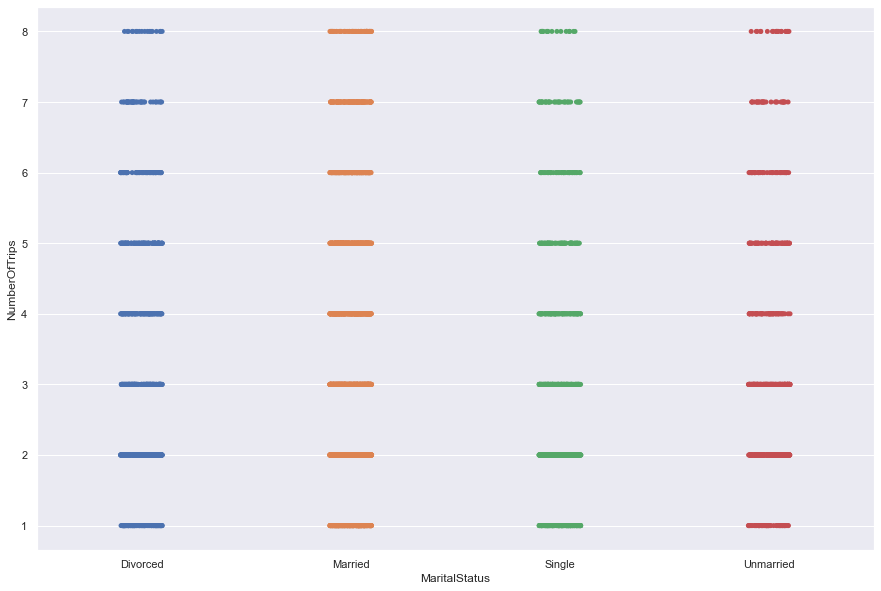

NumberOfTrips by Designation Bar Plot


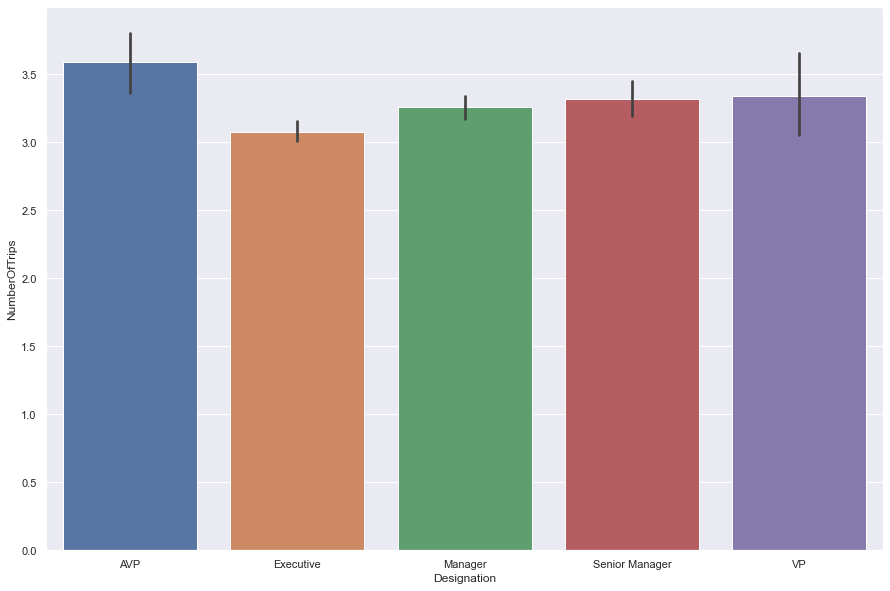

NumberOfTrips by Designation Box Plot


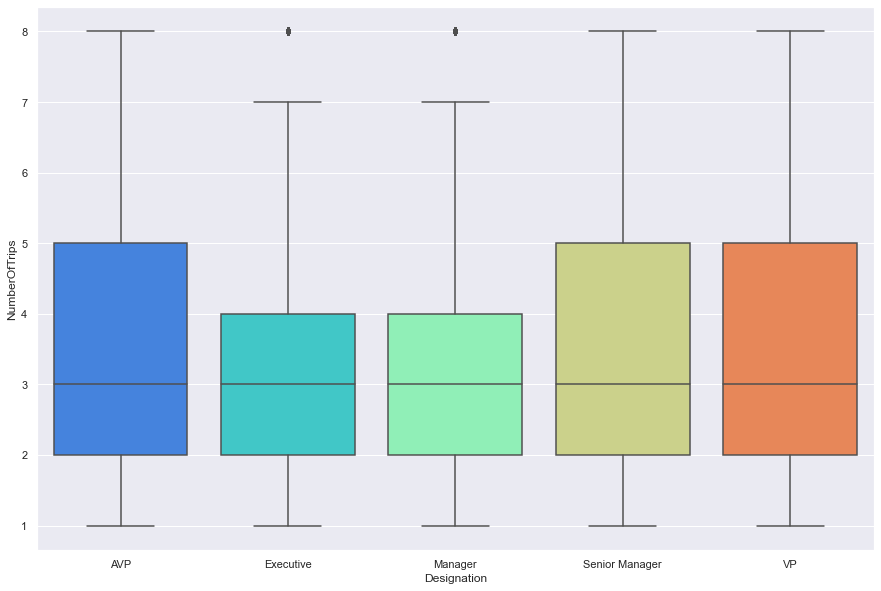

NumberOfTrips by Designation Strip Plot


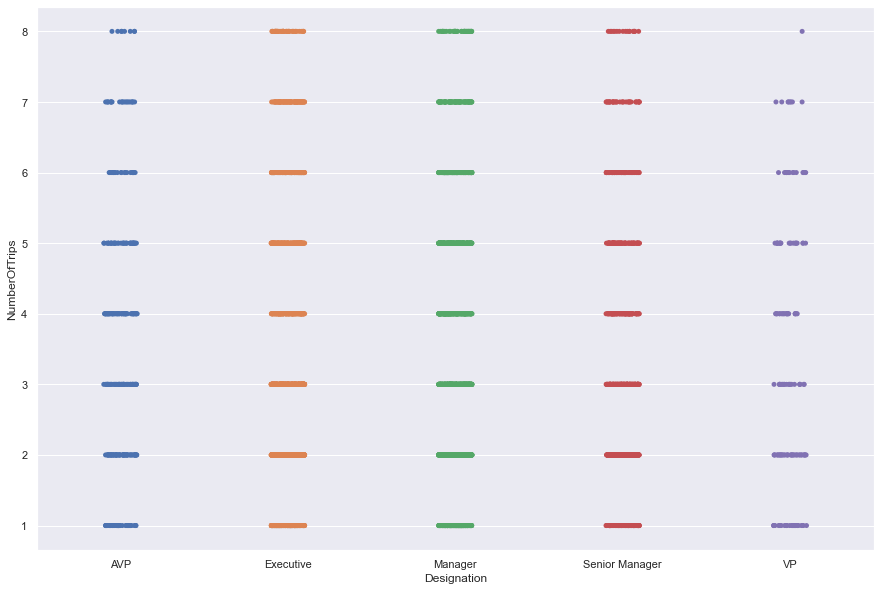

Passport by TypeofContact Bar Plot


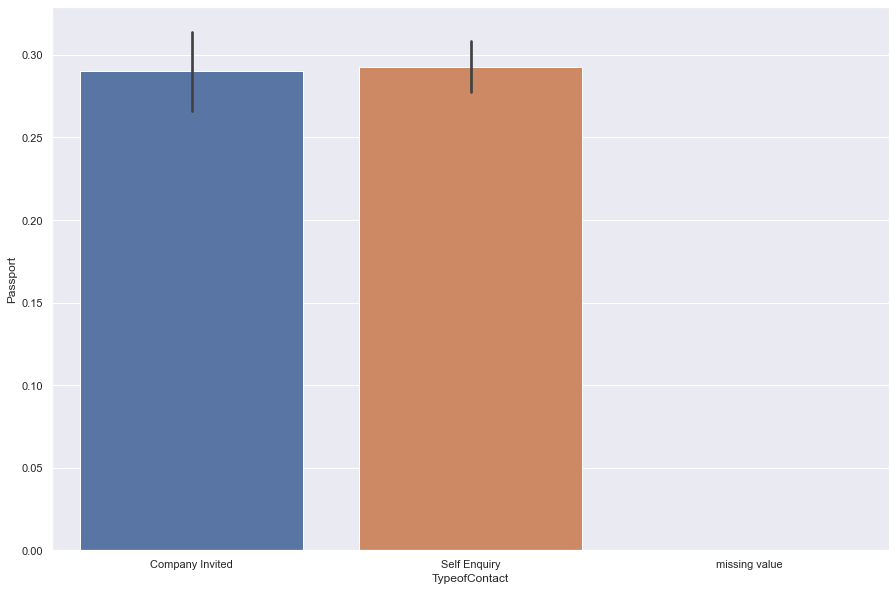

Passport by TypeofContact Box Plot


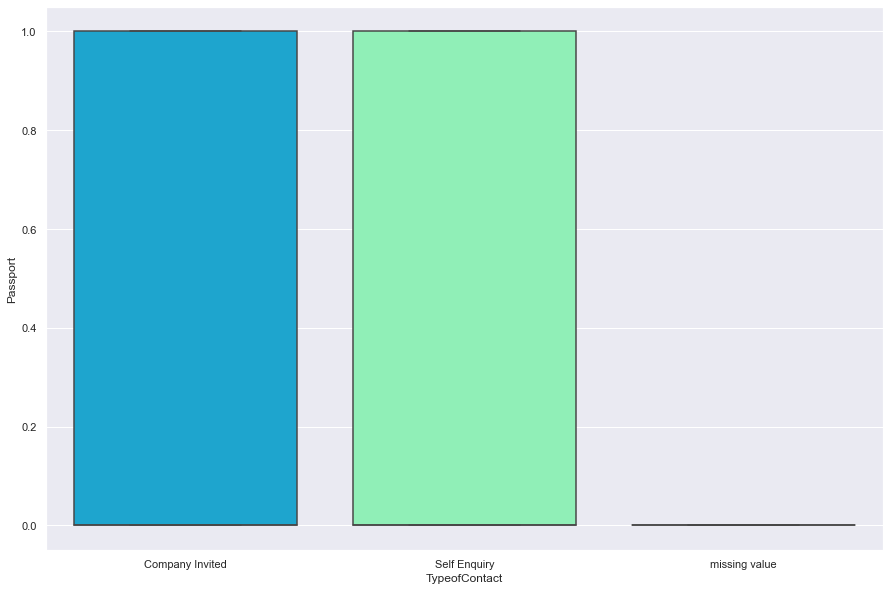

Passport by TypeofContact Strip Plot


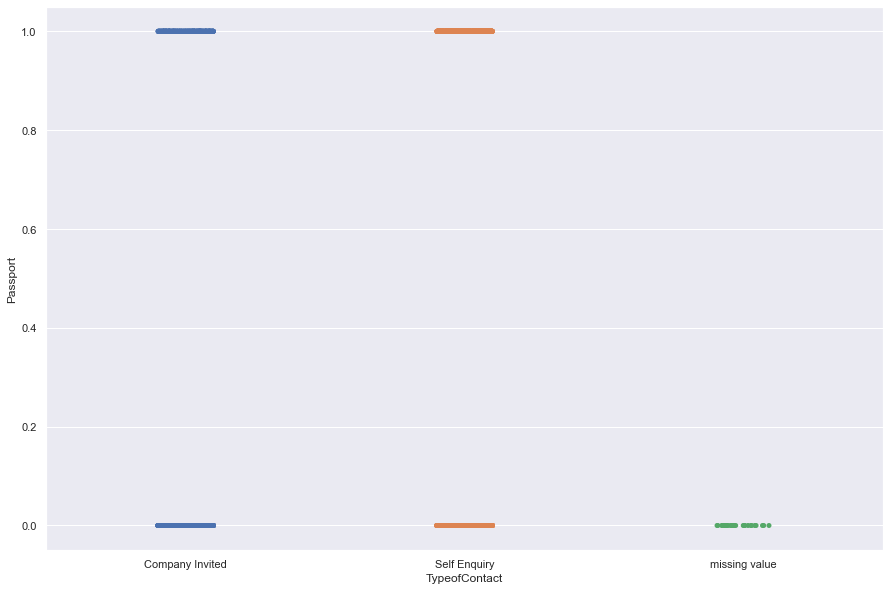

Passport by Occupation Bar Plot


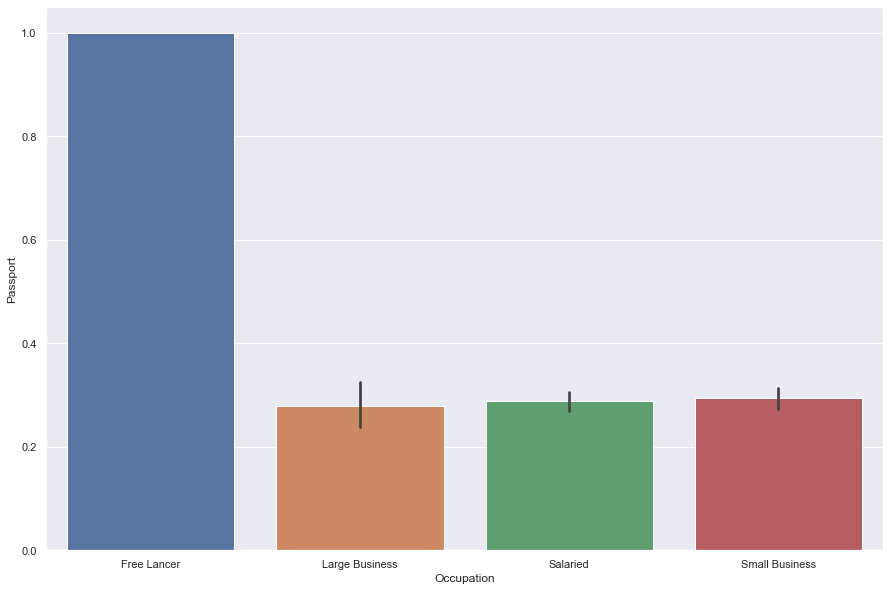

Passport by Occupation Box Plot


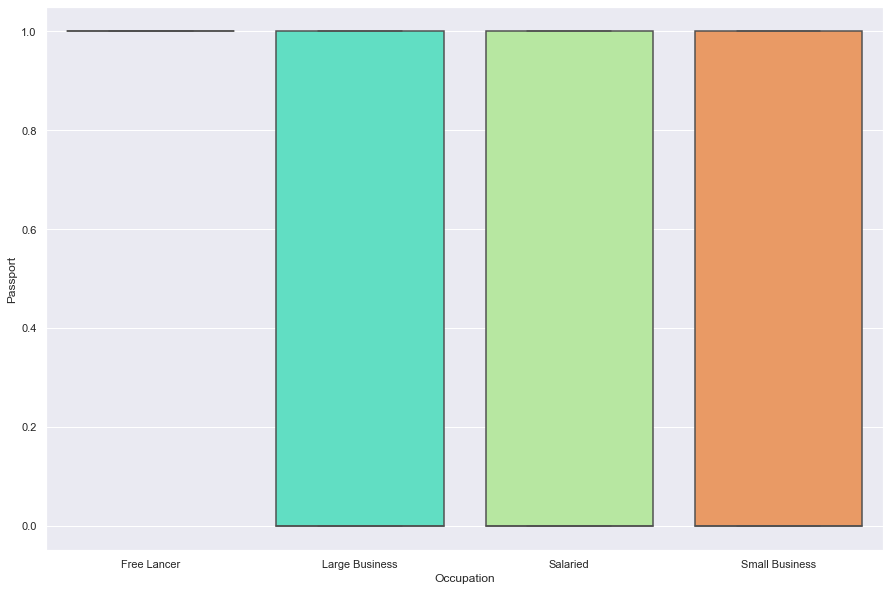

Passport by Occupation Strip Plot


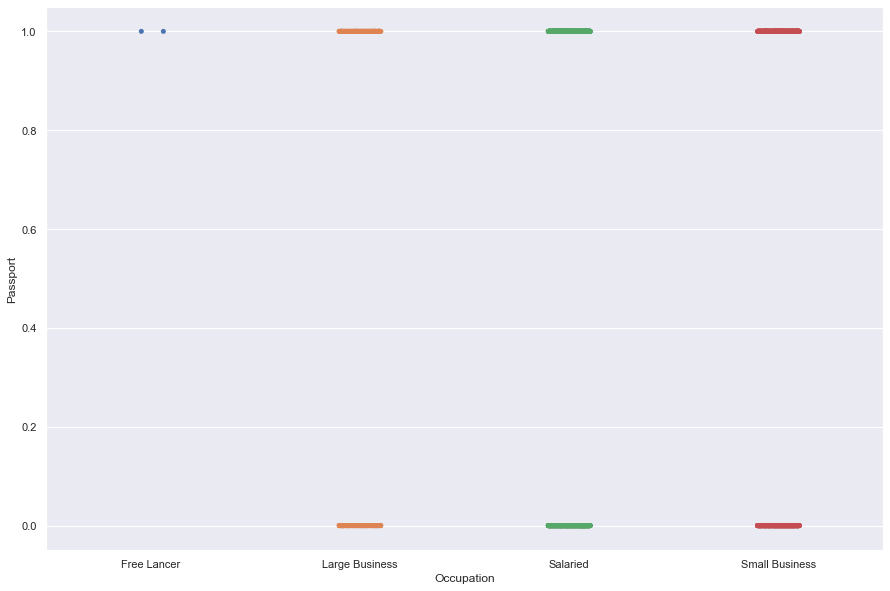

Passport by Gender Bar Plot


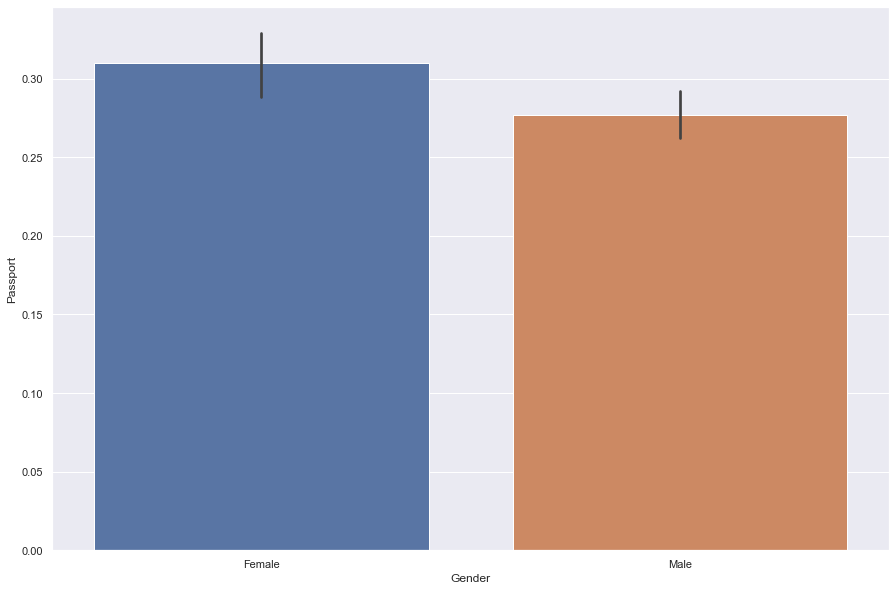

Passport by Gender Box Plot


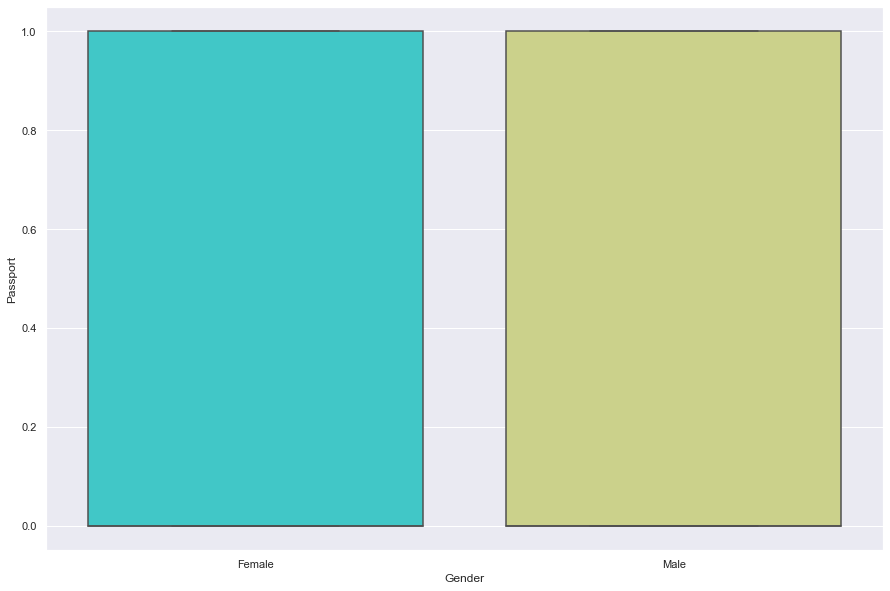

Passport by Gender Strip Plot


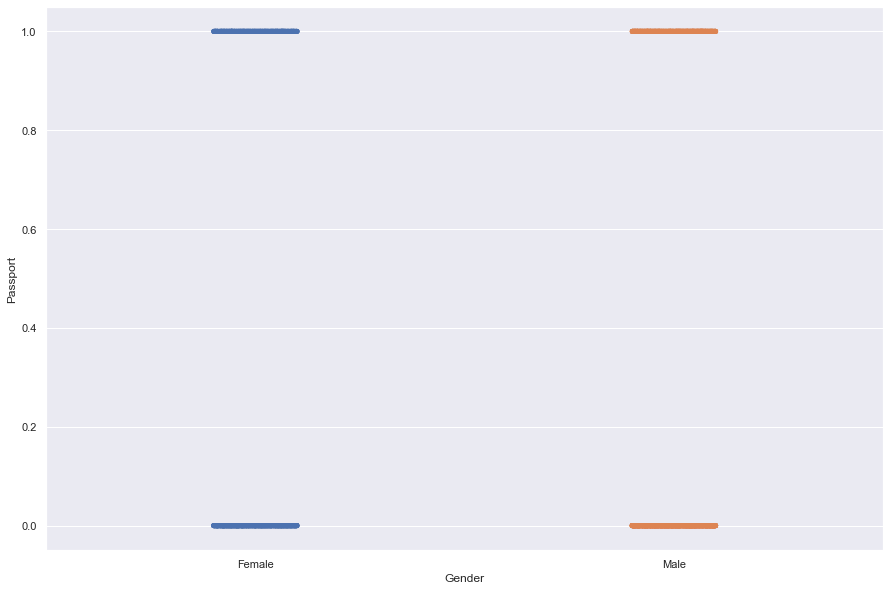

Passport by ProductPitched Bar Plot


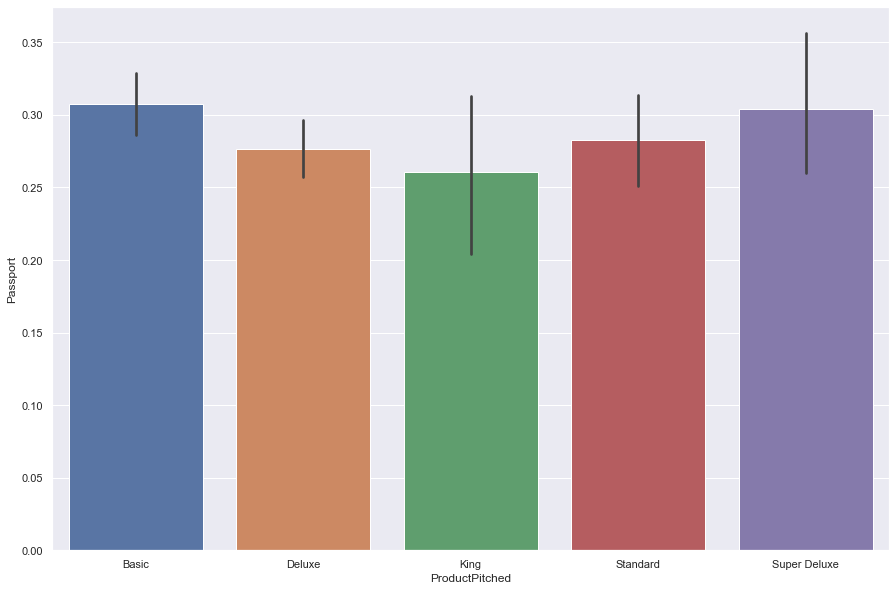

Passport by ProductPitched Box Plot


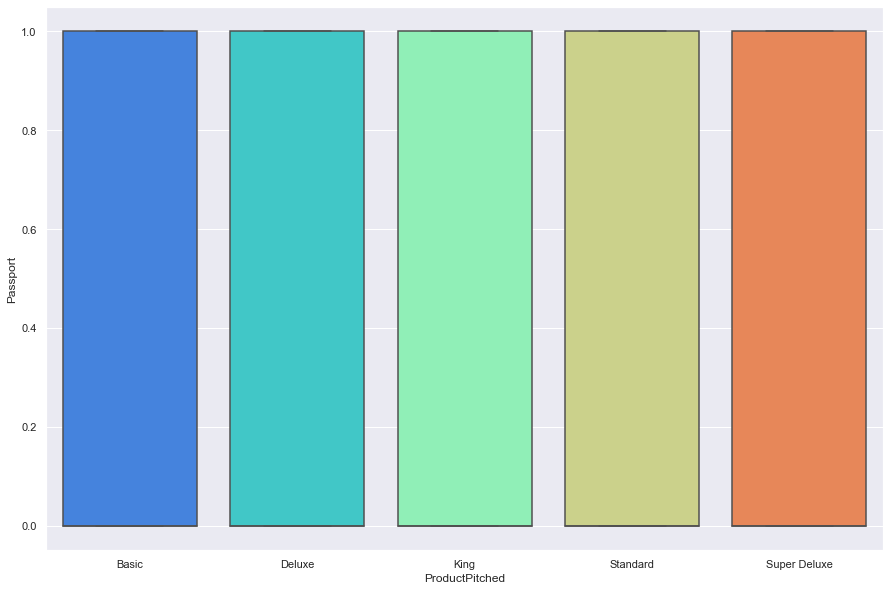

Passport by ProductPitched Strip Plot


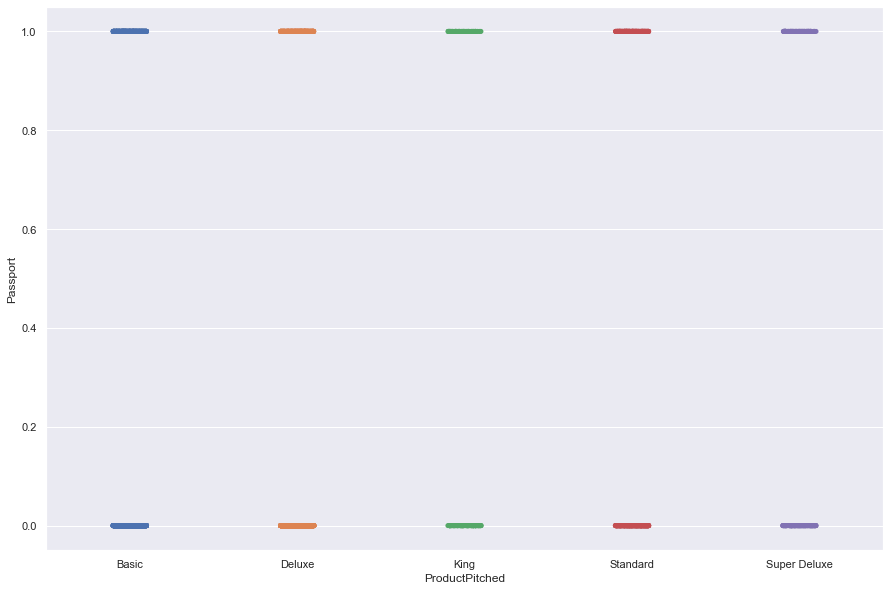

Passport by MaritalStatus Bar Plot


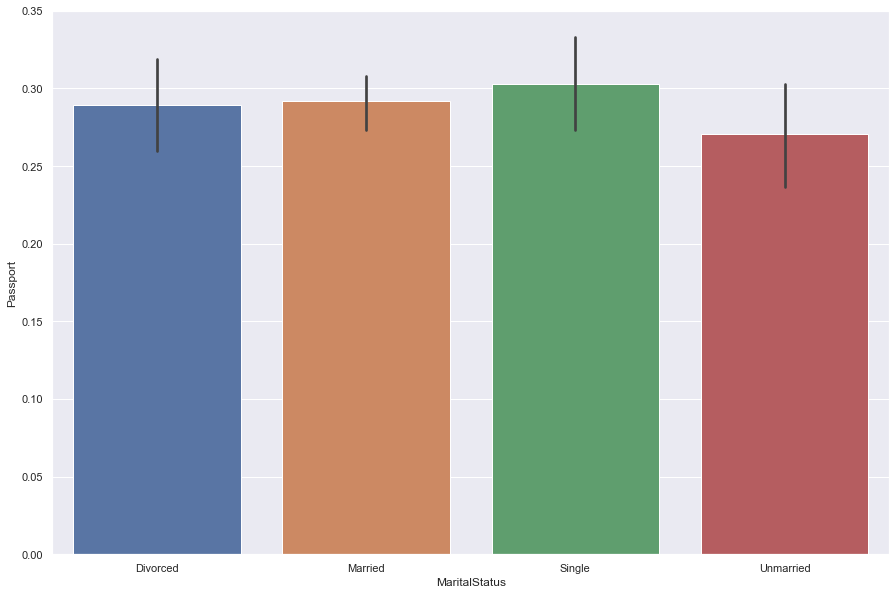

Passport by MaritalStatus Box Plot


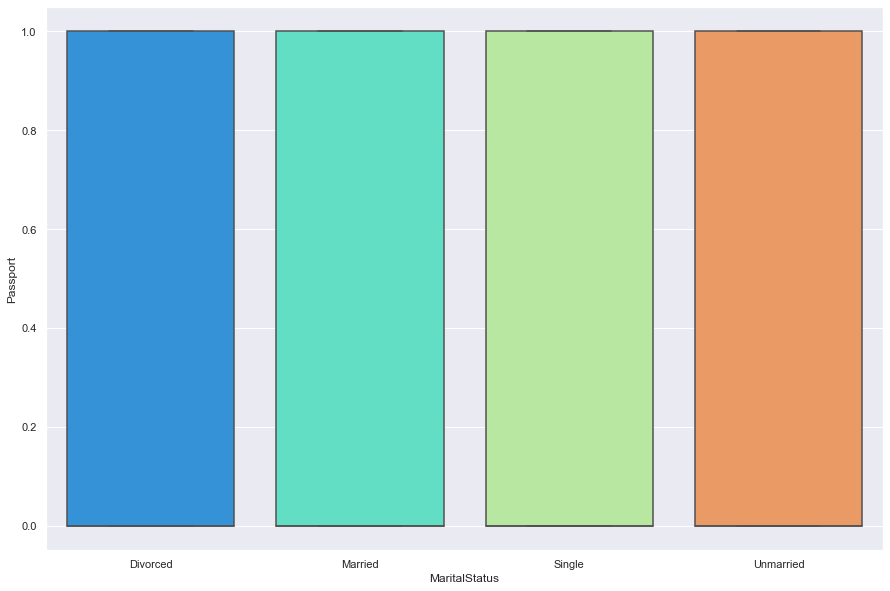

Passport by MaritalStatus Strip Plot


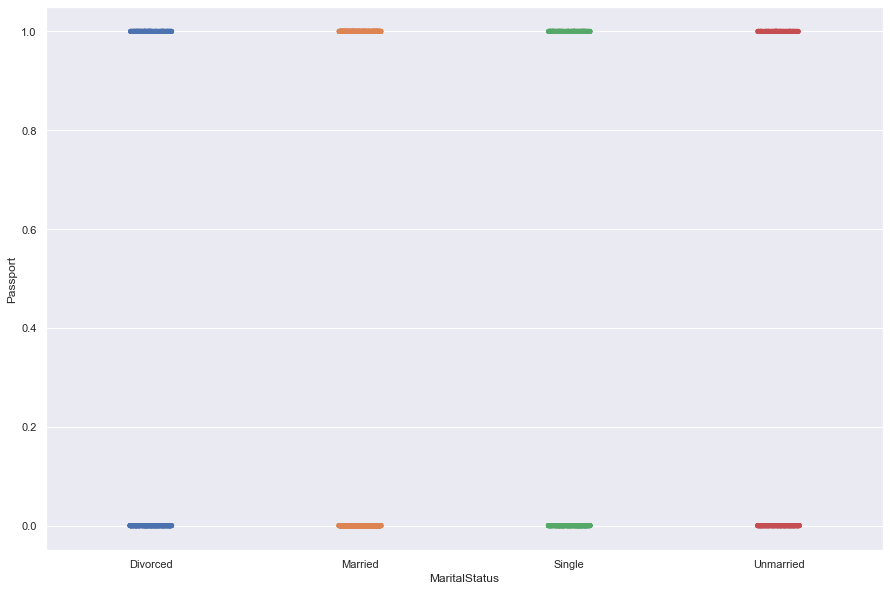

Passport by Designation Bar Plot


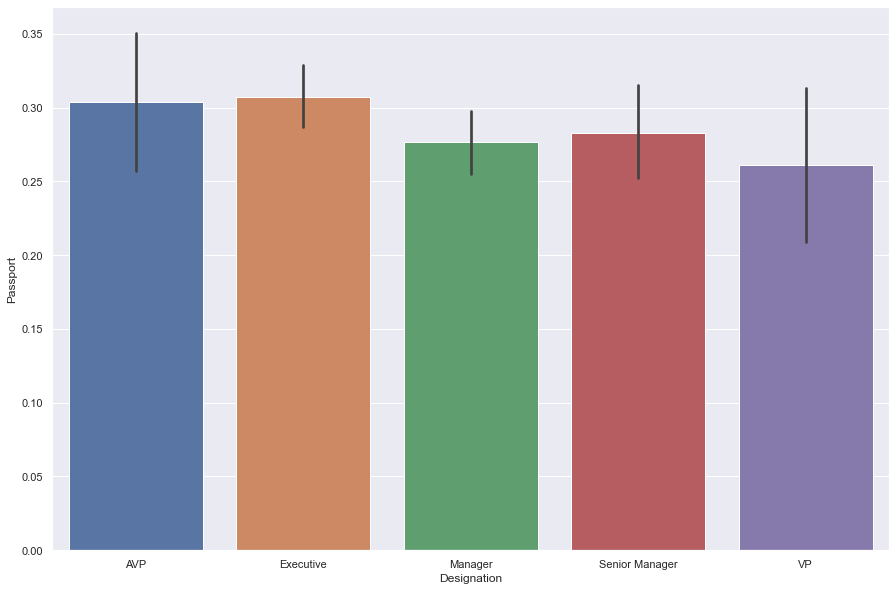

Passport by Designation Box Plot


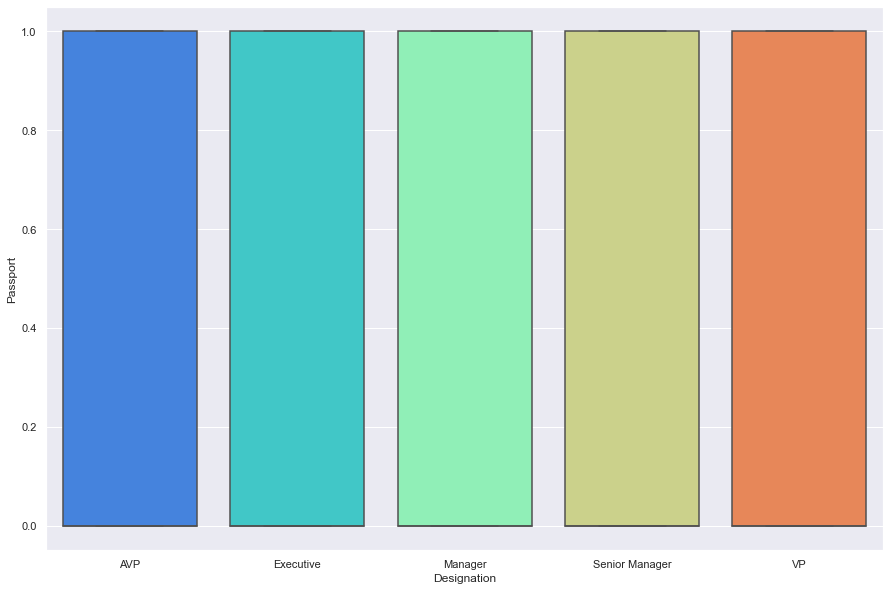

Passport by Designation Strip Plot


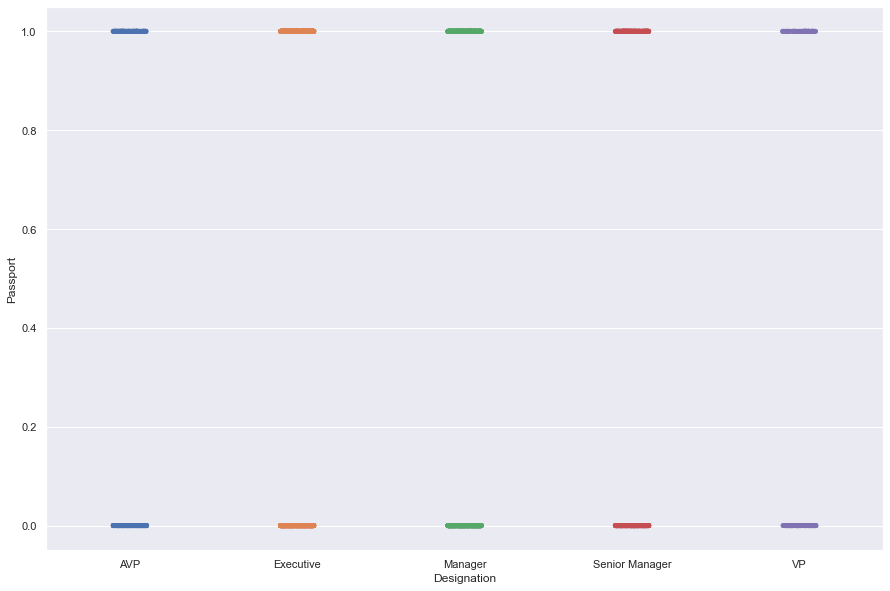

PitchSatisfactionScore by TypeofContact Bar Plot


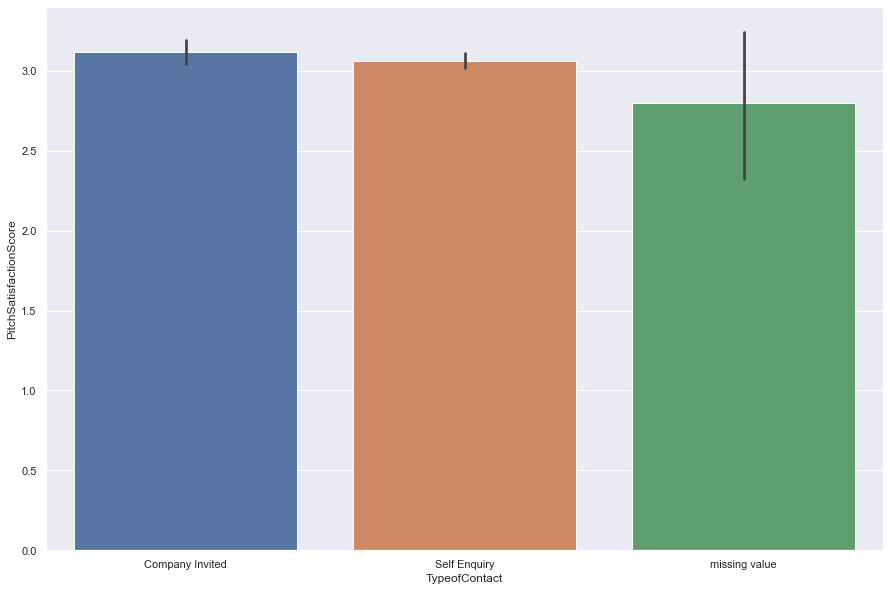

PitchSatisfactionScore by TypeofContact Box Plot


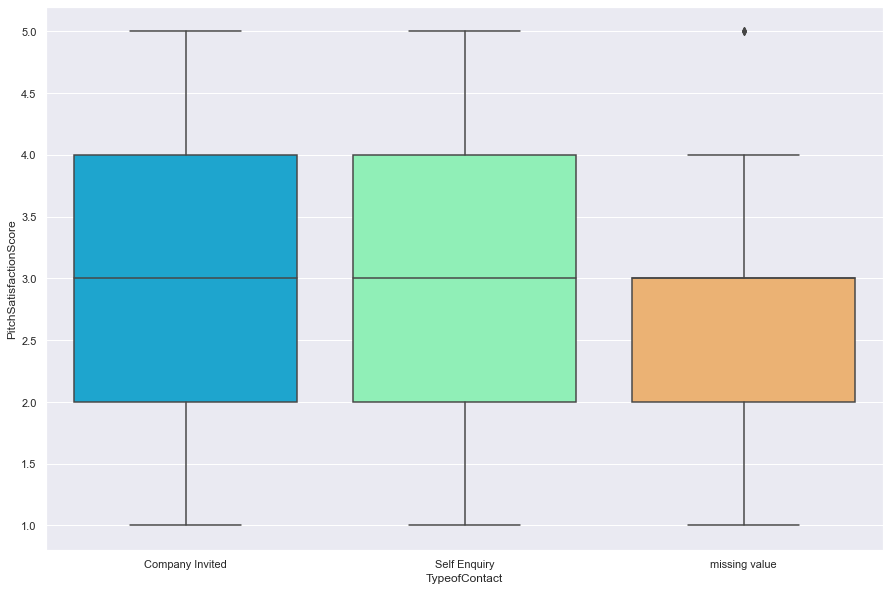

PitchSatisfactionScore by TypeofContact Strip Plot


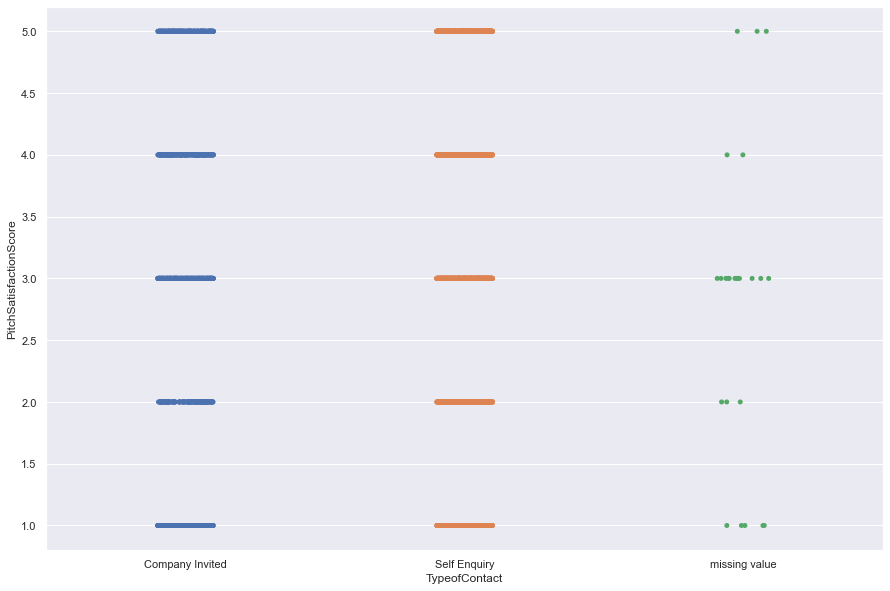

PitchSatisfactionScore by Occupation Bar Plot


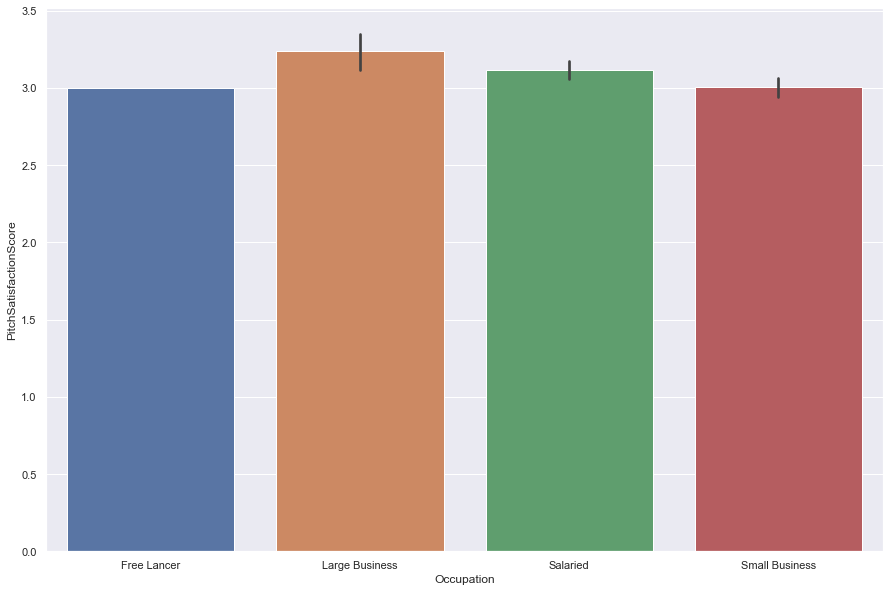

PitchSatisfactionScore by Occupation Box Plot


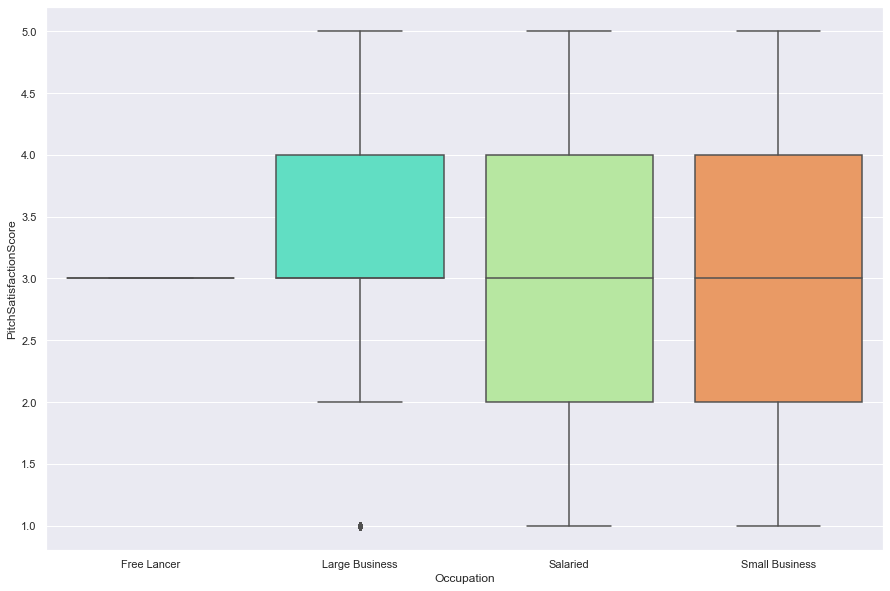

PitchSatisfactionScore by Occupation Strip Plot


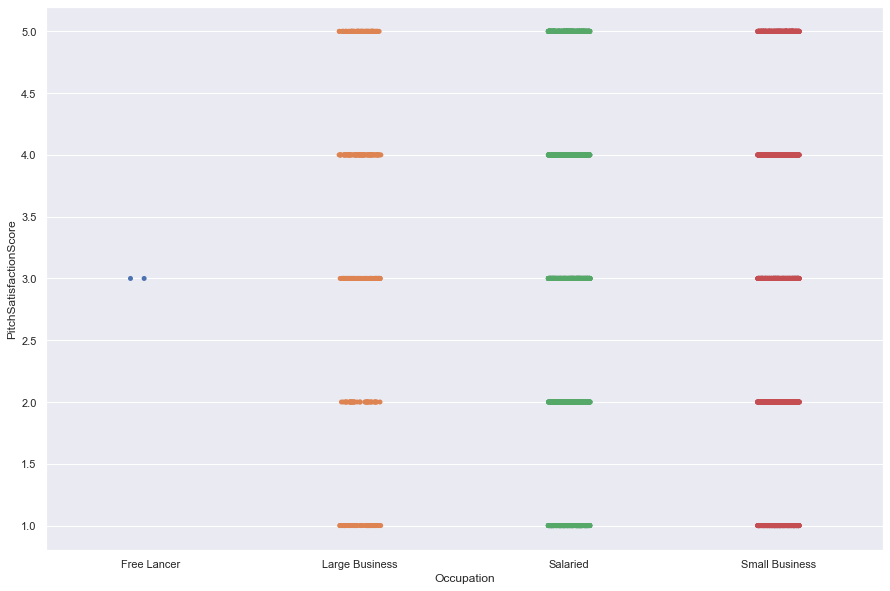

PitchSatisfactionScore by Gender Bar Plot


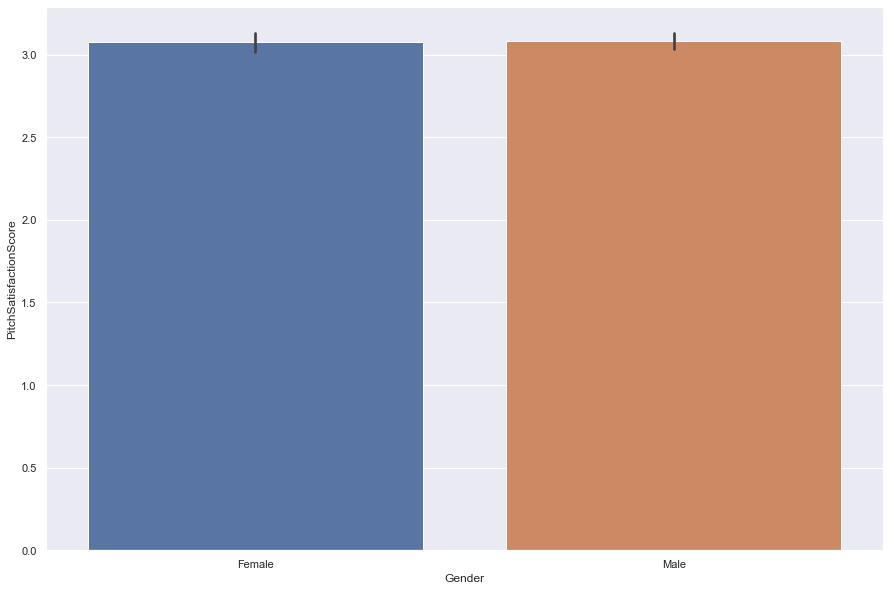

PitchSatisfactionScore by Gender Box Plot


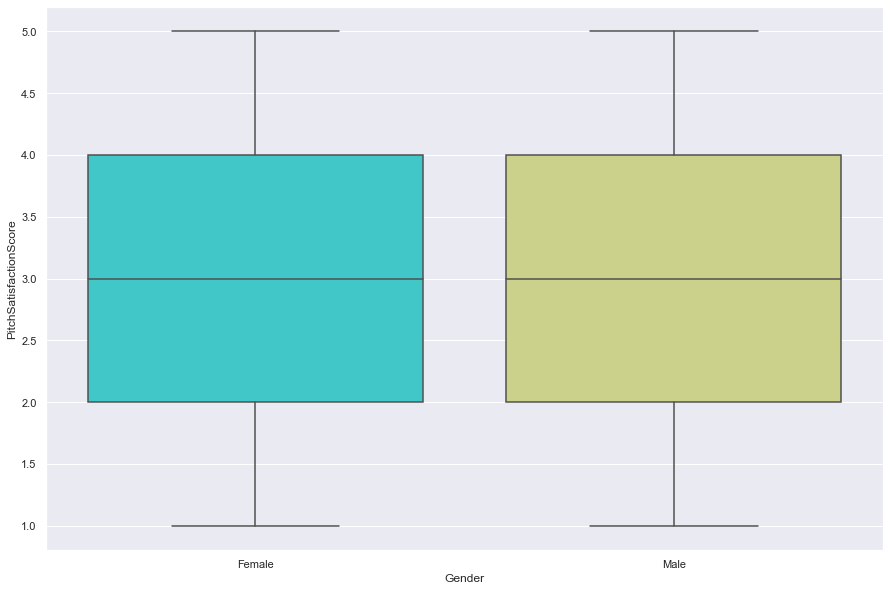

PitchSatisfactionScore by Gender Strip Plot


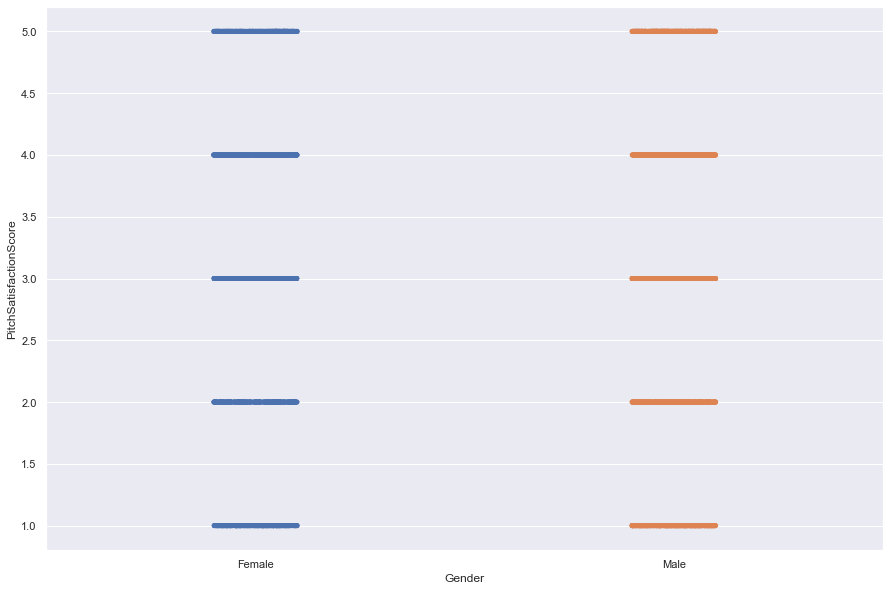

PitchSatisfactionScore by ProductPitched Bar Plot


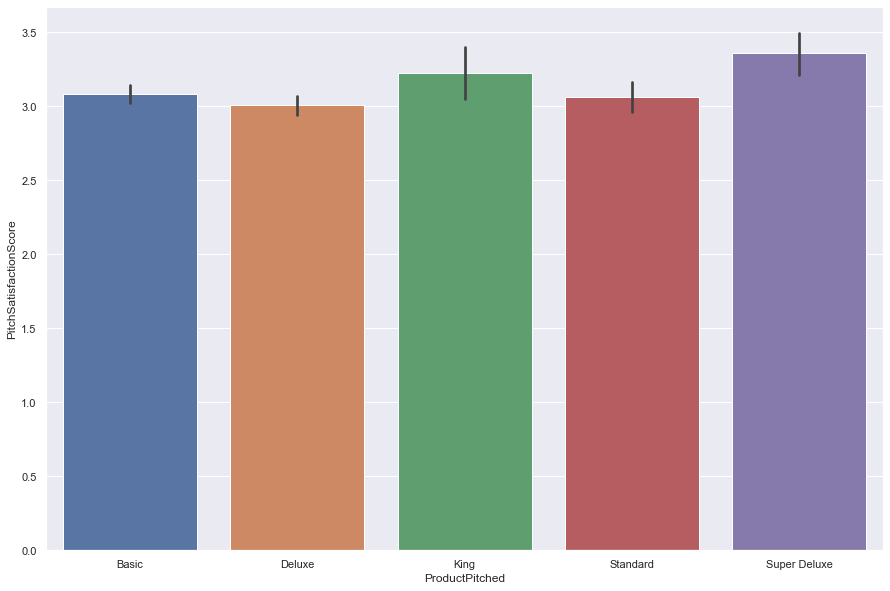

PitchSatisfactionScore by ProductPitched Box Plot


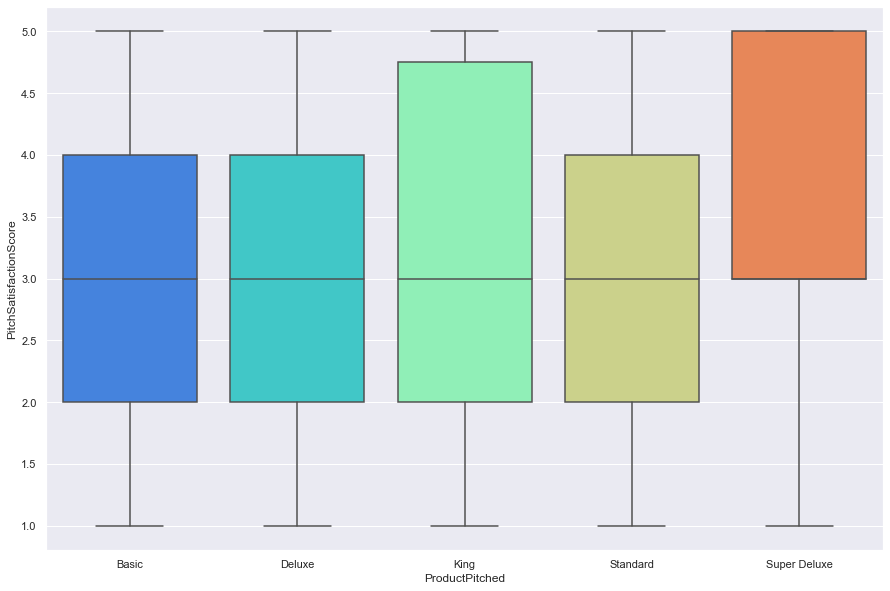

PitchSatisfactionScore by ProductPitched Strip Plot


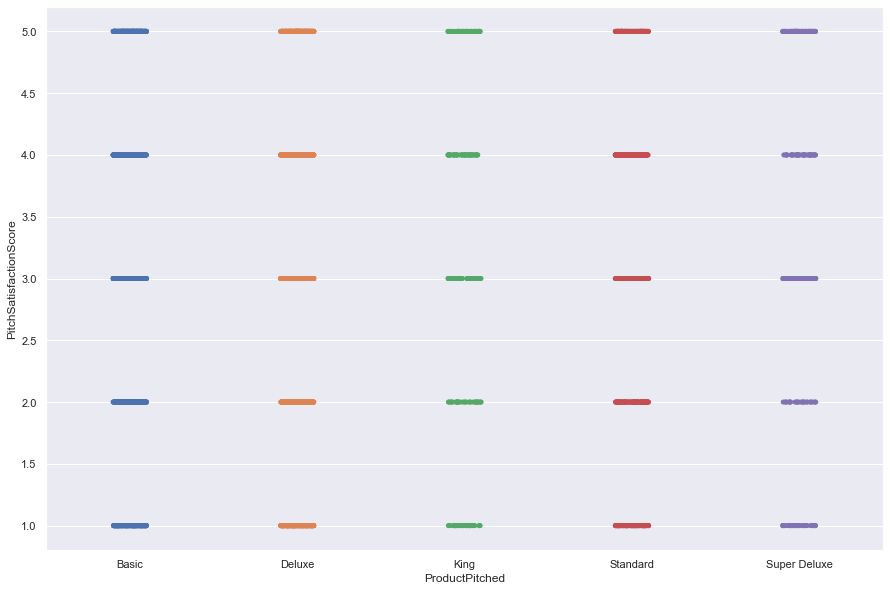

PitchSatisfactionScore by MaritalStatus Bar Plot


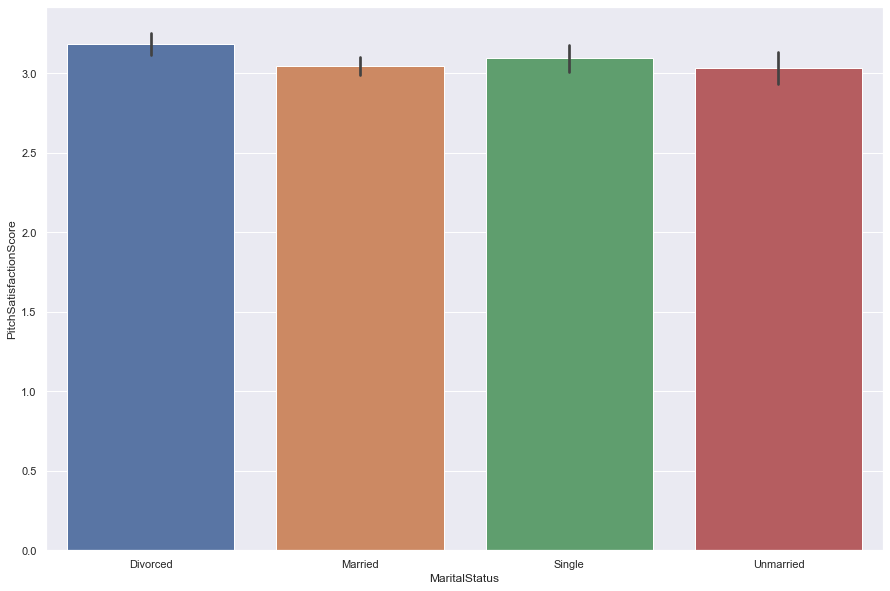

PitchSatisfactionScore by MaritalStatus Box Plot


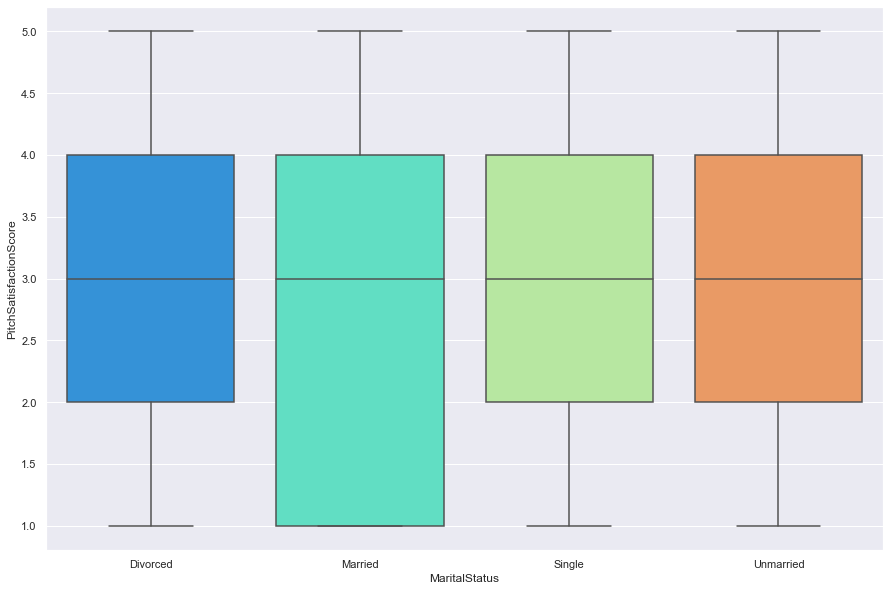

PitchSatisfactionScore by MaritalStatus Strip Plot


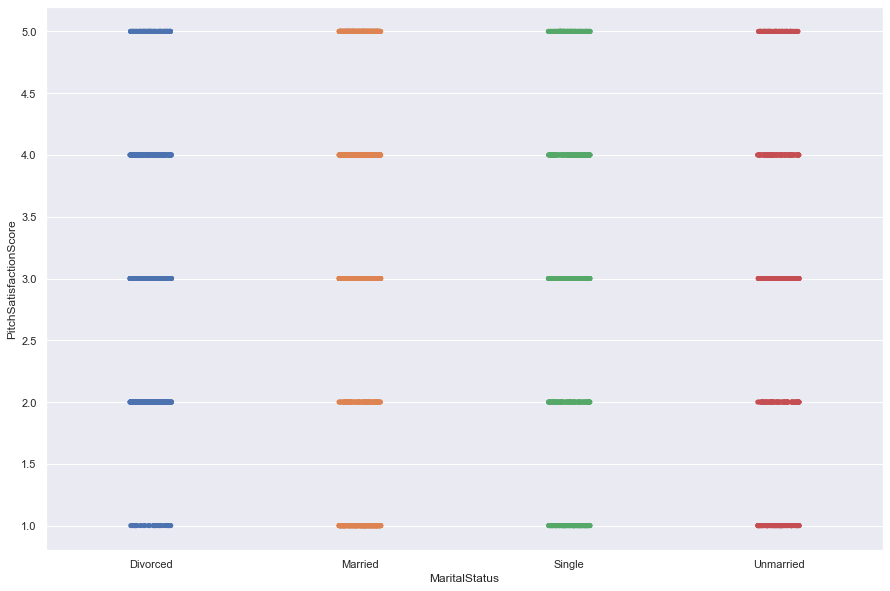

PitchSatisfactionScore by Designation Bar Plot


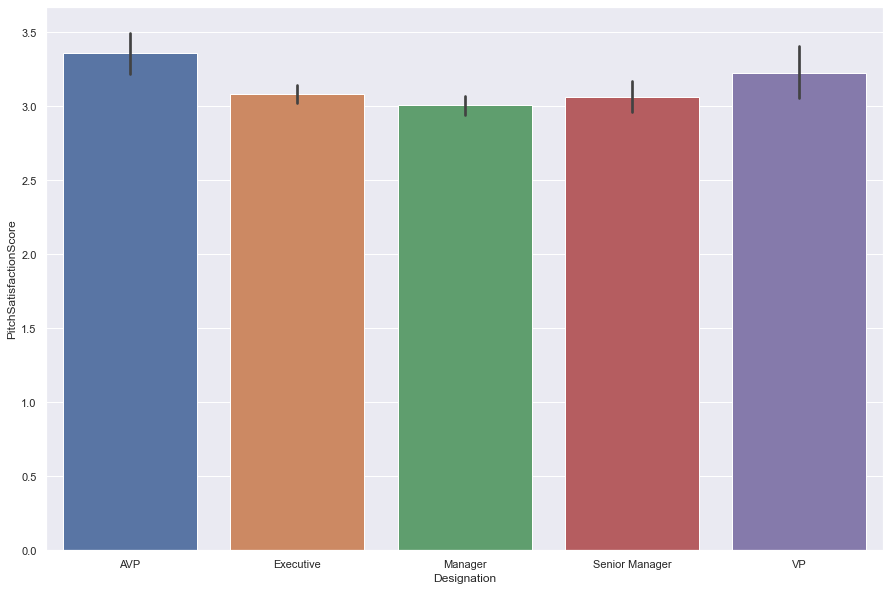

PitchSatisfactionScore by Designation Box Plot


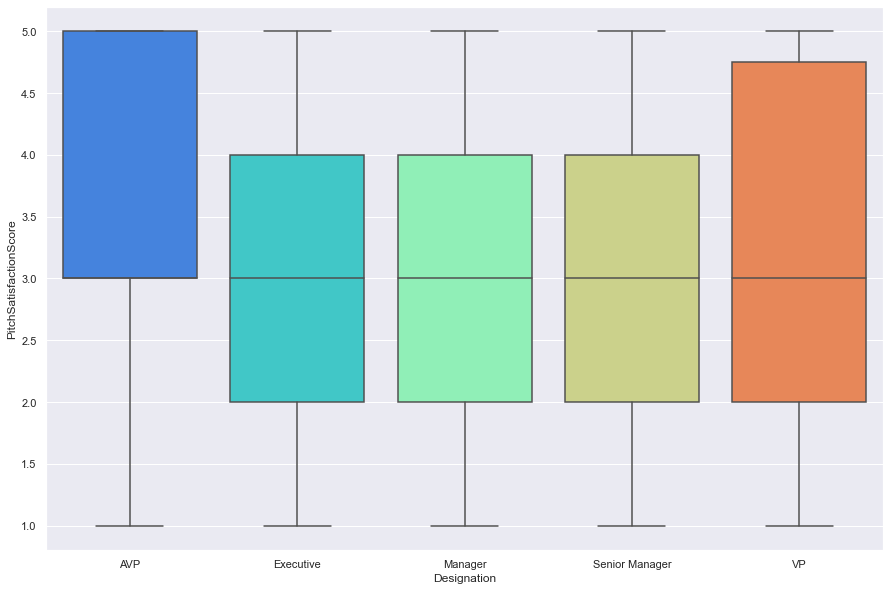

PitchSatisfactionScore by Designation Strip Plot


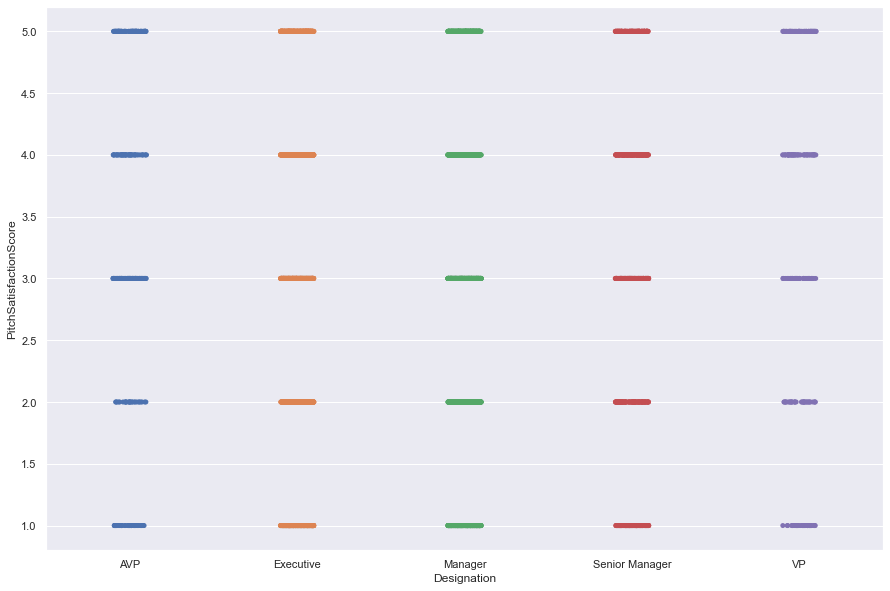

OwnCar by TypeofContact Bar Plot


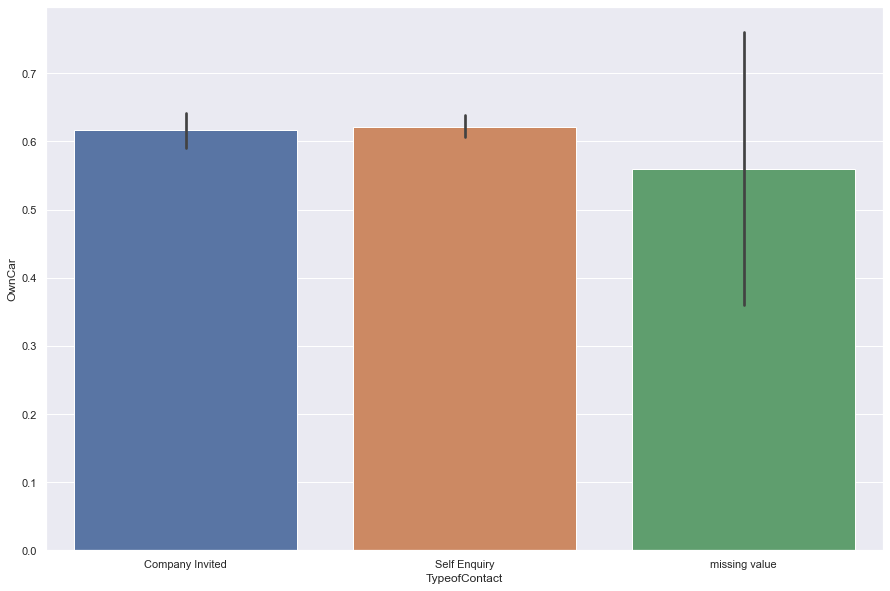

OwnCar by TypeofContact Box Plot


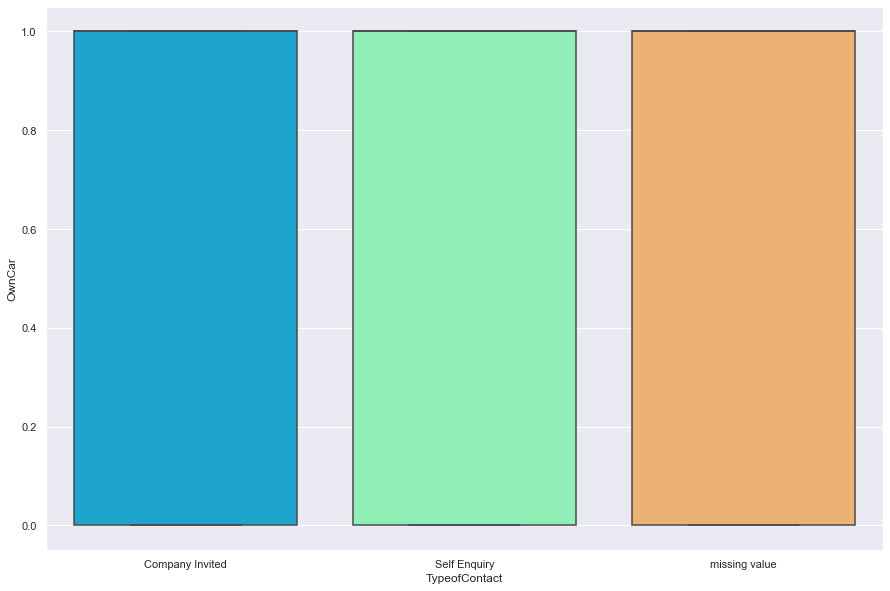

OwnCar by TypeofContact Strip Plot


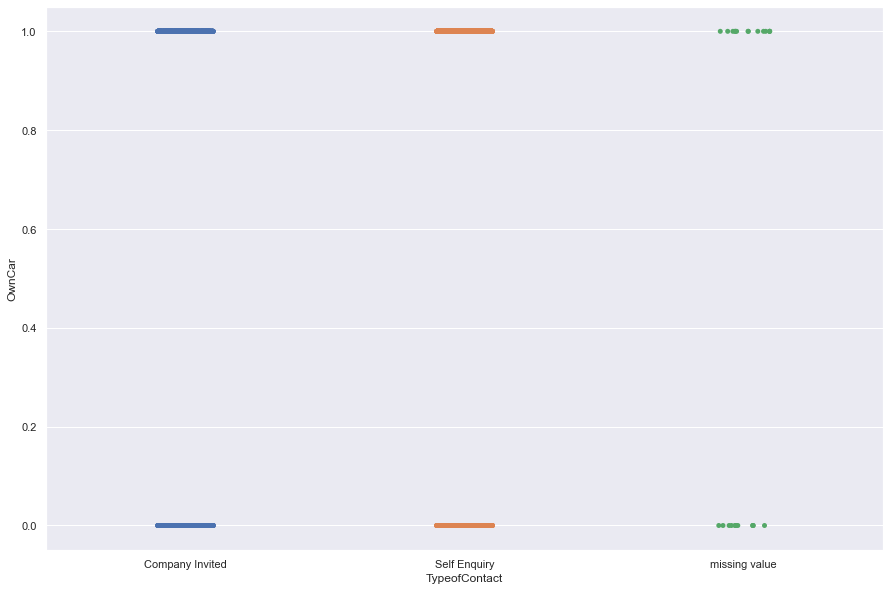

OwnCar by Occupation Bar Plot


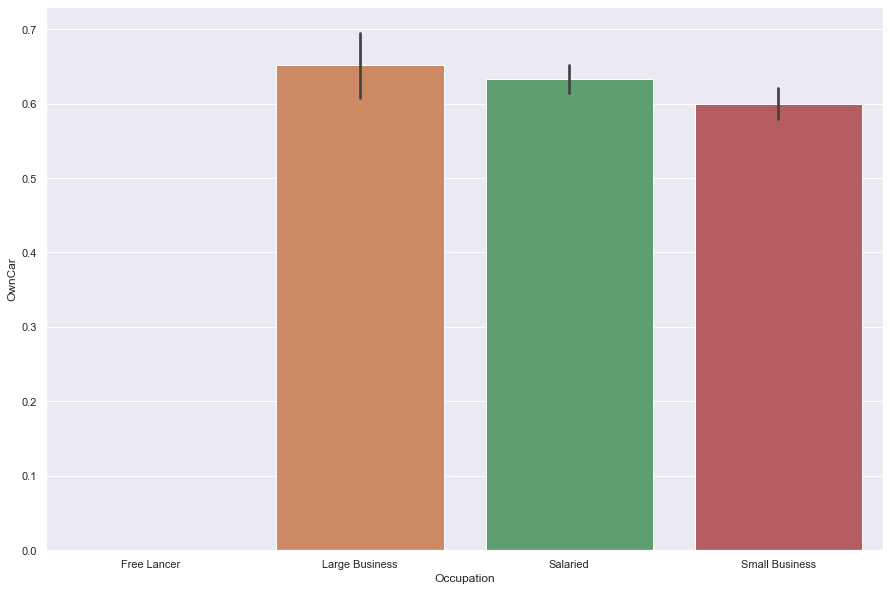

OwnCar by Occupation Box Plot


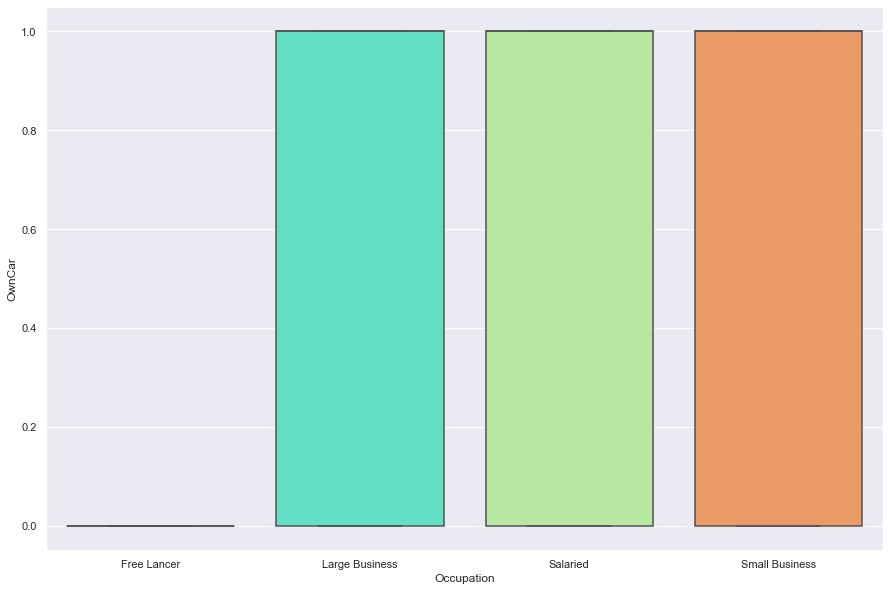

OwnCar by Occupation Strip Plot


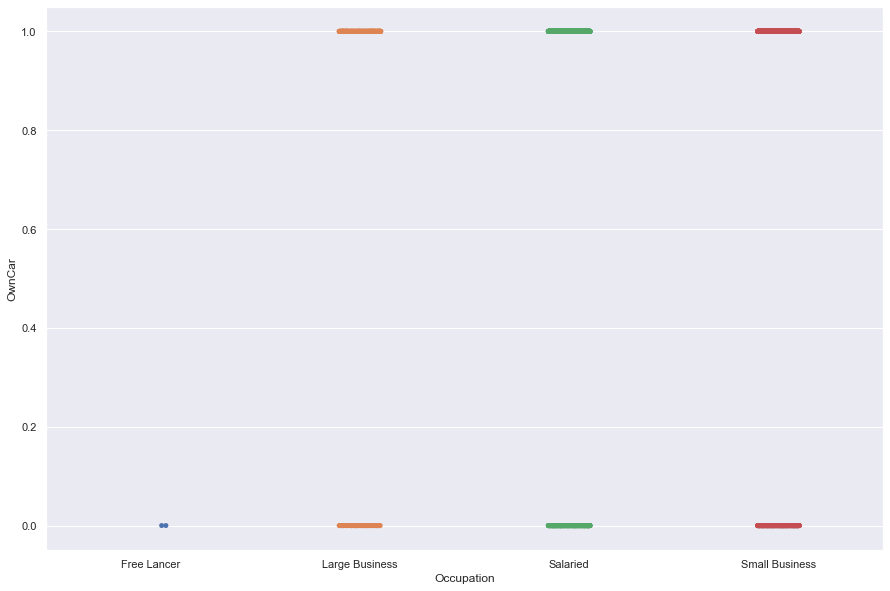

OwnCar by Gender Bar Plot


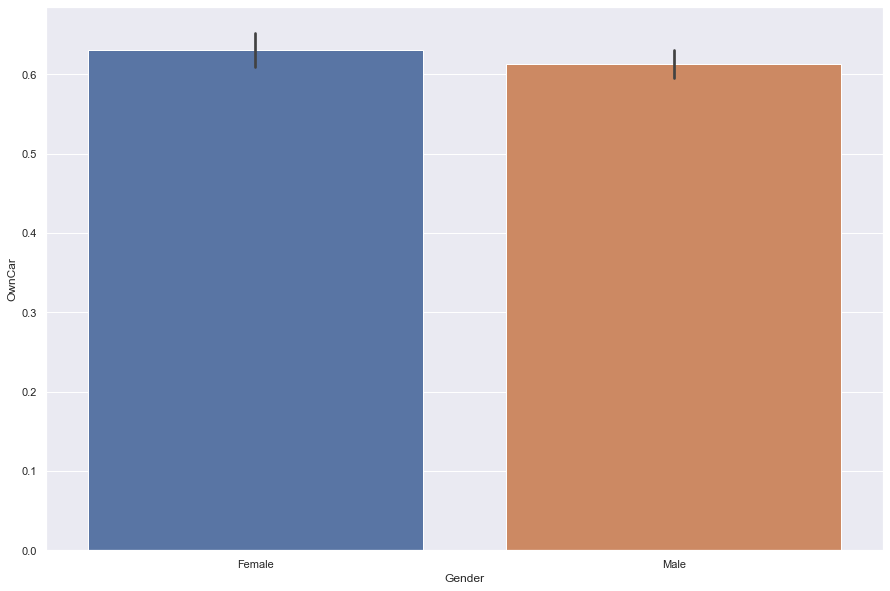

OwnCar by Gender Box Plot


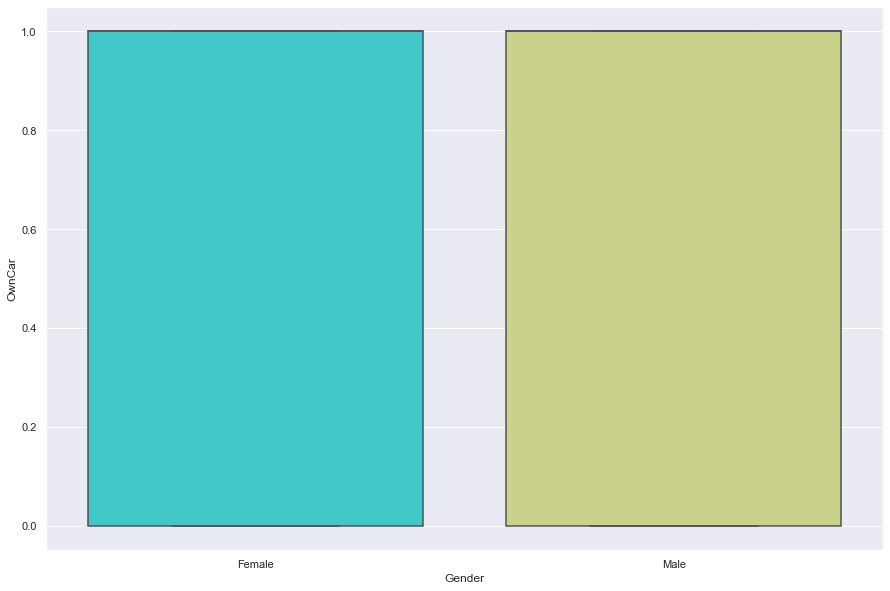

OwnCar by Gender Strip Plot


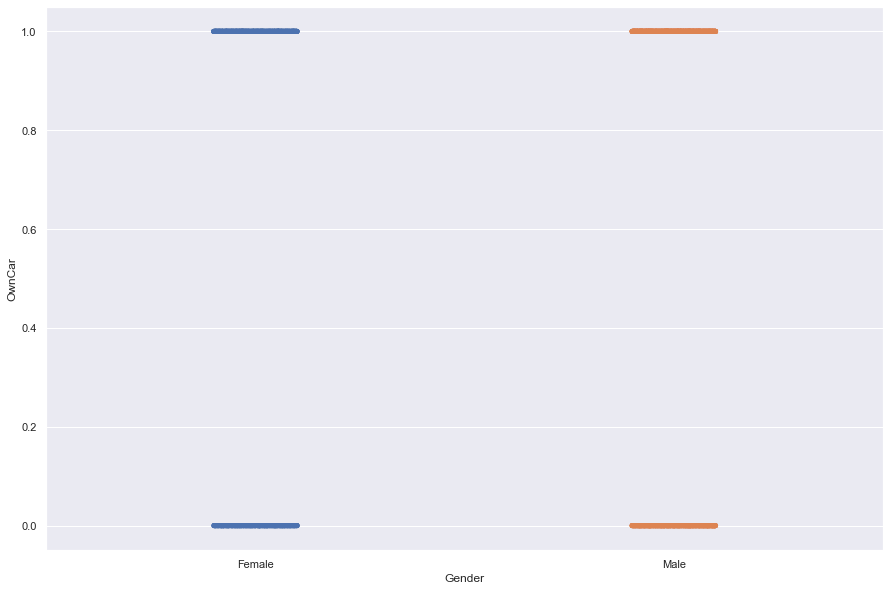

OwnCar by ProductPitched Bar Plot


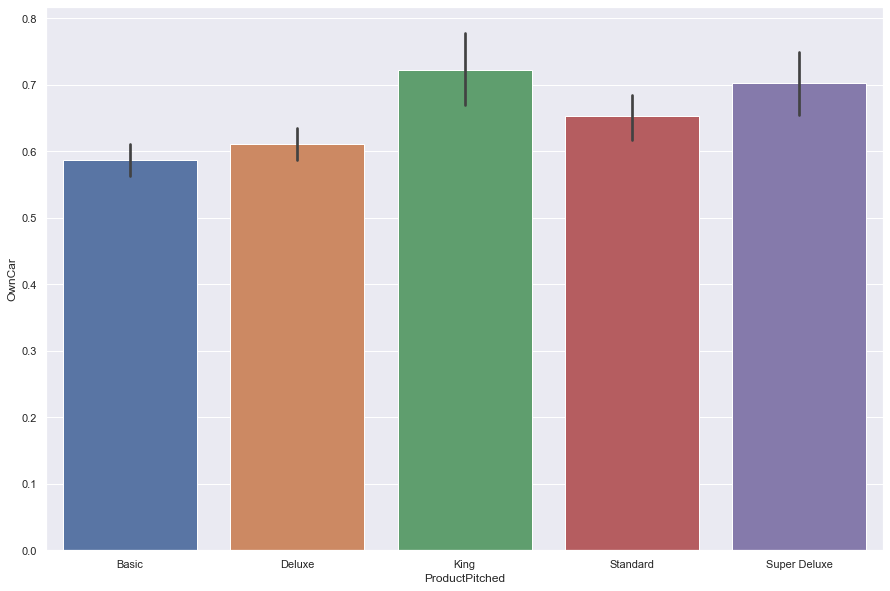

OwnCar by ProductPitched Box Plot


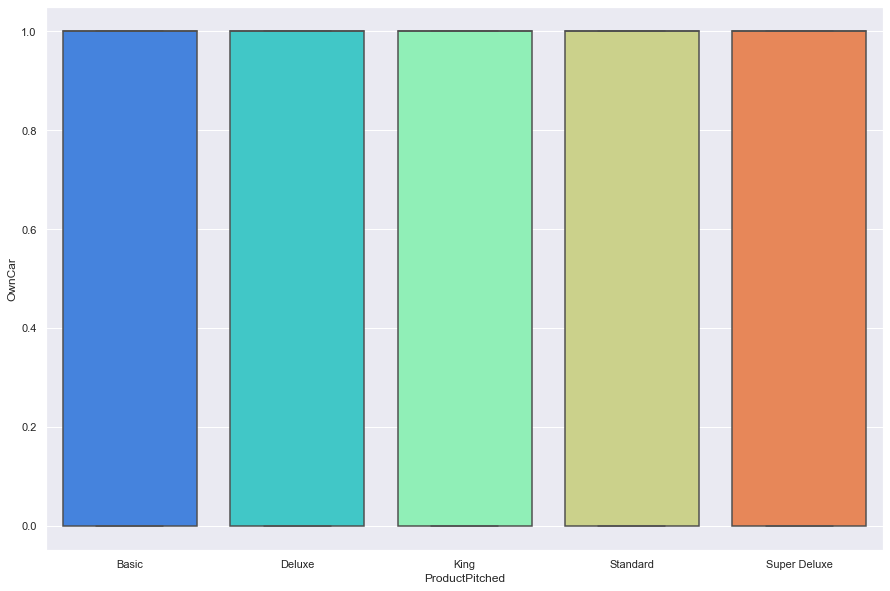

OwnCar by ProductPitched Strip Plot


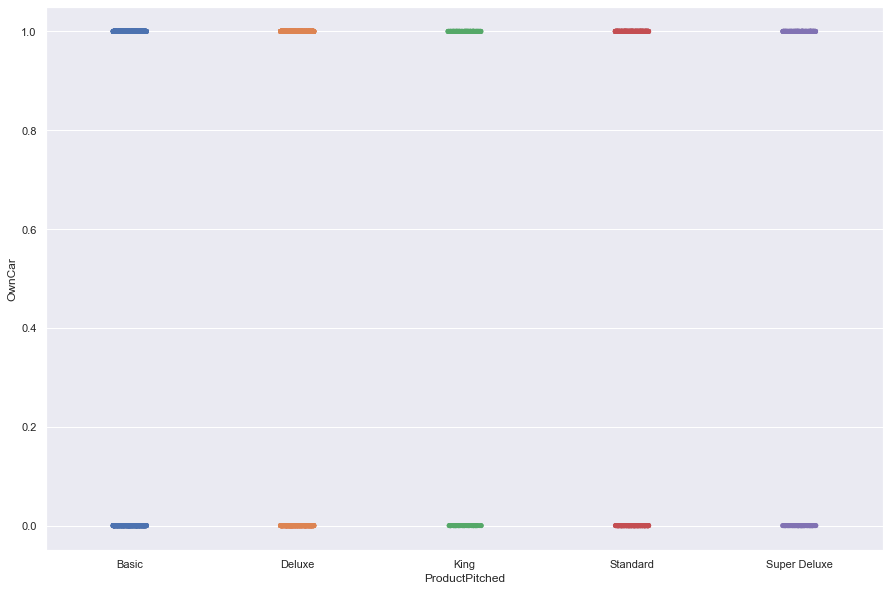

OwnCar by MaritalStatus Bar Plot


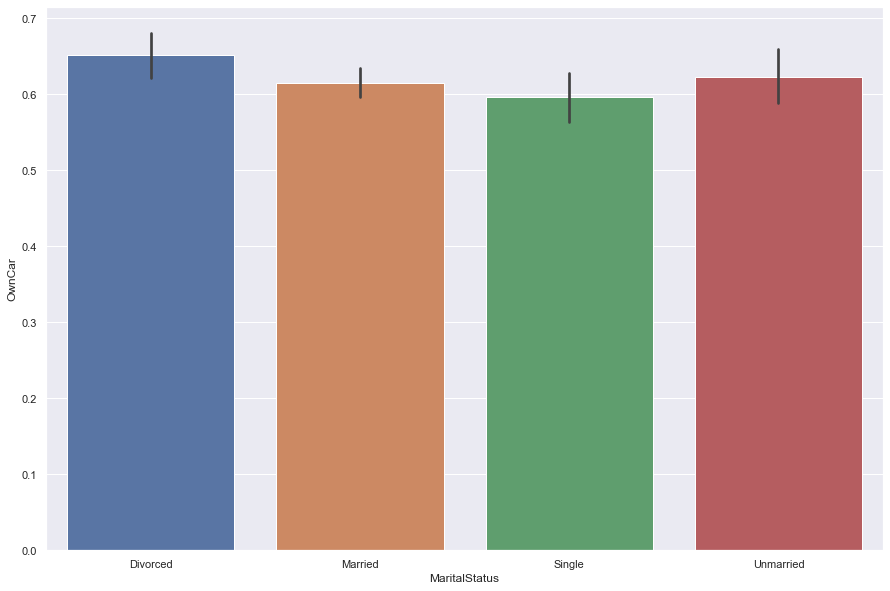

OwnCar by MaritalStatus Box Plot


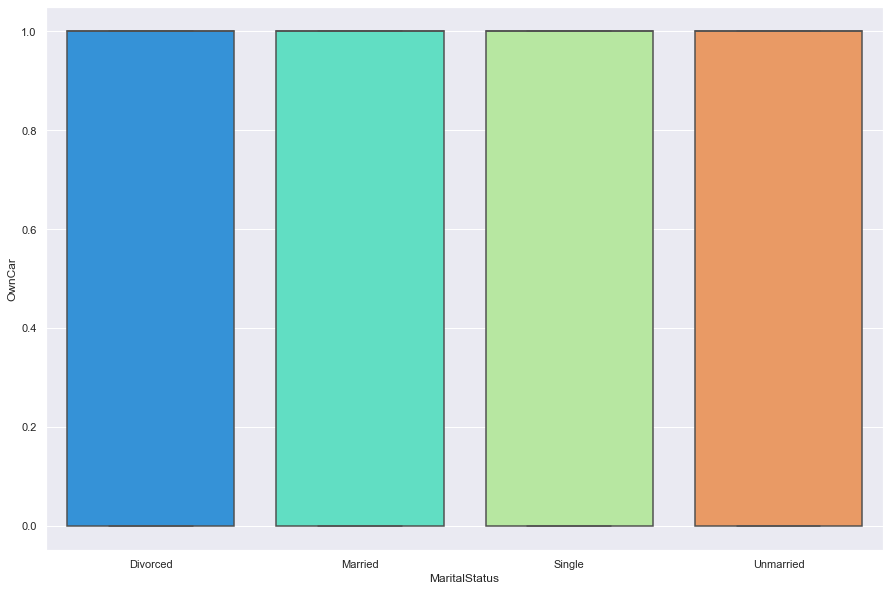

OwnCar by MaritalStatus Strip Plot


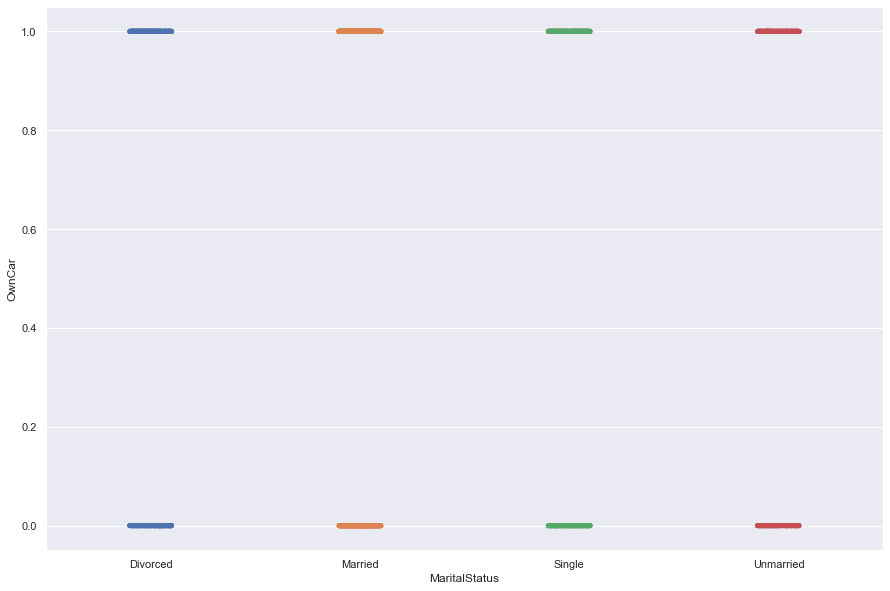

OwnCar by Designation Bar Plot


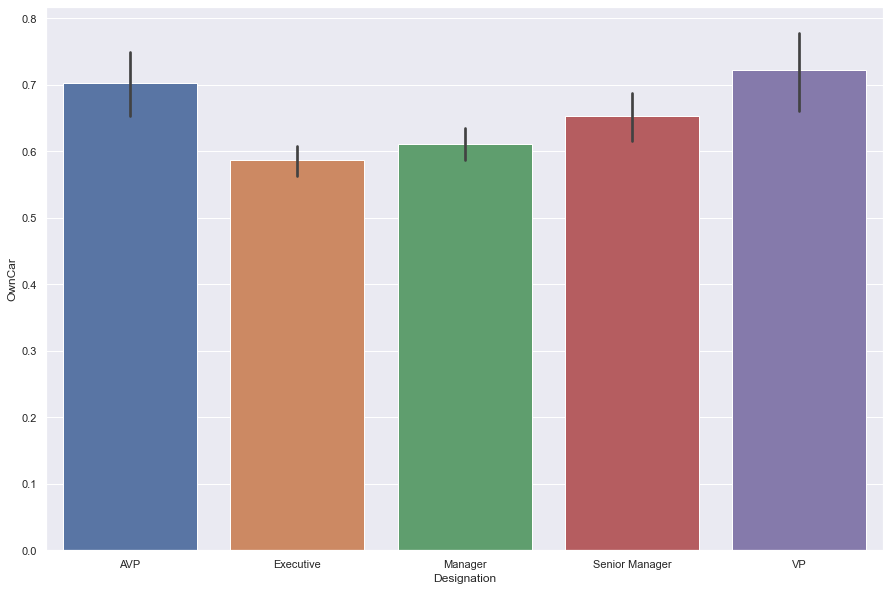

OwnCar by Designation Box Plot


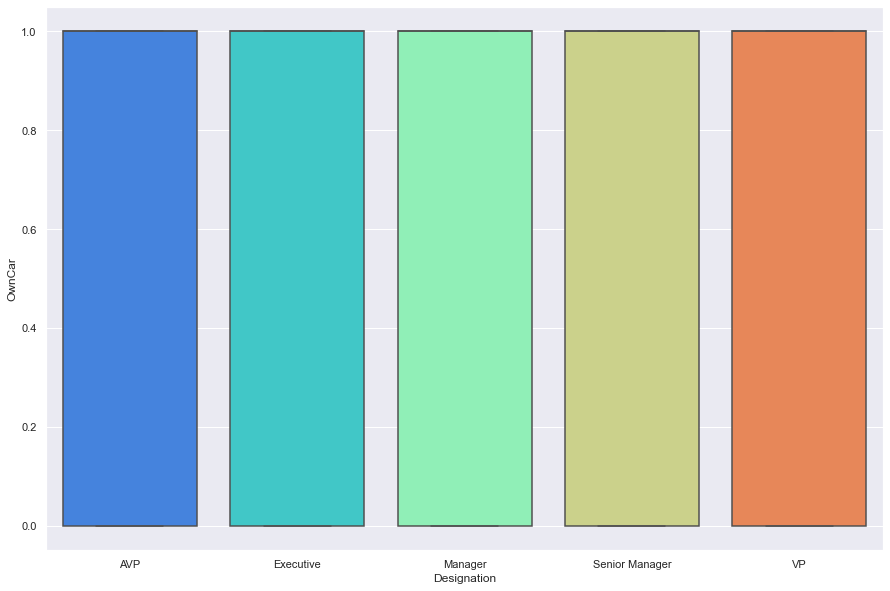

OwnCar by Designation Strip Plot


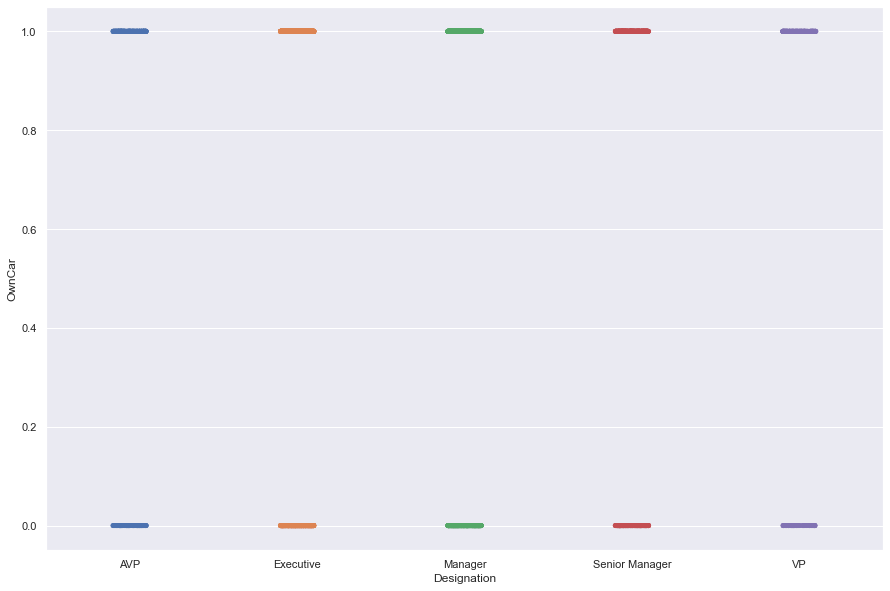

NumberOfChildrenVisiting by TypeofContact Bar Plot


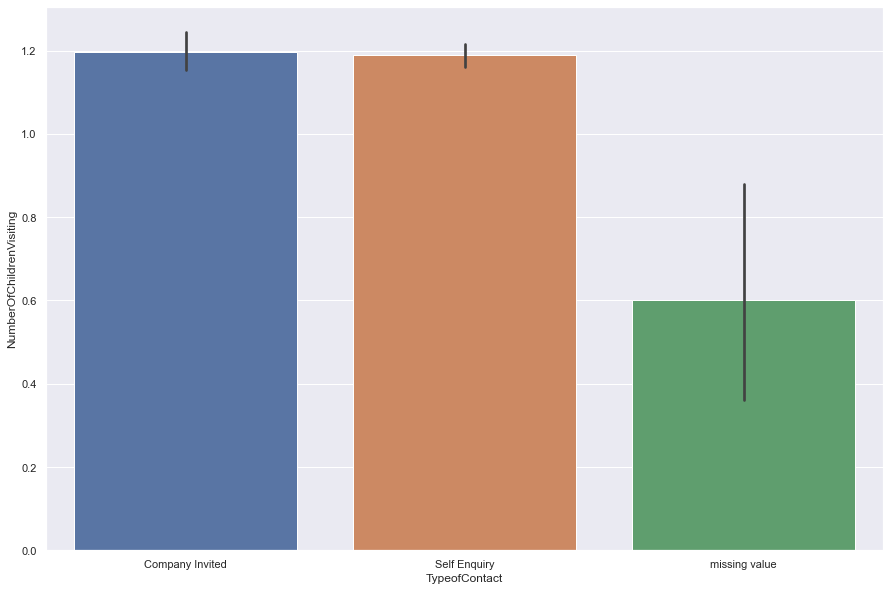

NumberOfChildrenVisiting by TypeofContact Box Plot


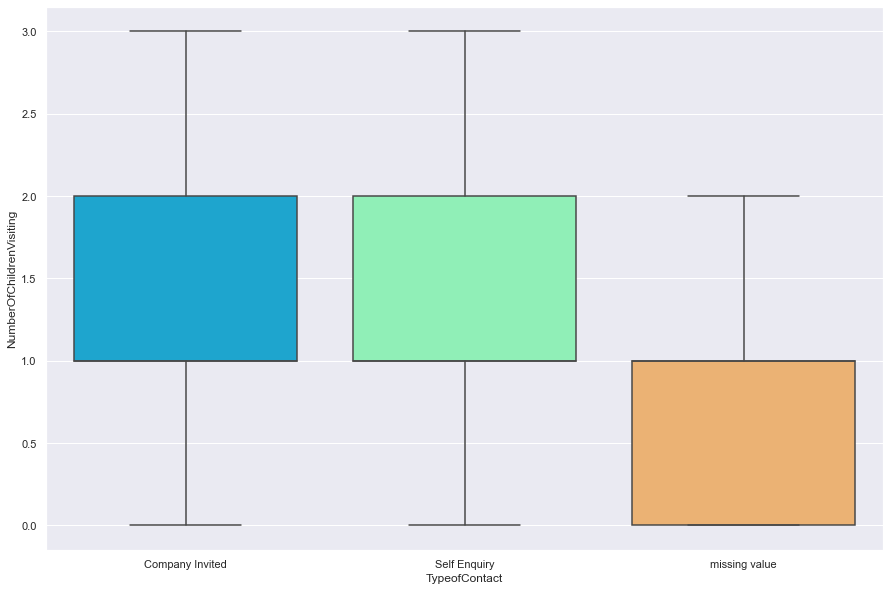

NumberOfChildrenVisiting by TypeofContact Strip Plot


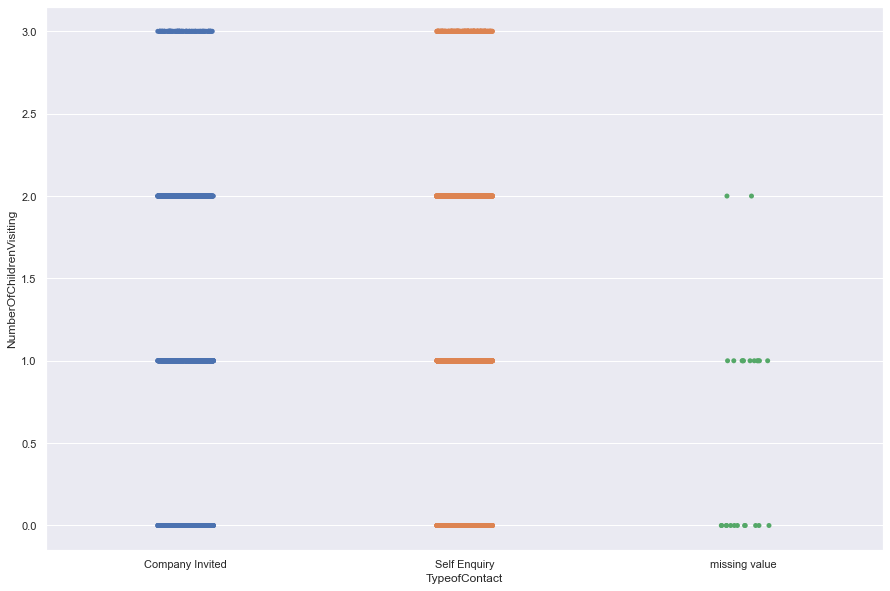

NumberOfChildrenVisiting by Occupation Bar Plot


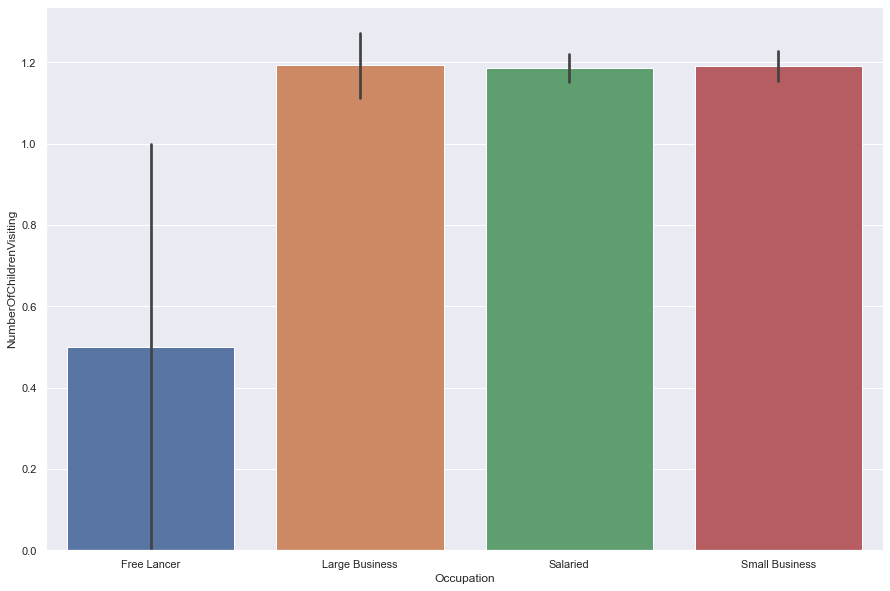

NumberOfChildrenVisiting by Occupation Box Plot


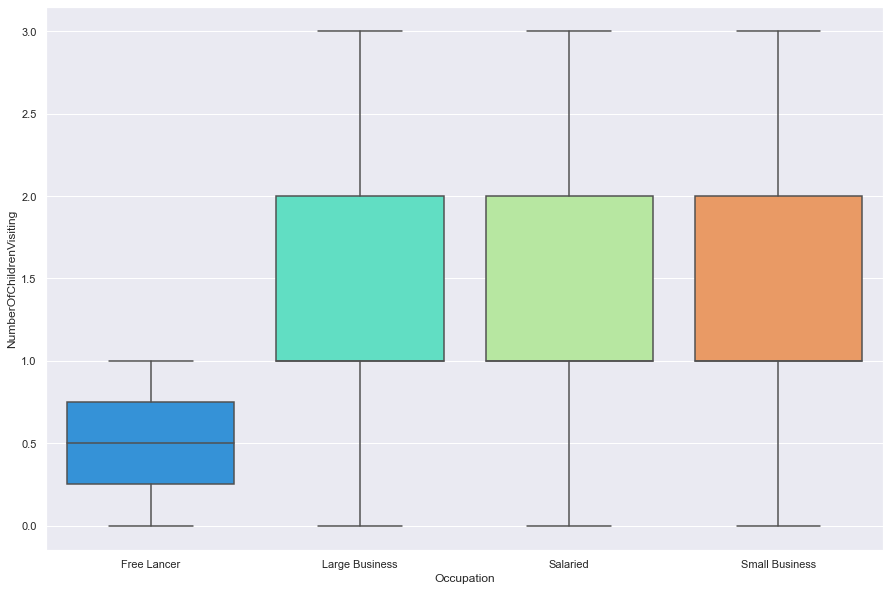

NumberOfChildrenVisiting by Occupation Strip Plot


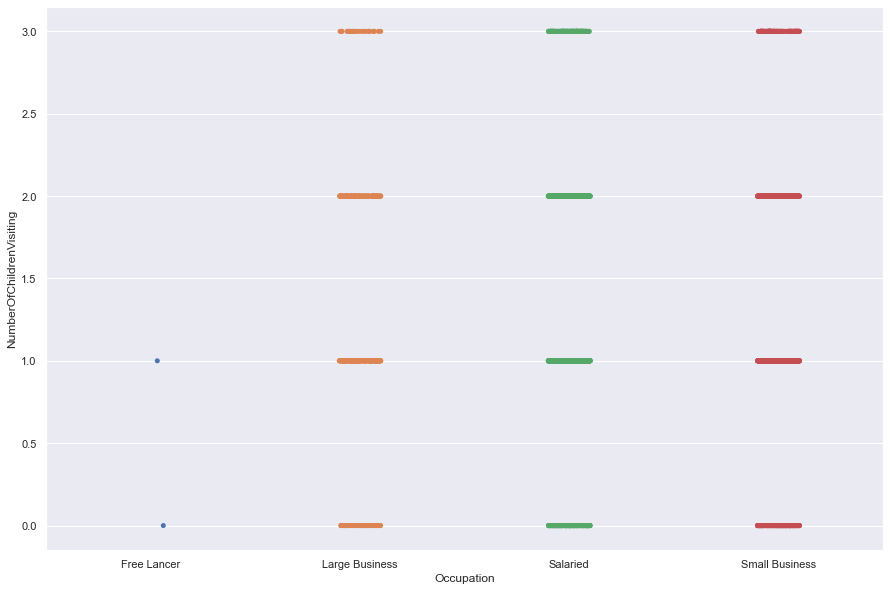

NumberOfChildrenVisiting by Gender Bar Plot


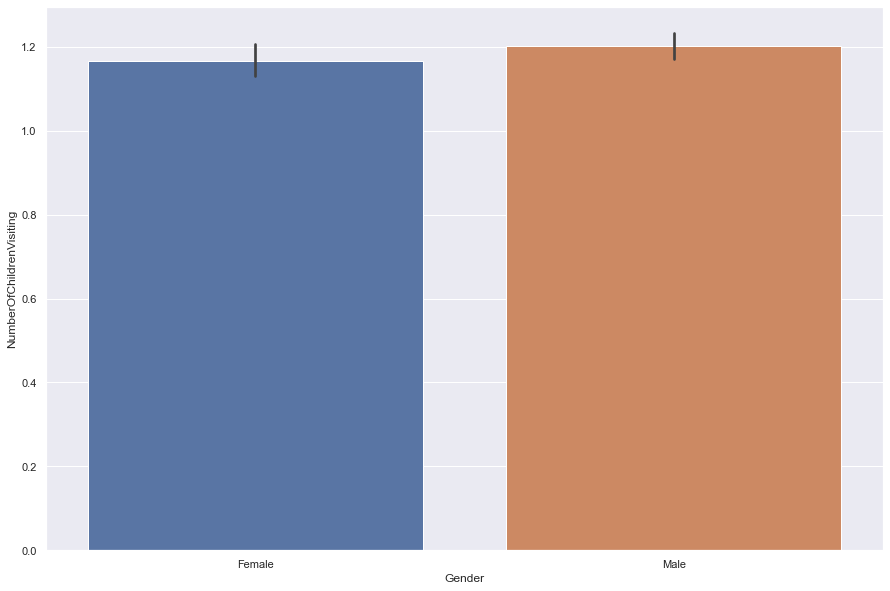

NumberOfChildrenVisiting by Gender Box Plot


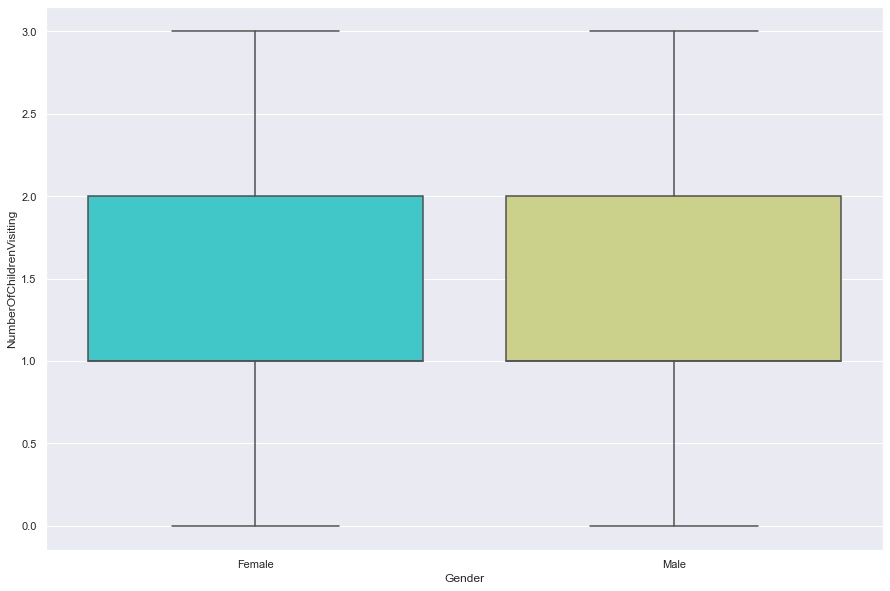

NumberOfChildrenVisiting by Gender Strip Plot


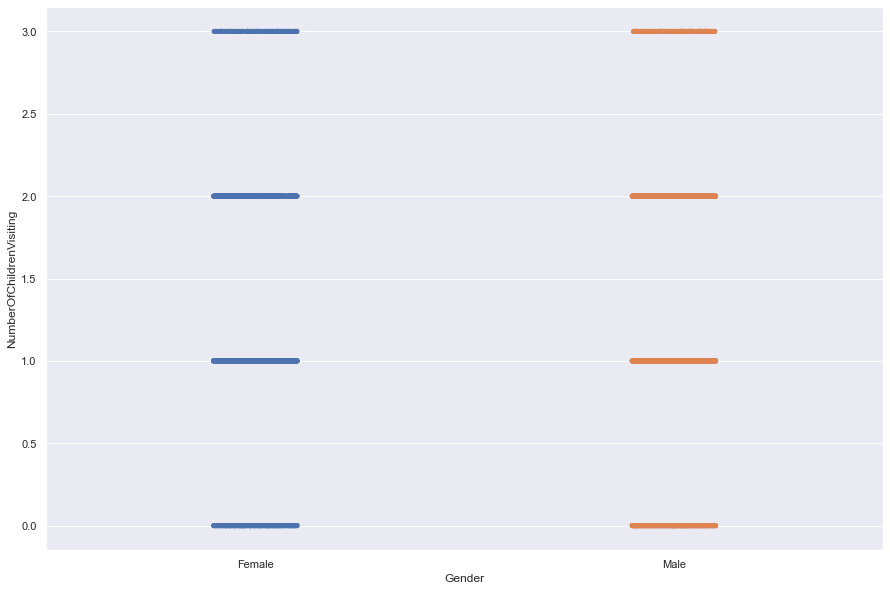

NumberOfChildrenVisiting by ProductPitched Bar Plot


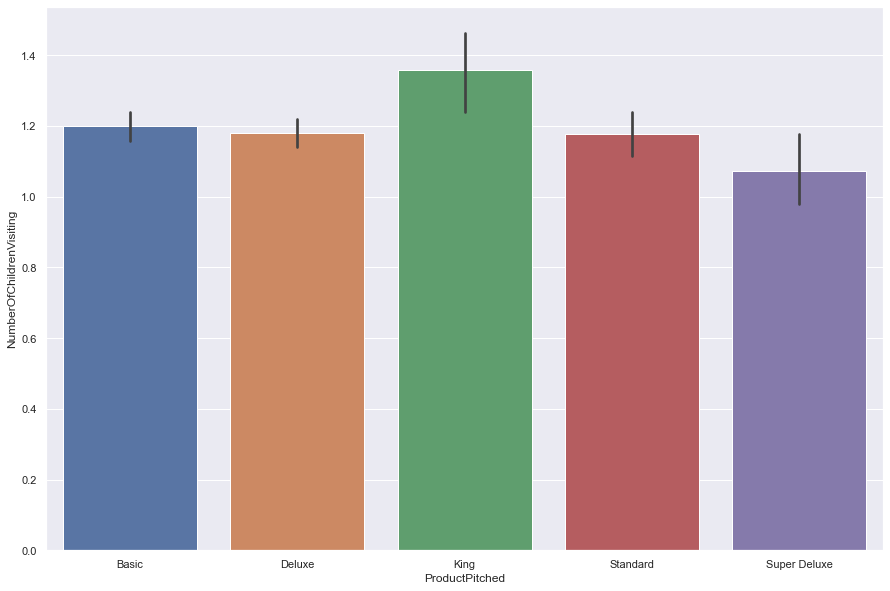

NumberOfChildrenVisiting by ProductPitched Box Plot


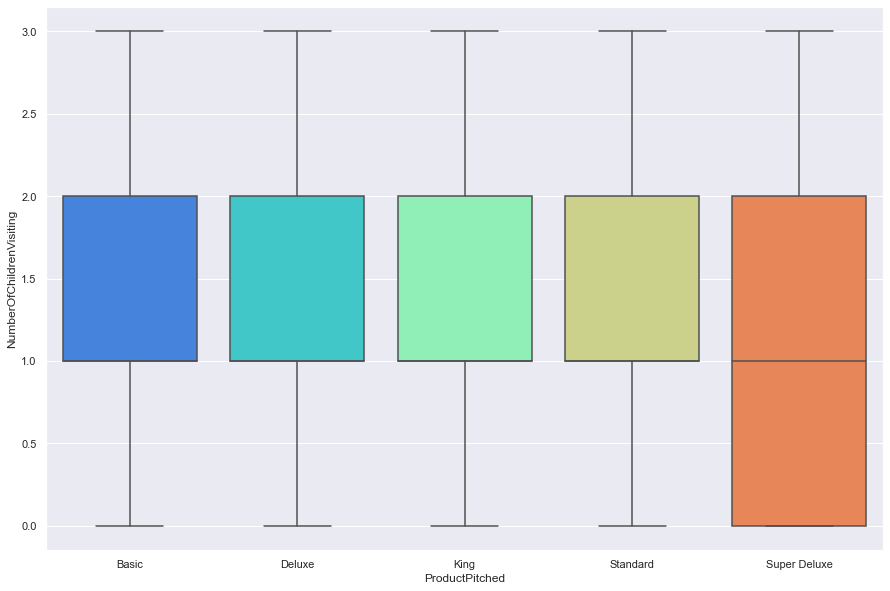

NumberOfChildrenVisiting by ProductPitched Strip Plot


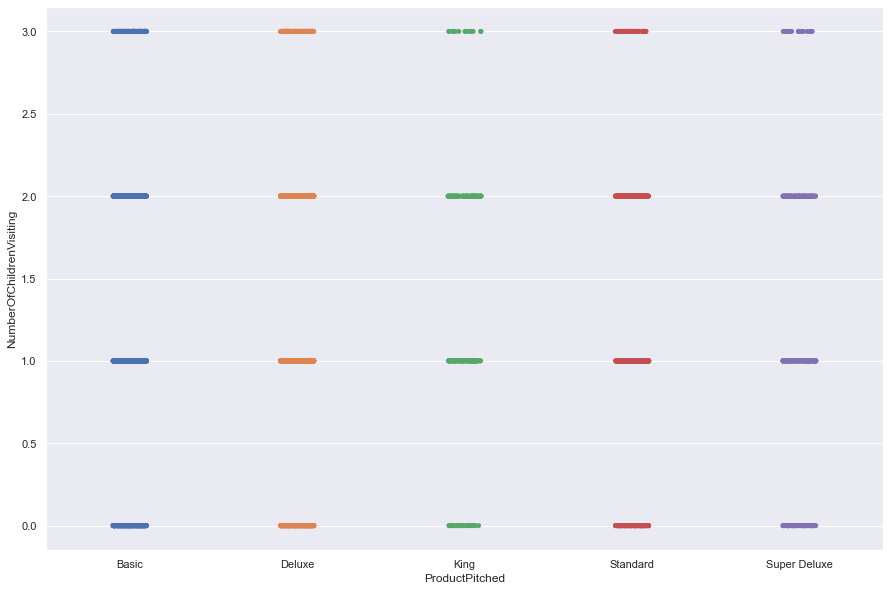

NumberOfChildrenVisiting by MaritalStatus Bar Plot


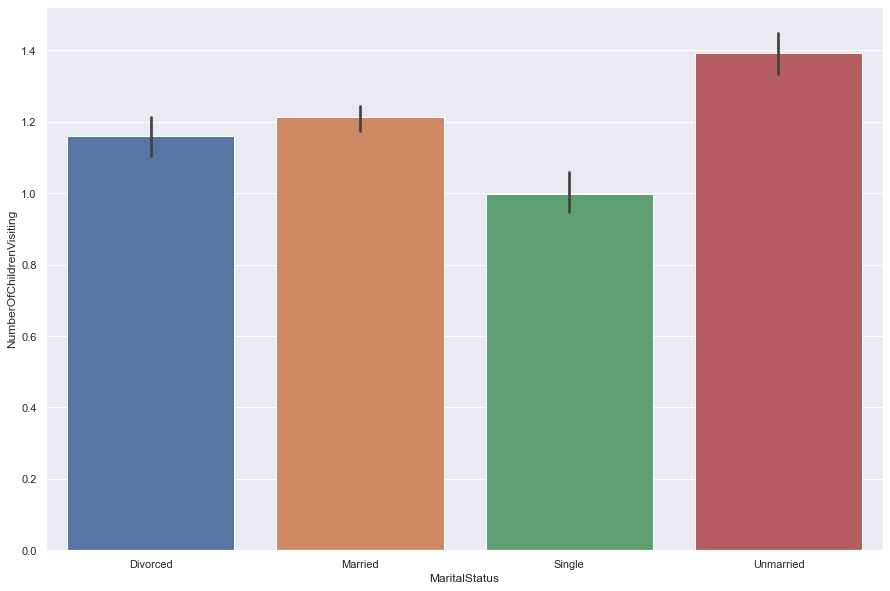

NumberOfChildrenVisiting by MaritalStatus Box Plot


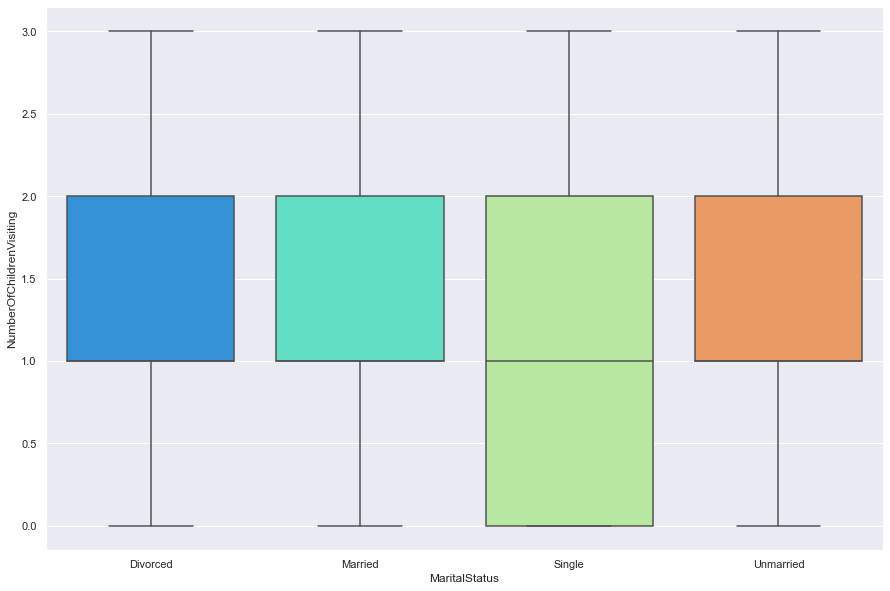

NumberOfChildrenVisiting by MaritalStatus Strip Plot


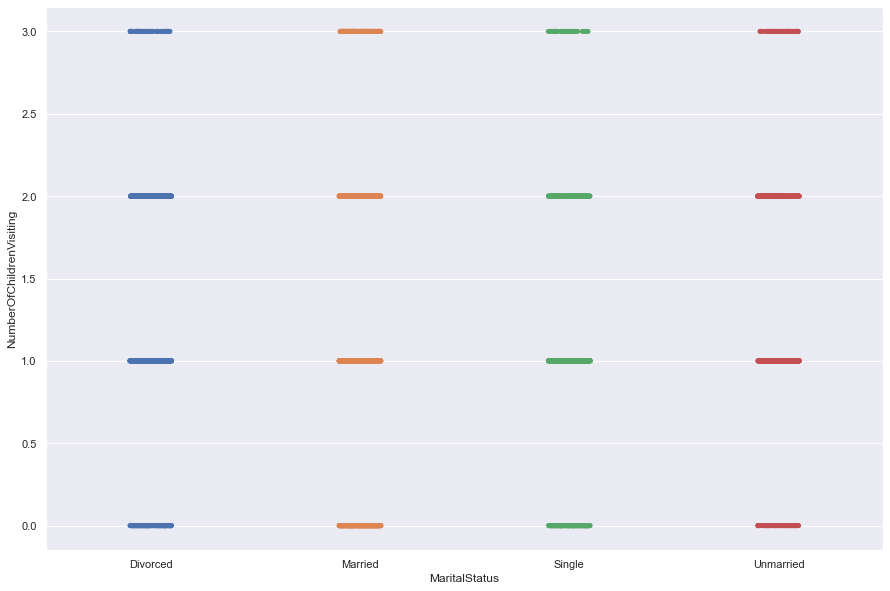

NumberOfChildrenVisiting by Designation Bar Plot


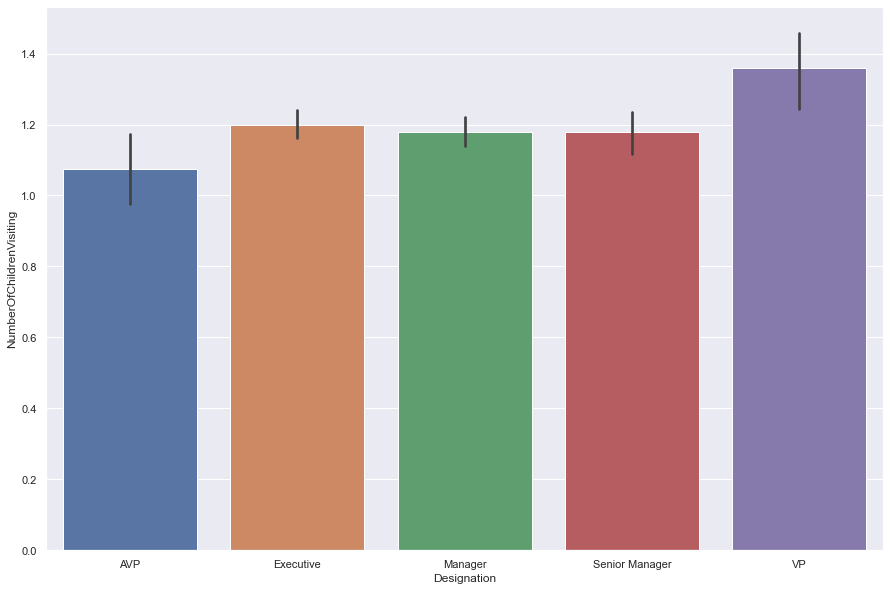

NumberOfChildrenVisiting by Designation Box Plot


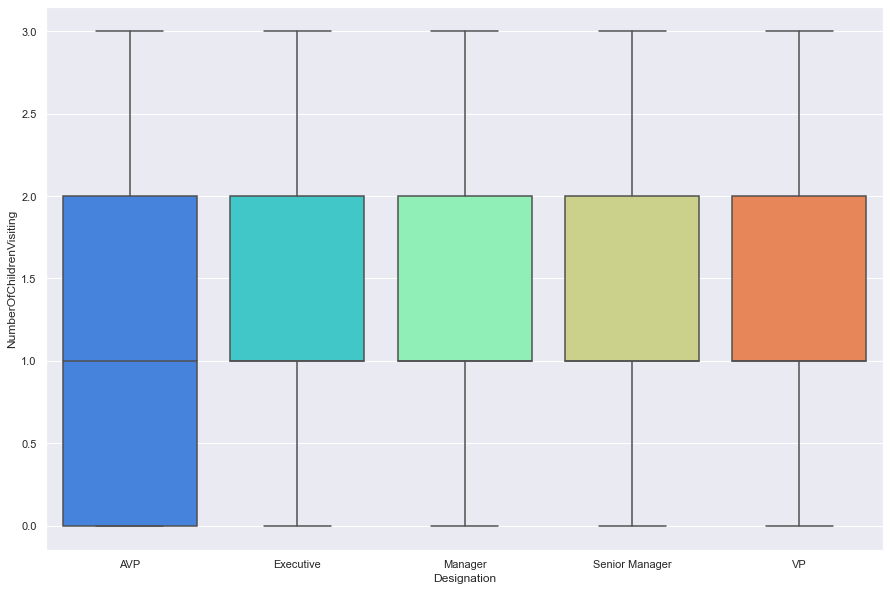

NumberOfChildrenVisiting by Designation Strip Plot


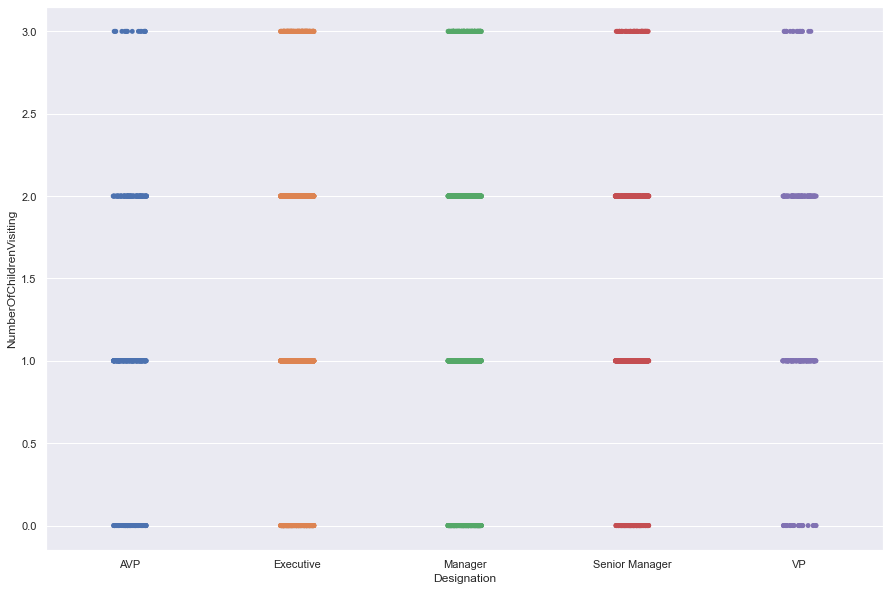

MonthlyIncome by TypeofContact Bar Plot


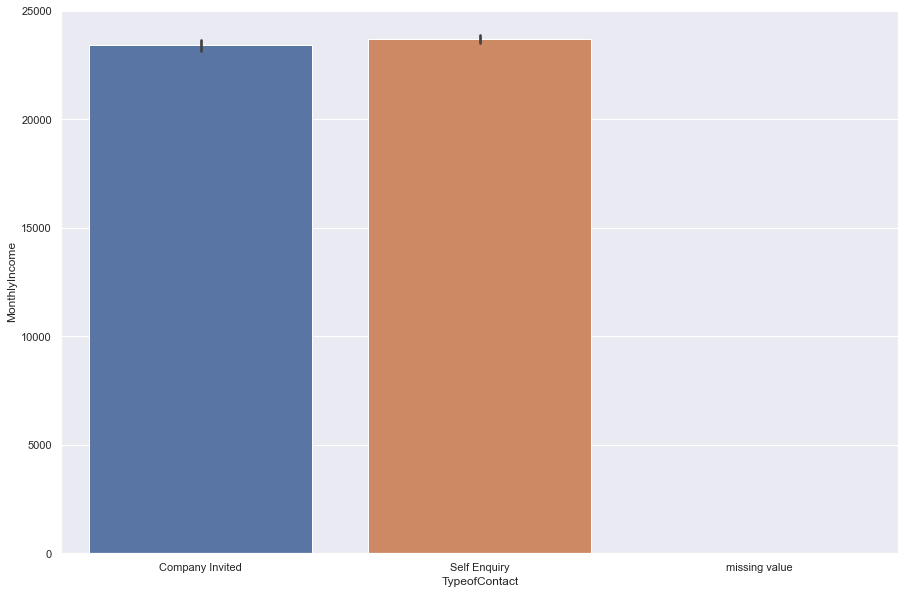

MonthlyIncome by TypeofContact Box Plot


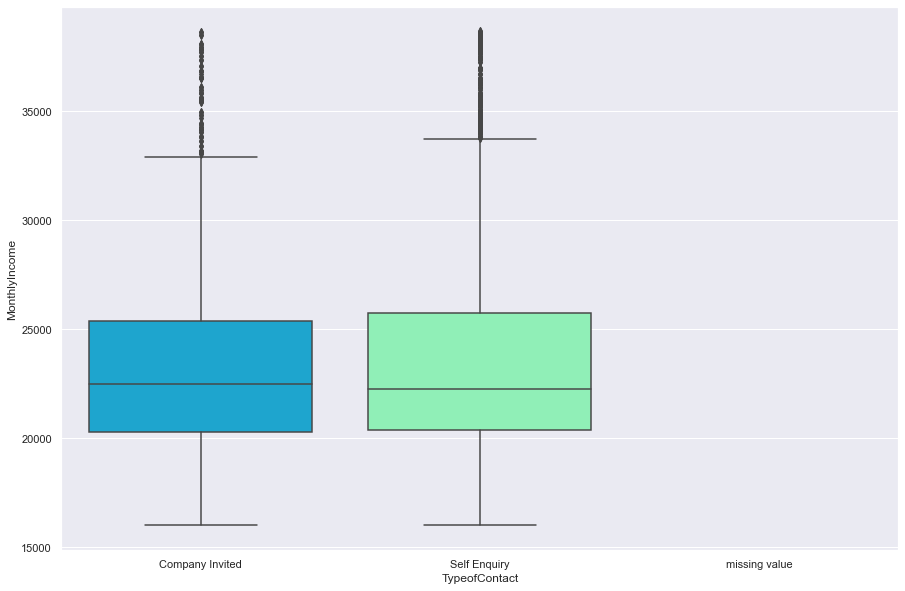

MonthlyIncome by TypeofContact Strip Plot


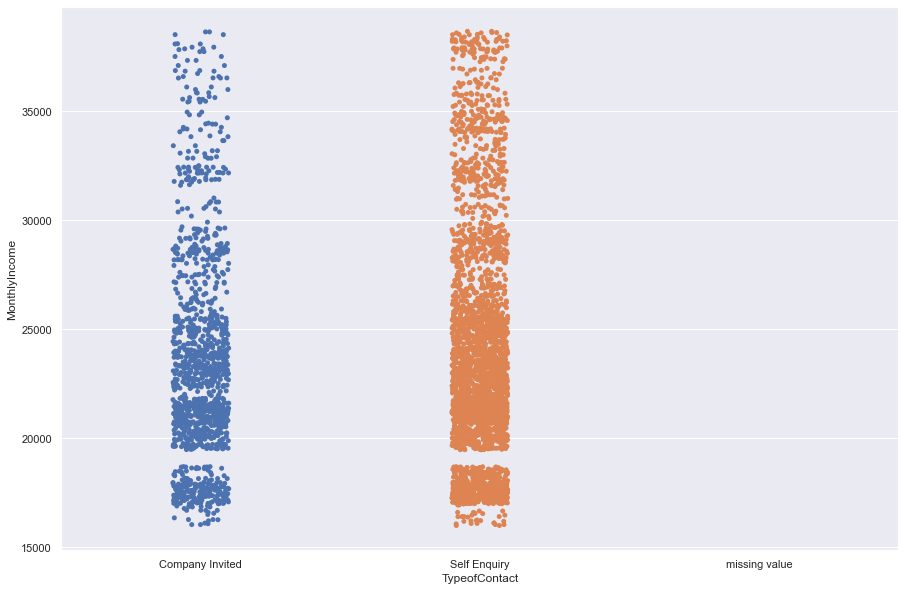

MonthlyIncome by Occupation Bar Plot


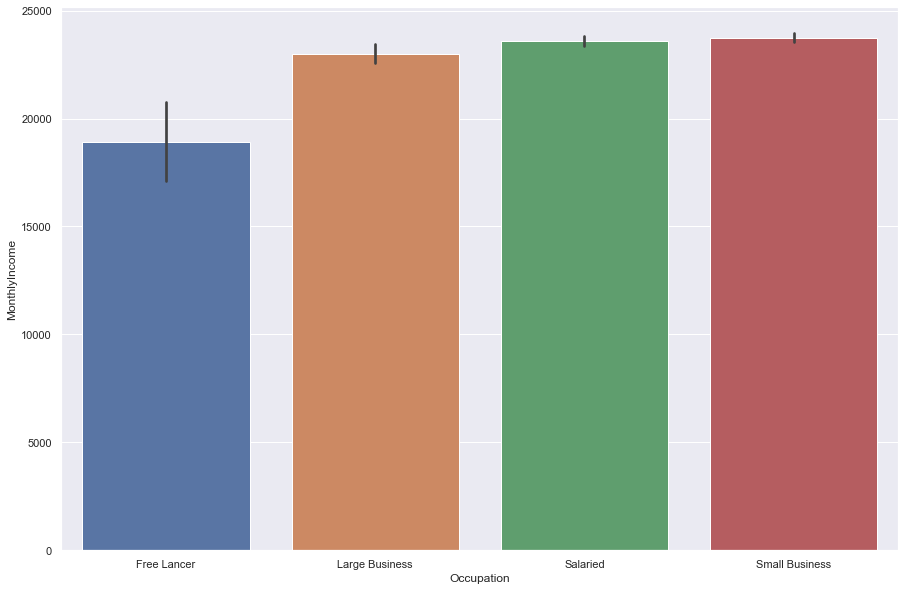

MonthlyIncome by Occupation Box Plot


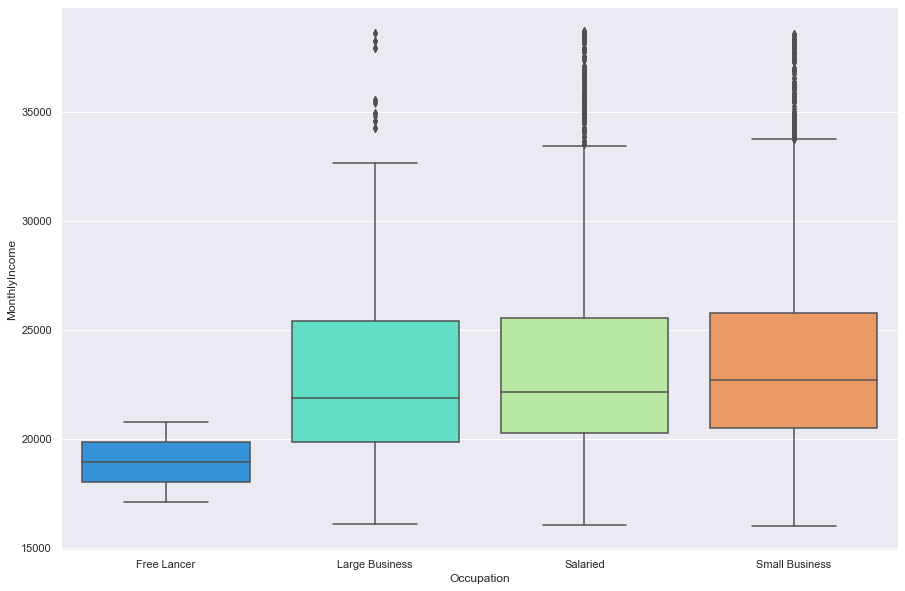

MonthlyIncome by Occupation Strip Plot


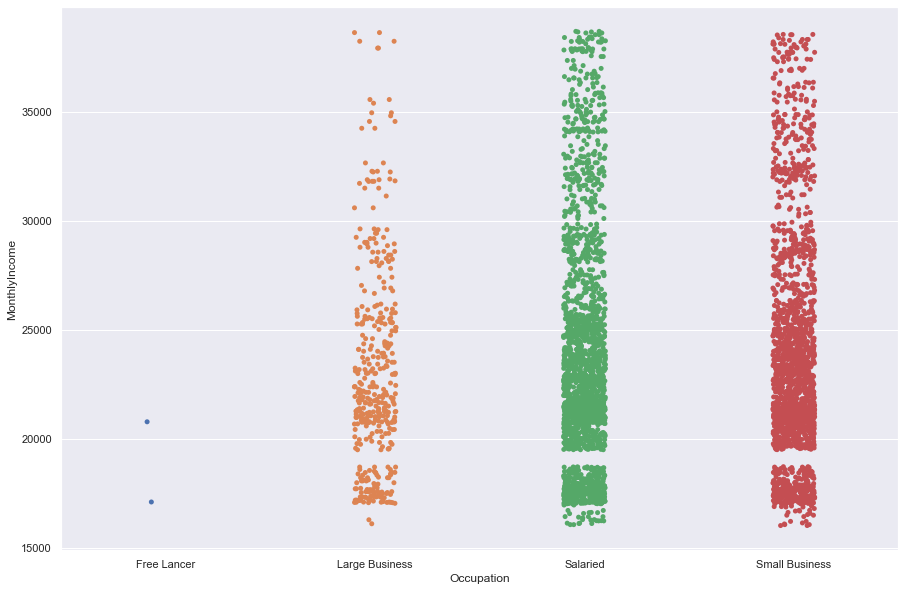

MonthlyIncome by Gender Bar Plot


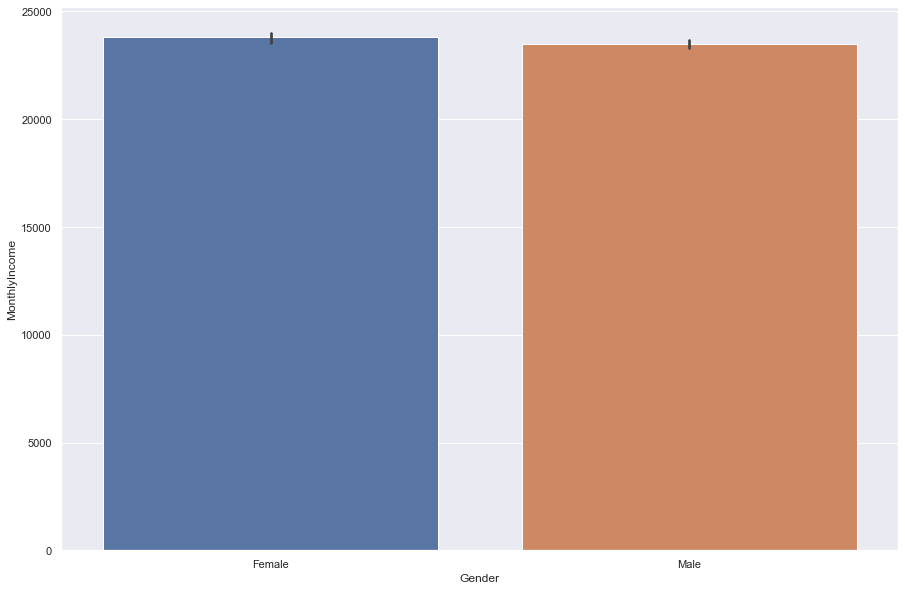

MonthlyIncome by Gender Box Plot


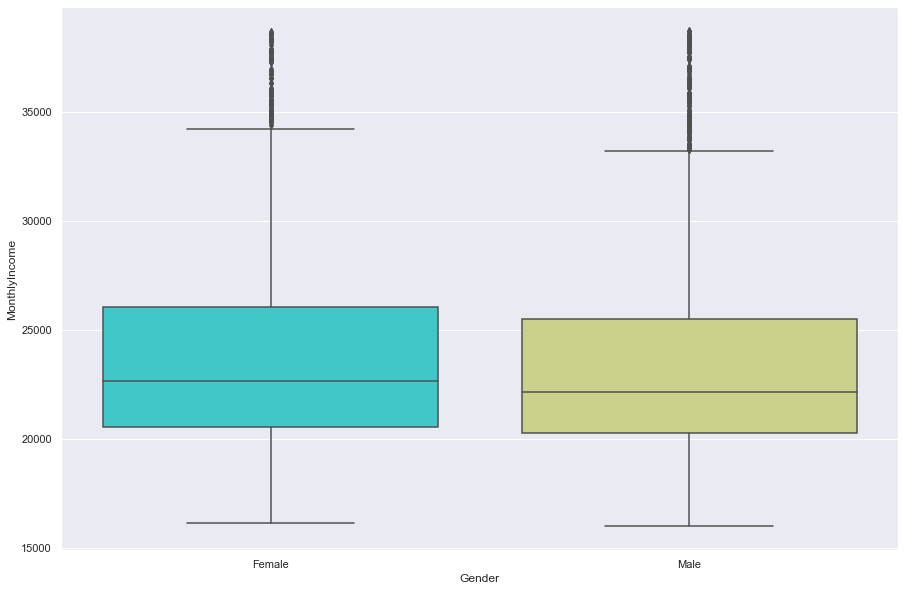

MonthlyIncome by Gender Strip Plot


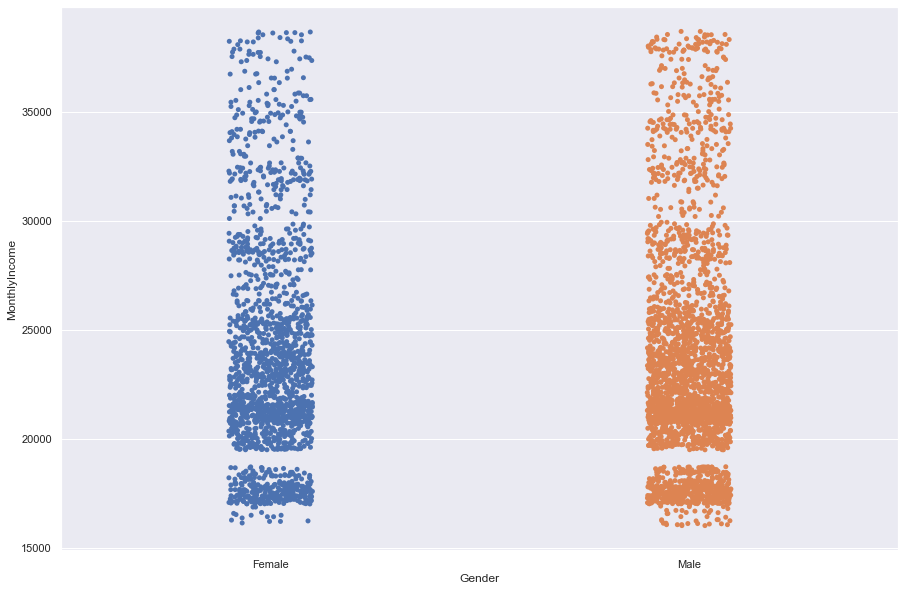

MonthlyIncome by ProductPitched Bar Plot


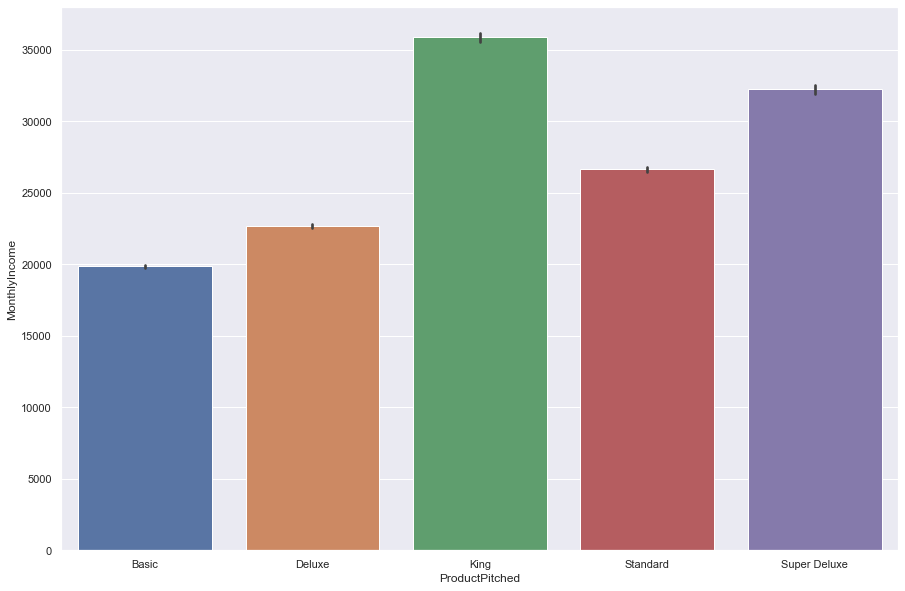

MonthlyIncome by ProductPitched Box Plot


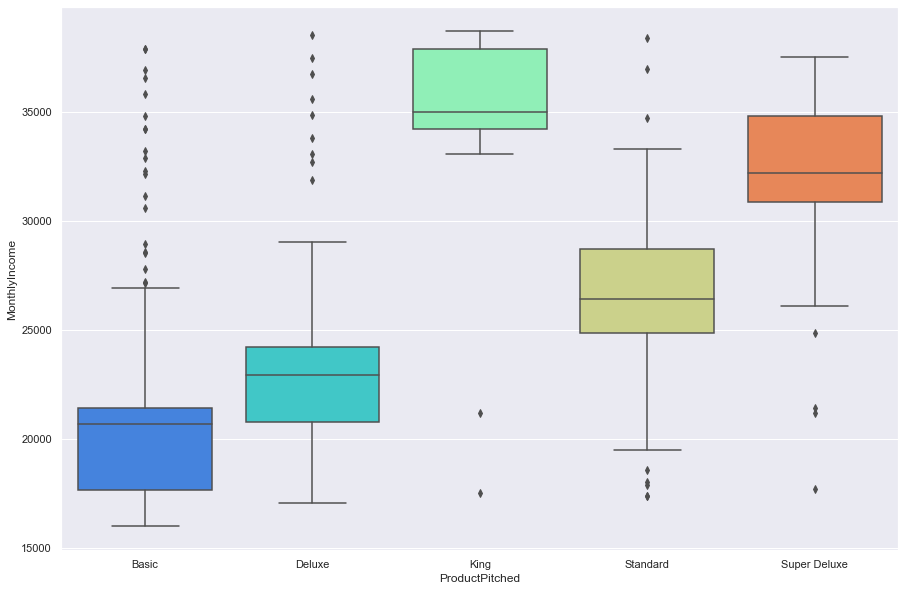

MonthlyIncome by ProductPitched Strip Plot


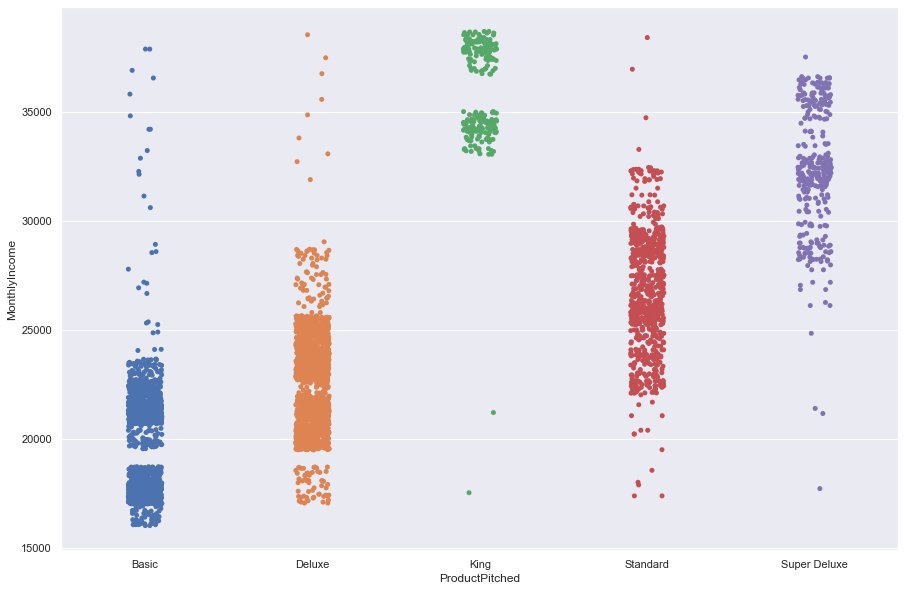

MonthlyIncome by MaritalStatus Bar Plot


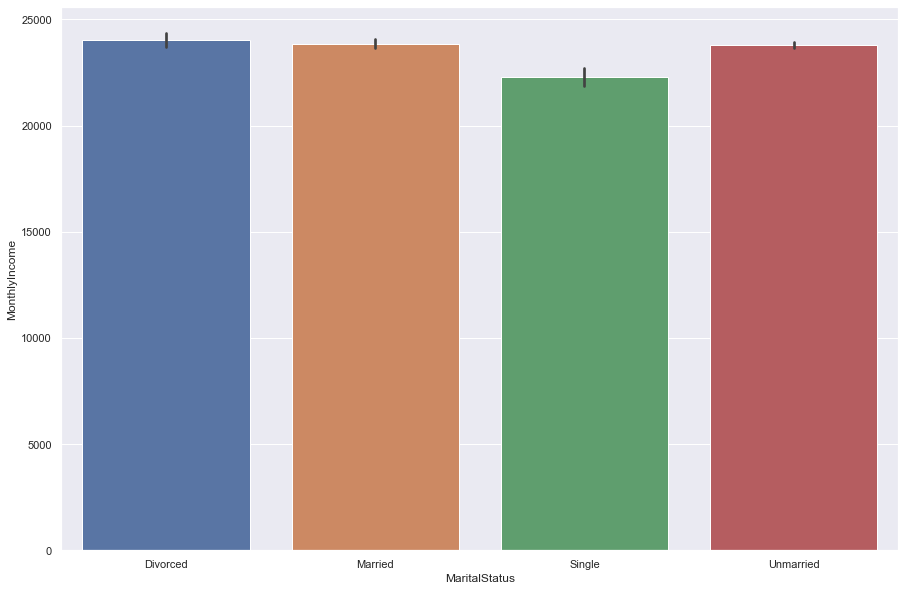

MonthlyIncome by MaritalStatus Box Plot


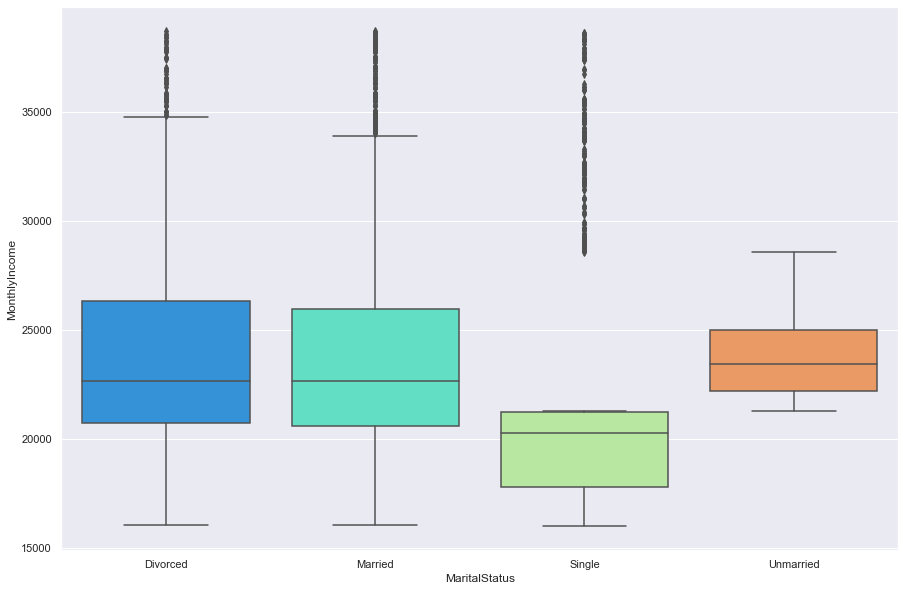

MonthlyIncome by MaritalStatus Strip Plot


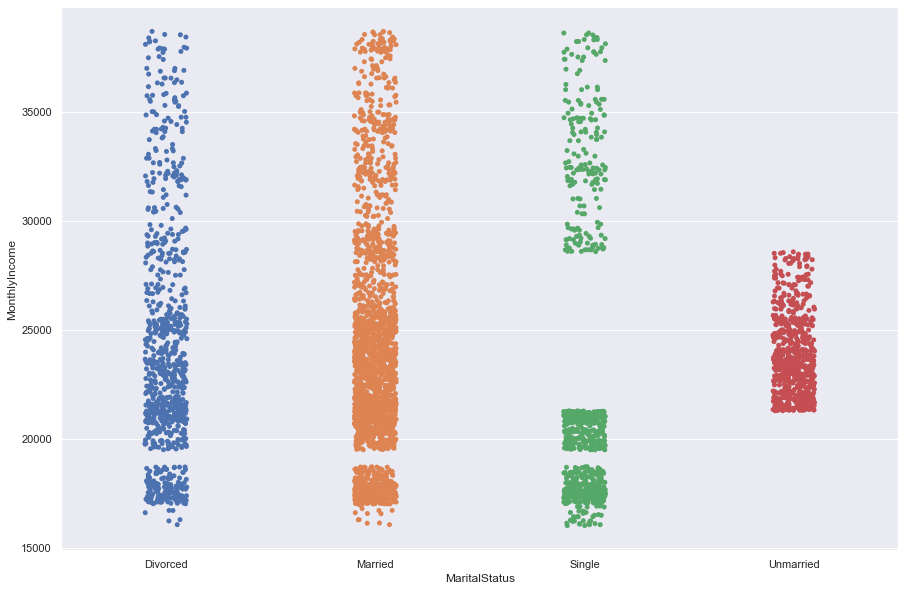

MonthlyIncome by Designation Bar Plot


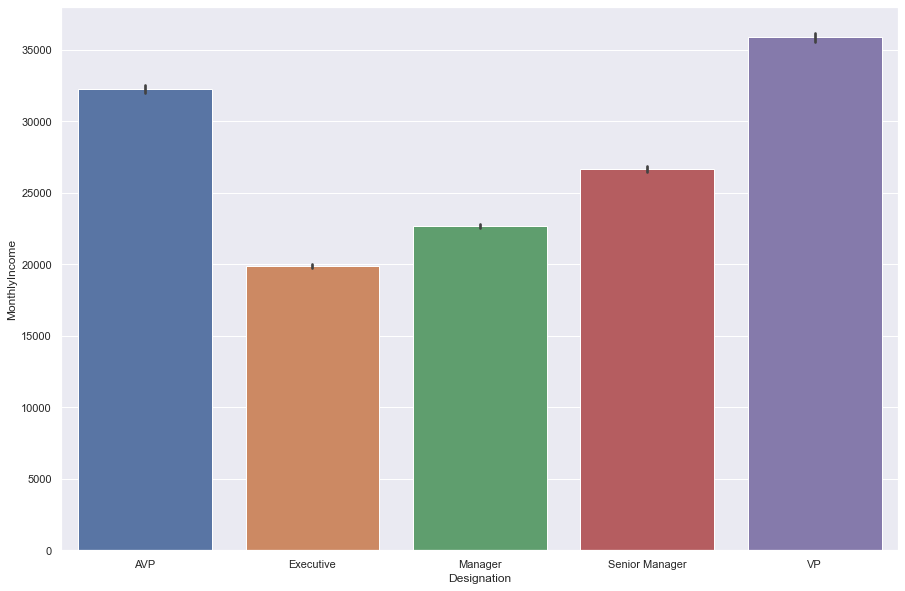

MonthlyIncome by Designation Box Plot


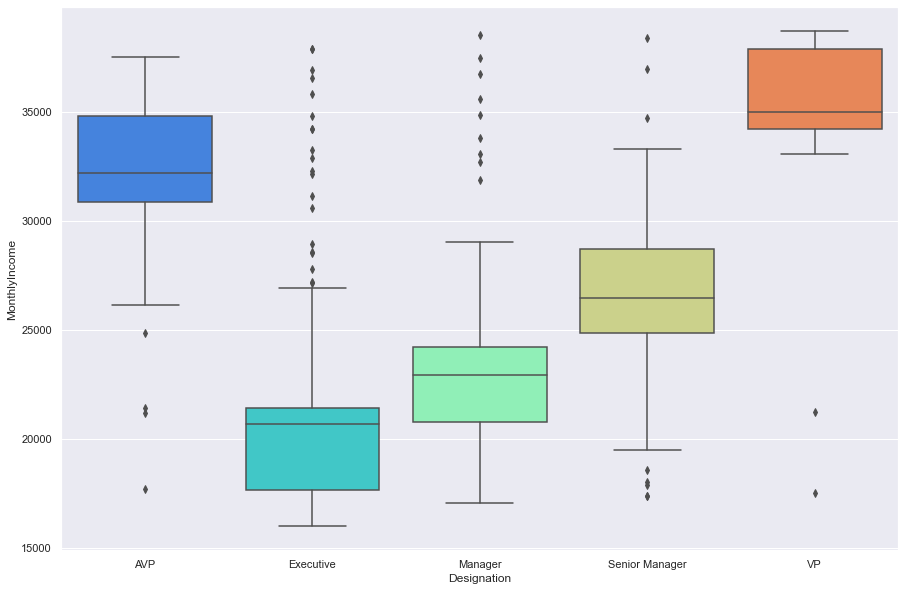

MonthlyIncome by Designation Strip Plot


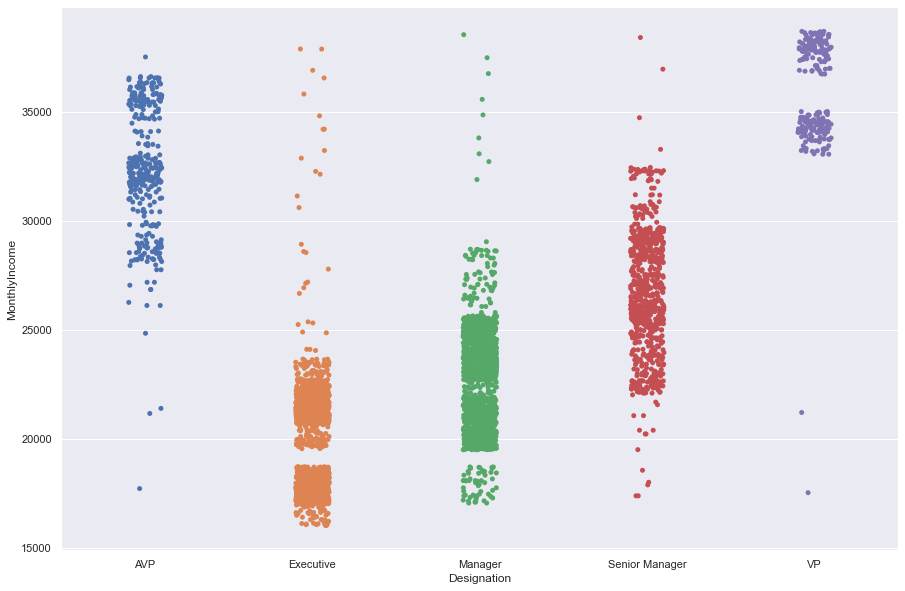

In [48]:
# Bivariate visualization of categorical against numerical variables
cats = categoricals

num = numerical_features

for a in num: # for every categorical column

    for b in cats:  # pair it with a numeric variable
        
        # Bar plot against a numeric variable
        print(a, "by", b, "Bar Plot")
        plt.figure(figsize=(15, 10))
        sns.barplot(x=df[b], y=df[a])
        plt.show()
        
        # Box plot against a numeric variable
        print(a, "by", b, "Box Plot")
        plt.figure(figsize=(15, 10))
        sns.boxplot(data=df, x=df[b], y=df[a], palette="rainbow")
        plt.show()

        # Scatter plot against a numeric variable
        print(a, "by", b, "Strip Plot")
        plt.figure(figsize=(15, 10))
        sns.stripplot(x=df[b], y=df[a])
        plt.show()

- More customers who were pitched a King package own a car than do not. All freelancers do not.
- Freelancers tended to have more people visiting on trips.
- The Basic package takers tended to take the product offering.

#### Numerics

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

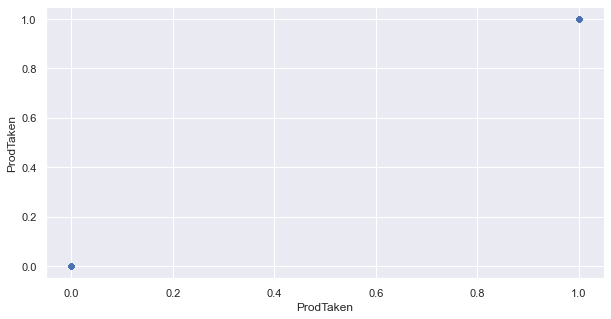

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

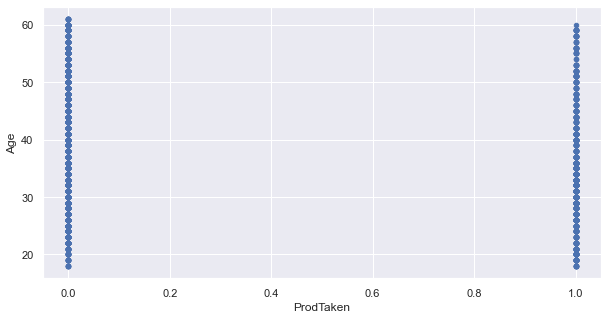

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

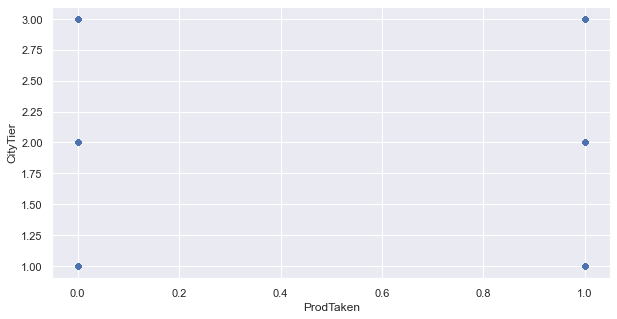

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

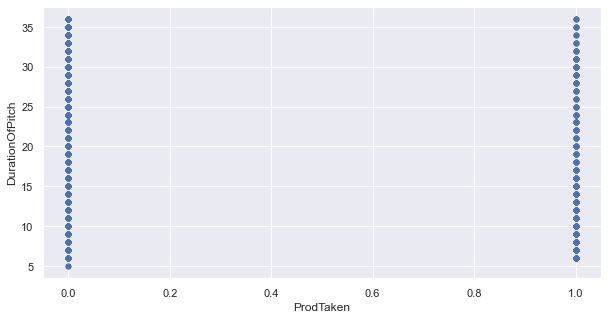

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

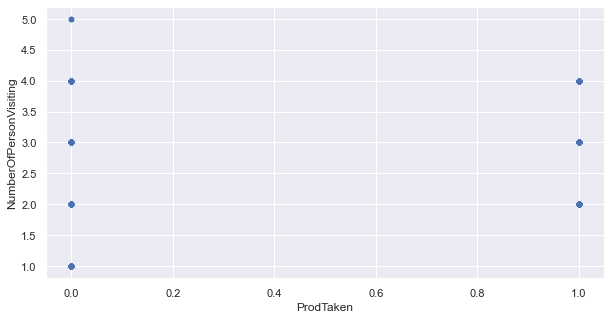

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

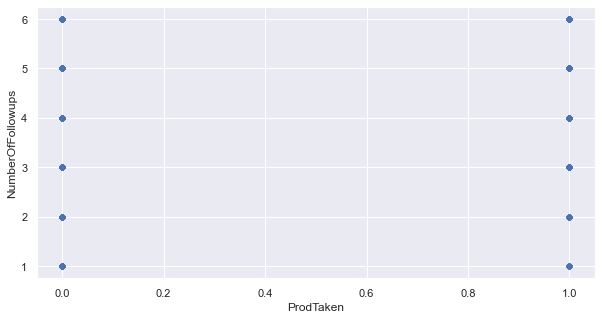

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

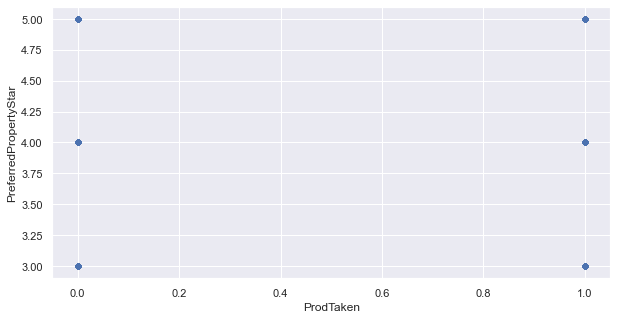

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

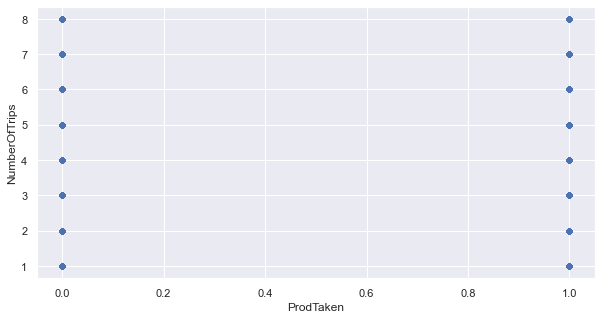

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

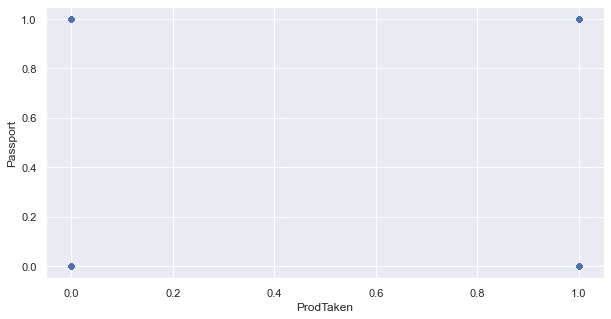

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

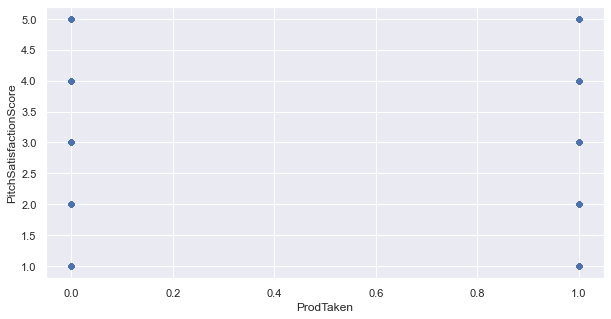

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

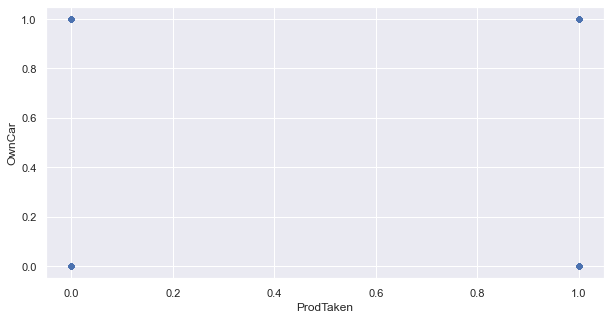

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

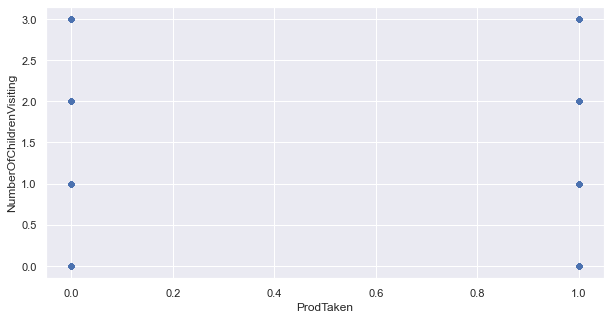

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


ProdTaken by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

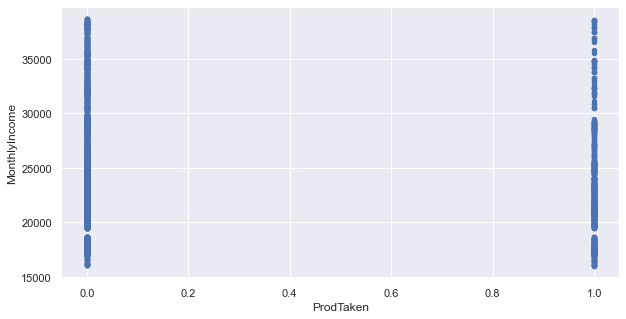

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

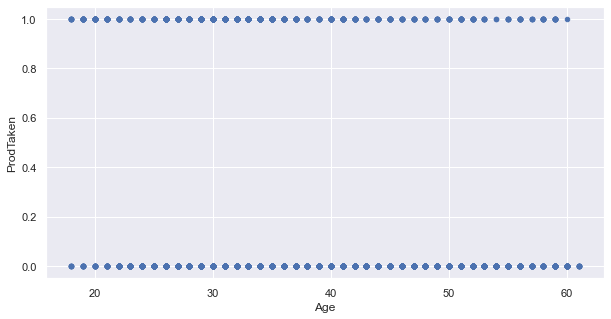

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

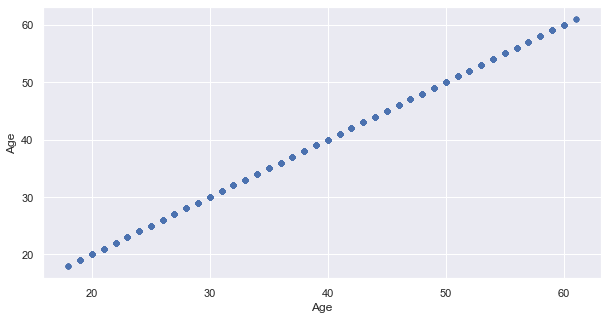

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

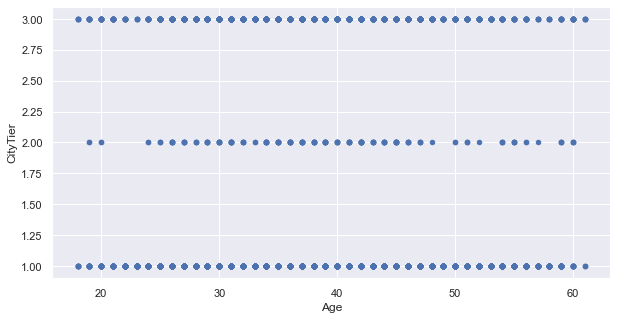

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

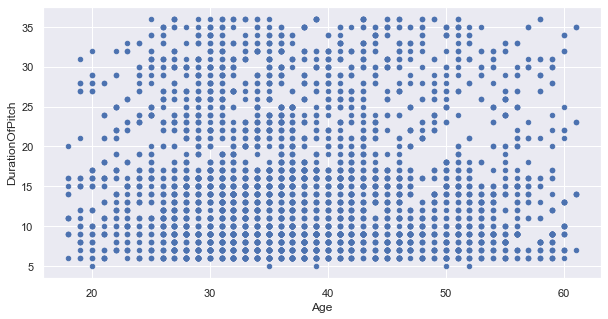

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

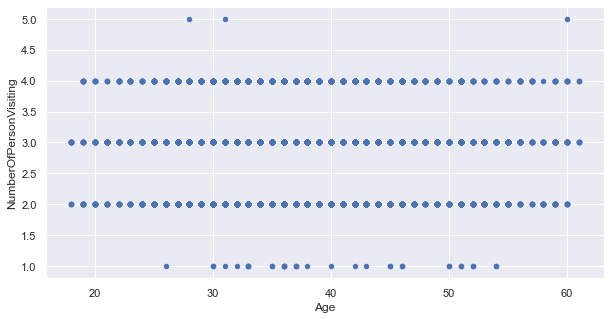

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

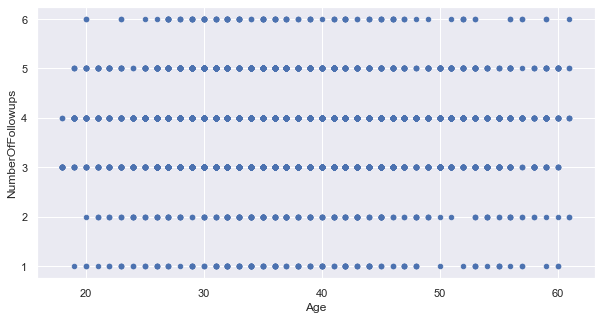

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

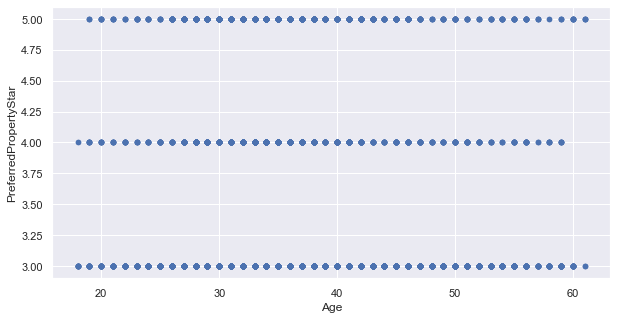

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

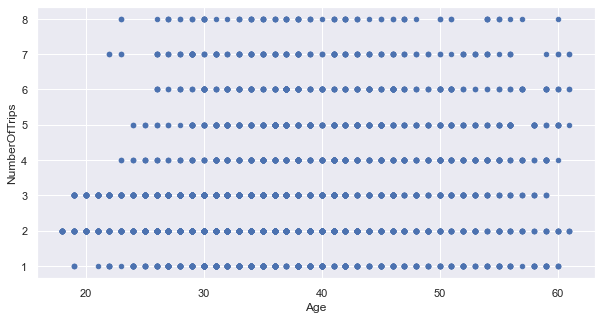

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

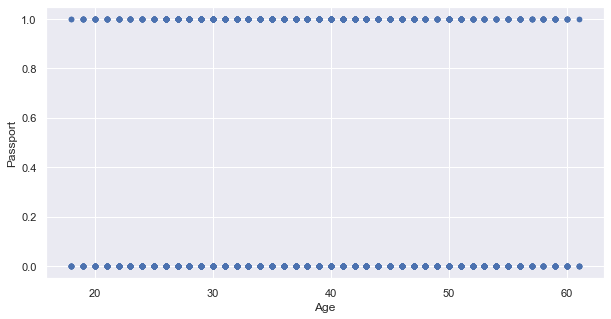

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

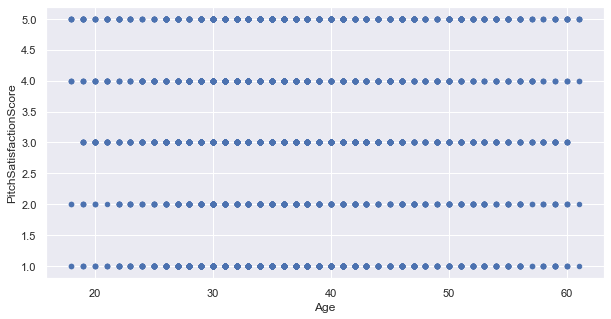

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

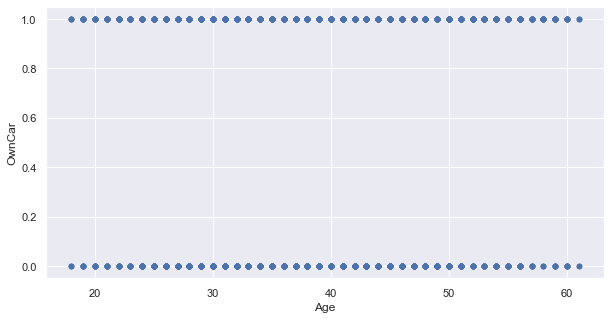

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

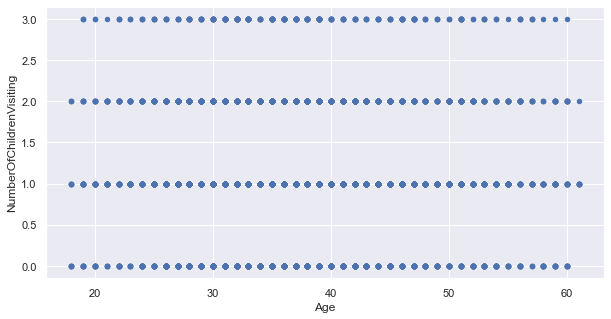

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Age by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

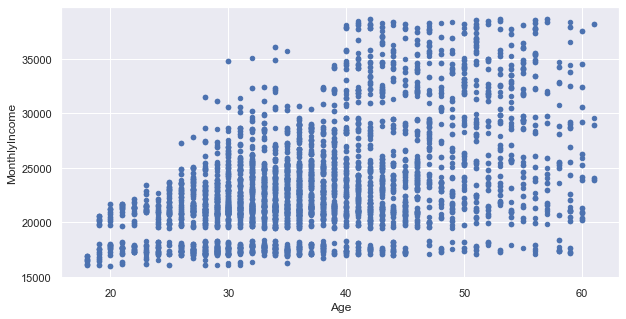

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

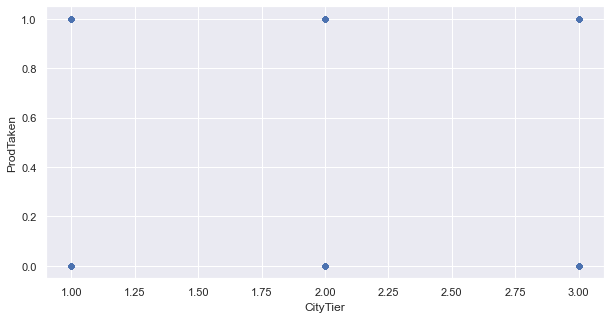

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

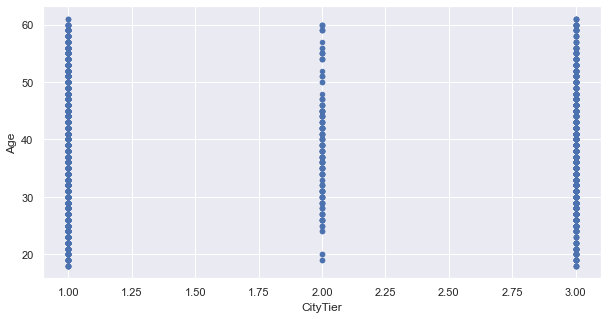

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

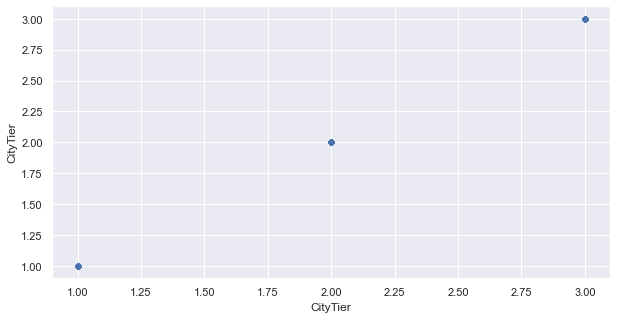

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

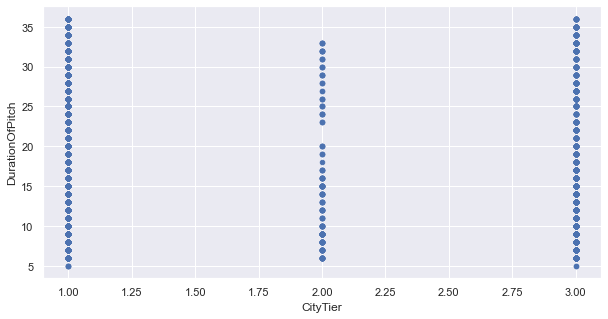

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

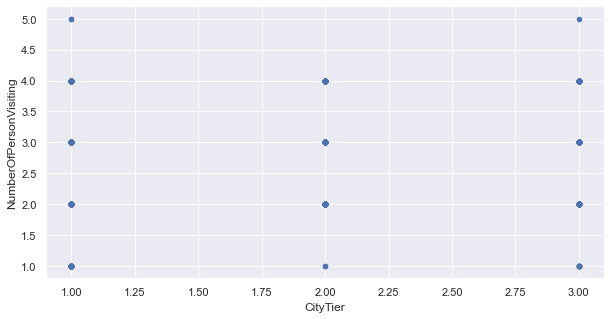

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

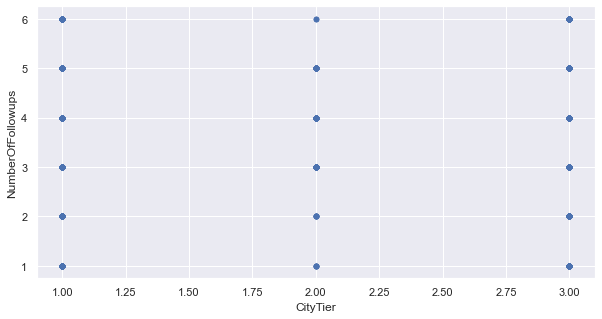

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

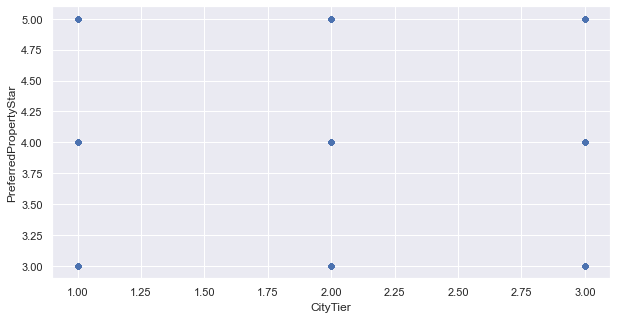

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

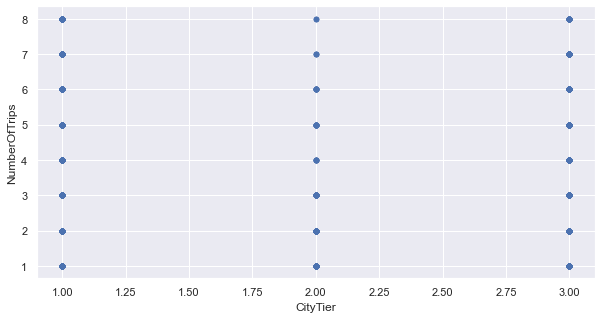

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

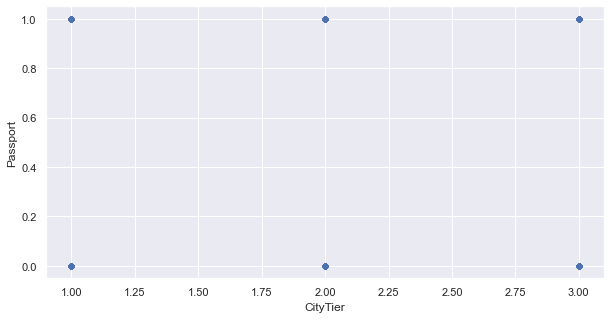

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

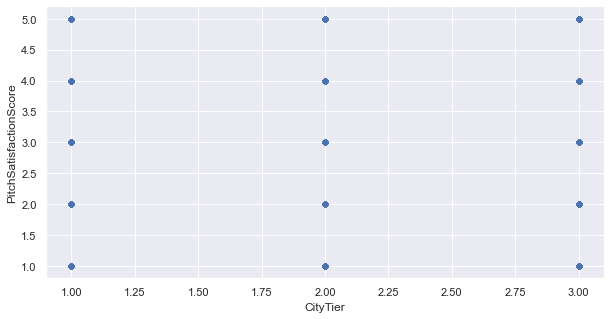

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

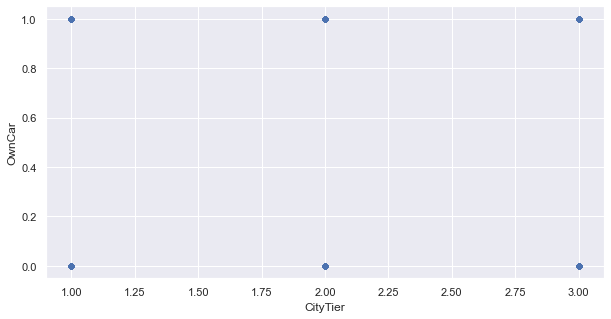

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

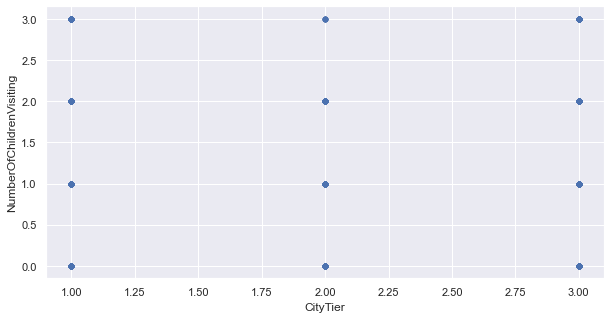

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


CityTier by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

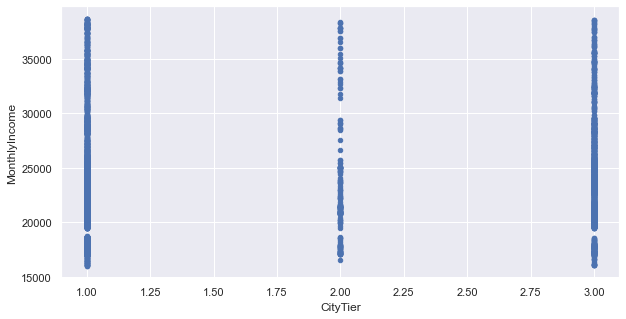

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

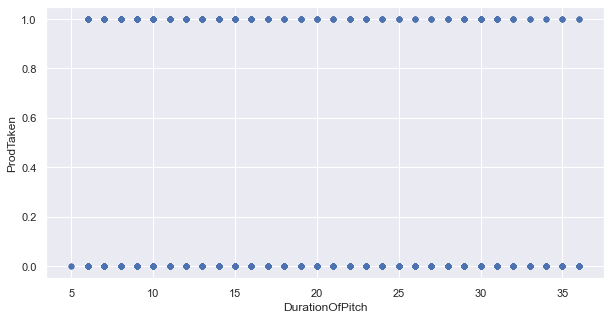

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

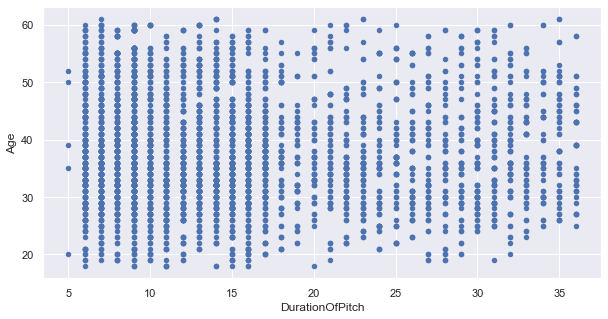

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

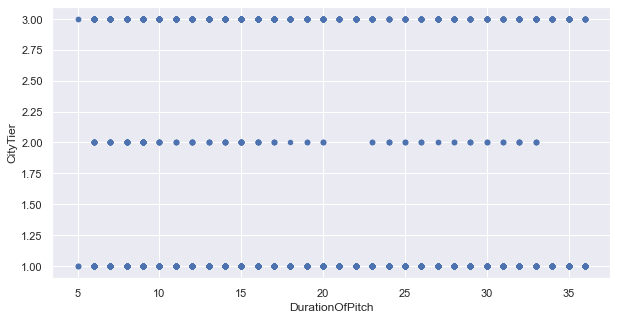

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

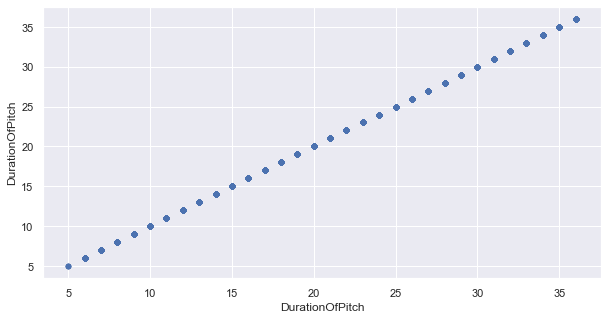

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

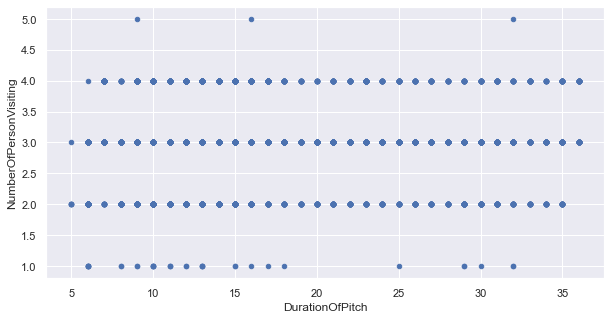

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

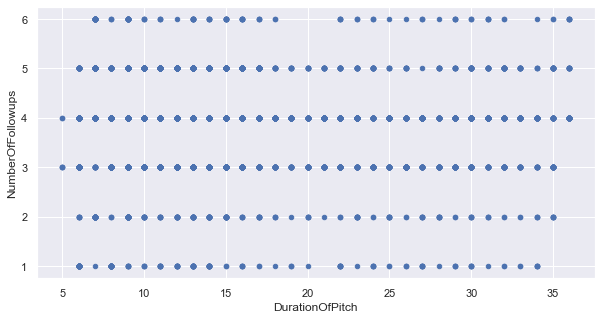

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

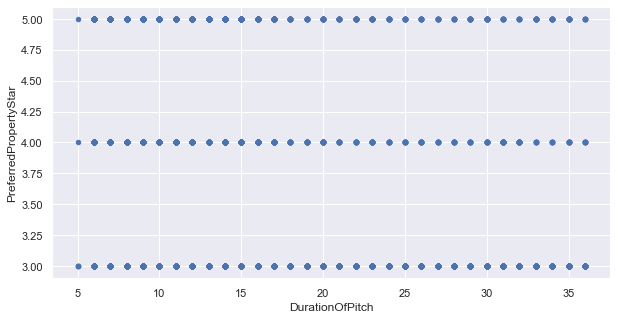

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

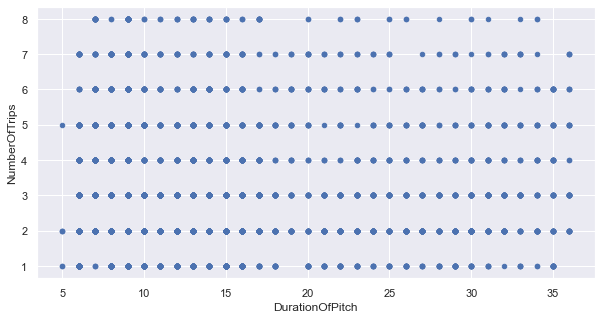

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

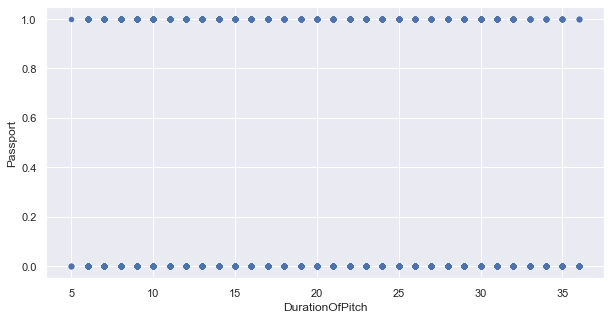

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

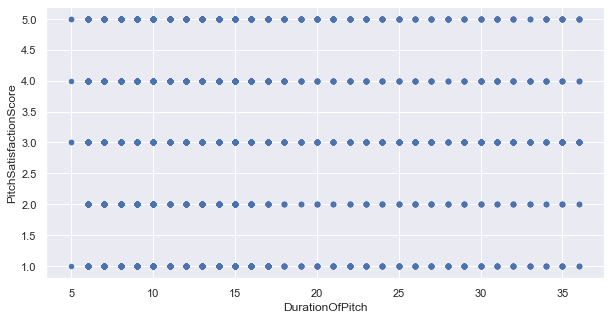

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

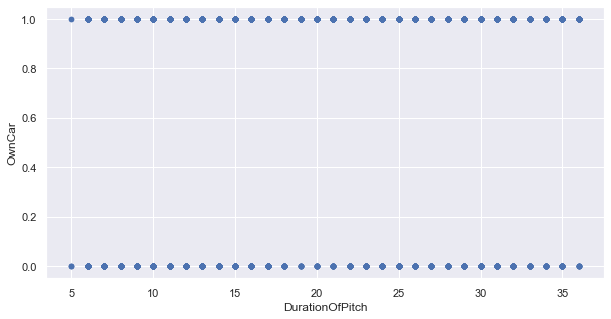

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

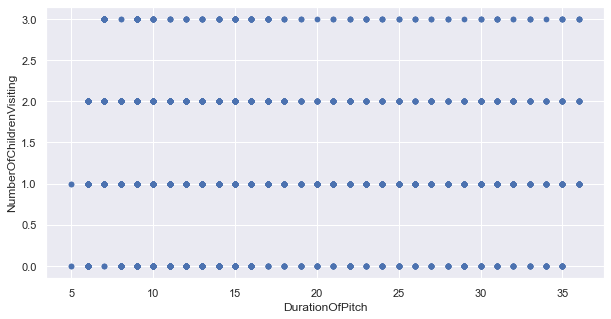

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


DurationOfPitch by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

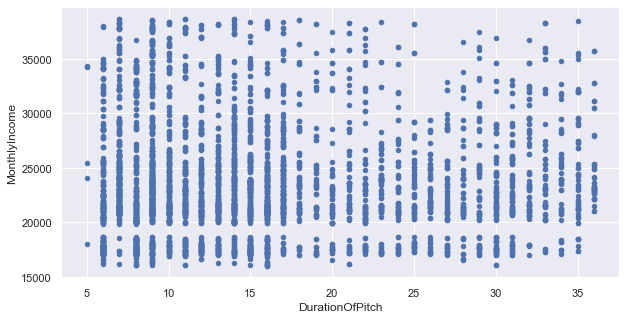

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

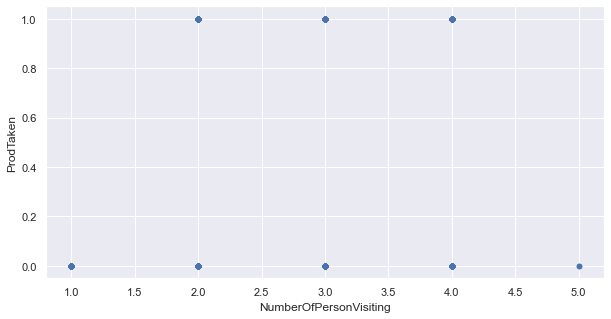

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

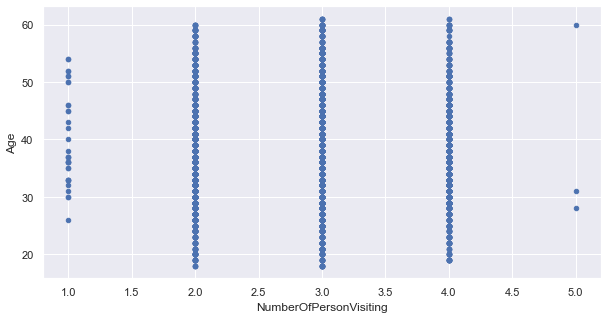

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

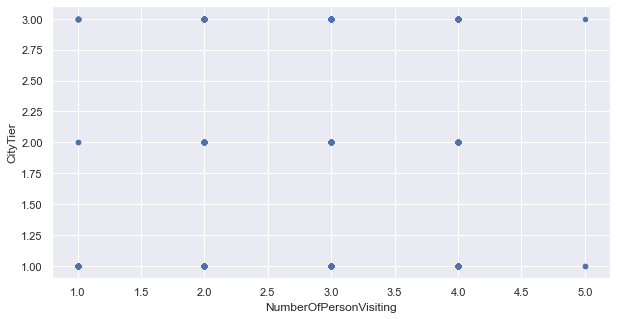

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

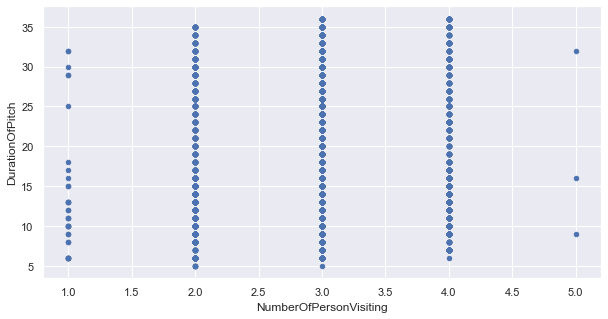

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

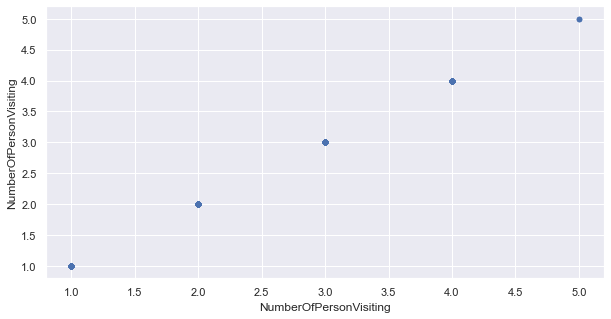

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

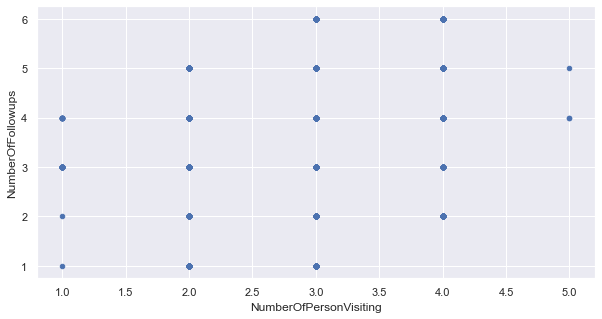

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

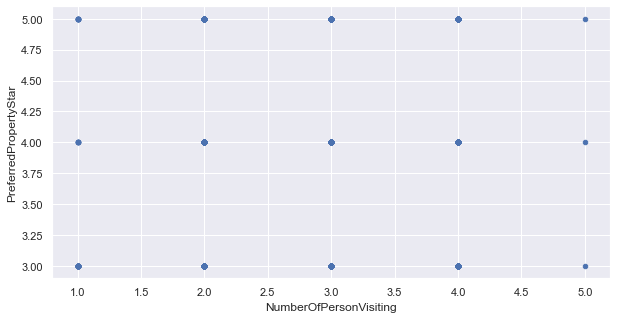

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

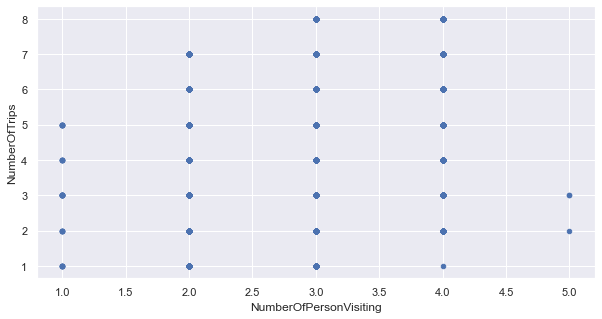

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

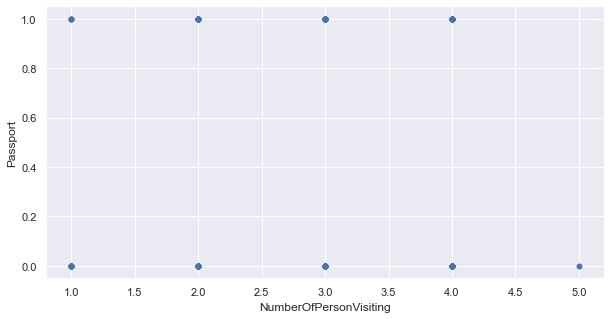

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

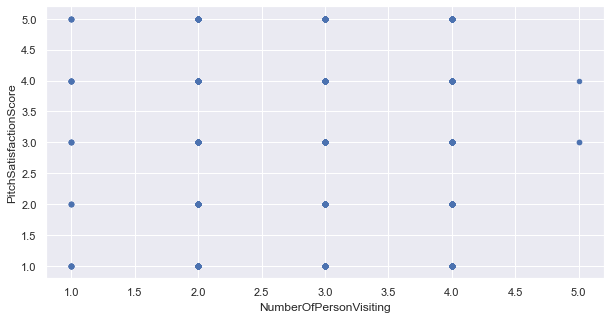

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

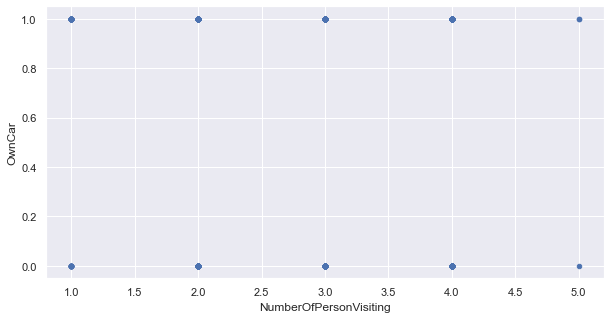

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

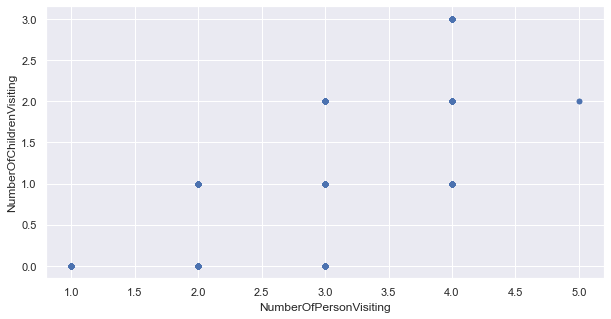

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfPersonVisiting by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

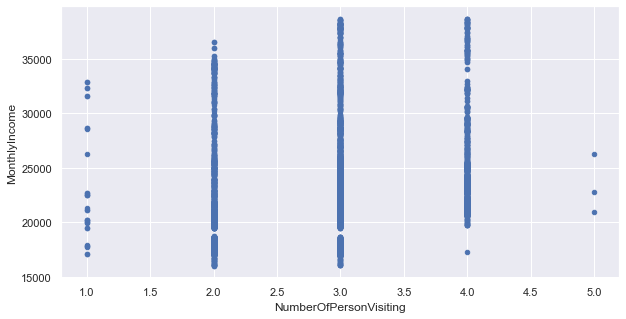

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

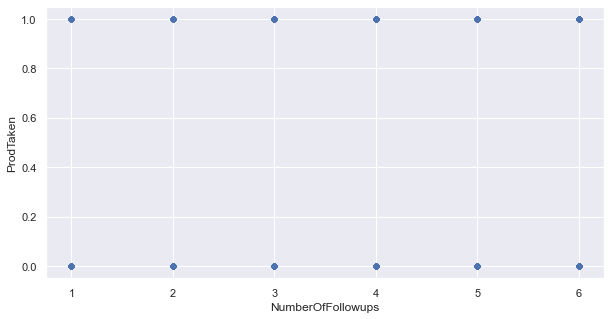

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

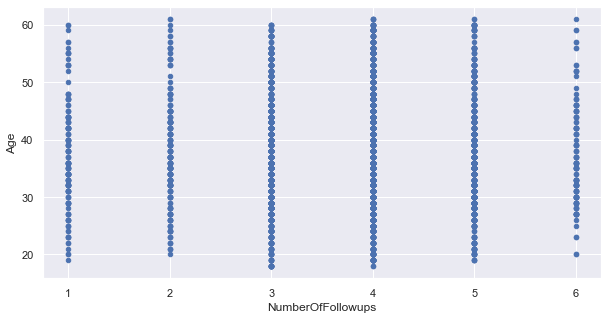

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

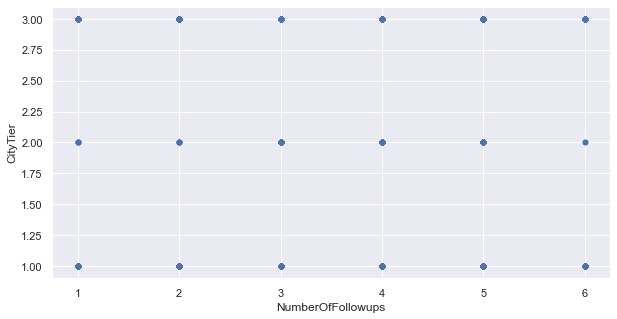

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

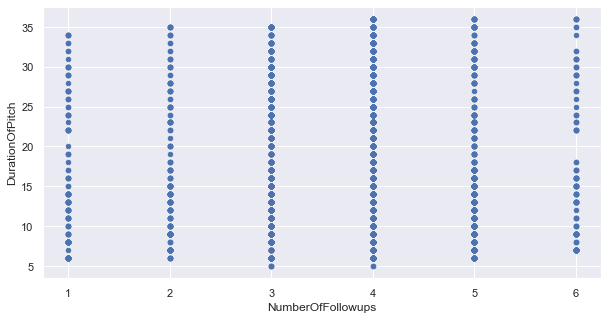

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

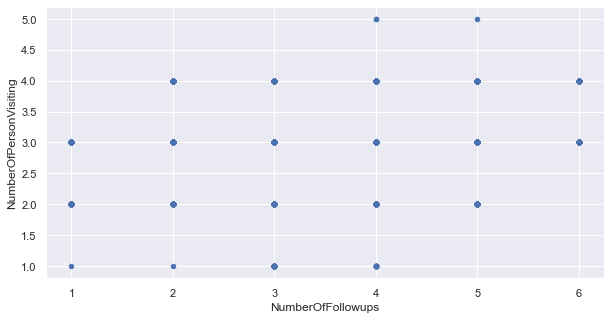

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

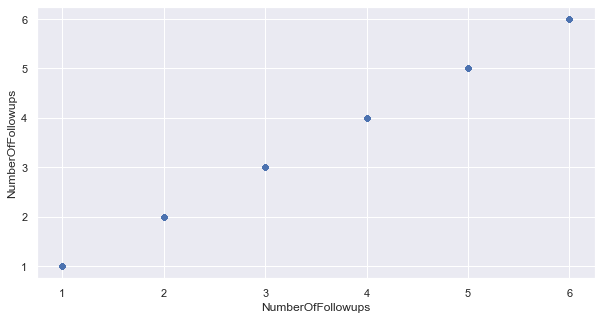

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

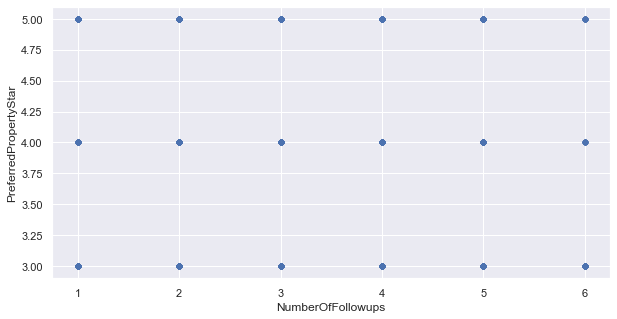

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

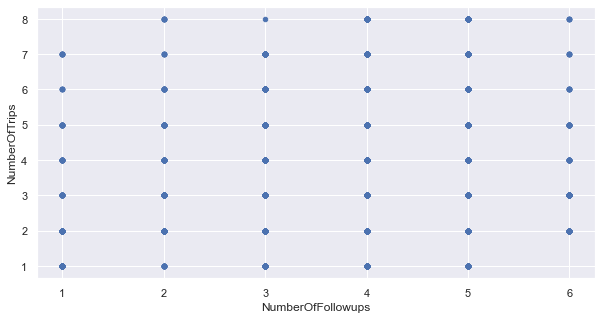

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

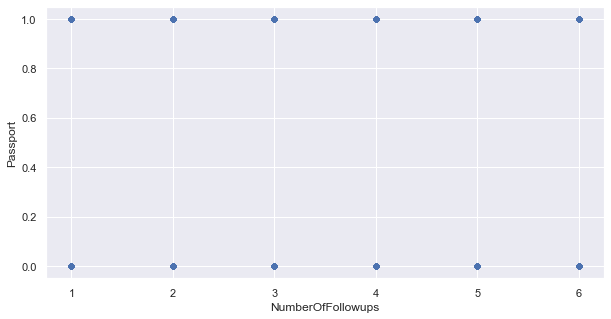

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

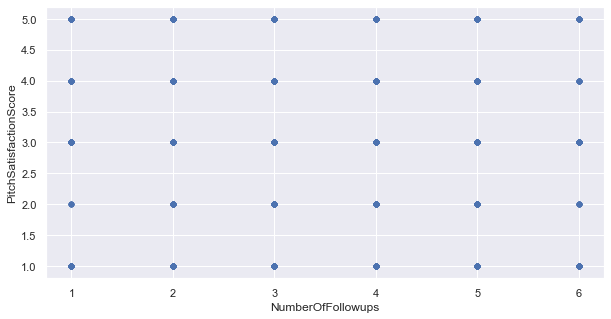

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

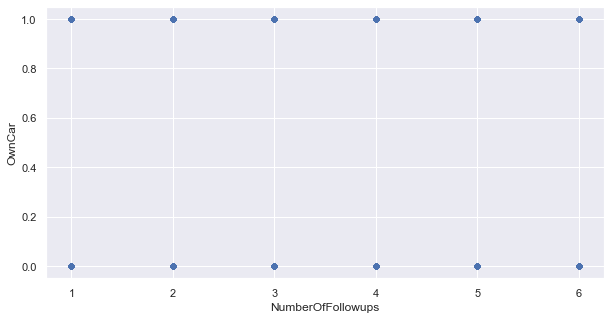

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

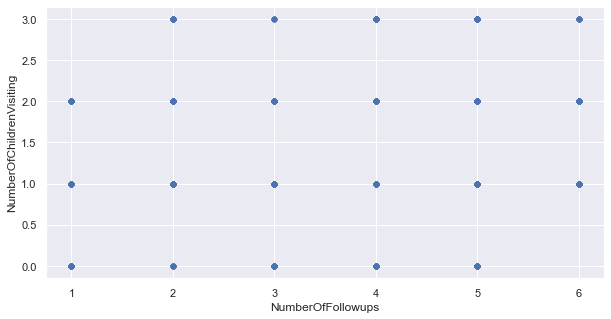

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfFollowups by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

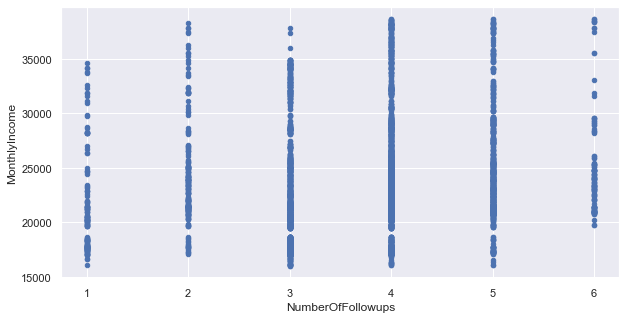

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

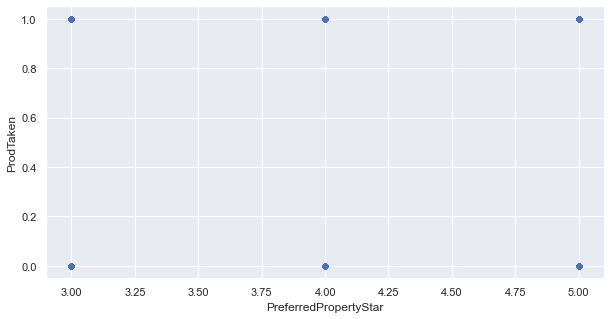

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

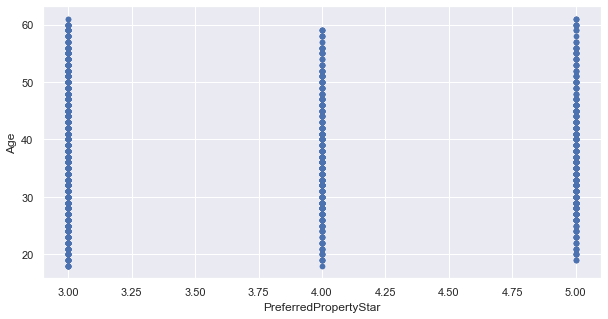

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

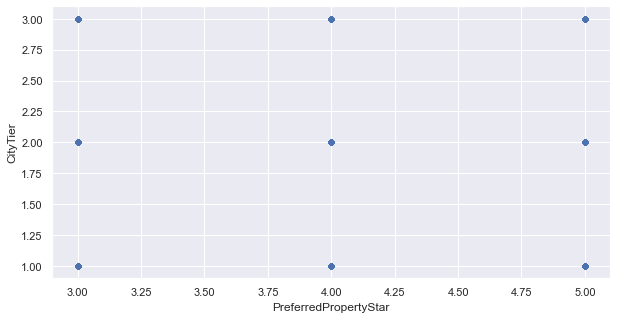

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

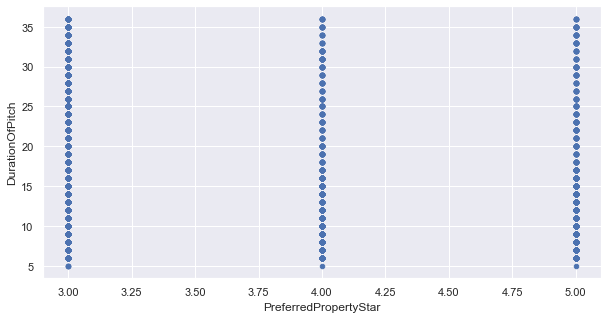

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

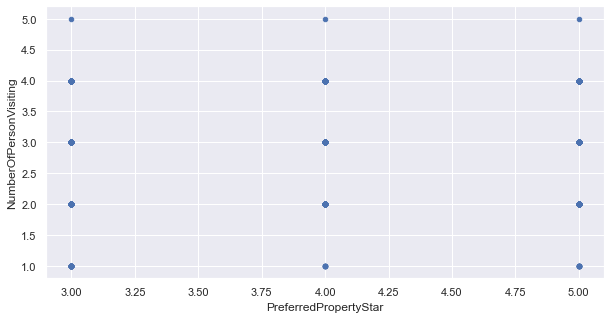

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

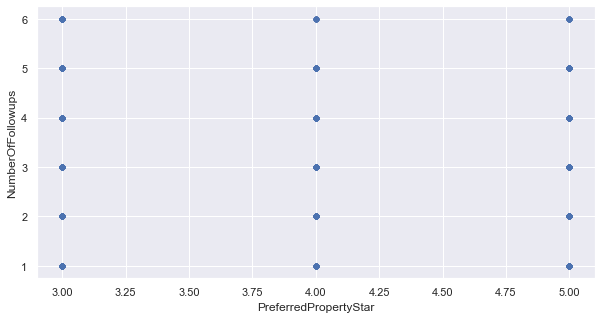

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

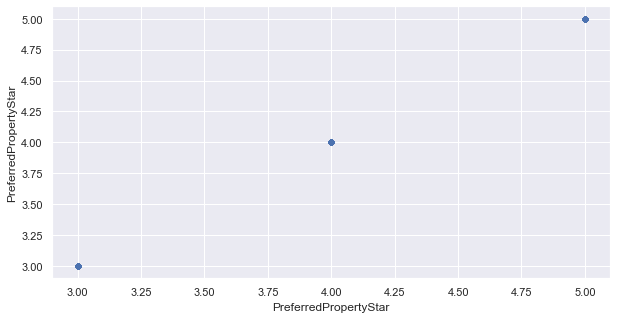

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

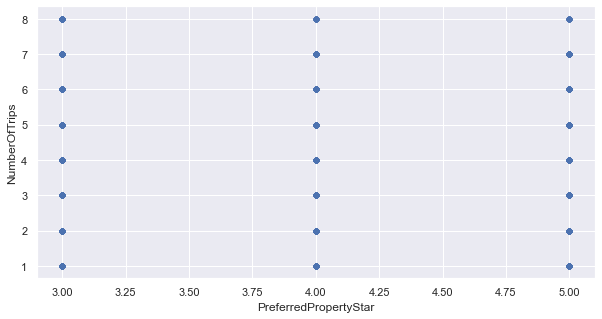

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

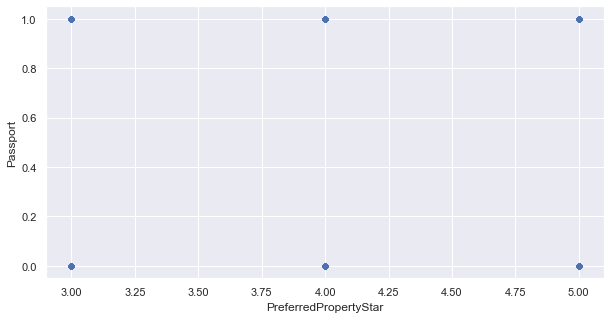

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

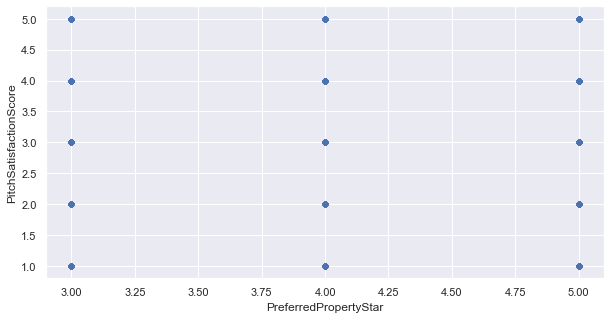

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

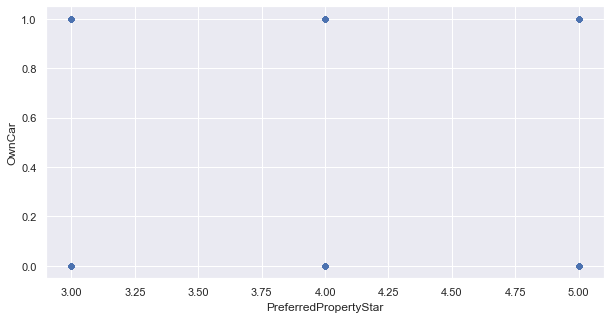

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

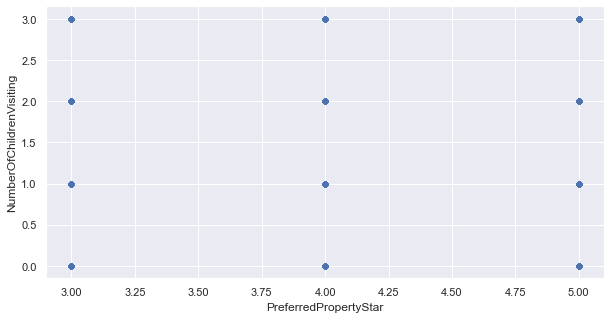

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PreferredPropertyStar by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

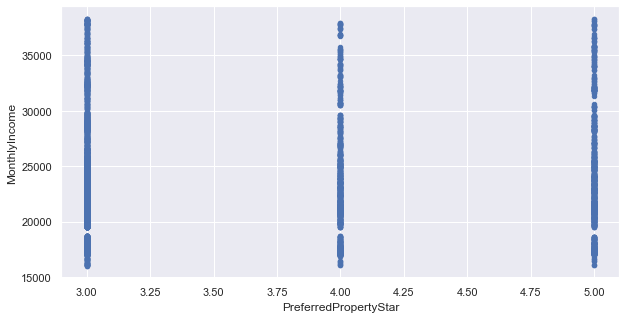

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

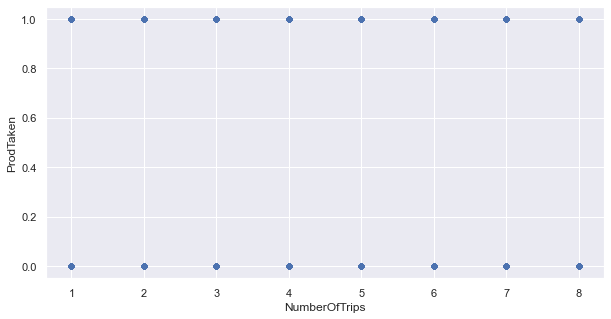

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

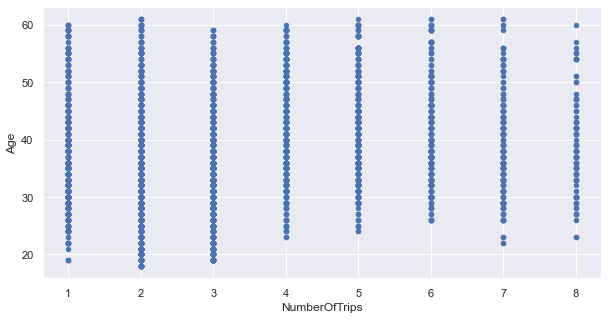

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

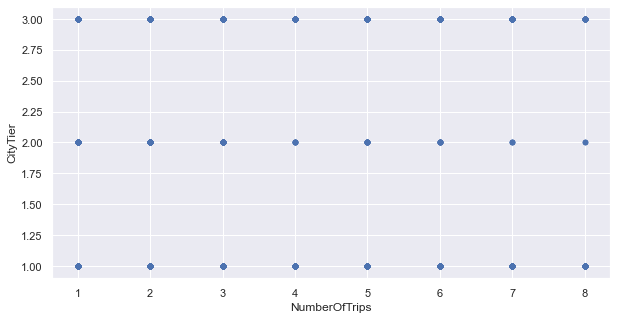

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

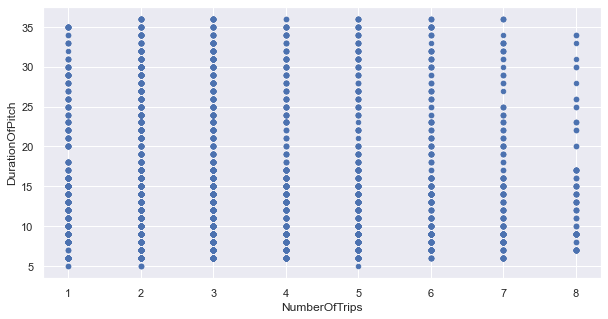

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

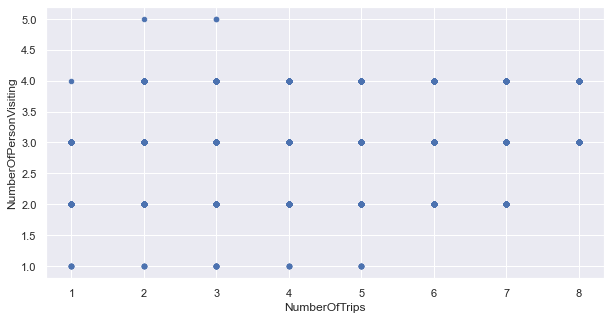

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

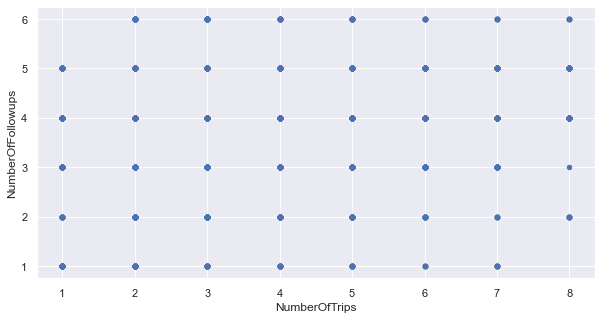

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

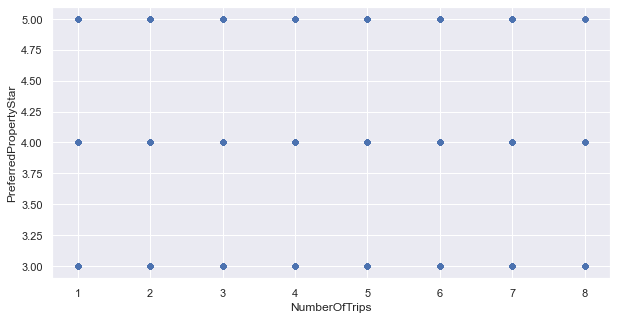

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

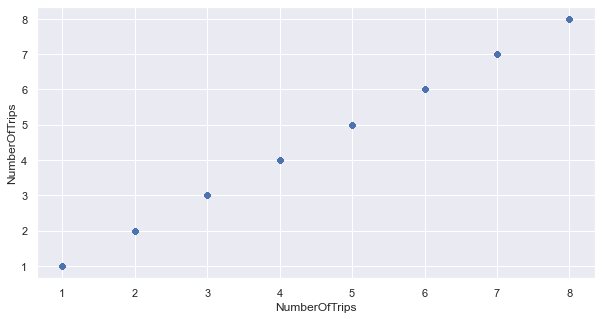

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

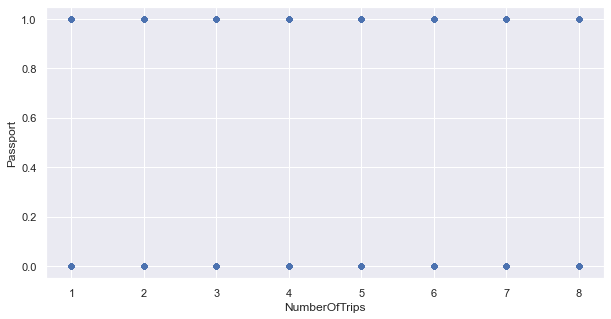

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

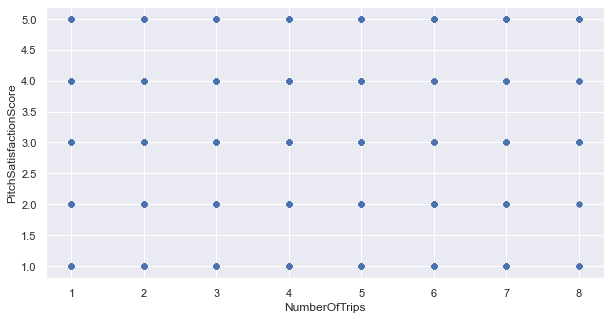

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

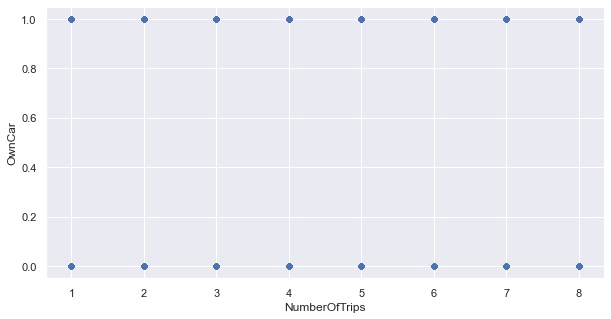

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

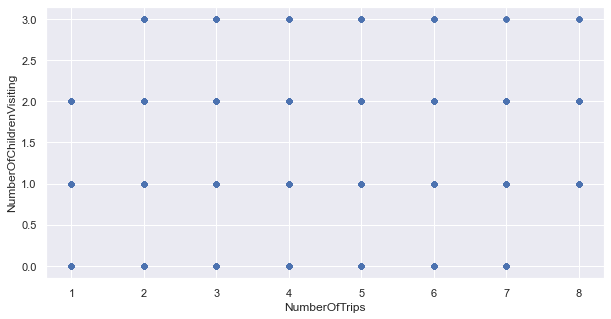

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfTrips by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

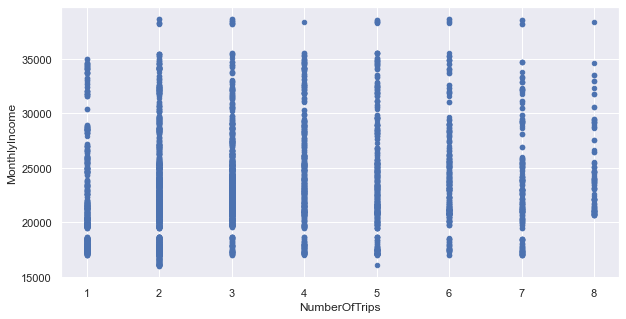

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

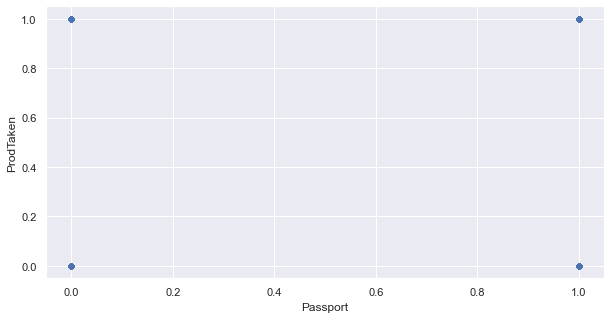

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

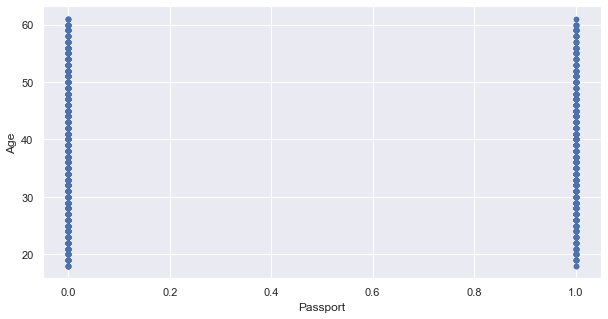

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

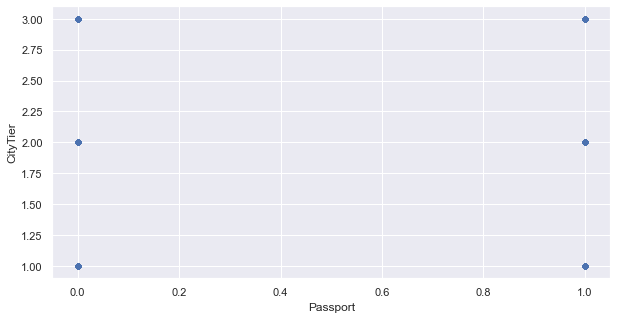

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

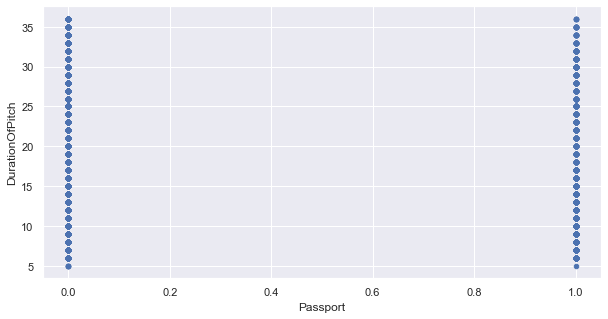

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

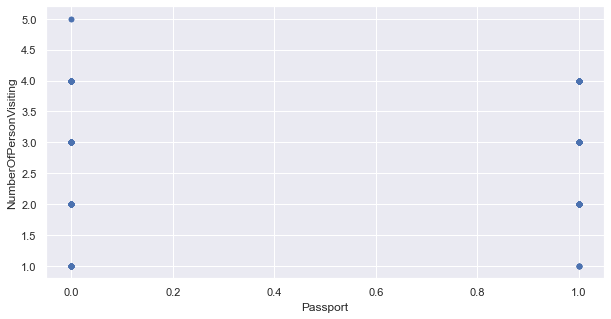

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

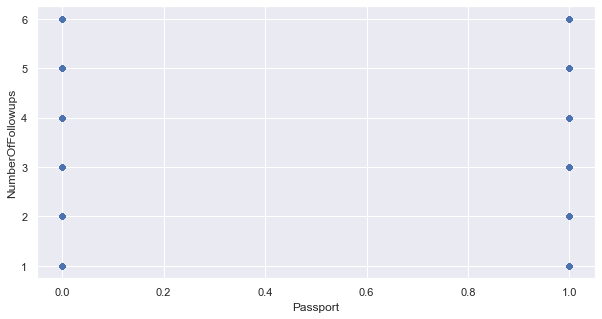

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

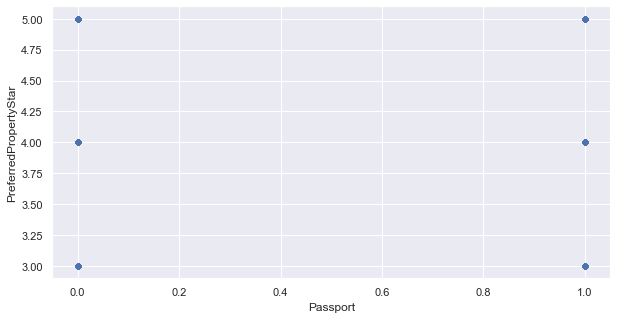

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

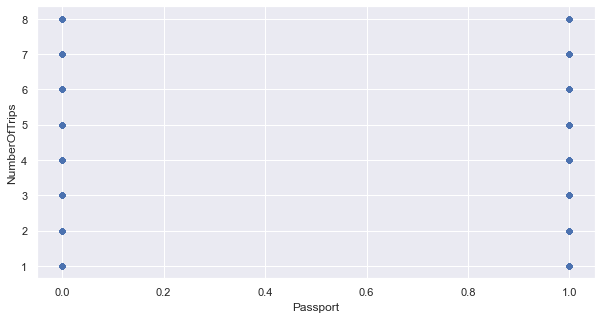

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

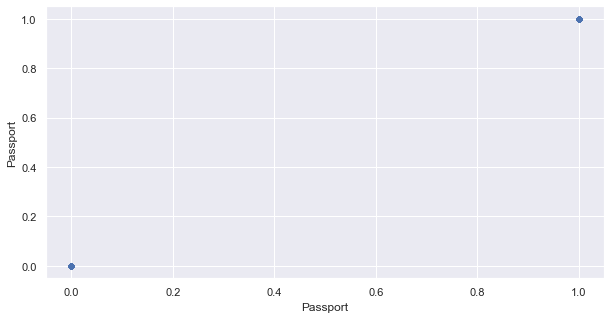

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

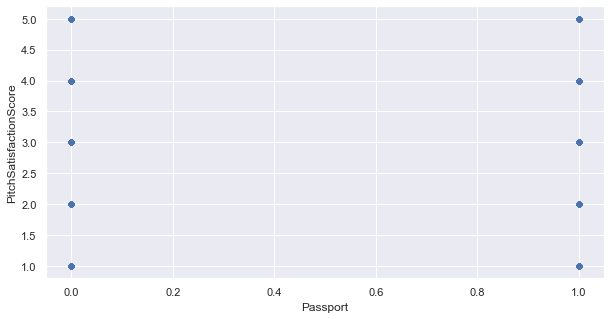

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

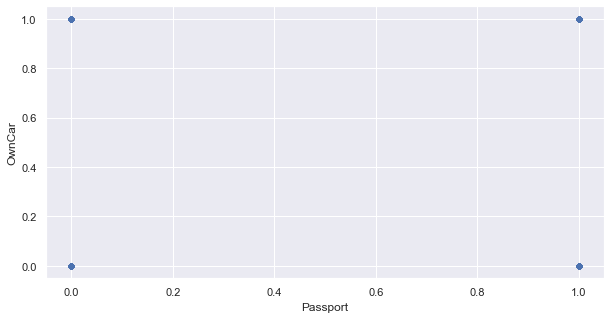

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

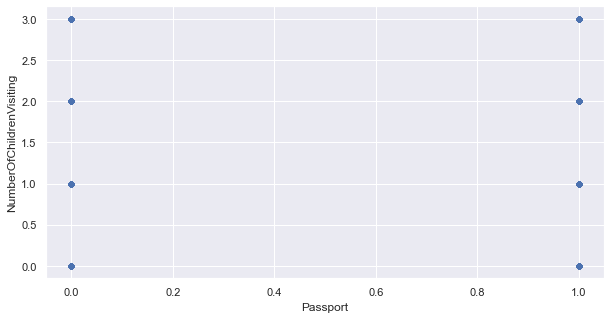

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


Passport by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

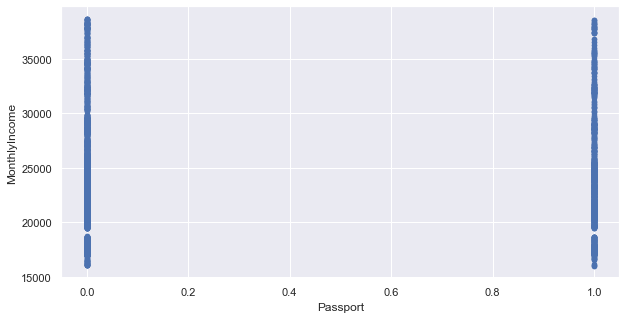

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

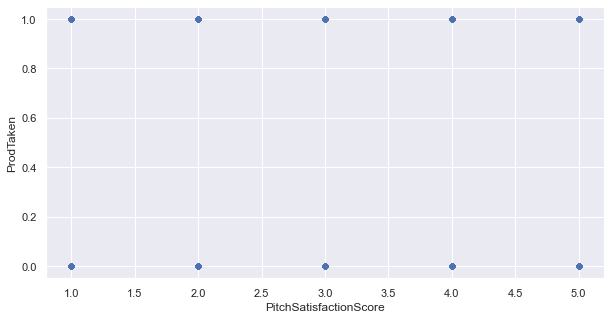

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

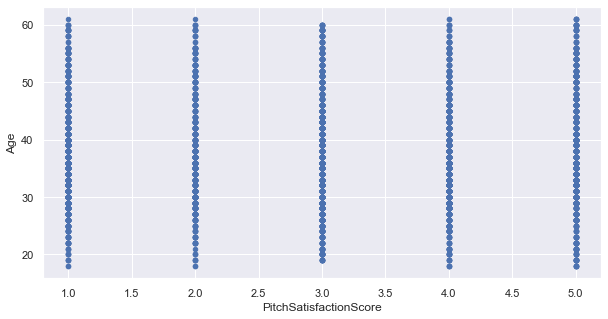

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

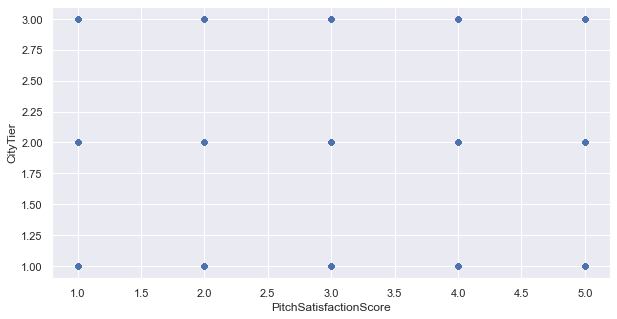

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

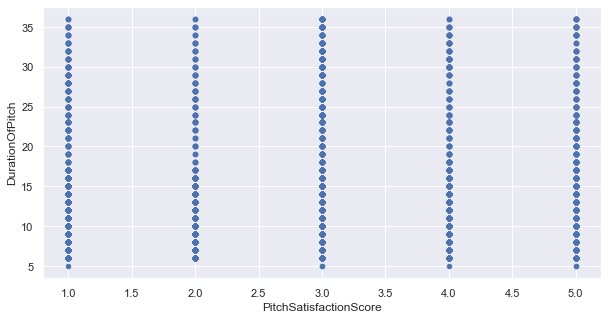

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

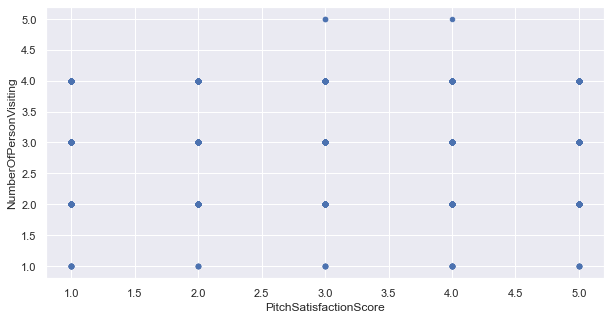

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

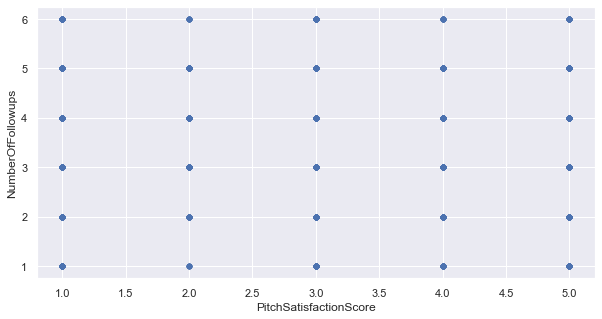

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

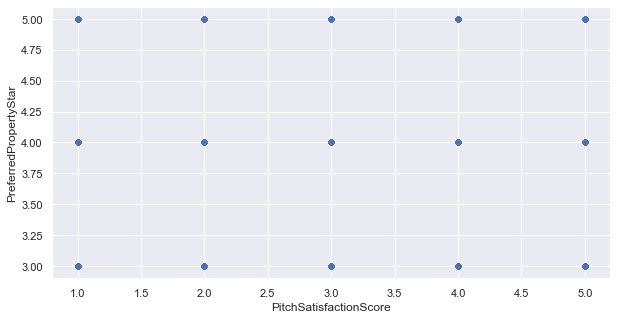

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

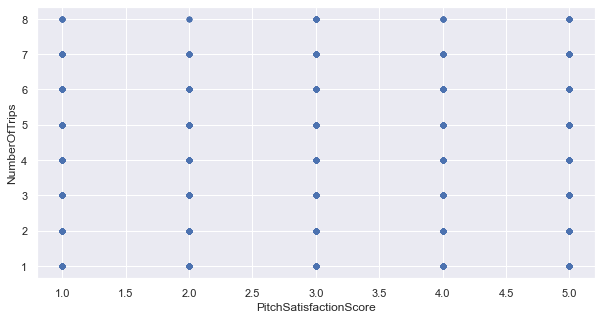

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

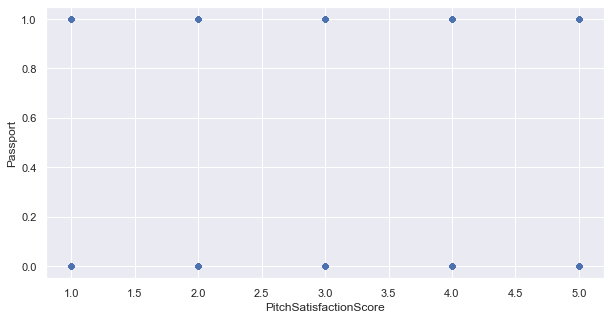

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

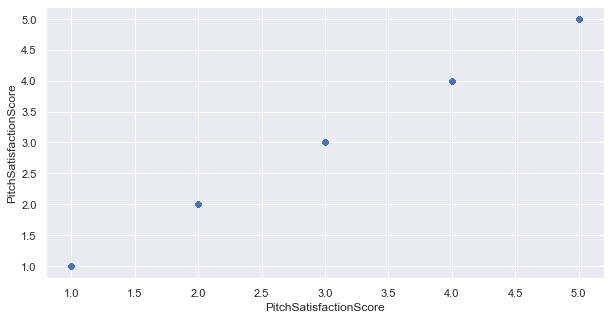

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

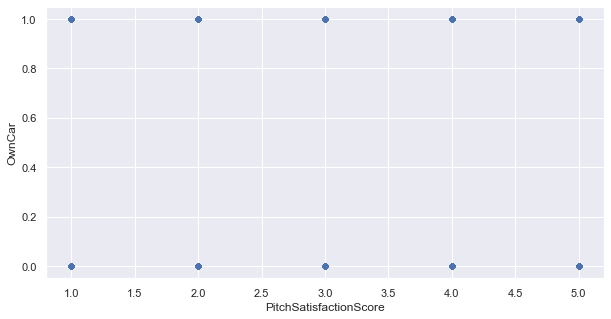

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

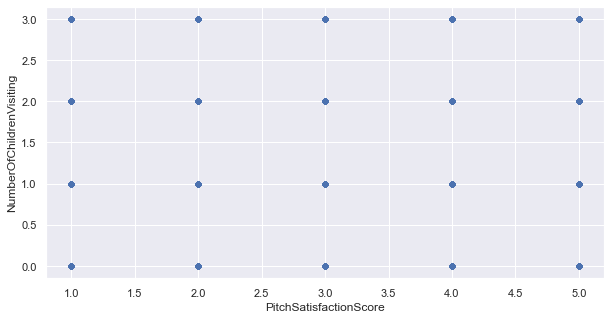

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


PitchSatisfactionScore by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

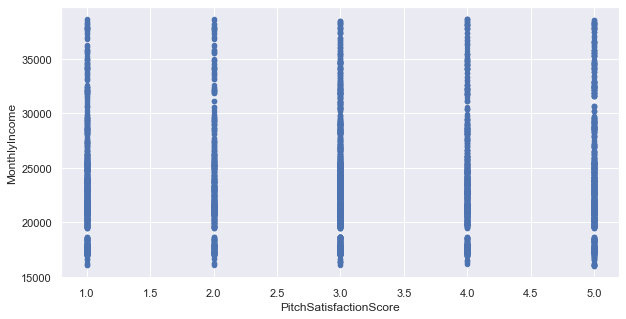

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

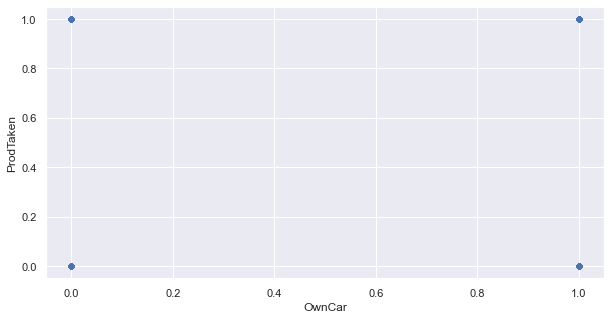

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

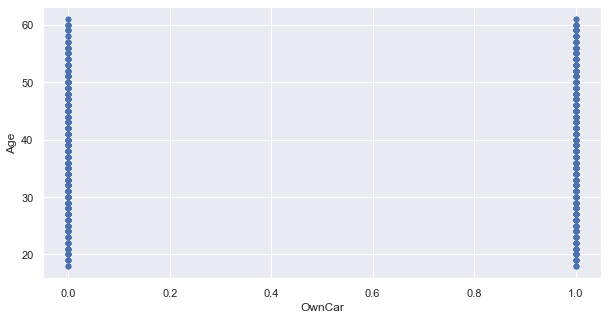

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

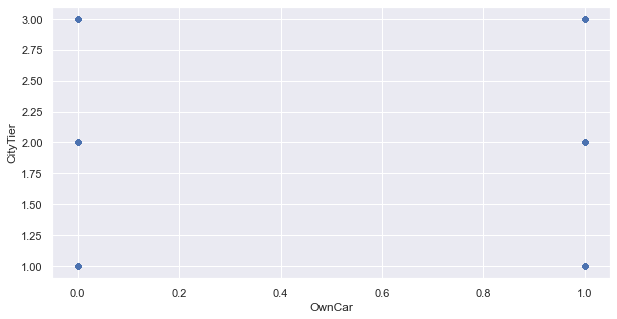

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

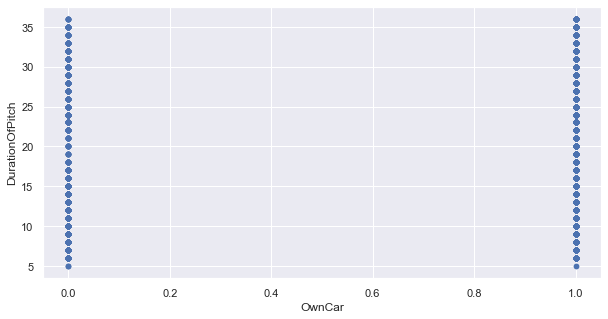

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

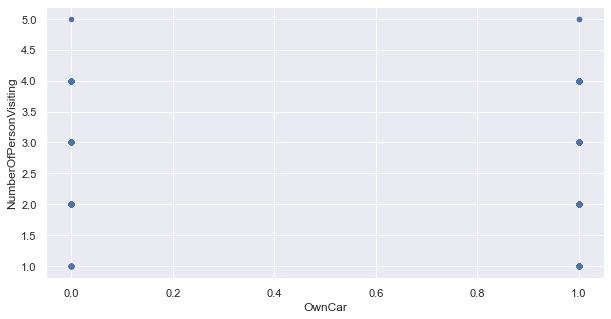

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

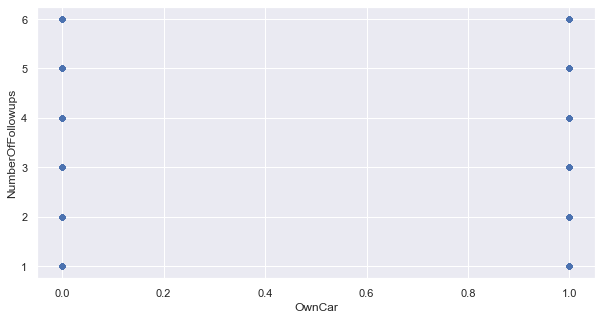

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

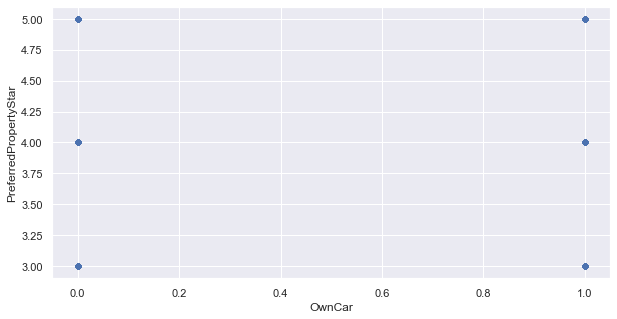

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

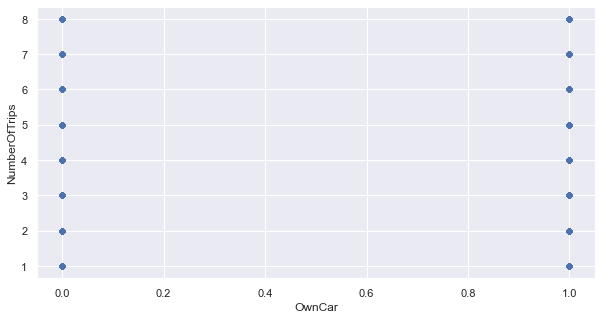

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

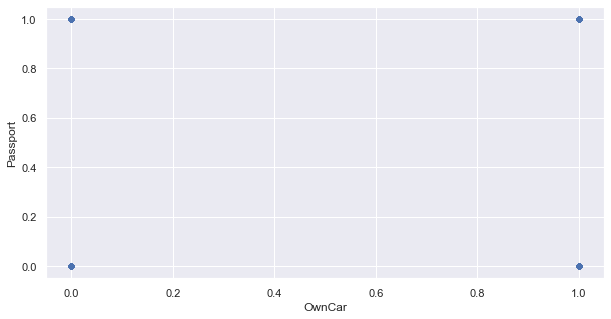

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

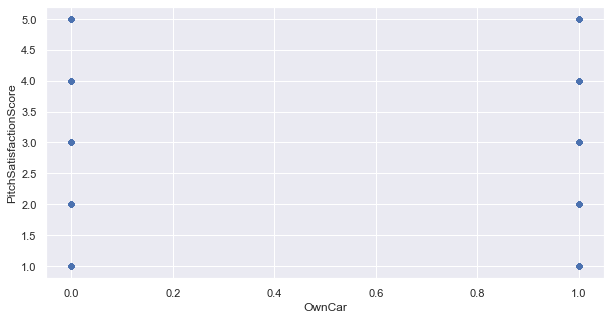

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

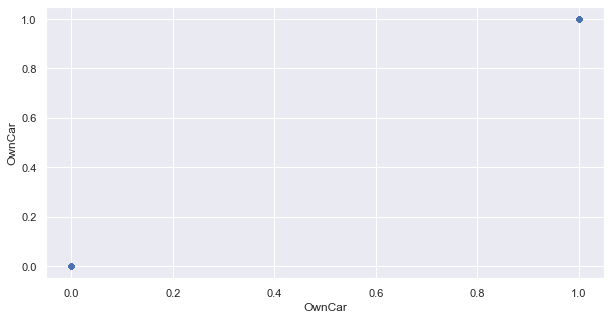

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

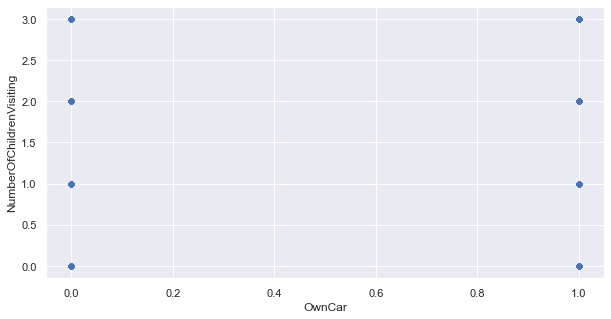

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


OwnCar by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

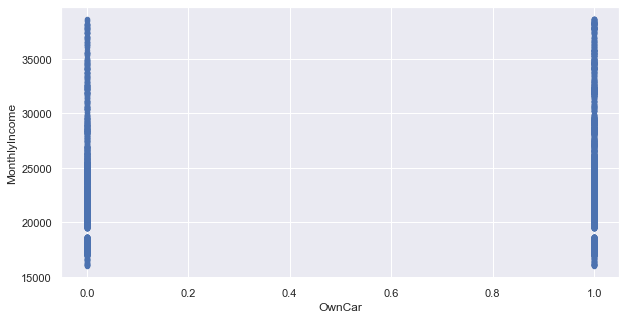

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

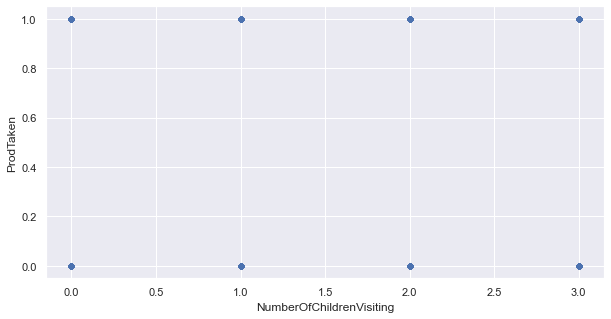

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

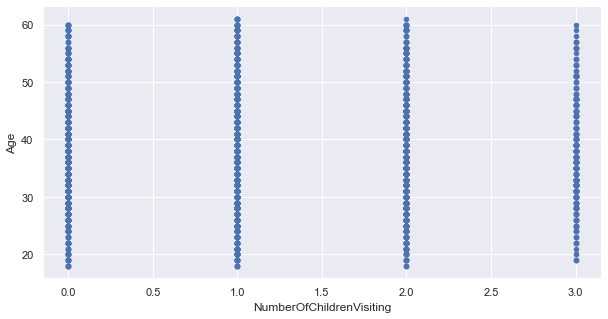

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

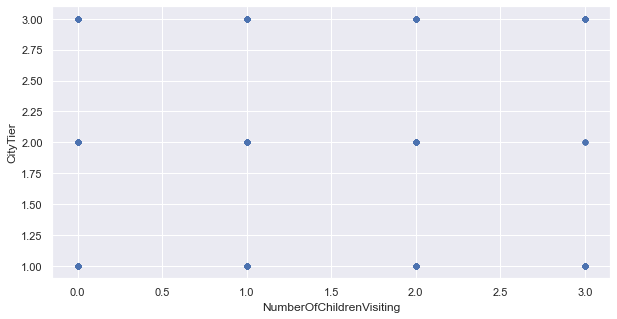

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

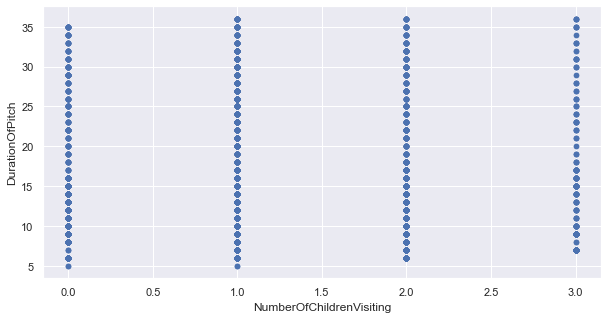

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

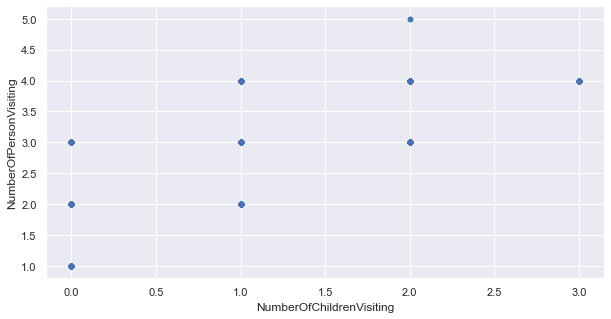

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

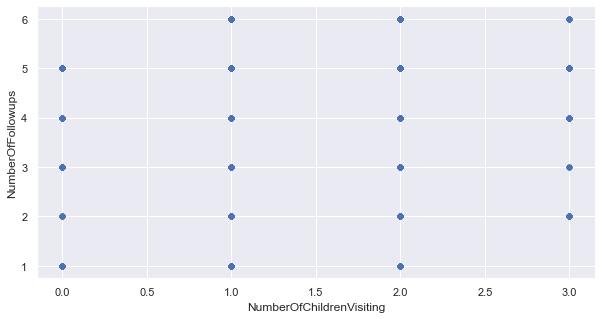

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

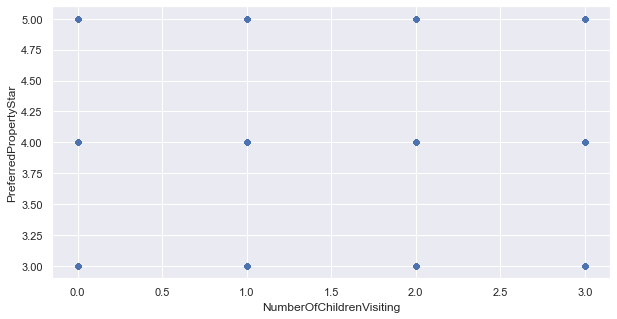

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

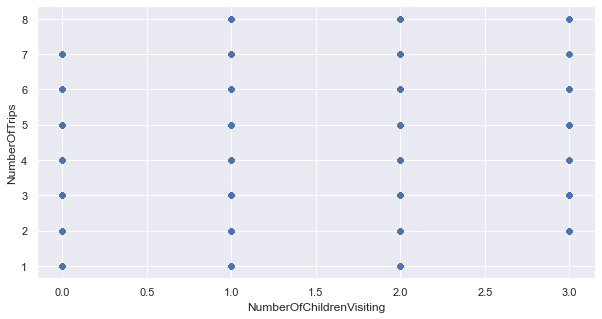

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

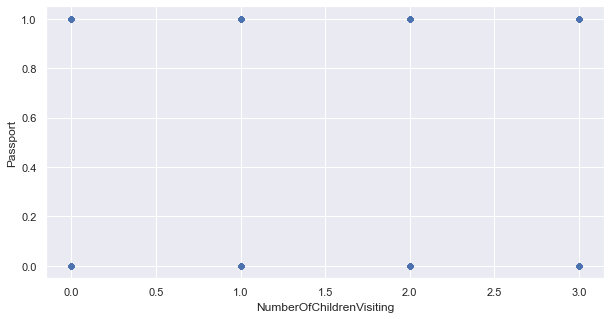

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

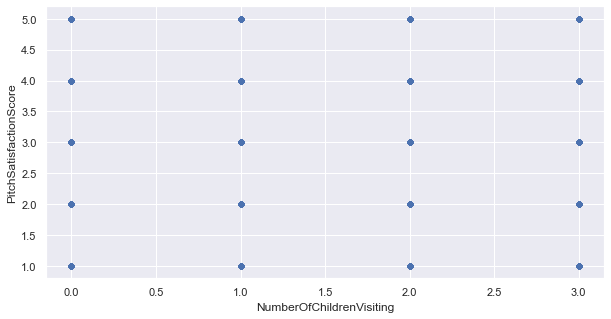

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

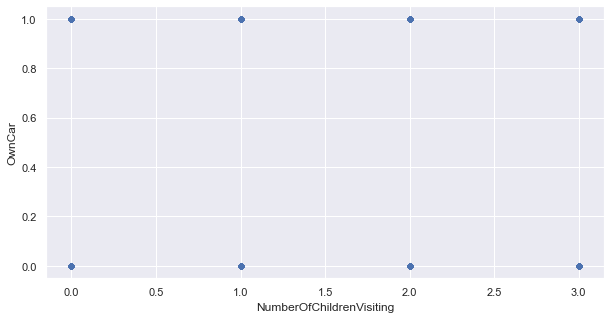

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

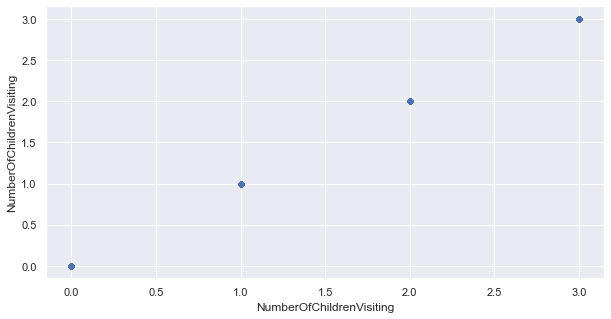

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


NumberOfChildrenVisiting by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

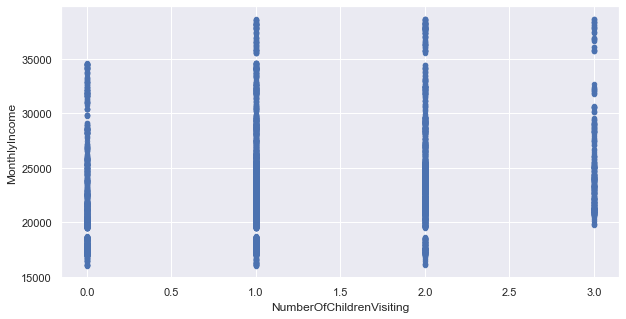

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by ProdTaken Strip Plot


<Figure size 1080x720 with 0 Axes>

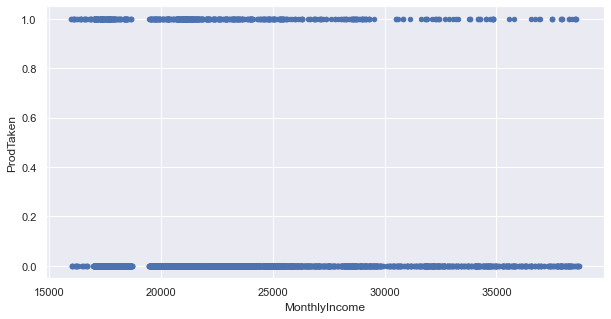

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by Age Strip Plot


<Figure size 1080x720 with 0 Axes>

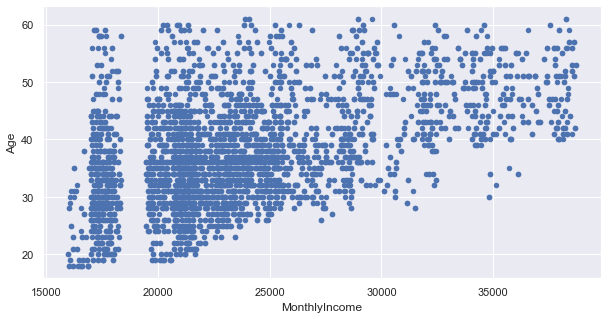

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by CityTier Strip Plot


<Figure size 1080x720 with 0 Axes>

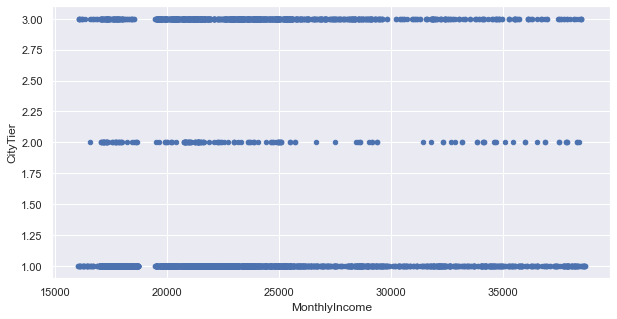

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by DurationOfPitch Strip Plot


<Figure size 1080x720 with 0 Axes>

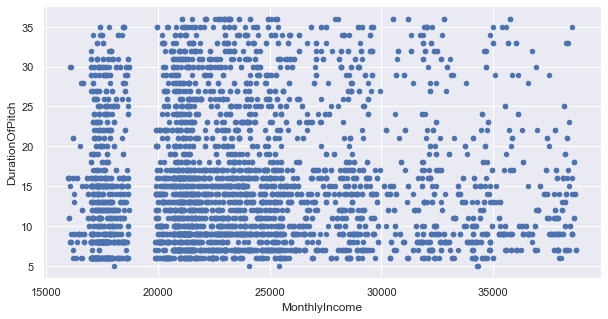

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by NumberOfPersonVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

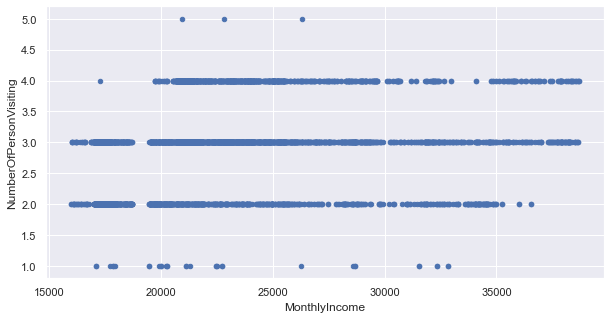

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by NumberOfFollowups Strip Plot


<Figure size 1080x720 with 0 Axes>

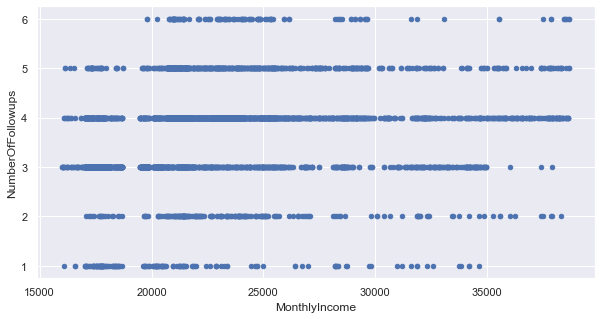

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by PreferredPropertyStar Strip Plot


<Figure size 1080x720 with 0 Axes>

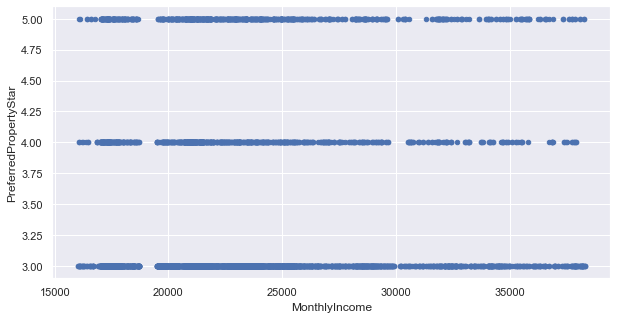

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by NumberOfTrips Strip Plot


<Figure size 1080x720 with 0 Axes>

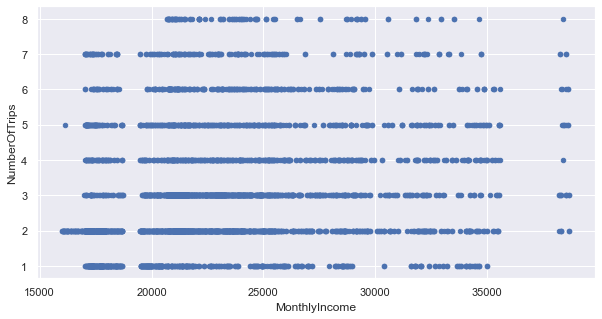

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by Passport Strip Plot


<Figure size 1080x720 with 0 Axes>

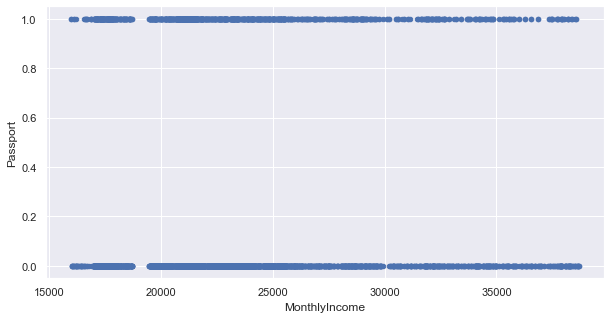

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by PitchSatisfactionScore Strip Plot


<Figure size 1080x720 with 0 Axes>

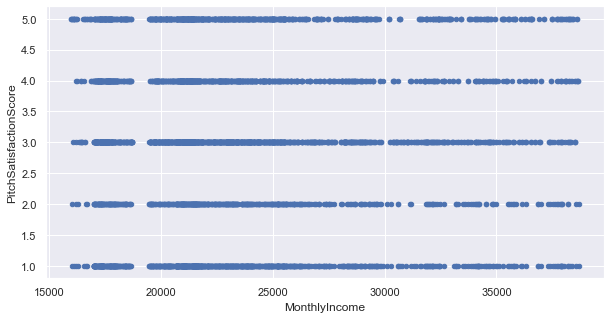

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by OwnCar Strip Plot


<Figure size 1080x720 with 0 Axes>

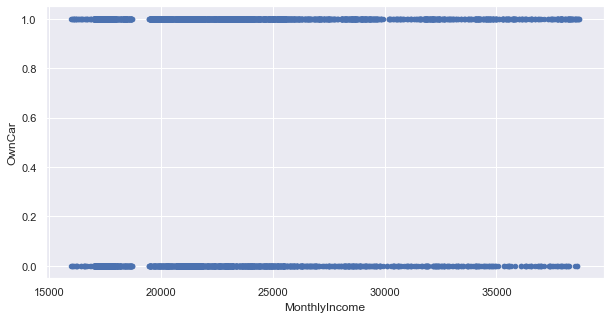

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by NumberOfChildrenVisiting Strip Plot


<Figure size 1080x720 with 0 Axes>

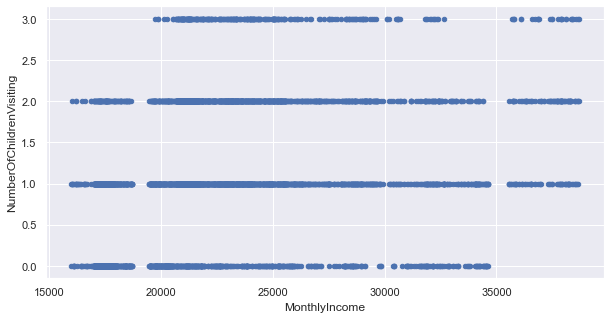

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.


MonthlyIncome by MonthlyIncome Strip Plot


<Figure size 1080x720 with 0 Axes>

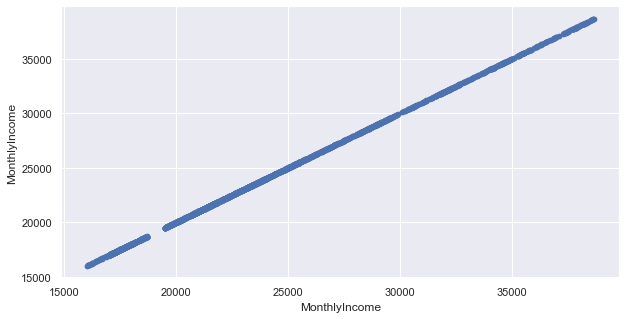

In [49]:
# lock subsets
nums = numerical_features
num = numerical_features

# call column names for plotting
for a in nums.columns:
    for b in num.columns:  # for every numeric
        # Scatter plot against a numeric variable
            print(a, "by", b, "Strip Plot")
            plt.figure(figsize=(15, 10))
            df.plot.scatter(x=a, y=b)
            plt.show()
        

- Those customers with lower `PitchSatisfactionScores` brought only 1 or 2 people on trips.
- The `NumberofPersonsVisiting` is higher amongst non-passport owners.
- No one who brought 1 or 5 people on a trip took the product offer.

### Correlation

In [50]:
# Correlation Analysis
corr = df.corr()
display(corr)

,ProdTaken,Age,CityTier,DurationOfPitch,NumberOfPersonVisiting,NumberOfFollowups,PreferredPropertyStar,NumberOfTrips,Passport,PitchSatisfactionScore,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
ProdTaken,1.00,-0.15,0.09,0.08,0.01,0.11,0.10,0.01,0.26,0.05,-0.01,0.01,-0.13
Age,-0.15,1.00,-0.02,-0.02,0.01,-0.00,-0.01,0.19,0.03,0.02,0.05,0.01,0.49
CityTier,0.09,-0.02,1.00,0.01,-0.00,0.02,-0.01,-0.03,0.00,-0.04,0.00,-0.00,0.06
DurationOfPitch,0.08,-0.02,0.01,1.00,0.07,0.01,-0.00,0.01,0.04,0.01,-0.01,0.03,-0.00
NumberOfPersonVisiting,0.01,0.01,-0.00,0.07,1.00,0.33,0.03,0.20,0.01,-0.02,0.01,0.61,0.21
NumberOfFollowups,0.11,-0.00,0.02,0.01,0.33,1.00,-0.02,0.15,0.00,0.00,0.01,0.29,0.18
PreferredPropertyStar,0.10,-0.01,-0.01,-0.00,0.03,-0.02,1.00,0.01,0.00,-0.02,0.02,0.04,0.01
NumberOfTrips,0.01,0.19,-0.03,0.01,0.20,0.15,0.01,1.00,0.01,-0.00,-0.02,0.18,0.16
Passport,0.26,0.03,0.00,0.04,0.01,0.00,0.00,0.01,1.00,0.00,-0.02,0.02,-0.00
PitchSatisfactionScore,0.05,0.02,-0.04,0.01,-0.02,0.00,-0.02,-0.00,0.00,1.00,0.07,0.00,0.04


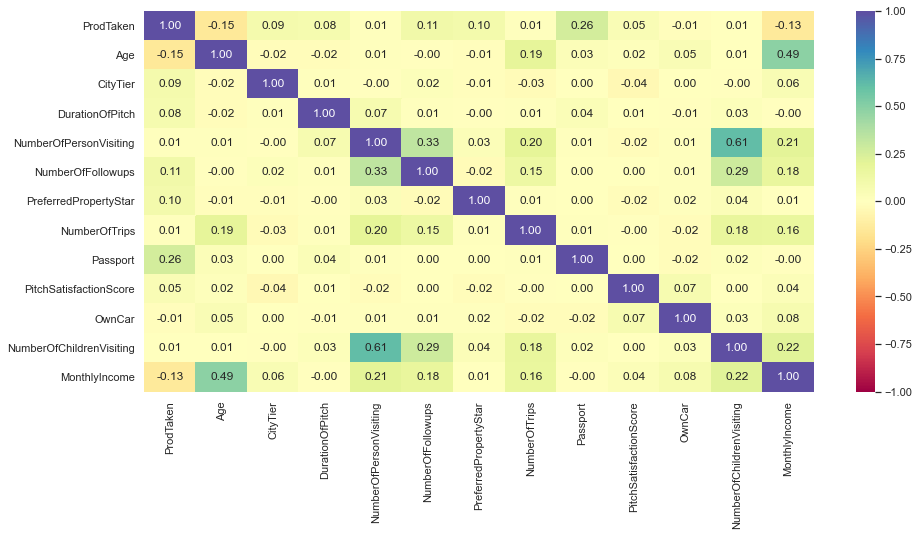

In [51]:
# heatmap
plt.figure(figsize=(15, 7))
sns.heatmap(df.corr(), annot=True, vmin=-1, vmax=1, fmt='.2f', cmap='Spectral')
plt.show()

* No higher correlations (>.75)
* `NumberofChildrenVisiting` and `NumberofPeronVisiting` has the highest with .61 which makes sense.
- Low correlation is not too crucial for logistic regression classification problems.

### Feature of Interest

`ProdTaken` as the dependent variable against every numeric variable.

In [52]:
# summary stats with one feature
df[df.ProdTaken == 1].describe().T

,count,mean,std,min,25%,50%,75%,max
ProdTaken,918.00,1.00,0.00,1.00,1.00,1.00,1.00,1.00
Age,874.00,34.78,10.08,18.00,28.00,33.00,41.00,60.00
CityTier,918.00,1.82,0.96,1.00,1.00,1.00,3.00,3.00
DurationOfPitch,873.00,16.89,8.48,6.00,9.00,15.00,23.00,36.00
NumberOfPersonVisiting,918.00,2.92,0.70,2.00,2.00,3.00,3.00,4.00
NumberOfFollowups,910.00,3.94,1.01,1.00,3.00,4.00,5.00,6.00
PreferredPropertyStar,912.00,3.75,0.86,3.00,3.00,3.00,5.00,5.00
NumberOfTrips,906.00,3.27,1.90,1.00,2.00,3.00,4.00,8.00
Passport,918.00,0.54,0.50,0.00,0.00,1.00,1.00,1.00
PitchSatisfactionScore,918.00,3.22,1.33,1.00,2.00,3.00,4.00,5.00


Amongst those who did take the product offering:

    - The `Age` is between 33 - 41 with the average being ~35.
    - The average `DurationofPitch` is ~17 minutes.
    - The majority do own a car.

In [53]:
# summary stats with one feature
df[df.ProdTaken == 0].describe().T

,count,mean,std,min,25%,50%,75%,max
ProdTaken,3960.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00
Age,3779.00,38.28,9.01,18.00,32.00,37.00,44.00,61.00
CityTier,3960.00,1.62,0.90,1.00,1.00,1.00,3.00,3.00
DurationOfPitch,3754.00,15.11,8.11,5.00,9.00,13.00,19.00,36.00
NumberOfPersonVisiting,3960.00,2.90,0.73,1.00,2.00,3.00,3.00,5.00
NumberOfFollowups,3923.00,3.65,0.99,1.00,3.00,4.00,4.00,6.00
PreferredPropertyStar,3941.00,3.54,0.78,3.00,3.00,3.00,4.00,5.00
NumberOfTrips,3832.00,3.21,1.75,1.00,2.00,3.00,4.00,8.00
Passport,3960.00,0.23,0.42,0.00,0.00,0.00,0.00,1.00
PitchSatisfactionScore,3960.00,3.05,1.37,1.00,2.00,3.00,4.00,5.00


Amongst those who did not take the product offering:

    - The `CityTier` is mostly 1's.
    - The average `NumberOfPersonVisiting` is close to 3.
    - The majority do not own passports.

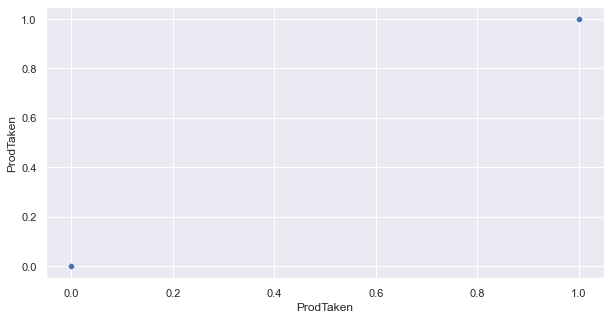

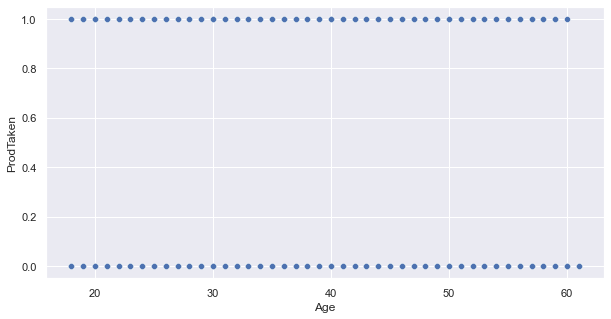

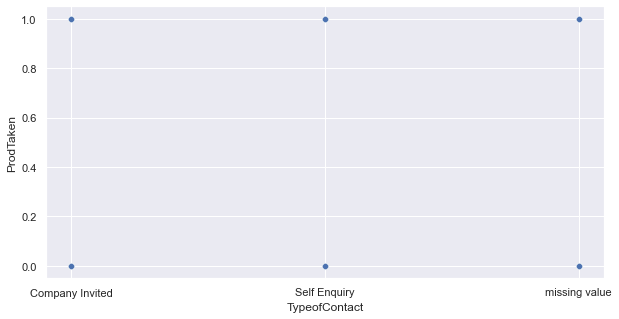

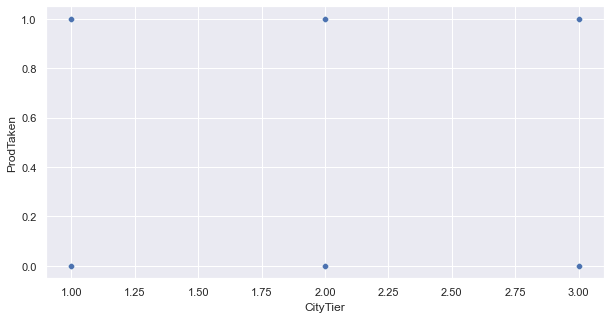

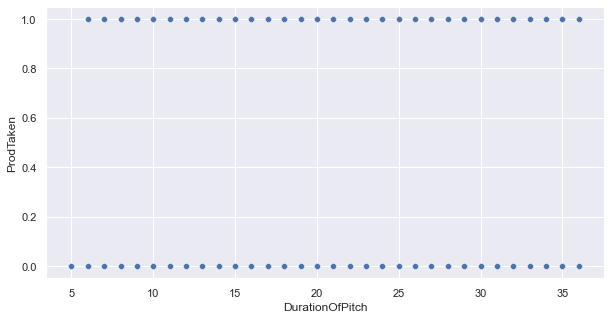

...

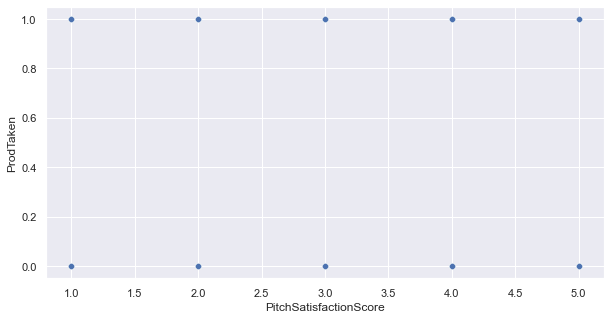

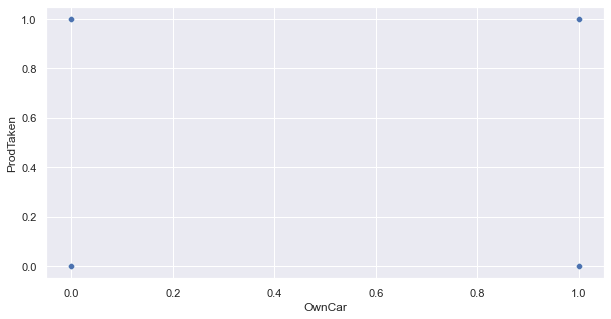

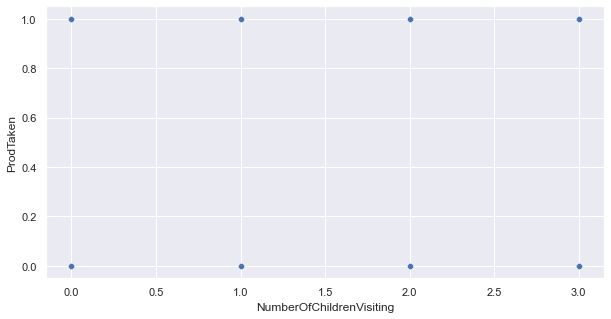

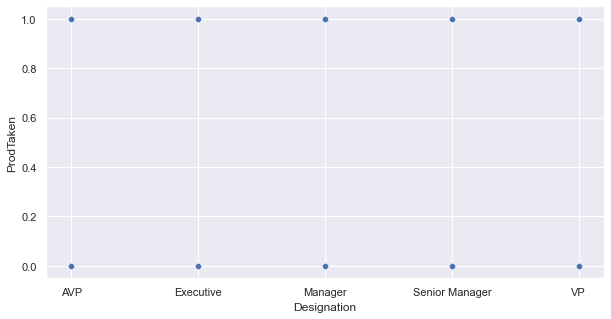

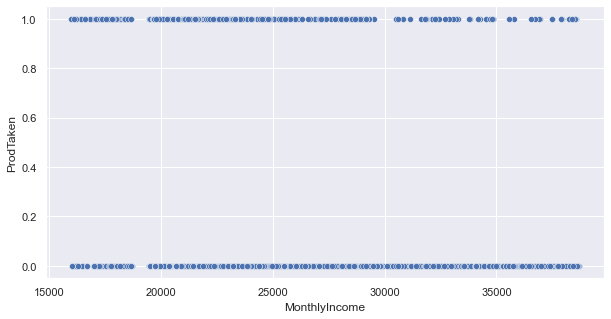

In [54]:
# plot indepdents against dependent
for i, variable in enumerate(df):
    sns.scatterplot(x=df[variable], y=df.ProdTaken)
    plt.show()

- The 2 or so outliers in `DurationofPitch` are resulting in customers not taking the pitch
- The number of trips is higher amongst those who did not take the product offering than those who did.
- The two lowest incomes belong to customers who did not take the product offering.

#### Stack plots
Good for finding features of interest relative to target variable

In [55]:
## Function to plot stacked bar chart
def stacked_plot(x):
    sns.set(palette="nipy_spectral")
    tab1 = pd.crosstab(x, df["ProdTaken"], margins=True)
    print(tab1)
    print("-" * 120)
    tab = pd.crosstab(x, df["ProdTaken"], normalize="index")
    tab.plot(kind="bar", stacked=True, figsize=(10, 5))
    # plt.legend(loc='lower left', frameon=False)
    # plt.legend(loc="upper left", bbox_to_anchor=(0,1))
    plt.show()

ProdTaken     0    1   All
Age                       
18.0          6    8    14
19.0         11   21    32
20.0         13   25    38
21.0         18   23    41
22.0         31   15    46
23.0         33   13    46
24.0         38   18    56
25.0         54   20    74
26.0         69   37   106
27.0        108   30   138
28.0        121   26   147
29.0        121   57   178
30.0        151   47   198
31.0        162   40   202
32.0        157   40   197
33.0        149   40   189
34.0        167   44   211
35.0        203   34   237
36.0        203   27   230
37.0        160   24   184
38.0        160   15   175
39.0        134   14   148
40.0        122   23   145
41.0        131   24   155
42.0        122   20   142
43.0        120   10   130
44.0         88   17   105
45.0         98   18   116
46.0        110   11   121
47.0         76   12    88
48.0         54   11    65
49.0         56    9    65
50.0         74   12    86
51.0         73   17    90
52.0         54   14    68
5

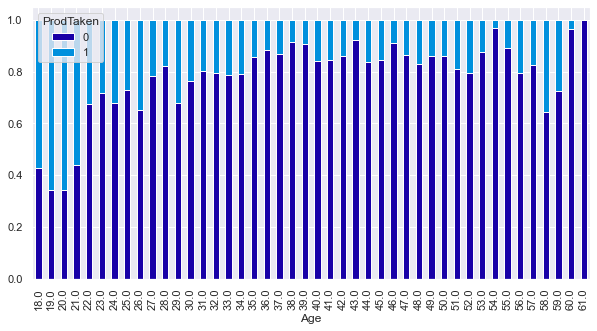

In [56]:
stacked_plot(df.Age)

- Product offerings to customers below 23 tended to do better.
- Anyone over 54 years old tended not to take the product offer.
- The 61 year olds did not take any offers.

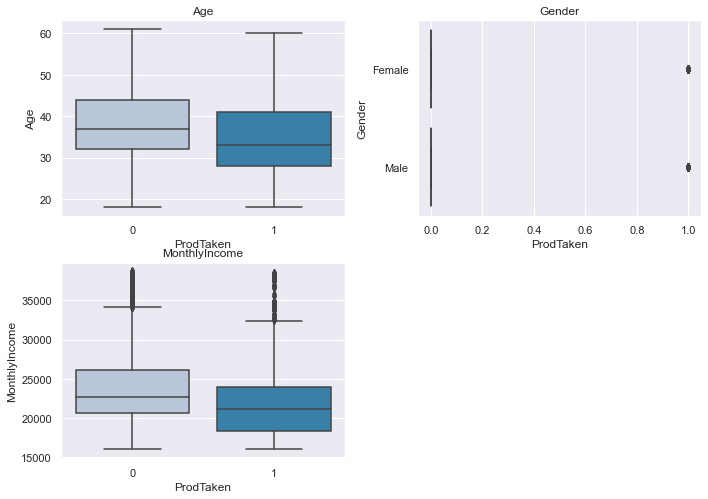

In [57]:
# create a list of features
cols = df[[
    'Age', 'Gender', 'MonthlyIncome'
]].columns.tolist()

plt.figure(figsize=(10, 10))

# print boxplot for variables in cols against 1 feature
for i, variable in enumerate(cols):
    plt.subplot(3, 2, i + 1)
    sns.boxplot(df["ProdTaken"], df[variable], palette="PuBu")
    plt.tight_layout()
    plt.title(variable)
plt.show()

- The average `Age` of product takers is lower than for non-takers
- The outlier in `Gender` is to take the product offer.
- The `MonthlyIncome`average of product offer takers is lower than non-takers.

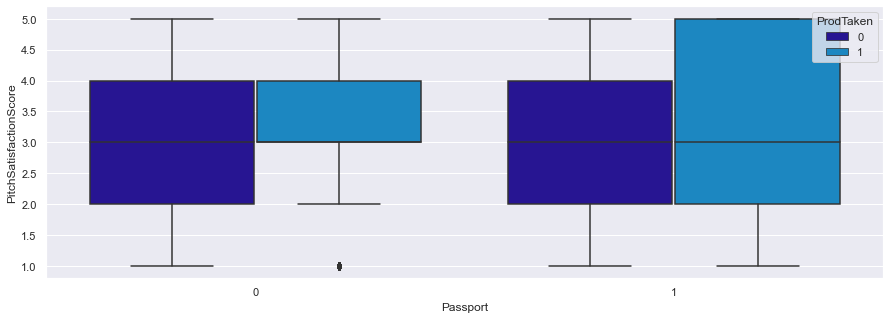

In [58]:
# box plot of 3 features
plt.figure(figsize=(15,5))
sns.boxplot(df['Passport'],df['PitchSatisfactionScore'],hue=df['ProdTaken'])
plt.show()

- Passport owners tended to have higher pitch satisfcation scores.
- Among those who did not take the offer are people who gave a 3.0 average rating on the pitch and do and do not own passports.
- Non-passport owners gave a higher satisfcation score and did take the product offering.

ProdTaken     0    1   All
ProdTaken                 
0          3960    0  3960
1             0  918   918
All        3960  918  4878
------------------------------------------------------------------------------------------------------------------------


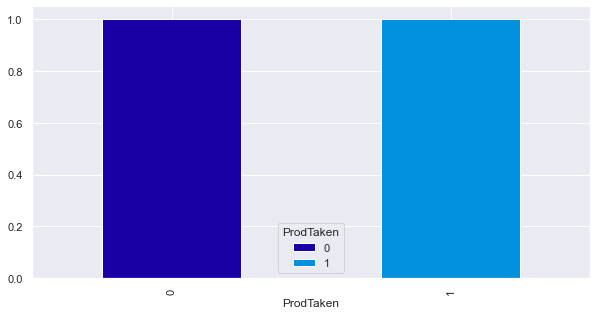

ProdTaken     0    1   All
Age                       
18.0          6    8    14
19.0         11   21    32
20.0         13   25    38
21.0         18   23    41
22.0         31   15    46
23.0         33   13    46
24.0         38   18    56
25.0         54   20    74
26.0         69   37   106
27.0        108   30   138
28.0        121   26   147
29.0        121   57   178
30.0        151   47   198
31.0        162   40   202
32.0        157   40   197
33.0        149   40   189
34.0        167   44   211
35.0        203   34   237
36.0        203   27   230
37.0        160   24   184
38.0        160   15   175
39.0        134   14   148
40.0        122   23   145
41.0        131   24   155
42.0        122   20   142
43.0        120   10   130
44.0         88   17   105
45.0         98   18   116
46.0        110   11   121
47.0         76   12    88
48.0         54   11    65
49.0         56    9    65
50.0         74   12    86
51.0         73   17    90
52.0         54   14    68
5

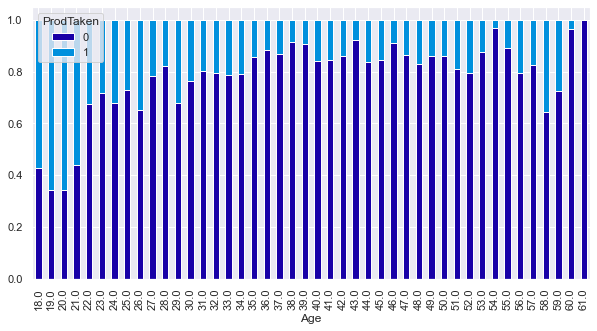

ProdTaken           0    1   All
TypeofContact                   
Company Invited  1105  308  1413
Self Enquiry     2833  607  3440
missing value      22    3    25
All              3960  918  4878
------------------------------------------------------------------------------------------------------------------------


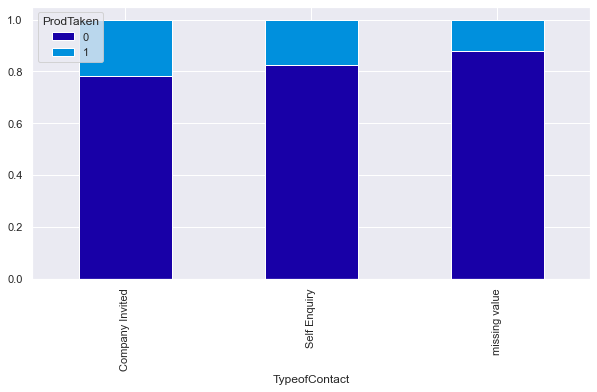

ProdTaken     0    1   All
CityTier                  
1          2664  518  3182
2           152   46   198
3          1144  354  1498
All        3960  918  4878
------------------------------------------------------------------------------------------------------------------------


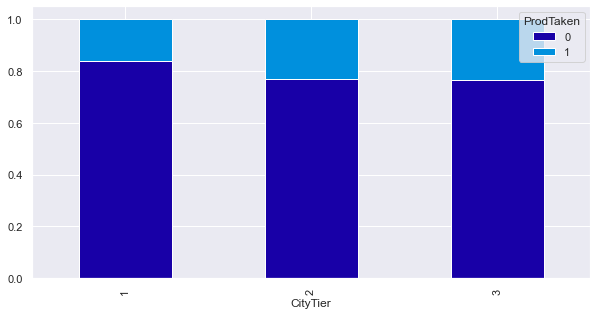

ProdTaken           0    1   All
DurationOfPitch                 
5.0                 6    0     6
6.0               268   39   307
7.0               294   48   342
8.0               273   60   333
9.0               403   79   482
10.0              198   44   242
11.0              167   36   203
12.0              161   33   194
13.0              191   32   223
14.0              212   41   253
15.0              216   52   268
16.0              217   56   273
17.0              148   24   172
18.0               56   19    75
19.0               36   21    57
20.0               46   19    65
21.0               57   16    73
22.0               66   23    89
23.0               58   21    79
24.0               54   16    70
25.0               59   14    73
26.0               60   12    72
27.0               58   14    72
28.0               44   17    61
29.0               53   21    74
30.0               65   30    95
31.0               52   31    83
32.0               59   15    74
33.0      

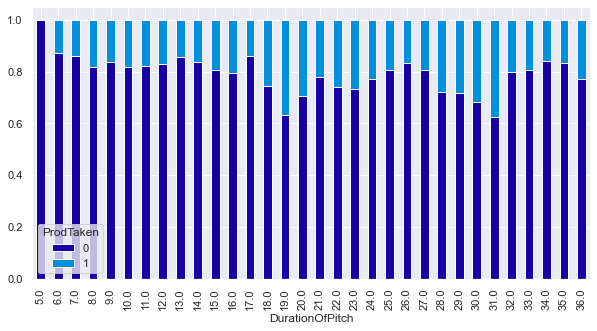

ProdTaken          0    1   All
Occupation                     
Free Lancer        0    2     2
Large Business   312  118   430
Salaried        1948  414  2362
Small Business  1700  384  2084
All             3960  918  4878
------------------------------------------------------------------------------------------------------------------------


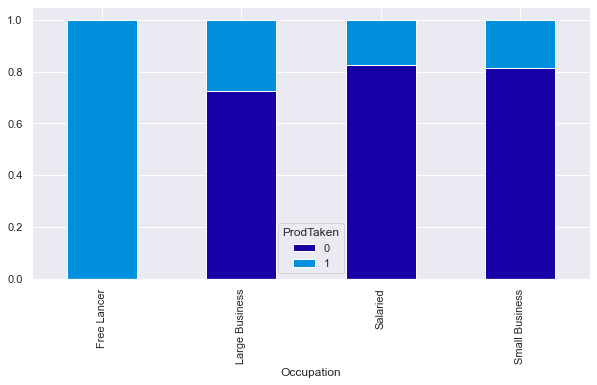

ProdTaken     0    1   All
Gender                    
Female     1626  342  1968
Male       2334  576  2910
All        3960  918  4878
------------------------------------------------------------------------------------------------------------------------


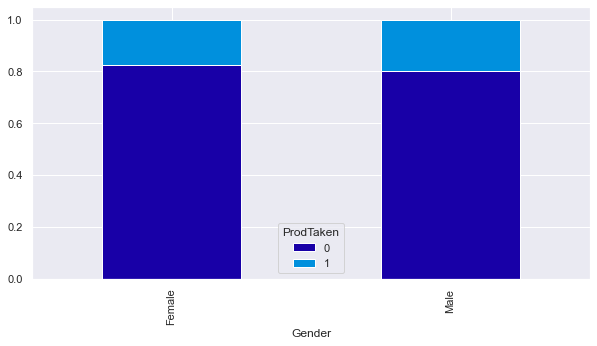

ProdTaken                  0    1   All
NumberOfPersonVisiting                 
1                         39    0    39
2                       1148  266  1414
3                       1938  459  2397
4                        832  193  1025
5                          3    0     3
All                     3960  918  4878
------------------------------------------------------------------------------------------------------------------------


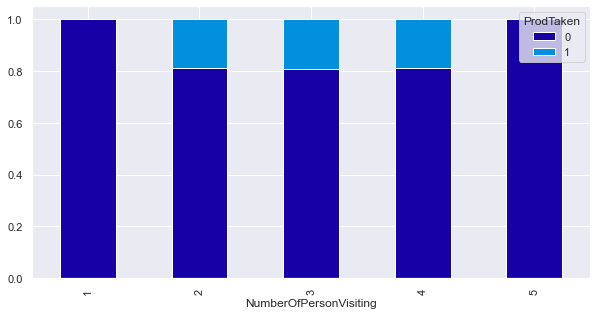

ProdTaken             0    1   All
NumberOfFollowups                 
1.0                 156   20   176
2.0                 205   24   229
3.0                1219  243  1462
4.0                1685  378  2063
5.0                 576  191   767
6.0                  82   54   136
All                3923  910  4833
------------------------------------------------------------------------------------------------------------------------


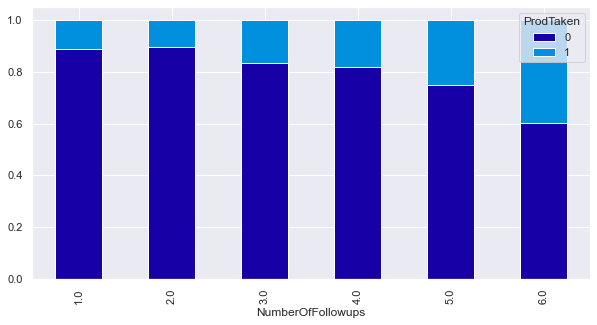

ProdTaken          0    1   All
ProductPitched                 
Basic           1286  550  1836
Deluxe          1524  204  1728
King             210   20   230
Standard         618  124   742
Super Deluxe     322   20   342
All             3960  918  4878
------------------------------------------------------------------------------------------------------------------------


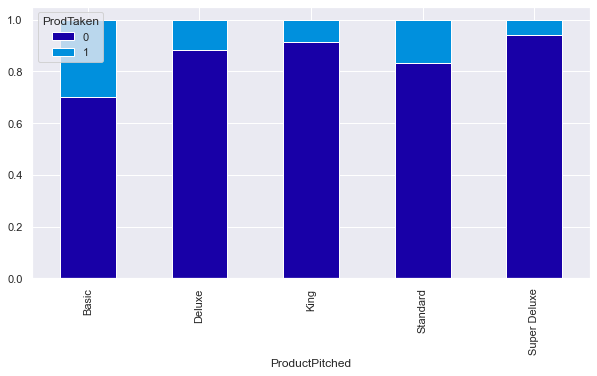

ProdTaken                 0    1   All
PreferredPropertyStar                 
3.0                    2507  480  2987
4.0                     729  182   911
5.0                     705  250   955
All                    3941  912  4853
------------------------------------------------------------------------------------------------------------------------


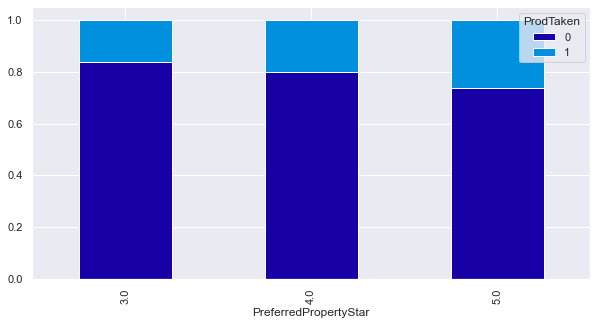

ProdTaken         0    1   All
MaritalStatus                 
Divorced        824  124   948
Married        2012  326  2338
Single          610  302   912
Unmarried       514  166   680
All            3960  918  4878
------------------------------------------------------------------------------------------------------------------------


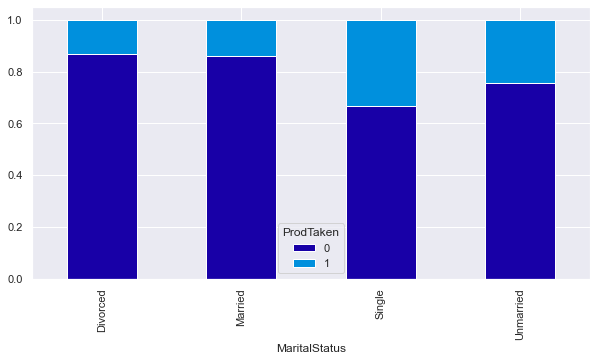

ProdTaken         0    1   All
NumberOfTrips                 
1.0             507  112   619
2.0            1164  299  1463
3.0             861  217  1078
4.0             415   61   476
5.0             395   62   457
6.0             258   64   322
7.0             156   62   218
8.0              76   29   105
All            3832  906  4738
------------------------------------------------------------------------------------------------------------------------


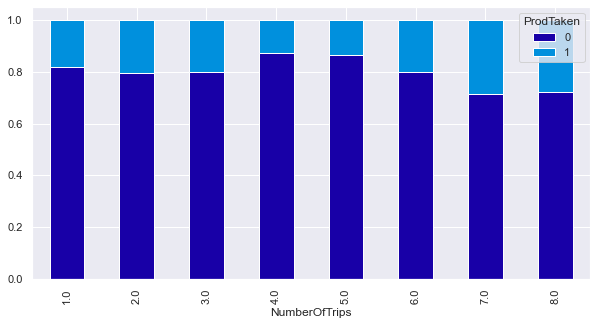

ProdTaken     0    1   All
Passport                  
0          3036  426  3462
1           924  492  1416
All        3960  918  4878
------------------------------------------------------------------------------------------------------------------------


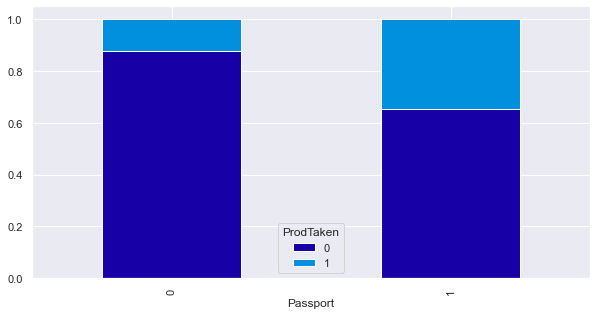

ProdTaken                  0    1   All
PitchSatisfactionScore                 
1                        796  144   940
2                        494   88   582
3                       1162  316  1478
4                        750  160   910
5                        758  210   968
All                     3960  918  4878
------------------------------------------------------------------------------------------------------------------------


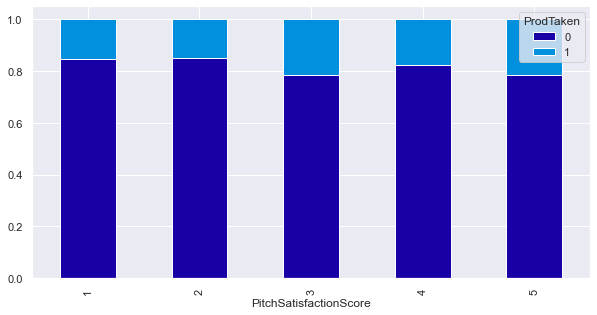

ProdTaken     0    1   All
OwnCar                    
0          1494  360  1854
1          2466  558  3024
All        3960  918  4878
------------------------------------------------------------------------------------------------------------------------


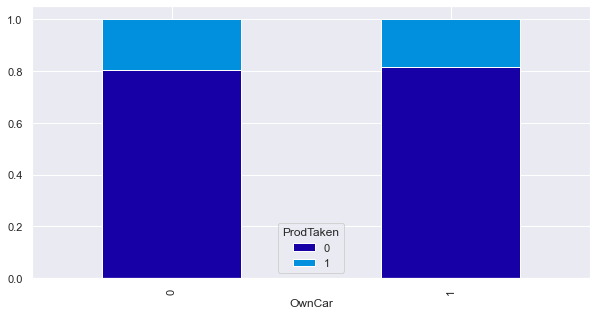

ProdTaken                    0    1   All
NumberOfChildrenVisiting                 
0.0                        877  202  1079
1.0                       1684  391  2075
2.0                       1081  252  1333
3.0                        259   66   325
All                       3901  911  4812
------------------------------------------------------------------------------------------------------------------------


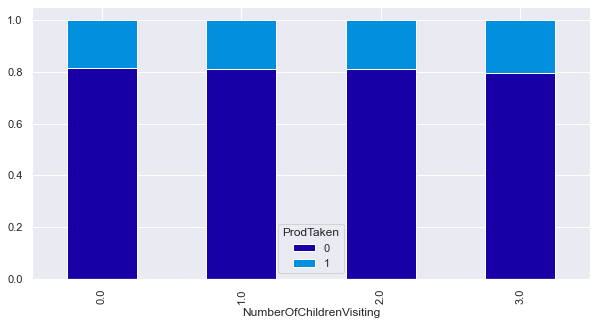

ProdTaken          0    1   All
Designation                    
AVP              322   20   342
Executive       1286  550  1836
Manager         1524  204  1728
Senior Manager   618  124   742
VP               210   20   230
All             3960  918  4878
------------------------------------------------------------------------------------------------------------------------


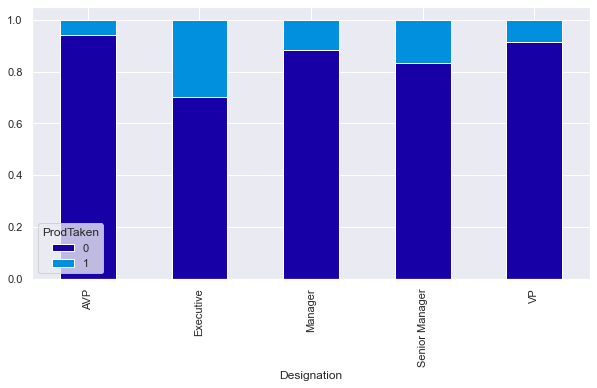

ProdTaken         0    1   All
MonthlyIncome                 
16009.0           0    2     2
16051.0           2    0     2
16052.0           2    0     2
16081.0           0    1     1
16091.0           0    1     1
...             ...  ...   ...
38604.0           2    0     2
38621.0           2    0     2
38651.0           2    0     2
38677.0           2    0     2
All            3759  886  4645

[2470 rows x 3 columns]
------------------------------------------------------------------------------------------------------------------------


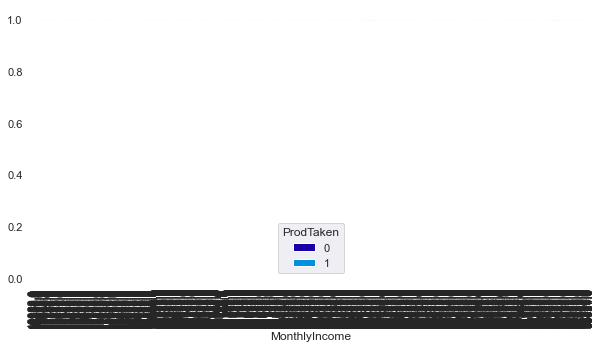

In [59]:
import warnings
warnings.filterwarnings('ignore')

# stack plots against categoricals
cats = df.columns

for i in cats:
    stacked_plot(df[i])

Those who did take the product offering:
    
    - Did have passports
    - Took 19 or 20 trips in majority.
    - Are Married or Single.
    - Have `PreferredPropertyStar` of 3 or 5.
    - Took the Basic package.
    - Had 4 or 3 follow-ups
    - Took 3 or 2 people on a trip.
    - Are male.
    - Are salaried employees.
    - Received a pitch that was 8 - 9 minutes long.
    - Are in City Tier 1 or 3.
    - Are 29 - 36 years old.
    - Took self-enquires into the business.

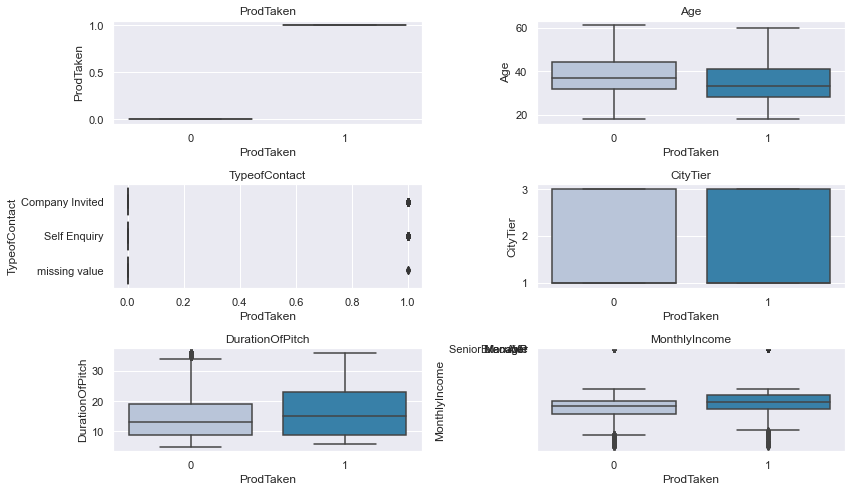

In [60]:
# create subplots against target variable
cols = df.columns
plt.figure(figsize=(12, 7))

for i, variable in enumerate(cols):
    try:
        plt.subplot(3, 2, i + 1)
    except ValueError:
        pass  # do nothing!

    sns.boxplot(df["ProdTaken"], df[variable], palette="PuBu")

    plt.tight_layout()

    plt.title(variable)
plt.show()

Similar look at what we have seen before.

## Package Profiling

Show statistical breakdown of other attributes per each package for those who opted for a purchase.

In [61]:
# for every categorical in the ProductPitched where the ProductTakenis 1, show the stats
for i in df.ProductPitched.unique():
    display(i, df[(df['ProductPitched']==i) & (df['ProdTaken']==1)].describe(include='all').T)

'Deluxe'

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ProdTaken,204.00,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,1.00,1.00
Age,198.00,NaN,NaN,NaN,37.64,8.47,21.00,32.00,35.50,44.00,59.00
TypeofContact,204,2,Self Enquiry,136,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CityTier,204.00,NaN,NaN,NaN,2.41,0.91,1.00,1.00,3.00,3.00,3.00
DurationOfPitch,180.00,NaN,NaN,NaN,19.10,9.23,6.00,11.00,16.00,28.00,36.00
Occupation,204,3,Small Business,108,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,204,2,Male,134,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberOfPersonVisiting,204.00,NaN,NaN,NaN,2.95,0.71,2.00,2.00,3.00,3.00,4.00
NumberOfFollowups,200.00,NaN,NaN,NaN,3.97,1.05,1.00,3.00,4.00,5.00,6.00
ProductPitched,204,1,Deluxe,204,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'Basic'

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ProdTaken,550.00,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,1.00,1.00
Age,513.00,NaN,NaN,NaN,31.29,9.09,18.00,25.00,30.00,35.00,59.00
TypeofContact,550,3,Self Enquiry,355,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CityTier,550.00,NaN,NaN,NaN,1.51,0.83,1.00,1.00,1.00,2.00,3.00
DurationOfPitch,530.00,NaN,NaN,NaN,15.81,7.92,6.00,9.00,14.00,22.00,36.00
Occupation,550,4,Salaried,260,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,550,2,Male,342,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberOfPersonVisiting,550.00,NaN,NaN,NaN,2.91,0.70,2.00,2.00,3.00,3.00,4.00
NumberOfFollowups,546.00,NaN,NaN,NaN,3.95,0.97,1.00,3.00,4.00,5.00,6.00
ProductPitched,550,1,Basic,550,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'Standard'

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ProdTaken,124.00,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,1.00,1.00
Age,123.00,NaN,NaN,NaN,41.01,9.88,19.00,33.00,38.00,49.00,60.00
TypeofContact,124,2,Self Enquiry,92,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CityTier,124.00,NaN,NaN,NaN,2.10,0.97,1.00,1.00,3.00,3.00,3.00
DurationOfPitch,123.00,NaN,NaN,NaN,19.07,9.05,6.00,11.00,17.00,29.00,36.00
Occupation,124,3,Small Business,58,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,124,2,Male,76,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberOfPersonVisiting,124.00,NaN,NaN,NaN,2.97,0.71,2.00,2.00,3.00,3.00,4.00
NumberOfFollowups,124.00,NaN,NaN,NaN,3.94,0.91,1.00,3.00,4.00,4.25,6.00
ProductPitched,124,1,Standard,124,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'Super Deluxe'

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ProdTaken,20.00,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,1.00,1.00
Age,20.00,NaN,NaN,NaN,43.50,4.84,39.00,40.00,42.00,45.25,56.00
TypeofContact,20,2,Company Invited,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CityTier,20.00,NaN,NaN,NaN,2.60,0.82,1.00,3.00,3.00,3.00,3.00
DurationOfPitch,20.00,NaN,NaN,NaN,18.50,7.33,8.00,15.00,18.50,20.00,31.00
Occupation,20,2,Salaried,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,20,2,Male,16,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberOfPersonVisiting,20.00,NaN,NaN,NaN,2.70,0.66,2.00,2.00,3.00,3.00,4.00
NumberOfFollowups,20.00,NaN,NaN,NaN,3.10,1.62,1.00,2.00,3.00,4.00,6.00
ProductPitched,20,1,Super Deluxe,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN


'King'

,count,unique,top,freq,mean,std,min,25%,50%,75%,max
ProdTaken,20.00,NaN,NaN,NaN,1.00,0.00,1.00,1.00,1.00,1.00,1.00
Age,20.00,NaN,NaN,NaN,48.90,9.62,27.00,42.00,52.50,56.00,59.00
TypeofContact,20,1,Self Enquiry,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN
CityTier,20.00,NaN,NaN,NaN,1.80,1.01,1.00,1.00,1.00,3.00,3.00
DurationOfPitch,20.00,NaN,NaN,NaN,10.50,4.14,8.00,8.00,9.00,9.00,19.00
Occupation,20,3,Small Business,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
Gender,20,2,Female,12,NaN,NaN,NaN,NaN,NaN,NaN,NaN
NumberOfPersonVisiting,20.00,NaN,NaN,NaN,2.90,0.72,2.00,2.00,3.00,3.00,4.00
NumberOfFollowups,20.00,NaN,NaN,NaN,4.30,1.13,3.00,3.00,4.00,5.00,6.00
ProductPitched,20,1,King,20,NaN,NaN,NaN,NaN,NaN,NaN,NaN


Each of the above gives a flavor of the profile for each package which helps us establish some baselines in creating a new profile for the Welness travel package.
- We see jumps of 3k or more between income of customers
- We see average age ranges from 31 to 49.
- More single people are shown than married.

# Modeling

## Model Building Approach
1. Data preparation
2. Partition the data into train and test set.
 - Impute Missing
 - Get dummies on categoricals
3. Build a Logistic Regression model on the train data.
4. Tune the model and drop features for multicolinearity.
5. Test the data on test set.

## Model Evaluation Criterion

Customer takes the product offer or not. 1 indicates customer did take the product. 0 indicates customer did not take the product.


**Model can make wrong predictions as:**
1. Predicting a customer purchases the package offer and the customer does not. - Missed targeted / Lost time
2. Predicting customer does not purchase the package offer, and the person does opt for the package. - Missed opportunity

**Which case is more important? **
* 2. Predicting a customer will not purchase the travel package and the person does opt for the package. Losing on a source of income by mistargeting.

**Which metric to optimize?**
* We would want Recall to be maximized, the greater the Recall higher the chances of minimizing false negatives because if a model predicts that an customer is likely to buy the package and in reality, that person doesn't have enough funds or interest then that person will not buy the package but if we predict that a person is not going to purchase the package but the person is interested in purchasing it then that customer would go onto the opt-out marketing list when they were actually interested. We want to predict as many Positives as possible and reduce the False Negatives.

The metric which is considered to be important for the business case is: **Recall**.

**Functions for model scoring**

In [62]:
## Function to create confusion matrix
def make_confusion_matrix(model,y_actual,labels=[1, 0]):
    '''
    model : classifier to predict values of X
    y_actual : ground truth  
    
    '''
    y_predict = model.predict(X_test)
    cm=metrics.confusion_matrix( y_actual, y_predict, labels=[0, 1])
    df_cm = pd.DataFrame(cm, index = [i for i in ["Actual - No","Actual - Yes"]],
                  columns = [i for i in ['Predicted - No','Predicted - Yes']])
    group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]
    group_percentages = ["{0:.2%}".format(value) for value in
                         cm.flatten()/np.sum(cm)]
    labels = [f"{v1}\n{v2}" for v1, v2 in
              zip(group_counts,group_percentages)]
    labels = np.asarray(labels).reshape(2,2)
    plt.figure(figsize = (10,7))
    sns.heatmap(df_cm, annot=labels,fmt='')
    plt.ylabel('True label')
    plt.xlabel('Predicted label')

In [63]:
##  Function to calculate recall score
def get_recall_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    a = [] # defining an empty list to store train and test results
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    a.append(train_recall) # adding train recall to list 
    a.append(test_recall) # adding test recall to list
    if flag == True: # If the flag is set to True then only the following print statements will be dispayed
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
    
    return a # returning the list with train and test scores

In [64]:
##  Function to calculate precision score
def get_precision_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    b = []  # defining an empty list to store train and test results
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    b.append(train_precision) # adding train precision to list
    b.append(test_precision) # adding test precision to list
    if flag == True: # If the flag is set to True then only the following print statements will be dispayed
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))

    return b # returning the list with train and test scores

In [65]:
##  Function to calculate accuracy score
def get_accuracy_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    c = [] # defining an empty list to store train and test results
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    c.append(train_acc) # adding train accuracy to list
    c.append(test_acc) # adding test accuracy to list
    if flag == True: # If the flag is set to True then only the following print statements will be dispayed
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
    
    return c # returning the list with train and test scores

In [66]:
##  Function to calculate different metric scores of the model - Accuracy, Recall and Precision
def get_metrics_score(model,flag=True):
    '''
    model : classifier to predict values of X

    '''
    # defining an empty list to store train and test results
    score_list=[] 
    
    pred_train = model.predict(X_train)
    pred_test = model.predict(X_test)
    
    train_acc = model.score(X_train,y_train)
    test_acc = model.score(X_test,y_test)
    
    train_recall = metrics.recall_score(y_train,pred_train)
    test_recall = metrics.recall_score(y_test,pred_test)
    
    train_precision = metrics.precision_score(y_train,pred_train)
    test_precision = metrics.precision_score(y_test,pred_test)
    
    train_f1 = f1_score(y_train,pred_train)
    test_f1 = f1_score(y_test,pred_test)
    
    score_list.extend((train_acc,test_acc,train_recall,test_recall,train_precision,test_precision, train_f1, test_f1))
        
    # If the flag is set to True then only the following print statements will be dispayed. The default value is set to True.
    if flag == True: 
        print("Accuracy on training set : ",model.score(X_train,y_train))
        print("Accuracy on test set : ",model.score(X_test,y_test))
        print("Recall on training set : ",metrics.recall_score(y_train,pred_train))
        print("Recall on test set : ",metrics.recall_score(y_test,pred_test))
        print("Precision on training set : ",metrics.precision_score(y_train,pred_train))
        print("Precision on test set : ",metrics.precision_score(y_test,pred_test))
        print("F1-Score on training set : ",metrics.f1_score(y_train,pred_train))
        print("F1-Score on test set : ",metrics.f1_score(y_test,pred_test))
    
    return score_list # returning the list with train and test scores

## Data Preparation

## Dropping unneed variables

Because we will be predicting on customers that have not interacted with us yet we can drop the Customer interaction data. 

- Sales pitch satisfaction score

- Product pitched by the salesperson

- Total number of follow-ups has been done by the salesperson after the sales pitch

- Duration of the pitch by a salesperson to the customer

In [67]:
# recreate dataframe with dropped columns
df = df.drop(columns=['PitchSatisfactionScore','ProductPitched','NumberOfFollowups','DurationOfPitch'])

Because Freelancer only has 2 rows it will skew our results and pull coefficients in the wrong direction. I will go ahead and drop it.

In [68]:
# show rows
df[df.Occupation == "Free Lancer"]

,ProdTaken,Age,TypeofContact,CityTier,Occupation,Gender,NumberOfPersonVisiting,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome
2,1,37.00,Self Enquiry,1,Free Lancer,Male,3,3.00,Single,7.00,1,0,0.00,Executive,17090.00
2446,1,38.00,Self Enquiry,1,Free Lancer,Male,4,3.00,Single,8.00,1,0,1.00,Executive,20768.00


In [69]:
# inplace dropping of rows
df = df.drop(index=df[df.Occupation == "Free Lancer"].index, axis=0)

In [70]:
# show rows
df[df.Occupation == "Free Lancer"]

,ProdTaken,Age,TypeofContact,CityTier,Occupation,Gender,NumberOfPersonVisiting,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,Designation,MonthlyIncome


`Designation`
This is a variable that is not easy to standardize across industries so we will drop it for the sake of a more generalized model. Monthly income and occupation can tell us similar information.

In [71]:
# drop column
df = df.drop(columns="Designation", axis=0)

# check drop
df.dtypes

ProdTaken                      int64
Age                          float64
TypeofContact               category
CityTier                       int64
Occupation                  category
Gender                      category
NumberOfPersonVisiting         int64
PreferredPropertyStar        float64
MaritalStatus               category
NumberOfTrips                float64
Passport                       int64
OwnCar                         int64
NumberOfChildrenVisiting     float64
MonthlyIncome                float64
dtype: object

### Partition Data

In [72]:
# split df into two frames
X = df.drop(["ProdTaken"], axis=1)
Y = df[["ProdTaken"]]

In [73]:
# Splitting data into training and test set
# "The stratify argument is very useful and can be used whenever we want to make sure that the proportion of values of y are the same in the data and in the samples created after splitting. This leads to a good representation of the data in the test set, even though it is very small in size. Generally, for imbalanced target variables, stratify can be of great help."
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.3, random_state=1, stratify=Y)
print(X_train.shape, X_test.shape)

X_train.head()

(3413, 13) (1463, 13)


,Age,TypeofContact,CityTier,Occupation,Gender,NumberOfPersonVisiting,PreferredPropertyStar,MaritalStatus,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,MonthlyIncome
2278,29.00,Self Enquiry,1,Salaried,Female,3,3.00,Married,5.00,0,1,0.00,17514.00
1709,NaN,Self Enquiry,1,Salaried,Male,3,3.00,Single,1.00,1,0,2.00,NaN
1807,NaN,Self Enquiry,1,Salaried,Male,1,3.00,Single,1.00,0,1,0.00,NaN
2268,33.00,Self Enquiry,1,Small Business,Male,2,4.00,Single,5.00,1,1,0.00,17313.00
1248,NaN,Self Enquiry,1,Small Business,Female,3,3.00,Single,2.00,0,1,2.00,18445.00


Lets check split of data

In [74]:
# get counts table
Y.value_counts()

ProdTaken
0            3960
1             916
dtype: int64

In [75]:
# get counts table
y_train.value_counts()

ProdTaken
0            2772
1             641
dtype: int64

In [76]:
# get counts table
y_test.value_counts()

ProdTaken
0            1188
1             275
dtype: int64

In [77]:
# print the size of the training vs original df
print("{0:0.2f}% data is in training set".format(
    (len(X_train)/len(df.index)) * 100))
print("{0:0.2f}% data is in test set".format(
    (len(X_test)/len(df.index)) * 100))

70.00% data is in training set
30.00% data is in test set


## Missing Value imputation

Using median for continuous numeric dtypes. The SimpleImputer method will using the median where needed.

### Numeric filling

In [78]:
# set method parameters
si1=SimpleImputer(strategy="median")

# create lists for imputation
numeric_columns = ['MonthlyIncome', 'Age', 'NumberOfTrips']

cate_cols = ['NumberOfChildrenVisiting','PreferredPropertyStar','TypeofContact']

In [79]:
# Fit and transform the training data and test data
X_train[numeric_columns]=si1.fit_transform(X_train[numeric_columns])

X_test[numeric_columns]=si1.fit_transform(X_test[numeric_columns])

### Categorical filling

In [80]:
# set method parameters
si2=SimpleImputer(strategy="most_frequent")

#Fit and transform the train data
X_train[cate_cols]=si2.fit_transform(X_train[cate_cols])

#Transform the test data i.e. replace missing values with the mode calculated using training data
X_test[cate_cols]=si2.transform(X_test[cate_cols])

In [81]:
# check for missing
# looking at which columns have the most missing values
display(X_train.isnull().sum().sort_values(ascending=False))  # numpy.nan and None
display(X_test.isnull().sum().sort_values(ascending=False))

Age                         0
TypeofContact               0
CityTier                    0
Occupation                  0
Gender                      0
NumberOfPersonVisiting      0
PreferredPropertyStar       0
MaritalStatus               0
NumberOfTrips               0
Passport                    0
OwnCar                      0
NumberOfChildrenVisiting    0
MonthlyIncome               0
dtype: int64

Age                         0
TypeofContact               0
CityTier                    0
Occupation                  0
Gender                      0
NumberOfPersonVisiting      0
PreferredPropertyStar       0
MaritalStatus               0
NumberOfTrips               0
Passport                    0
OwnCar                      0
NumberOfChildrenVisiting    0
MonthlyIncome               0
dtype: int64

In [82]:
# Find object types
df.dtypes

ProdTaken                      int64
Age                          float64
TypeofContact               category
CityTier                       int64
Occupation                  category
Gender                      category
NumberOfPersonVisiting         int64
PreferredPropertyStar        float64
MaritalStatus               category
NumberOfTrips                float64
Passport                       int64
OwnCar                         int64
NumberOfChildrenVisiting     float64
MonthlyIncome                float64
dtype: object

**Odd values or mixed-dtypes that need correction (data-entry errors)**

We need to clean up the float points (`Age`, `NumberOfChildrenVisiting`, etc.) and convert them to integers since they are discrete and not continuous. 

While `MonthlyIncome` is a continuous variable we impute it to an integer because there are no decimals used in this dataset.

In [83]:
# view float dtypes
floats = list(X_train.select_dtypes(float).columns)

# conver to int-type
for colname in floats:
    X_train[colname] = X_train[colname].astype(int)
    X_test[colname] = X_test[colname].astype(int)


In [84]:
# Find object types
display(X_train.dtypes)
display(X_test.dtypes)

Age                            int32
TypeofContact                 object
CityTier                       int64
Occupation                  category
Gender                      category
NumberOfPersonVisiting         int64
PreferredPropertyStar          int32
MaritalStatus               category
NumberOfTrips                  int32
Passport                       int64
OwnCar                         int64
NumberOfChildrenVisiting       int32
MonthlyIncome                  int32
dtype: object

Age                            int32
TypeofContact                 object
CityTier                       int64
Occupation                  category
Gender                      category
NumberOfPersonVisiting         int64
PreferredPropertyStar          int32
MaritalStatus               category
NumberOfTrips                  int32
Passport                       int64
OwnCar                         int64
NumberOfChildrenVisiting       int32
MonthlyIncome                  int32
dtype: object

## One-Hot Enconding

Encoding can be done in different ways:
1. By creating dummies
2. Label encoding (assigning categories 1,2,3,.. values)

In [85]:
# get categorical frequency table
for i in categoricals.columns:
    print('Unique values in',i, 'are :')
    print(categoricals[i].value_counts())
    print('*'*50)

Unique values in TypeofContact are :
Self Enquiry       3440
Company Invited    1413
missing value        25
Name: TypeofContact, dtype: int64
**************************************************
Unique values in Occupation are :
Salaried          2362
Small Business    2084
Large Business     430
Free Lancer          2
Name: Occupation, dtype: int64
**************************************************
Unique values in Gender are :
Male      2910
Female    1968
Name: Gender, dtype: int64
**************************************************
Unique values in ProductPitched are :
Basic           1836
Deluxe          1728
Standard         742
Super Deluxe     342
King             230
Name: ProductPitched, dtype: int64
**************************************************
Unique values in MaritalStatus are :
Married      2338
Divorced      948
Single        912
Unmarried     680
Name: MaritalStatus, dtype: int64
**************************************************
Unique values in Designation are :
Ex

In [86]:
# create an encoding function
def encode_cat_vars(x):
    x = pd.get_dummies(
        x,
        columns=x.select_dtypes(include=["object", "category"]).columns.tolist(),
        drop_first=True,
    )
    return x

In [87]:
# encode training and test set categoricals
X_train = encode_cat_vars(X_train)
display(X_train.head())

X_test = encode_cat_vars(X_test)
display(X_test.head())

,Age,CityTier,NumberOfPersonVisiting,PreferredPropertyStar,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,TypeofContact_Self Enquiry,TypeofContact_missing value,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried
2278,29,1,3,3,5,0,1,0,17514,1,0,0,1,0,0,1,0,0
1709,36,1,3,3,1,1,0,2,22297,1,0,0,1,0,1,0,1,0
1807,36,1,1,3,1,0,1,0,22297,1,0,0,1,0,1,0,1,0
2268,33,1,2,4,5,1,1,0,17313,1,0,0,0,1,1,0,1,0
1248,36,1,3,3,2,0,1,2,18445,1,0,0,0,1,0,0,1,0


,Age,CityTier,NumberOfPersonVisiting,PreferredPropertyStar,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,TypeofContact_Self Enquiry,TypeofContact_missing value,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried
3767,29,2,3,3,3,0,0,2,21384,0,0,0,1,0,1,1,0,0
2709,30,3,4,4,4,0,0,2,25322,1,0,0,0,1,1,0,0,0
4823,20,3,4,4,2,1,1,1,21672,1,0,0,1,0,1,0,0,1
3638,48,3,3,4,8,0,0,1,34650,1,0,0,1,0,0,1,0,0
3559,35,1,3,3,3,0,0,2,21650,1,0,0,0,1,1,0,0,1


`CityTear` is a categorical ordinal variable so it's a ranked categorical that needs encoding or labeling.

In [88]:
# create dummy variables
city = pd.get_dummies(X["CityTier"],drop_first=True, prefix="CityTier")
city.head()

,CityTier_2,CityTier_3
0,0,1
1,0,0
3,0,0
4,0,0
5,0,0


In [89]:
# merge with independent dataframe
X_train = X_train.merge(city, left_index=True, right_index=True)
display(X_train.head())

X_test = X_test.merge(city, left_index=True, right_index=True)
X_test.head()

,Age,CityTier,NumberOfPersonVisiting,PreferredPropertyStar,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,TypeofContact_Self Enquiry,TypeofContact_missing value,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,CityTier_2,CityTier_3
2278,29,1,3,3,5,0,1,0,17514,1,0,0,1,0,0,1,0,0,0,0
1709,36,1,3,3,1,1,0,2,22297,1,0,0,1,0,1,0,1,0,0,0
1807,36,1,1,3,1,0,1,0,22297,1,0,0,1,0,1,0,1,0,0,0
2268,33,1,2,4,5,1,1,0,17313,1,0,0,0,1,1,0,1,0,0,0
1248,36,1,3,3,2,0,1,2,18445,1,0,0,0,1,0,0,1,0,0,0


,Age,CityTier,NumberOfPersonVisiting,PreferredPropertyStar,NumberOfTrips,Passport,OwnCar,NumberOfChildrenVisiting,MonthlyIncome,TypeofContact_Self Enquiry,TypeofContact_missing value,Occupation_Large Business,Occupation_Salaried,Occupation_Small Business,Gender_Male,MaritalStatus_Married,MaritalStatus_Single,MaritalStatus_Unmarried,CityTier_2,CityTier_3
3767,29,2,3,3,3,0,0,2,21384,0,0,0,1,0,1,1,0,0,1,0
2709,30,3,4,4,4,0,0,2,25322,1,0,0,0,1,1,0,0,0,0,1
4823,20,3,4,4,2,1,1,1,21672,1,0,0,1,0,1,0,0,1,0,1
3638,48,3,3,4,8,0,0,1,34650,1,0,0,1,0,0,1,0,0,0,1
3559,35,1,3,3,3,0,0,2,21650,1,0,0,0,1,1,0,0,1,0,0


In [90]:
# drop the original column and check
X_train.drop("CityTier", inplace=True, axis=1)
display("CityTier" in X_train)

X_test.drop("CityTier", inplace=True, axis=1)
"CityTier" in X_test

False

False

## Decision Tree Models

No further preparation is needed as this was handled in the Pre-Processing phase before EDA was done.

Let's view counts of the `ProdTaken` dependent variable.

In [91]:
# counts as percentage
y_train.value_counts()/len(y_train)*100

ProdTaken
0           81.22
1           18.78
dtype: float64

Roughly 80/20 split in the  trianing set of the target variable. We will use this for the class imbalance class_weights method inside the Classifier objects.

### TD: Build CART model

We will build our model using the DecisionTreeClassifier function and using default 'gini' criteria to split. 


Accuracy on training set :  1.0
Accuracy on test set :  0.8421052631578947
Recall on training set :  1.0
Recall on test set :  0.52
Precision on training set :  1.0
Precision on test set :  0.5909090909090909
F1-Score on training set :  1.0
F1-Score on test set :  0.5531914893617023


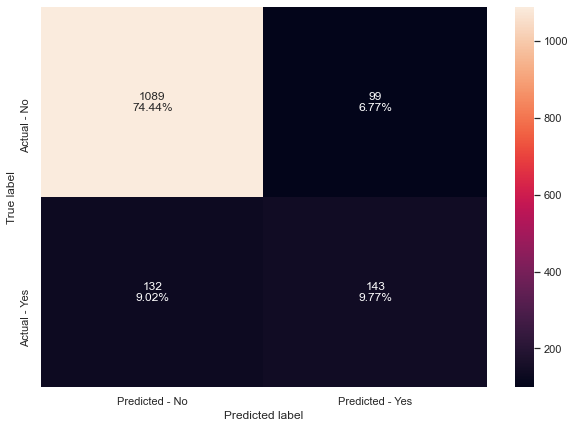

In [92]:
#Fitting the model
td = DecisionTreeClassifier(random_state=1, criterion='gini',class_weight={0:0.18,1:0.82})
td.fit(X_train,y_train)

#Calculating different metrics
get_metrics_score(td)

#Creating confusion matrix
make_confusion_matrix(td,y_test)

Model performance:

    - Recall score: very good on training. A poor 52% on test.
    - Fit: our model predicts to 100% accuracy on the training data, so it's overfitting with a 84% on the test.
    - Improvement? We can try with another criterion and other hyper-parameter tuning.

##### Confusion Matrix observations:

- **True Positives:**
    - Reality: A customer purchased the package offer.
    - Model predicted: The potential customer will purchase the package offer.
    - Outcome: ~10%.

- **True Negatives:**
    - Reality: A customer did not purchase the package offer.
    - Model predicted: A customer will not purchase the package offer.
    - Outcome: The business is unaffected. 74%

- **False Positives:**
    - Reality: A customer did not purchase the package offer.
    - Model predicted: A customer will purchase the package offer.
    - Outcome: Missed opportunity. ~7%

- **False Negatives:** Reduced as much as possible.
    - Reality: A customer purchased the package offer.
    - Model predicted: A customer will not purchase the package offer.
    - Outcome: The marketing team is wasting their resources on the people/customers who did not accept the previous package offer. 138 or ~9%.
 

### Regularization: Pre-Pruned & Hypertuned Decision Trees

##### GreatLearning notes:
* Hyperparameter tuning is also tricky in the sense that there is no direct way to calculate how a change in the
  hyperparameter value will reduce the loss of your model, so we usually resort to experimentation. i.e we'll use Grid search
* Grid search is a tuning technique that attempts to compute the optimum values of hyperparameters. 
* It is an exhaustive search that is performed on a the specific parameter values of a model.
* The parameters of the estimator/model used to apply these methods are optimized by cross-validated grid-search over a parameter grid.

* If the frequency of class A is 10% and the frequency of class B is 90%, then class B will become the dominant class and the decision tree will become biased toward the dominant classes.

* In this case, we can pass a dictionary {0:0.15,1:0.85} to the model to specify the weight of each class and the decision tree will give more weightage to class 1.

* class_weight is a hyperparameter for the decision tree classifier.

#### TDT1

We will try with class weighting as this is necessary for setting up the class imbalance for successful training and tuning the classifier parameters to get a better fit and recall score.

In [93]:
#https://medium.com/juniper-team/optimizing-scikit-learn-models-using-ray-backend-41b794b3bed1
import joblib
from ray.util.joblib import register_ray
register_ray()

In [94]:
with joblib.parallel_backend("ray"):
    # Choose the type of classifier. 
    tdt1 = DecisionTreeClassifier(class_weight={0:0.18,1:0.82},random_state=1)

    # Grid of parameters to choose from
    parameters = {'max_depth': np.arange(2,30), 
                  'min_samples_leaf': [1, 2, 5, 7, 10],
                  'max_leaf_nodes' : [2, 3, 5, 10,15],
                  'min_impurity_decrease': [0.0001,0.001,0.01,0.1]
                 }

    # Type of scoring used to compare parameter combinations
    scorer = metrics.make_scorer(metrics.recall_score)

    # Run the grid search
    grid_obj = GridSearchCV(tdt1, parameters, scoring=scorer, n_jobs = -1)
    grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
tdt1 = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
tdt1.fit(X_train, y_train)

2021-07-25 02:13:50,258	WARNING pool.py:341 -- The 'context' argument is not supported using ray. Please refer to the documentation for how to control ray initialization.


DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=2,
                       max_leaf_nodes=2, min_impurity_decrease=0.1,
                       random_state=1)

In [95]:
tuned_dtree_acc = get_accuracy_score(tdt1)
tuned_dtree_recall = get_recall_score(tdt1)
tuned_dtree_precision = get_precision_score(tdt1)

Accuracy on training set :  0.18781130969821272
Accuracy on test set :  0.18796992481203006
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.18781130969821272
Precision on test set :  0.18796992481203006


Model performance:

- Recall: Is 100% on both training and test which means it is very sensitive to false negatives.
- Fit: The accuracy is terrible on both training and test.
- Improvement? We could increase our maximum leaf nodes to get a more robust model.

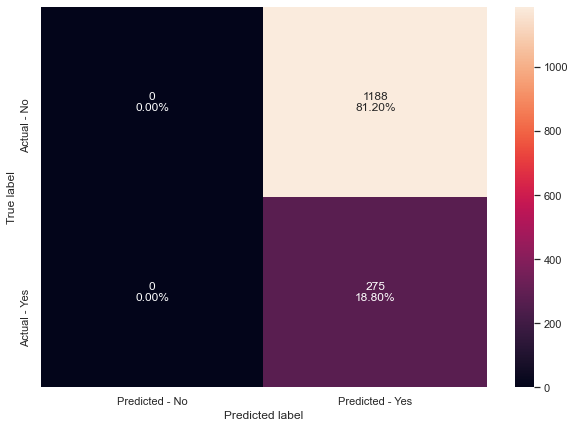

In [96]:
# show confusion matrix
make_confusion_matrix(tdt1,y_test)

Here we see:

    * A customer who does purchase a package predicted to purchase a package. 81%
    * A customer who does NOT purchase a package is predicted NOT purchase a package. 0
    * A customer who does NOT purchase a package is predicted purchase a package. 0
    * A customer who does purchase a package is predicted to NOT purchase a package. ~19%

Targeting the existing package purchasers has led to 0 False Negatives but mostly False Positives which is not good either.

#### TDT2

Adjusting the criterion and impurity decrease.

In [97]:
with joblib.parallel_backend("ray"):
    # Choose the type of classifier wtih class_weight
    tdt2 = DecisionTreeClassifier(
        random_state=1, class_weight={0:0.18,1:0.82}) # weight heavy on 1s

    # Grid of parameters to choose from
    parameters = {
        'max_depth': np.arange(1, 13),
        'criterion': ["gini", "entropy"],
        'splitter': ['best', 'random'],
        'min_impurity_decrease': [0.01, 0.1, 1.0, 10.0],
        'max_features': ['log2', 'sqrt'],
        'max_leaf_nodes': [2 , 4 , 6, 8], # alternative to do min. samples in  a leaf
        'min_samples_leaf':[1 , 3 , 5 , 7 , 10]
    }

    # Type of scoring used to compare parameter combinations
    scorer = metrics.make_scorer(metrics.recall_score)

    # Run the grid search
    grid_obj = GridSearchCV(estimator=tdt2, param_grid=parameters, scoring=scorer, cv=5, n_jobs=-1)
    grid_obj = grid_obj.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
tdt2 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
tdt2.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=1,
                       max_features='log2', max_leaf_nodes=2,
                       min_impurity_decrease=0.01, random_state=1,
                       splitter='random')

Accuracy on training set :  0.18781130969821272
Accuracy on test set :  0.18796992481203006
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.18781130969821272
Precision on test set :  0.18796992481203006
F1-Score on training set :  0.31623088307844105
F1-Score on test set :  0.3164556962025316


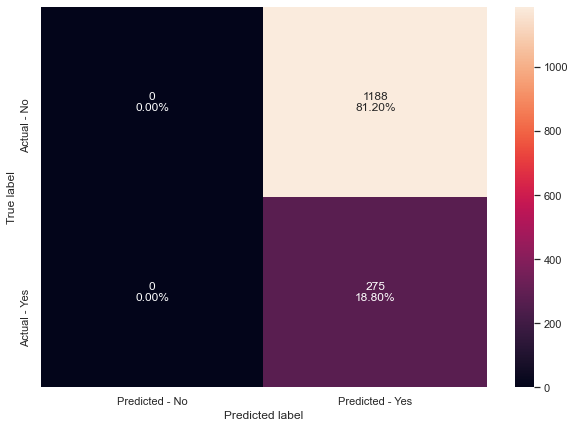

In [98]:
# get scores
get_metrics_score(tdt2)

# print matrix
make_confusion_matrix(tdt2,y_test)

Model performance:

- Recall: is perfect on training and test.
- Fit: is horrible on both train and test.
- Improvement? We can continue to tune the parameters to find the best fit.

In the matrix:

Similar to last model.

#### TDTMD

We will try to fit a good model by finding the optimal max depth.

##### GreatLearning notes:
* In general, the deeper you allow your tree to grow, the more complex your model will become because you will have more splits and it captures more information about the data and this is one of the root causes of overfitting
* Let's try another method listed below.

In [99]:
# create a for-loop that builds a tree with a max_depth for every unit in the range
count=0

for i in np.arange(1, 25):
    tdtmd = DecisionTreeClassifier(max_depth=i, criterion='gini', random_state=1, class_weight={0:0.18,1:0.82})
    
    # display the Tree object
    display(tdtmd.fit(X_train, y_train))
    
    # display the recall score for that Tree oject
    display(get_recall_score(tdtmd))
    
    count=count+1

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=1,
                       random_state=1)

Recall on training set :  0.5210608424336973
Recall on test set :  0.5672727272727273


[0.5210608424336973, 0.5672727272727273]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=2,
                       random_state=1)

Recall on training set :  0.5819032761310452
Recall on test set :  0.5927272727272728


[0.5819032761310452, 0.5927272727272728]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=3,
                       random_state=1)

Recall on training set :  0.6677067082683308
Recall on test set :  0.6545454545454545


[0.6677067082683308, 0.6545454545454545]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=4,
                       random_state=1)

Recall on training set :  0.6879875195007801
Recall on test set :  0.6181818181818182


[0.6879875195007801, 0.6181818181818182]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=5,
                       random_state=1)

Recall on training set :  0.6645865834633385
Recall on test set :  0.5890909090909091


[0.6645865834633385, 0.5890909090909091]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=6,
                       random_state=1)

Recall on training set :  0.734789391575663
Recall on test set :  0.6618181818181819


[0.734789391575663, 0.6618181818181819]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=7,
                       random_state=1)

Recall on training set :  0.7535101404056163
Recall on test set :  0.6036363636363636


[0.7535101404056163, 0.6036363636363636]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=8,
                       random_state=1)

Recall on training set :  0.7987519500780031
Recall on test set :  0.5927272727272728


[0.7987519500780031, 0.5927272727272728]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=9,
                       random_state=1)

Recall on training set :  0.8408736349453978
Recall on test set :  0.610909090909091


[0.8408736349453978, 0.610909090909091]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=10,
                       random_state=1)

Recall on training set :  0.8939157566302652
Recall on test set :  0.5563636363636364


[0.8939157566302652, 0.5563636363636364]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=11,
                       random_state=1)

Recall on training set :  0.890795631825273
Recall on test set :  0.5163636363636364


[0.890795631825273, 0.5163636363636364]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=12,
                       random_state=1)

Recall on training set :  0.9329173166926678
Recall on test set :  0.5272727272727272


[0.9329173166926678, 0.5272727272727272]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=13,
                       random_state=1)

Recall on training set :  0.9438377535101404
Recall on test set :  0.5163636363636364


[0.9438377535101404, 0.5163636363636364]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=14,
                       random_state=1)

Recall on training set :  0.968798751950078
Recall on test set :  0.5345454545454545


[0.968798751950078, 0.5345454545454545]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=15,
                       random_state=1)

Recall on training set :  0.9656786271450858
Recall on test set :  0.5236363636363637


[0.9656786271450858, 0.5236363636363637]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=16,
                       random_state=1)

Recall on training set :  0.9875195007800313
Recall on test set :  0.5272727272727272


[0.9875195007800313, 0.5272727272727272]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=17,
                       random_state=1)

Recall on training set :  0.9953198127925117
Recall on test set :  0.52


[0.9953198127925117, 0.52]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=18,
                       random_state=1)

Recall on training set :  0.9906396255850234
Recall on test set :  0.5163636363636364


[0.9906396255850234, 0.5163636363636364]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=19,
                       random_state=1)

Recall on training set :  1.0
Recall on test set :  0.5345454545454545


[1.0, 0.5345454545454545]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=20,
                       random_state=1)

Recall on training set :  0.9984399375975039
Recall on test set :  0.5127272727272727


[0.9984399375975039, 0.5127272727272727]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=21,
                       random_state=1)

Recall on training set :  1.0
Recall on test set :  0.5272727272727272


[1.0, 0.5272727272727272]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=22,
                       random_state=1)

Recall on training set :  1.0
Recall on test set :  0.52


[1.0, 0.52]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=23,
                       random_state=1)

Recall on training set :  1.0
Recall on test set :  0.5272727272727272


[1.0, 0.5272727272727272]

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=24,
                       random_state=1)

Recall on training set :  1.0
Recall on test set :  0.5163636363636364


[1.0, 0.5163636363636364]

The Decision Tree recall is highest at a max depth of 6 levels. Let's use that to score our Tree. It's also not overfitting at that level.

In [100]:
# build a decision tree classifier object with max_depth
tdtmd = DecisionTreeClassifier(max_depth=6,class_weight={0:0.18,1:0.82}, criterion='gini', random_state=1)
tdtmd.fit(X_train, y_train)

DecisionTreeClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=6,
                       random_state=1)

In [101]:
# Recall on train and test
get_metrics_score(tdtmd)

Accuracy on training set :  0.774099033108702
Accuracy on test set :  0.734107997265892
Recall on training set :  0.734789391575663
Recall on test set :  0.6618181818181819
Precision on training set :  0.439365671641791
Precision on test set :  0.3807531380753138
F1-Score on training set :  0.5499124343257443
F1-Score on test set :  0.4833997343957504


[0.774099033108702,
 0.734107997265892,
 0.734789391575663,
 0.6618181818181819,
 0.439365671641791,
 0.3807531380753138,
 0.5499124343257443,
 0.4833997343957504]

Model performance:

- Recall: is decent on training and decent on test.
- Fit: is not close between the sets and may be a decent fit.
- Improvement? We can continue to tune the other parameters to find the best fit.

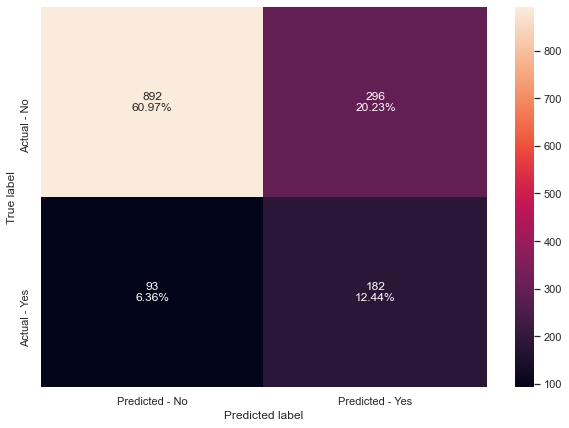

In [102]:
# confusion matrix
make_confusion_matrix(tdtmd, y_test)

In the matrix:

    * A customer who does purchase a package predicted to purchase a package. 12% - True Positive
    * A customer who does NOT purchase a package is predicted NOT purchase a package. 61%
    * A customer who does NOT purchase a package is predicted purchase a package. 20% 
    * A customer who does purchase a package is predicted to NOT purchase a package. 6% - False Negatives

 Our model is good at reducing False Negatives.

### Post-Pruned Decision Tree : Cost Complexity Pruning

For when there is not enough time to do GridSearch (hypertuning). To punish complexity but sometimes at the cost of accuracy. We will have to sensitive to comparing the models in this way.


The `DecisionTreeClassifier` provides parameters such as
``min_samples_leaf`` and ``max_depth`` to prevent a tree from overfiting. Cost
complexity pruning provides another option to control the size of a tree. In
`DecisionTreeClassifier`, this pruning technique is parameterized by the
cost complexity parameter, ``ccp_alpha``. Greater values of ``ccp_alpha``
increase the number of nodes pruned. Here we only show the effect of
``ccp_alpha`` on regularizing the trees and how to choose a ``ccp_alpha``
based on validation scores.

##### GreatLearning Notes:
Total impurity of leaves vs effective alphas of pruned tree

Minimal cost complexity pruning recursively finds the node with the "weakest
link". The weakest link is characterized by an effective alpha, where the
nodes with the smallest effective alpha are pruned first. To get an idea of
what values of ``ccp_alpha`` could be appropriate, scikit-learn provides
`DecisionTreeClassifier.cost_complexity_pruning_path` that returns the
effective alphas and the corresponding total leaf impurities at each step of
the pruning process. As alpha increases, more of the tree is pruned, which
increases the total impurity of its leaves.

#### CCDT

In [103]:
# create a decision tree object with weighted classes
ccdt = DecisionTreeClassifier(random_state=1, class_weight={0: 0.15, 1: 0.85})

# run scikit learn pruning method
path = ccdt.cost_complexity_pruning_path(X_train, y_train)

# set alphas and impurities 
ccp_alphas, impurities = path.ccp_alphas, path.impurities

In [104]:
# create a dataframe of the alphas and impurities
pd.DataFrame(path)

,ccp_alphas,impurities
0,0.00,-0.00
1,0.00,-0.00
2,0.00,-0.00
3,0.00,-0.00
4,0.00,-0.00
...,...,...
362,0.01,0.42
363,0.01,0.42
364,0.01,0.43
365,0.01,0.45


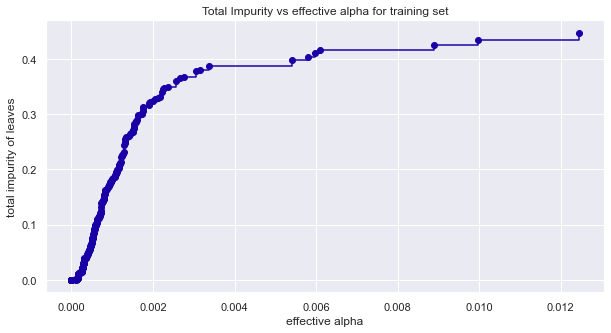

In [105]:
# plot the alphas and impurities path
fig, ax = plt.subplots(figsize=(10, 5))
ax.plot(ccp_alphas[:-1], impurities[:-1], marker='o', drawstyle="steps-post")
ax.set_xlabel("effective alpha")
ax.set_ylabel("total impurity of leaves")
ax.set_title("Total Impurity vs effective alpha for training set")
plt.show()

Next, we train a decision tree using the effective alphas. The last value
in ``ccp_alphas`` is the alpha value that prunes the whole tree,
leaving the tree, ``clfs[-1]``, with one node.

In [106]:
# make an empty list
ccdts = []

# for all the alphas create a decision tree object and fit the model
for ccp_alpha in ccp_alphas:
    ccdt = DecisionTreeClassifier(random_state=1,
                                 ccp_alpha=ccp_alpha,
                                 class_weight={
                                     0: 0.15,
                                     1: 0.85
                                 })
    ccdt.fit(X_train, y_train)
    ccdts.append(ccdt)

# print the node count and alphas
print("Number of nodes in the last tree is: {} with ccp_alpha: {}".format(
    ccdts[-1].tree_.node_count, ccp_alphas[-1]))

Number of nodes in the last tree is: 1 with ccp_alpha: 0.0438007529808066



For the remainder, we remove the last element in
``clfs`` and ``ccp_alphas``, because it is the trivial tree with only one
node. Here we show that the number of nodes and tree depth decreases as alpha
increases.

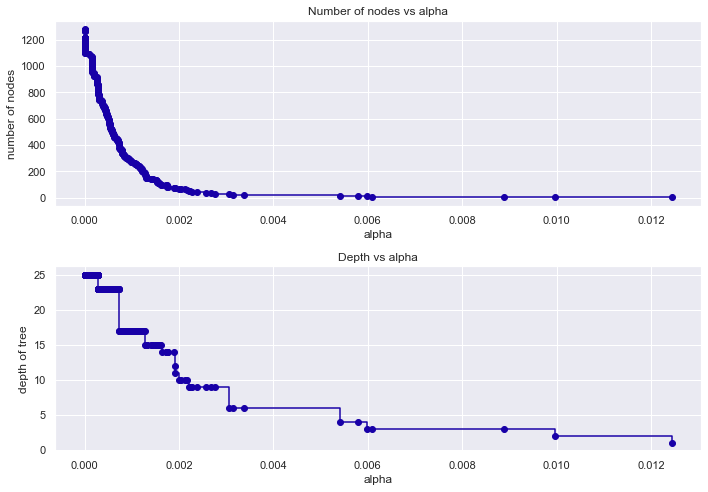

In [107]:
# set the list of clfs and alphas
ccdts = ccdts[:-1]
ccp_alphas = ccp_alphas[:-1]

# make a list of nodes
node_counts = [ccdt.tree_.node_count for ccdt in ccdts]
depth = [ccdt.tree_.max_depth for ccdt in ccdts]

# plot the depth of nodes and alphas
fig, ax = plt.subplots(2, 1, figsize=(10, 7))
ax[0].plot(ccp_alphas, node_counts, marker='o', drawstyle="steps-post")
ax[0].set_xlabel("alpha")
ax[0].set_ylabel("number of nodes")
ax[0].set_title("Number of nodes vs alpha")
ax[1].plot(ccp_alphas, depth, marker='o', drawstyle="steps-post")
ax[1].set_xlabel("alpha")
ax[1].set_ylabel("depth of tree")
ax[1].set_title("Depth vs alpha")
fig.tight_layout()

##### Recall vs alpha

##### Training set

In [108]:
# create a list of predicted values and recall scores
recall_train = []
for ccdt in ccdts:
    pred_train3 = ccdt.predict(X_train)
    values_train = metrics.recall_score(y_train, pred_train3)
    recall_train.append(values_train)

##### Test set

In [109]:
# create a list of predicted values and recall scores
recall_test = []
for ccdt in ccdts:
    pred_test3 = ccdt.predict(X_test)
    values_test = metrics.recall_score(y_test, pred_test3)
    recall_test.append(values_test)

display(y_test)

,ProdTaken
3767,0
2709,0
4823,1
3638,0
3559,0
...,...
1569,0
783,0
2253,0
3724,0


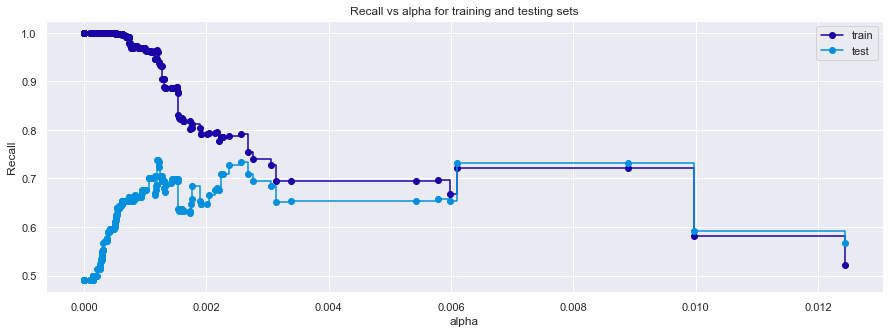

In [110]:
# plot 
fig, ax = plt.subplots(figsize=(15, 5)) # set-up plot
ax.set_xlabel("alpha")
ax.set_ylabel("Recall")
ax.set_title("Recall vs alpha for training and testing sets")

# plot the alphas vs recall
ax.plot(ccp_alphas, recall_train, marker='o', label="train",
        drawstyle="steps-post",)
ax.plot(ccp_alphas, recall_test, marker='o', label="test",
        drawstyle="steps-post")
ax.legend()
plt.show()

**Maximum value of Recall is at ~0.01 alpha, but if we choose decision tree will only have a root node and we would lose the business rules, instead we can choose alpha between 0 and 0.0025 retaining information and getting higher recall.**

##### CCDT: Best Model

In [111]:
# creating the model where we get highest train and test recall
index_best_model = np.argmax(recall_test)
ccdt = ccdts[index_best_model]
print(ccdt)

DecisionTreeClassifier(ccp_alpha=0.0011947165304032215,
                       class_weight={0: 0.15, 1: 0.85}, random_state=1)


In [112]:
# fit model to training data
ccdt.fit(X_train, y_train)

DecisionTreeClassifier(ccp_alpha=0.0011947165304032215,
                       class_weight={0: 0.15, 1: 0.85}, random_state=1)

Note alpha of 0.001.

##### Train and Test Performance

In [113]:
# get recall function
get_metrics_score(ccdt)

Accuracy on training set :  0.7626721359507764
Accuracy on test set :  0.6766917293233082
Recall on training set :  0.9641185647425897
Recall on test set :  0.7381818181818182
Precision on training set :  0.4398576512455516
Precision on test set :  0.3360927152317881
F1-Score on training set :  0.6041055718475073
F1-Score on test set :  0.46188850967007966


[0.7626721359507764,
 0.6766917293233082,
 0.9641185647425897,
 0.7381818181818182,
 0.4398576512455516,
 0.3360927152317881,
 0.6041055718475073,
 0.46188850967007966]

Model performance:

- Recall: is excelent on training and really decent on test.
- Fit: is not close between the sets and may be overfitting.
- Improvement? It could be tweaked with some hyperparameters to find an even better Recall on the test.

##### Confusion Matrix

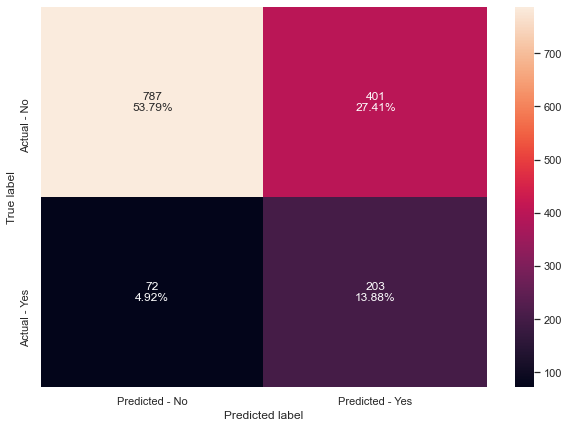

In [114]:
make_confusion_matrix(ccdt, y_test)

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 14%

True Negatives (TN): we correctly predicted that they don't purchase a package. 53%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 27% 
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 5%
Falsely predict negative 
Type II error

**This model has a low score of predicting False Negatives which is a good sign.**

#### Predictions from model

In [115]:
# Let's Look at Model Performance by doing predicitions

# training set
y_predb = ccdt.predict(X_train) 
pred_train = list(map(round, y_predb))

# test set 
y_pred1 = ccdt.predict(X_test) 
pred_test = list(map(round, y_pred1))

In [117]:
# print metrics for test test
print(metrics.classification_report(y_test, y_pred1))

              precision    recall  f1-score   support

           0       0.92      0.66      0.77      1188
           1       0.34      0.74      0.46       275

    accuracy                           0.68      1463
   macro avg       0.63      0.70      0.62      1463
weighted avg       0.81      0.68      0.71      1463



In [119]:
# print score results

print('Accuracy on train data:',accuracy_score(y_train, y_predb) )
print('Accuracy on test data:',accuracy_score(y_test, y_pred1))

print('Recall on train data:',recall_score(y_train, y_predb) )
print('Recall on test data:',recall_score(y_test, y_pred1))

print('Precision on train data:',precision_score(y_train, y_predb) )
print('Precision on test data:',precision_score(y_test, y_pred1))

print('f1 score on train data:',f1_score(y_train, y_predb))
print('f1 score on test data:',f1_score(y_test, y_pred1))

Accuracy on train data: 0.7626721359507764
Accuracy on test data: 0.6766917293233082
Recall on train data: 0.9641185647425897
Recall on test data: 0.7381818181818182
Precision on train data: 0.4398576512455516
Precision on test data: 0.3360927152317881
f1 score on train data: 0.6041055718475073
f1 score on test data: 0.46188850967007966


- Our predictive model has a decent accuracy with ~10% spread which means it's not terribly overfitting.
- Our recall is good on training and decent on test at ~74%
- Our preicision and f1 scores are neglible.

### Comparing Decision Tree Models

Based on our target score: Recall.

In [120]:
comparison_frame_dt = pd.DataFrame({
    'Model': [
        'td',
        'tdt1',
        'tdt2',
        'tdtmd',
        'ccdt'
    ],
    'Train_Recall': [1, 1.0, 1.0, 0.73, 0.96],
    'Test_Recall': [0.52, 1.0, 1.0, 0.66, 0.73]
})
comparison_frame_dt

,Model,Train_Recall,Test_Recall
0,td,1.00,0.52
1,tdt1,1.00,1.00
2,tdt2,1.00,1.00
3,tdtmd,0.73,0.66
4,ccdt,0.96,0.73


**Conclusion:**

Decision tree models with hyper-tuning have given the best recall score on test data but they are overfitting and very inaccurate. They also have few leafs and are not useful for business purposes.

Let's examine the customer profile in the dependent variables to find our market segementation after looking at the best fitting model: the weighted decision tree.

### Visualizing the best Decision Tree Model

In [121]:
column_names = list(X_train.columns)
feature_names = column_names
print(feature_names)

['Age', 'NumberOfPersonVisiting', 'PreferredPropertyStar', 'NumberOfTrips', 'Passport', 'OwnCar', 'NumberOfChildrenVisiting', 'MonthlyIncome', 'TypeofContact_Self Enquiry', 'TypeofContact_missing value', 'Occupation_Large Business', 'Occupation_Salaried', 'Occupation_Small Business', 'Gender_Male', 'MaritalStatus_Married', 'MaritalStatus_Single', 'MaritalStatus_Unmarried', 'CityTier_2', 'CityTier_3']


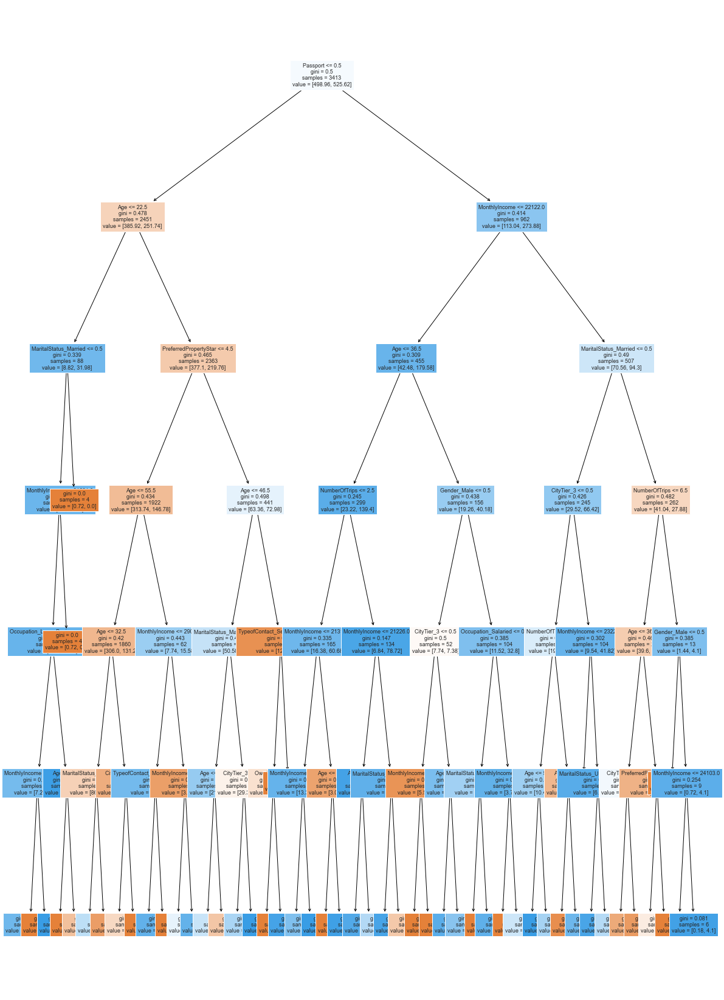

In [122]:
plt.figure(figsize=(20, 30))
out = tree.plot_tree(tdtmd, feature_names=feature_names,
                     filled=True, fontsize=9, node_ids=False, class_names=None,)
# below code will add arrows to the decision tree split if they are missing
for o in out:
    arrow = o.arrow_patch
    if arrow is not None:
        arrow.set_edgecolor('black')
        arrow.set_linewidth(1)
plt.show()

In [123]:
# importance of features in the tree building ( The importance of a feature is computed as the
# (normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print(pd.DataFrame(tdtmd.feature_importances_, columns=[
      "Imp"], index=X_train.columns).sort_values(by='Imp', ascending=False))

                             Imp
Passport                    0.27
Age                         0.24
MonthlyIncome               0.15
CityTier_3                  0.09
PreferredPropertyStar       0.07
MaritalStatus_Married       0.06
NumberOfTrips               0.03
MaritalStatus_Single        0.03
TypeofContact_Self Enquiry  0.02
Gender_Male                 0.01
OwnCar                      0.01
MaritalStatus_Unmarried     0.01
Occupation_Salaried         0.00
Occupation_Large Business   0.00
NumberOfChildrenVisiting    0.00
NumberOfPersonVisiting      0.00
Occupation_Small Business   0.00
CityTier_2                  0.00
TypeofContact_missing value 0.00


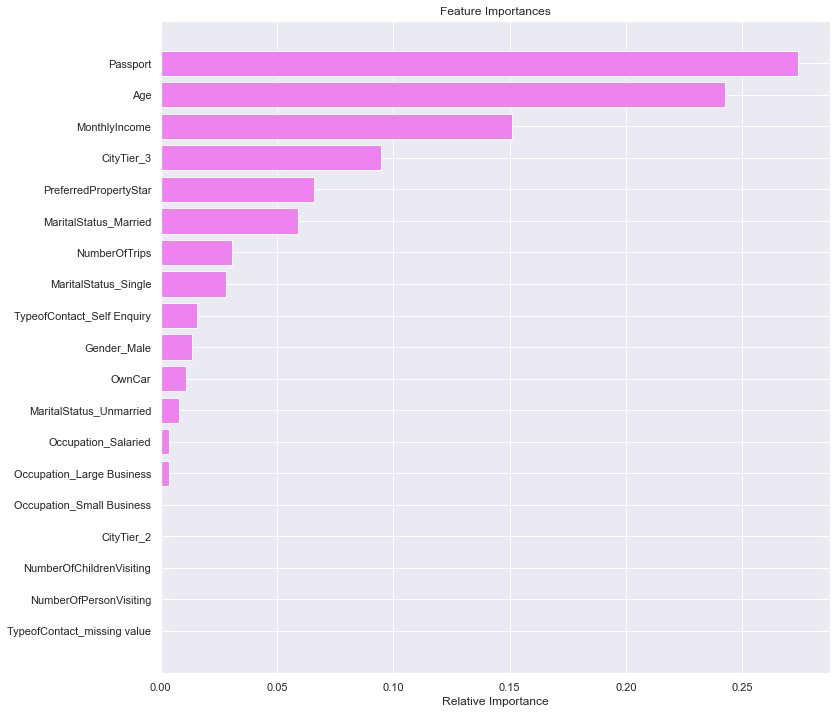

In [124]:
# visualize importance feautures
importances = tdtmd.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title('Feature Importances')
plt.barh(range(len(indices)),
         importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

According to the decision tree model:

    -`Passport` is the most important variable for predicting the `ProdTaken`
    - 'Age' and `MonthlyIncome` follow

## Random Forest Classifiers

### RFC

Accuracy on training set :  1.0
Accuracy on test set :  0.8755980861244019
Recall on training set :  1.0
Recall on test set :  0.38545454545454544
Precision on training set :  1.0
Precision on test set :  0.8907563025210085
F1-Score on training set :  1.0
F1-Score on test set :  0.5380710659898478


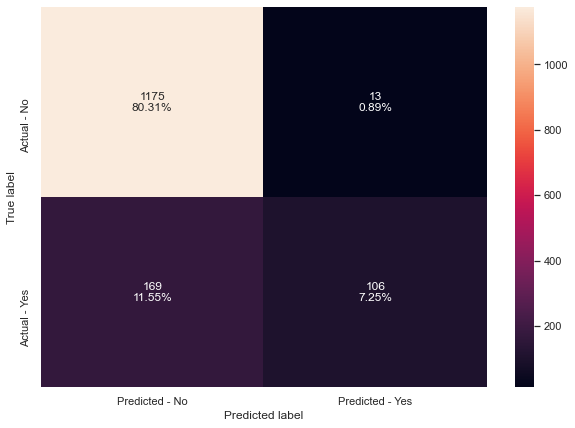

In [126]:
#Fitting the model
rfc = RandomForestClassifier(random_state=1,class_weight={0:0.18,1:0.82})
rfc.fit(X_train,y_train)

#Calculating different metrics
get_metrics_score(rfc)

#Creating confusion matrix
make_confusion_matrix(rfc,y_test)

**Model performance:**

- Recall: is perfect on the training and not very good on test.
- Fit: is perfect on training and quite high at 87% for the test. There is some overfitting.
- Improvement? It could be tweaked with some hyperparameters to find an even better Recall on the test.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 7%

True Negatives (TN): we correctly predicted that they don't purchase a package. 80%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") ~1%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") ~12%
Falsely predict negative 
Type II error

**This model has a higher score of predicting False Negatives than the Decision Trees which is a bad sign.**

### Hypertuned Random Forest Models

#### TRFC1

Starting by setting some simple parameters on features, leafs and samples.

In [127]:
# Choose the type of classifier. 
trfc1 = RandomForestClassifier(random_state=1,class_weight={0:0.18,1:0.82})

# Grid of parameters to choose from
## add from article
parameters = {"n_estimators": [150,200,250],
    "min_samples_leaf": np.arange(5, 10),
    "max_features": np.arange(0.2, 0.7, 0.1),
    "max_samples": np.arange(0.3, 0.7, 0.1),
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = TuneGridSearchCV(estimator=trfc1, param_grid=parameters, scoring=acc_scorer, cv=5, refit=True, n_jobs=-1) #use Rays processor
grid_obj = grid_obj.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
trfc1 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
trfc1.fit(X_train, y_train)

2021-07-25 02:32:05,260	ERROR syncer.py:72 -- Log sync requires rsync to be installed.
2021-07-25 02:37:22,502	WARNING worker.py:1123 -- A worker died or was killed while executing a task by an unexpected system error. To troubleshoot the problem, check the logs for the dead worker. Task ID: ffffffffffffffff5f5533ac0bf2420e1c1e25da01000000 Worker ID: b3a3f435c247fe530c7af85029ac25fd10b1e4cf6c8f744a28edd4af Node ID: 25f7f870f98c09f7ac2604e72ceff974e77c8eab261e4880a57068b2 Worker IP address: 10.5.0.2 Worker port: 51652 Worker PID: 16720
2021-07-25 02:37:22,504	WARNING worker.py:1123 -- A worker died or was killed while executing a task by an unexpected system error. To troubleshoot the problem, check the logs for the dead worker. Task ID: ffffffffffffffff5f460f523553035f0cc9eabb01000000 Worker ID: bb94eef8bfe32c4a00b9b3627d4bf1ac16926d6fa3f75d3e52a58d5a Node ID: 25f7f870f98c09f7ac2604e72ceff974e77c8eab261e4880a57068b2 Worker IP address: 10.5.0.2 Worker port: 51642 Worker PID: 16304


RandomForestClassifier(class_weight={0: 0.18, 1: 0.82}, max_features=0.2,
                       max_samples=0.6000000000000001, min_samples_leaf=9,
                       n_estimators=150, random_state=1)

In [128]:
#Using above defined function to get accuracy, recall and precision on train and test set
rf_estimator_tuned_score=get_metrics_score(trfc1)

Accuracy on training set :  0.8438324055083504
Accuracy on test set :  0.7901572112098428
Recall on training set :  0.7207488299531981
Recall on test set :  0.5963636363636363
Precision on training set :  0.5661764705882353
Precision on test set :  0.45555555555555555
F1-Score on training set :  0.6341798215511325
F1-Score on test set :  0.516535433070866


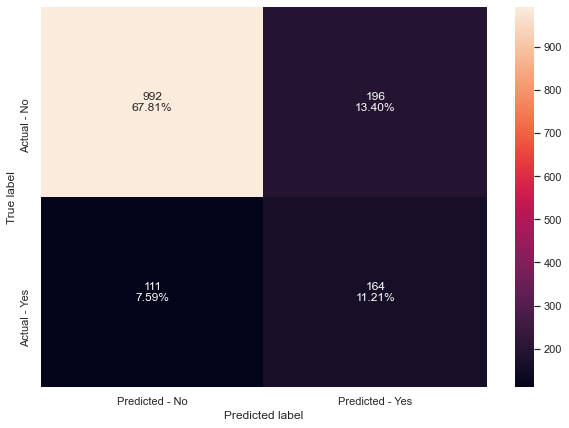

In [129]:
# print confusion matrix
make_confusion_matrix(trfc1,y_test)

**Model performance:**

- Recall: is decent on train and test.
- Fit: is very good on both sets. May be a little overfit.
- Improvement? It could be tweaked with some hyperparameters to find an even better Recall on the test.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 11%

True Negatives (TN): we correctly predicted that they don't purchase a package. 68%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 13%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 8%
Falsely predict negative 
Type II error

**This model has a lower score of predicting False Negatives than the previous model which is a good sign.**

#### TRFC2

Next we will try try to remove barriers on samples and include log and auto into the features. Not using TunedGrid for this one.

In [130]:
# Choose the type of classifier. 
trfc2 = RandomForestClassifier(random_state=1, class_weight={0:0.18,1:0.82})

# Grid of parameters to choose from
parameters = {  
        "n_estimators": [110,251,501],
        "min_samples_leaf": np.arange(1,6),
        "max_features": [0.7,0.9,'log2','auto'],
        "max_samples": [0.7,0.9,None],
}


# Run the grid search
grid_obj = GridSearchCV(trfc2, parameters, scoring='recall',cv=3, n_jobs = -1)
grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
trfc2 = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
trfc2.fit(X_train, y_train)

RandomForestClassifier(class_weight={0: 0.18, 1: 0.82}, max_features='log2',
                       min_samples_leaf=5, n_estimators=501, random_state=1)

In [131]:
# print model score functions and confusion function
tuned_rf_acc = get_accuracy_score(trfc2)
tuned_rf_recall = get_recall_score(trfc2)
tuned_rf_precision = get_precision_score(trfc2)

Accuracy on training set :  0.9358335774978025
Accuracy on test set :  0.8311688311688312
Recall on training set :  0.9282371294851794
Recall on test set :  0.5636363636363636
Precision on training set :  0.7747395833333334
Precision on test set :  0.549645390070922


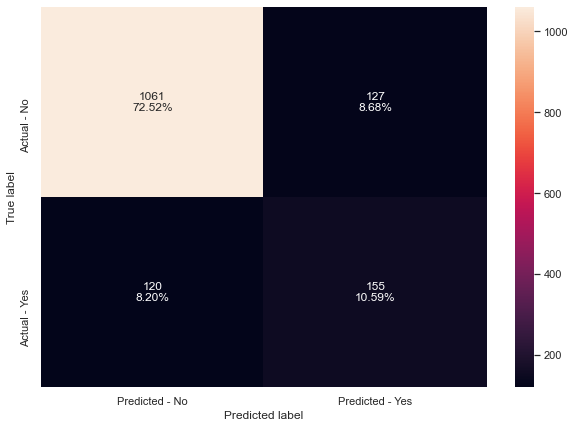

In [132]:
# print matrix on test data
make_confusion_matrix(trfc2,y_test)

**Model performance:**

- Recall: is very good on test but mediocre on test.
- Fit: is not overfitting too badly.
- Improvement? It could have a different max_features to change the recall score.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 11%

True Negatives (TN): we correctly predicted that they don't purchase a package. 72%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") ~9%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 8%
Falsely predict negative 
Type II error

**This model has a the same score of predicting False Negatives than the previous model which is a good sign.**

### TRFC3

This time we will introduce weighting and max_depth as well as min_impurity_decrease.

In [133]:
with joblib.parallel_backend("ray"):
    
    # Choose the type of classifier. 
    trfc3 = RandomForestClassifier(class_weight={0:0.18,1:0.82},random_state=1)


    parameters = { 'criterion': ['gini', 'entropy'], 
                  'max_depth': [2,4,6,8,10], 
                  'max_features': [0.1, 0.2, 0.3, 0.4, 0.5],               
                  'min_samples_split': [2,3,4,5,6,7],
                  'min_impurity_decrease': [0.0001,0.001,0.01,0.1]}

    # Type of scoring used to compare parameter combinations
    scorer = metrics.make_scorer(metrics.recall_score)

    # Run the grid search
    grid_obj = TuneGridSearchCV(trfc3, param_grid=parameters, scoring=scorer,cv=3,n_jobs=-1, early_stopping=True)
    grid_obj = grid_obj.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
trfc3 = grid_obj.best_estimator_

# Fit the best algorithm to the data. 
trfc3.fit(X_train, y_train.values.ravel())

RandomForestClassifier(class_weight={0: 0.18, 1: 0.82}, max_depth=2,
                       max_features=0.1, min_impurity_decrease=0.1,
                       n_estimators=1, random_state=1)

Accuracy on training set :  0.18781130969821272
Accuracy on test set :  0.18796992481203006
Recall on training set :  1.0
Recall on test set :  1.0
Precision on training set :  0.18781130969821272
Precision on test set :  0.18796992481203006
F1-Score on training set :  0.31623088307844105
F1-Score on test set :  0.3164556962025316


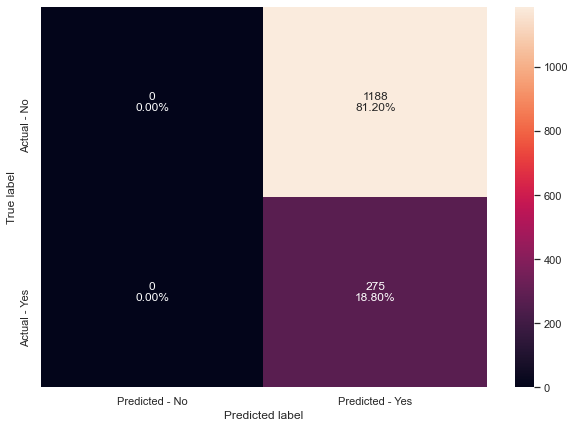

In [134]:
#Calculating different metrics
get_metrics_score(trfc3)

#Creating confusion matrix
make_confusion_matrix(trfc3,y_test)

**Model performance:**

- Recall: is perfect on the training and test.
- Fit: is horrible on both sets but is not overfitting.
- Improvement? It could be tweaked with some hyperparameters to find an even better Recall on the test.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 18%.

True Negatives (TN): we correctly predicted that they don't purchase a package. 0%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 81%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 0%
Falsely predict negative 
Type II error

**This model has a lower score of predicting False Negatives than the previous model which is a good sign but it is tuned for predicting positives and is not accurate**

### Compare Random Forest Models

In [135]:
comparison_frame_rf = pd.DataFrame({
    'Model': [
        'RFC',
        'TRFC1',
        'TRFC2',
        'TRFC3',
    ],
    'Train_Recall': [1.0, 0.72, 0.92, 1.0],
    'Test_Recall': [0.34, 0.59, 0.56, 1.0]
})
comparison_frame_rf 

,Model,Train_Recall,Test_Recall
0,RFC,1.00,0.34
1,TRFC1,0.72,0.59
2,TRFC2,0.92,0.56
3,TRFC3,1.00,1.00


**Conclusion**

The Random Forest model TRFC3 has given the best recall score on test data but is not accurate.

# Ensemble Techniques
Bring together weak learners (models) to be a part in an overall model based on voting for this classification problem.

## Model building - Bagging

### BC

Bagging Classifier: Weighted Decision Tree

In [136]:
bc = BaggingClassifier(base_estimator=DecisionTreeClassifier(criterion='gini',class_weight={0:0.18,1:0.82},random_state=1),random_state=1, n_jobs=-1)
bc.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.18,
                                                                      1: 0.82},
                                                        random_state=1),
                  n_jobs=-1, random_state=1)

In [137]:
wt_bagging_acc = get_accuracy_score(bc)
wt_bagging_recall = get_recall_score(bc)
wt_bagging_precision = get_precision_score(bc)

Accuracy on training set :  0.9885731028420744
Accuracy on test set :  0.8667122351332878
Recall on training set :  0.9407176287051482
Recall on test set :  0.37454545454545457
Precision on training set :  0.9983443708609272
Precision on test set :  0.8174603174603174


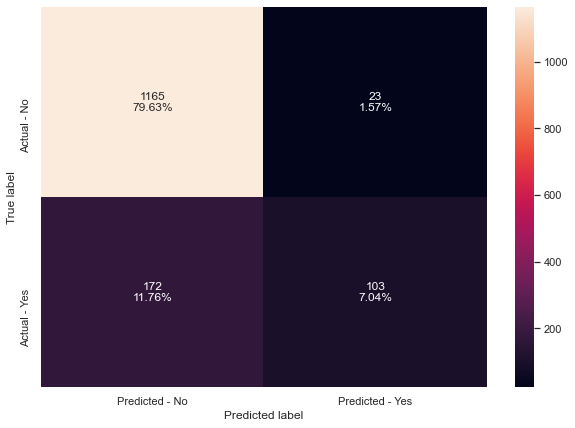

In [138]:
make_confusion_matrix(bc,y_test)

**Model performance:**

- Recall: is very good on train and poor on test.
- Fit: is very good on both sets. Is overfit a bit.
- Improvement? It could be tweaked with some hyperparameters to find an even better Recall on the test.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: to 7%

True Negatives (TN): we correctly predicted that they don't purchase a package. to 79%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 1.5%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") ~12%
Falsely predict negative 
Type II error

**This model has the higher score of predicting False Negatives than the previous models which is a bad sign.**


### Hypertuned Bagging Classifiers

#### BCMD

Bagging Classifier: DT: Max_Depth tuning

In [139]:
for i in range(1,6):
    bagging_dt = BaggingClassifier(
        base_estimator=DecisionTreeClassifier(max_depth=i,criterion='gini',random_state=1,class_weight={0:0.18,1:0.82}),
        random_state=1,
    )
    
    #fit the model
    bagging_dt.fit(X_train,y_train)
    
    #Calculating different metrics
    print("Model with ", i, "max_depth")
    get_recall_score(bagging_dt)

Model with  1 max_depth
Recall on training set :  0.5210608424336973
Recall on test set :  0.5672727272727273
Model with  2 max_depth
Recall on training set :  0.5819032761310452
Recall on test set :  0.5927272727272728
Model with  3 max_depth
Recall on training set :  0.6021840873634945
Recall on test set :  0.6036363636363636
Model with  4 max_depth
Recall on training set :  0.6895475819032761
Recall on test set :  0.6727272727272727
Model with  5 max_depth
Recall on training set :  0.7051482059282371
Recall on test set :  0.5963636363636363


The best max_depth for Recall is found at: 4. Let's make a model from this.

In [140]:
# declare classifier object
bcmd = BaggingClassifier(
    base_estimator=DecisionTreeClassifier(
        max_depth=4, # what we adjust
        criterion='gini',
        random_state=1,
        class_weight={0:0.18,1:0.82}),
    random_state=1)

# use .fit() on training set
bcmd.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.18,
                                                                      1: 0.82},
                                                        max_depth=4,
                                                        random_state=1),
                  random_state=1)

Accuracy on training set :  0.7433343099912101
Accuracy on test set :  0.7060833902939166
Recall on training set :  0.6895475819032761
Recall on test set :  0.6727272727272727
Precision on training set :  0.39499553172475427
Precision on test set :  0.3523809523809524
F1-Score on training set :  0.5022727272727273
F1-Score on test set :  0.4625000000000001


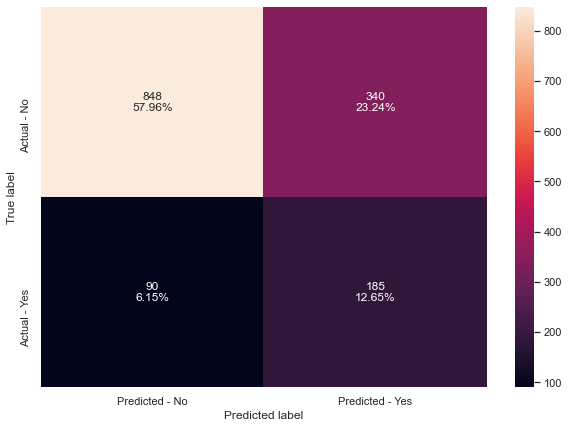

In [141]:
#Calculating different metrics
get_metrics_score(bcmd)

#Creating confusion matrix
make_confusion_matrix(bcmd,y_test)

**Model performance:**

- Recall: is okay at 0.67.
- Fit: is pretty good on both sets. Very little overfitting.
- Improvement? It could be tweaked with some hyperparameters to find an even better Recall on the test.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: to 13%

True Negatives (TN): we correctly predicted that they don't purchase a package. to 58%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 23%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 6%
Falsely predict negative 
Type II error

**This model has the lower score of predicting False Negatives than the previous model which is a good sign.**

#### BCHT

Hyperparamater searching with decision tree.

In [142]:
with joblib.parallel_backend("ray"):
    
    # grid search for bagging classifier
    param_grid = {'max_features': [0.7,0.8,0.9,1.0]}
    
    grid = TuneGridSearchCV(estimator=BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0:0.18,1:0.82},random_state=1),random_state=1, bootstrap=True), 
                        param_grid=param_grid, 
                        early_stopping=True,
                        scoring = 'recall', 
                        cv = 3, 
                        n_jobs = -1)
    grid.fit(X_train, y_train.values.ravel())

2021-07-25 02:47:04,892	WARNING worker.py:1123 -- A worker died or was killed while executing a task by an unexpected system error. To troubleshoot the problem, check the logs for the dead worker. Task ID: ffffffffffffffffa0ff28f16d38efe6a1a2487601000000 Worker ID: b0a220d780524de04e4e8697dbf04159a90d46db5ae1fb9a88eb11ab Node ID: 25f7f870f98c09f7ac2604e72ceff974e77c8eab261e4880a57068b2 Worker IP address: 10.5.0.2 Worker port: 59949 Worker PID: 5116
2021-07-25 02:47:04,892	WARNING worker.py:1123 -- A worker died or was killed while executing a task by an unexpected system error. To troubleshoot the problem, check the logs for the dead worker. Task ID: ffffffffffffffffbe530358745af4760d15796f01000000 Worker ID: 55df8fb7e87edc0efd8912f00fca4e7383f832776c20955465319e7b Node ID: 25f7f870f98c09f7ac2604e72ceff974e77c8eab261e4880a57068b2 Worker IP address: 10.5.0.2 Worker port: 59947 Worker PID: 15952


In [143]:
# getting the best estimator
bcht  = grid.best_estimator_
bcht.fit(X_train,y_train)

BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.18,
                                                                      1: 0.82},
                                                        random_state=1),
                  n_estimators=1, random_state=1)

Accuracy on training set :  0.9305596249633753
Accuracy on test set :  0.8065618591934381
Recall on training set :  0.8127925117004681
Recall on test set :  0.41818181818181815
Precision on training set :  0.8166144200626959
Precision on test set :  0.4831932773109244


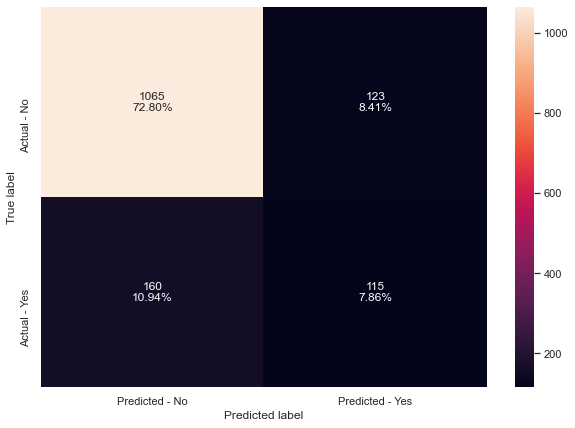

In [144]:
# print scores using functions
tuned_bagging_acc= get_accuracy_score(bcht)
tuned_bagging_recall = get_recall_score(bcht)
tuned_bagging_precision = get_precision_score(bcht)

# print confusion maxtrix on test set
make_confusion_matrix(bcht,y_test)

**Model performance:**

- Recall: is ok on train and bad on test.
- Fit: is very high on train and test and has some overfitting.
- Improvement? It needs to fit the data better.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: to ~8%

True Negatives (TN): we correctly predicted that they don't purchase a package. to 72%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 8%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") ~11%
Falsely predict negative 
Type II error

**This model is worse at removing False Negatives from the predictions than the previous model.**

#### TBC1

Tuning hyperparameters on max_samples.

In [145]:
# Choose the type of classifier. 
tbc1 = BaggingClassifier(random_state=1, n_jobs=-1)

# Grid of parameters to choose from
## add from article
parameters = {'max_samples': [0.7,0.8,0.9,1], 
              'max_features': [0.7,0.8,0.9,1.0],
              'n_estimators' : [10,20,30,40,50],
             }

# Type of scoring used to compare parameter combinations
acc_scorer = metrics.make_scorer(metrics.recall_score)

# Run the grid search
grid_obj = GridSearchCV(tbc1, parameters, scoring=acc_scorer,cv=5)
grid_obj = grid_obj.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
tbc1 = grid_obj.best_estimator_

# Fit the best algorithm to the data.
tbc1.fit(X_train, y_train)

BaggingClassifier(max_samples=0.8, n_estimators=50, n_jobs=-1, random_state=1)

In [146]:
#Using above defined function to get accuracy, recall and precision on train and test set
bagging_estimator_tuned_score=get_metrics_score(tbc1)
display(bagging_estimator_tuned_score)

Accuracy on training set :  0.9970700263697627
Accuracy on test set :  0.8749145591250854
Recall on training set :  0.984399375975039
Recall on test set :  0.46545454545454545
Precision on training set :  1.0
Precision on test set :  0.7804878048780488
F1-Score on training set :  0.9921383647798743
F1-Score on test set :  0.5831435079726651


[0.9970700263697627,
 0.8749145591250854,
 0.984399375975039,
 0.46545454545454545,
 1.0,
 0.7804878048780488,
 0.9921383647798743,
 0.5831435079726651]

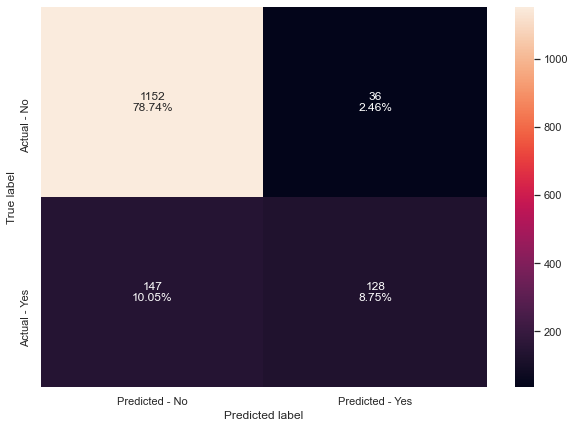

In [147]:
# print matrix on test set
make_confusion_matrix(tbc1,y_test)

**Model performance:**

- Recall: is very good on train and bad on test.
- Fit: is overfitting.
- Improvement? It could be tweaked to improve test recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: ~9%

True Negatives (TN): we correctly predicted that they don't purchase a package. 79%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") ~2%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") ~10%
Falsely predict negative 
Type II error

**This model has a lower score of predicting False Negatives than the previous model which is a good sign.**

### Comparing Bagging Classifiers

In [148]:
comparison_frame_bc = pd.DataFrame({
    'Model': [
        'bc',
        'bcmd',
        'bcht',
        'tbc1'
    ],
    'Train_Recall': [0.94, 0.68, 0.81, 0.98],
    'Test_Recall': [0.37, 0.67, 0.41, 0.46]
})
comparison_frame_bc

,Model,Train_Recall,Test_Recall
0,bc,0.94,0.37
1,bcmd,0.68,0.67
2,bcht,0.81,0.41
3,tbc1,0.98,0.46


**Conclusion:**
    
The model with the best score on the test Recall was bcmd the max_depth Bagging Classifier.

## Model building - Boosting

### AB

AdaBoost Classifier

Accuracy on training set :  0.8406094345150894
Accuracy on test set :  0.836637047163363
Recall on training set :  0.26365054602184085
Recall on test set :  0.2872727272727273
Precision on training set :  0.7012448132780082
Precision on test set :  0.6475409836065574
F1-Score on training set :  0.38321995464852604
F1-Score on test set :  0.39798488664987414


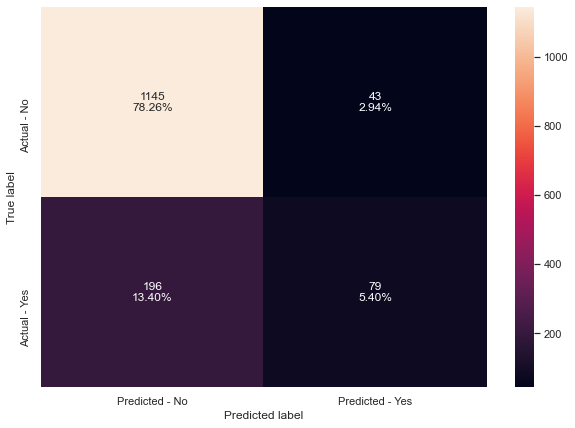

In [149]:
#Fitting the model
ab = AdaBoostClassifier(random_state=1)
ab.fit(X_train,y_train)

#Calculating different metrics
get_metrics_score(ab)

#Creating confusion matrix
make_confusion_matrix(ab,y_test)

**Model performance:**

- Recall: is very poor on train and on test.
- Fit: is fitting well.
- Improvement? It could be tweaked to improve test recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 5%

True Negatives (TN): we correctly predicted that they don't purchase a package. 78%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 3%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 13%
Falsely predict negative 
Type II error

**This model has a higher score of predicting False Negatives than the previous models which is not a good sign.**

### TAB

Hyptertuned AdaBoost: Creating an AdaBoost using Dtree classifier and max_depth's from 1 - 3.

In [150]:
with joblib.parallel_backend("ray"):

    # Choose the type of classifier. 
    tab = AdaBoostClassifier(random_state=1)

    # Grid of parameters to choose from
    parameters = {
        #Let's try different max_depth for base_estimator
        "base_estimator":[DecisionTreeClassifier(max_depth=1),
                          DecisionTreeClassifier(max_depth=2),
                          DecisionTreeClassifier(max_depth=3)],
        "n_estimators": np.arange(10,110,10),
        "learning_rate":np.arange(0.1,2,0.1)
    }

    # Type of scoring used to compare parameter  combinations
    scorer = metrics.make_scorer(metrics.recall_score)

    # Run the grid search
    grid_obj = GridSearchCV(tab, parameters, scoring=scorer,cv=3, n_jobs=-1)
    grid_obj = grid_obj.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
tab = grid_obj.best_estimator_

# Fit the best algorithm to the data.
tab.fit(X_train, y_train.values.ravel())

AdaBoostClassifier(base_estimator=DecisionTreeClassifier(max_depth=3),
                   learning_rate=1.7000000000000002, n_estimators=90,
                   random_state=1)

Accuracy on training set :  0.9443305010254908
Accuracy on test set :  0.8263841421736159
Recall on training set :  0.8174726989079563
Recall on test set :  0.4509090909090909
Precision on training set :  0.8777219430485762
Precision on test set :  0.5462555066079295
F1-Score on training set :  0.8465266558966075
F1-Score on test set :  0.4940239043824701


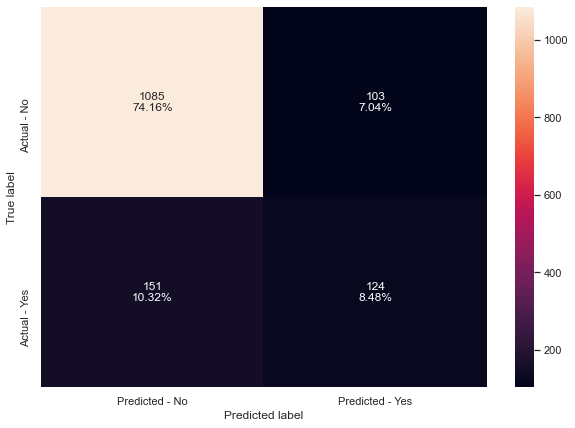

In [151]:
#Calculating different metrics
get_metrics_score(tab)

#Creating confusion matrix
make_confusion_matrix(tab,y_test)

**Model performance:**

- Recall: is good on train and poor on test set.
- Fit: is slightly overfitting.
- Improvement? It could be tweaked to improve test recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 8%

True Negatives (TN): we correctly predicted that they don't purchase a package. 74%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 7%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 10%
Falsely predict negative 
Type II error

**This model has a similar score of predicting False Negatives than the previous models which is a good sign.**

### GB

Gradient Boosting Classifier

Accuracy on training set :  0.8743041312628186
Accuracy on test set :  0.8591934381408065
Recall on training set :  0.4040561622464899
Recall on test set :  0.36727272727272725
Precision on training set :  0.8464052287581699
Precision on test set :  0.7593984962406015
F1-Score on training set :  0.5469904963041183
F1-Score on test set :  0.49509803921568635


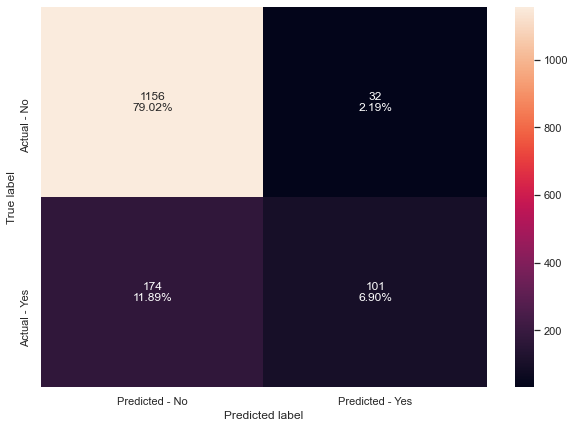

In [152]:
#Fitting the model
gb = GradientBoostingClassifier(random_state=1)
gb.fit(X_train,y_train)

#Calculating different metrics
get_metrics_score(gb)

#Creating confusion matrix
make_confusion_matrix(gb,y_test)

**Model performance:**

- Recall: is very bad on train and test.
- Fit: is not overfit.
- Improvement? It could be tweaked to improve test recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: to 7%.

True Negatives (TN): we correctly predicted that they don't purchase a package. to 70%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 2%.
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 12%.
Falsely predict negative 
Type II error

**This model has a higher score of predicting False Negatives than the previous models which is a bad sign.**

### TGB

Hyptertuned Gradient Boosting Classifiers: A test of learning_rate and max_features.

Accuracy on training set :  1.0
Accuracy on test set :  0.8947368421052632
Recall on training set :  1.0
Recall on test set :  0.5527272727272727
Precision on training set :  1.0
Precision on test set :  0.8306010928961749
F1-Score on training set :  1.0
F1-Score on test set :  0.6637554585152838


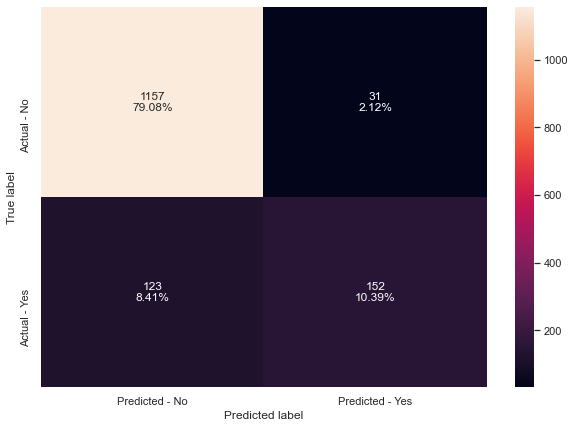

In [153]:
with joblib.parallel_backend("ray"):

    #Fitting the model
    tgb = GradientBoostingClassifier(random_state=1, warm_start=True) # speed up with warm-start


    parameters = {  
                    'max_depth': list(np.arange(3,10)),
                    'max_features': np.arange(0.6,1.0,0.1),
                    'learning_rate': [0.0001,0.001,0.01,0.1]
    }

    # Type of scoring used to compare parameter combinations
    acc_scorer = metrics.make_scorer(metrics.recall_score)

    # Run the grid search
    grid_obj = TuneGridSearchCV(estimator=tgb, param_grid=parameters, scoring=acc_scorer, cv=3, refit=True, n_jobs=-1) #use Rays processor
    grid_obj = grid_obj.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
tgb = grid_obj.best_estimator_

# Fit the best algorithm to the data.
tgb.fit(X_train, y_train.values.ravel())

#Calculating different metrics
get_metrics_score(tgb)

#Creating confusion matrix
make_confusion_matrix(tgb,y_test)

**Model performance:**

- Recall: is good on train but poor on test.
- Fit: is mostly overfitting.
- Improvement? Is not a good model for Recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 10%

True Negatives (TN): we correctly predicted that they don't purchase a package.  to 79%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 2%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 8%
Falsely predict negative 
Type II error

**This model has lower FN than the last model which is a good sign.**

#### ADGB

Setting the base classifier as AdaBoost.

In [154]:
with joblib.parallel_backend("ray"):
    # Choose the type of classifier. 
    adgb = GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),random_state=1)

    # Grid of parameters to choose from
    parameters = {
        "n_estimators": [100,150,200,250],
        "subsample":[0.8,0.9,1],
        "max_features":[0.7,0.8,0.9,1.0]
    }

    # Type of scoring used to compare parameter combinations
    scorer = metrics.make_scorer(metrics.recall_score)

    # Run the grid search
    grid_obj = GridSearchCV(adgb, parameters, scoring=scorer,cv=5)
    grid_obj = grid_obj.fit(X_train, y_train)

# Set the clf to the best combination of parameters
adgb = grid_obj.best_estimator_

# Fit the best algorithm to the data.
adgb.fit(X_train, y_train)

GradientBoostingClassifier(init=AdaBoostClassifier(random_state=1),
                           max_features=1.0, n_estimators=250, random_state=1,
                           subsample=0.8)

Accuracy on training set :  0.9068268385584529
Accuracy on test set :  0.8564593301435407
Recall on training set :  0.5491419656786272
Recall on test set :  0.41454545454545455
Precision on training set :  0.9238845144356955
Precision on test set :  0.6993865030674846
F1-Score on training set :  0.6888454011741684
F1-Score on test set :  0.5205479452054794


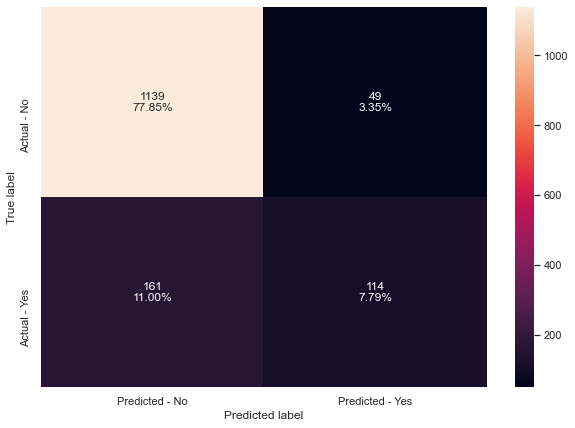

In [155]:
#Calculating different metrics
get_metrics_score(adgb)

#Creating confusion matrix
make_confusion_matrix(adgb,y_test)

**Model performance:**

- Recall: is very poor on test set at near-below 50% sensitivity.
- Fit: has decreased overfitting from previous model.
- Improvement? Is not a good model for Recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: ~8%.

True Negatives (TN): we correctly predicted that they don't purchase a package. to 78%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 3%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 11%
Falsely predict negative 
Type II error

**This model has a higher score of predicting False Negatives than the previous model which is a bad sign.**

### XG

XGBoost Classifier

Please find below the options that can be tried to reduce the run time for XGBoost tuning:

- Pick individual features at a time and try adjusting them. Get the optimal value beyond which no improvement is seen, note that optimal value, and move on to the next feature.
-Only use parameters that are necessary. Do not use all the parameters just because they are there.
-Do not use more than 2-3 options in each list of hyperparameters given to the tuning function.
-Try a small dataset randomly chosen from the original dataset, tune hyperparameters on them, and then use that set of hyperparameters over the entire dataset.

In [156]:
#!/usr/bin/env python
import psutil
# gives a single float value
psutil.cpu_percent()
# gives an object with many fields
psutil.virtual_memory()
# you can convert that object to a dictionary 
dict(psutil.virtual_memory()._asdict())

{'total': 17060884480,
 'available': 9558859776,
 'percent': 44.0,
 'used': 7502024704,
 'free': 9558859776}

In [158]:
# delete dataframes no longer in use
# https://stackoverflow.com/questions/32247643/how-to-delete-multiple-pandas-python-dataframes-from-memory-to-save-ram
#!pip install gc
#import gc 

#https://stackoverflow.com/questions/41113663/pandas-get-a-list-of-all-data-frames-loaded-into-memory
%whos DataFrame

sheets=[]    
for var in dir():
    if isinstance(locals()[var], pd.core.frame.DataFrame)  and var[0]!='_':
        sheets.append(var)
display(sheets)

del categoricals
del cats
del city
del corr
del ind_vars
del ind_vars_num
del num
del numerical_features
del nums

%whos DataFrame

#gc.collect()

Variable              Type         Data/Info
--------------------------------------------
X                     DataFrame           Age    TypeofConta<...>n[4876 rows x 13 columns]
X_test                DataFrame          Age  NumberOfPerson<...>n[1463 rows x 19 columns]
X_train               DataFrame          Age  NumberOfPerson<...>n[3413 rows x 19 columns]
Y                     DataFrame          ProdTaken\n0       <...>\n[4876 rows x 1 columns]
comparison_frame_bc   DataFrame      Model  Train_Recall  Te<...>        0.98         0.46
comparison_frame_dt   DataFrame       Model  Train_Recall  T<...>        0.96         0.73
comparison_frame_rf   DataFrame       Model  Train_Recall  T<...>        1.00         1.00
df                    DataFrame          ProdTaken   Age    <...>n[4876 rows x 14 columns]
num                   DataFrame          ProdTaken   Age  Ci<...>n[4878 rows x 13 columns]
numerical_features    DataFrame          ProdTaken   Age  Ci<...>n[4878 rows x 13 columns]


['X',
 'X_test',
 'X_train',
 'Y',
 'comparison_frame_bc',
 'comparison_frame_dt',
 'comparison_frame_rf',
 'df',
 'num',
 'numerical_features',
 'nums',
 'y_test',
 'y_train']

NameError: name 'categoricals' is not defined

Accuracy on training set :  0.9947260474655728
Accuracy on test set :  0.8803827751196173
Recall on training set :  0.9719188767550702
Recall on test set :  0.5163636363636364
Precision on training set :  1.0
Precision on test set :  0.7717391304347826
F1-Score on training set :  0.985759493670886
F1-Score on test set :  0.6187363834422658


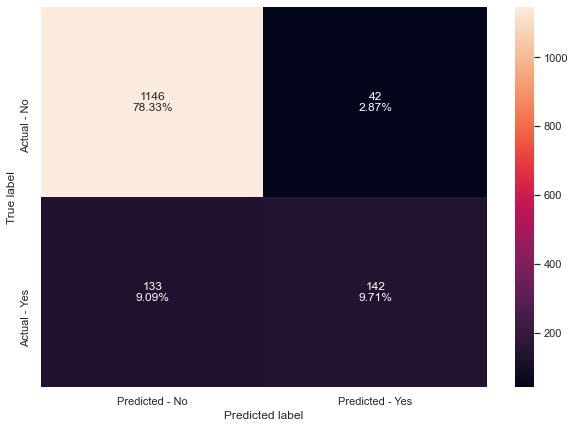

In [159]:
#Fitting the model
xg = XGBClassifier(random_state=1, eval_metric='logloss')
xg.fit(X_train,y_train)

#Calculating different metrics
get_metrics_score(xg)

#Creating confusion matrix
make_confusion_matrix(xg,y_test)

**Model performance:**

- Recall: is very good on train and above 50% sensitivity on test.
- Fit: has increased overfitting from previous model.
- Improvement? This could use less accuracy to reduce overfitting.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: ~10%

True Negatives (TN): we correctly predicted that they don't purchase a package. 78% 

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 3%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 9%
Falsely predict negative 
Type II error

**This model has a lower score of predicting False Negatives than the previous model which is a good sign.**

### HTXGB

Hypertuned XG Boost

In [160]:
with joblib.parallel_backend("ray"):
    # A parameter grid for XGBoost
    params = {
        "min_child_weight": [1, 5, 10],
        "gamma": [0.5, 1, 1.5, 2, 5],
        "subsample": [0.6, 0.8, 1.0],
        "colsample_bytree": [0.6, 0.8, 1.0],
        "max_depth": [3, 4, 5],
    }


    htxgb = XGBClassifier(
        random_state=1,
        learning_rate=0.02,
        n_estimators=50,
        objective="binary:logistic",
        nthread=4,
        eval_metric='logloss',
        use_label_encoder=False
    )

    # Type of scoring used to compare parameter combinations
    scorer = metrics.make_scorer(metrics.recall_score)

    # search for best model
    digit_search = TuneGridSearchCV(
        htxgb,
        param_grid=params,
        early_stopping=True,
        scoring=scorer,
        cv=3,
        n_jobs=-1
    )

    # fit the xgboost model
    digit_search.fit(X_train, y_train.values.ravel())

# Set the clf to the best combination of parameters
htxgb = digit_search.best_estimator_

# print search results
print(digit_search.best_params_)
print(digit_search.cv_results_)

{'min_child_weight': 1, 'gamma': 0.5, 'subsample': 1.0, 'colsample_bytree': 1.0, 'max_depth': 5}
{'params': [{'min_child_weight': 1, 'gamma': 0.5, 'subsample': 0.6, 'colsample_bytree': 0.6, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 0.5, 'subsample': 0.6, 'colsample_bytree': 0.8, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 0.5, 'subsample': 0.6, 'colsample_bytree': 1.0, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 1, 'subsample': 0.6, 'colsample_bytree': 0.6, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 1, 'subsample': 0.6, 'colsample_bytree': 0.8, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 1, 'subsample': 0.6, 'colsample_bytree': 1.0, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 1.5, 'subsample': 0.6, 'colsample_bytree': 0.6, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 1.5, 'subsample': 0.6, 'colsample_bytree': 0.8, 'max_depth': 3}, {'min_child_weight': 1, 'gamma': 1.5, 'subsample': 0.6, 'colsample_bytree': 1.0, 'max_depth': 3}, {'min_child_wei

Accuracy on training set :  0.8707881629065338
Accuracy on test set :  0.8530416951469583
Recall on training set :  0.3790951638065523
Recall on test set :  0.31272727272727274
Precision on training set :  0.8496503496503497
Precision on test set :  0.7678571428571429
F1-Score on training set :  0.5242718446601942
F1-Score on test set :  0.4444444444444444


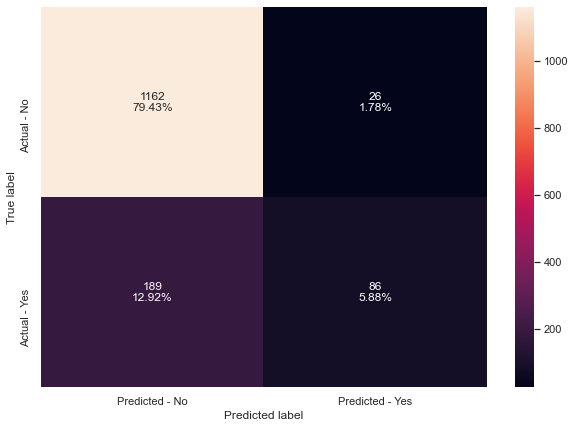

In [161]:
#Calculating different metrics
get_metrics_score(htxgb)

#Creating confusion matrix
make_confusion_matrix(htxgb,y_test.values.ravel())

**Model performance:**

- Recall: is very bad at ~35% on both sets.
- Fit: has little overfitting.
- Improvement? This could use more tuning for recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 6%

True Negatives (TN): we correctly predicted that they don't purchase a package. 79%

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") ~2%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error")  ~13%
Falsely predict negative 
Type II error

**This model has a higher score of predicting False Negatives than the previous model which is a bad sign.**

### Comparing Boosting Classifiers

In [162]:
comparison_frame_bo = pd.DataFrame({
    'Model': [ 
        'ab',
        'tab',
        'gb',
        'tgb',
        'adgb',
        'xg',
        'htxgb'
    ],
    'Train_Recall': [0.26, 0.81, 0.40, 1.0, 0.55, 0.97, 0.37],
    'Test_Recall': [0.28, 0.45, 0.36, 0.55, 0.41, 0.51, 0.31 ]
})
comparison_frame_bo

,Model,Train_Recall,Test_Recall
0,ab,0.26,0.28
1,tab,0.81,0.45
2,gb,0.40,0.36
3,tgb,1.00,0.55
4,adgb,0.55,0.41
5,xg,0.97,0.51
6,htxgb,0.37,0.31


**Conclusion:**
    
The model with the best score on the test Recall was tuned Gradient Boost.

## Stacking Classifiers

Stacking Classifier, it is shown that they have used two models (Random Forest & LinearSVC) as estimators and final estimator as Logistic Regression. But you are not limited to use only two models, for example, you may choose Random Forest, Gradient Boost, and Decision Tree (3 models) as estimators and the final estimator may be XGBoost for your Stacking Classifier. 

### SC1

Final estimator is xg-boost classifier.

In [165]:
estimators = [('Random Forest',trfc2), ('Gradient Boosting',gb), ('Decision Tree',tdt1)]

final_estimator = xg

sc1= StackingClassifier(estimators=estimators,final_estimator=final_estimator)

sc1.fit(X_train,y_train)

StackingClassifier(estimators=[('Random Forest',
                                RandomForestClassifier(class_weight={0: 0.18,
                                                                     1: 0.82},
                                                       max_features='log2',
                                                       min_samples_leaf=5,
                                                       n_estimators=501,
                                                       random_state=1)),
                               ('Gradient Boosting',
                                GradientBoostingClassifier(random_state=1)),
                               ('Decision Tree',
                                DecisionTreeClassifier(class_weight={0: 0.18,
                                                                     1: 0.82},
                                                       max_depth=2,
                                                       max_leaf_nodes=2,
                    

Accuracy on training set :  0.9126867858189276
Accuracy on test set :  0.8400546821599453
Recall on training set :  0.719188767550702
Recall on test set :  0.4509090909090909
Precision on training set :  0.7962003454231433
Precision on test set :  0.5990338164251208
F1-Score on training set :  0.7557377049180328
F1-Score on test set :  0.5145228215767635


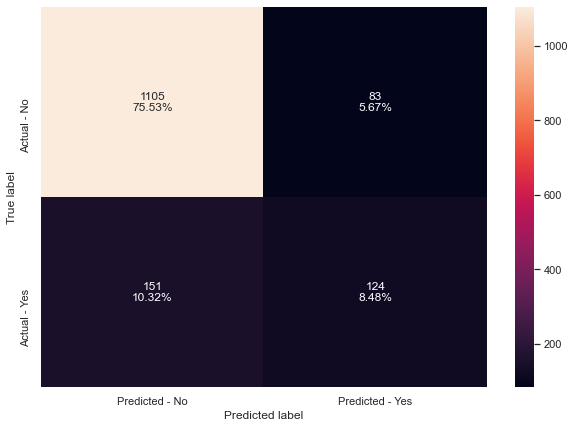

In [166]:
#Calculating different metrics
get_metrics_score(sc1)

#Creating confusion matrix
make_confusion_matrix(sc1,y_test)

**Model performance:**

- Recall: is decent on train and poor on test.
- Fit: is overfitting for the most part.
- Improvement? This could use more tuning for recall.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: ~9%.

True Negatives (TN): we correctly predicted that they don't purchase a package. 76%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 6%.
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 10%.
Falsely predict negative 
Type II error

**This model has a low score of predicting False Negatives when compared to the previous models which is a good sign.**

### SC2

Final estimator is hypertuned random forest.

In [167]:
estimators = [('Bagging Classifier',bcmd), ('Decision Tree',ccdt)]


# Training stacking classifier
sc2 = StackingClassifier(estimators = estimators, final_estimator = trfc1)

sc2.fit(X_train, y_train)

sc2.fit(X_train,y_train)

StackingClassifier(estimators=[('Bagging Classifier',
                                BaggingClassifier(base_estimator=DecisionTreeClassifier(class_weight={0: 0.18,
                                                                                                      1: 0.82},
                                                                                        max_depth=4,
                                                                                        random_state=1),
                                                  random_state=1)),
                               ('Decision Tree',
                                DecisionTreeClassifier(ccp_alpha=0.0011947165304032215,
                                                       class_weight={0: 0.15,
                                                                     1: 0.85},
                                                       random_state=1))],
                   final_estimator=RandomForestClassifier(class_weight={0: 0.18,


In [168]:
# Predicting on training set
y_pred = sc2.predict(X_train)

# Checking model performance
print('Recall score')
recall_score(y_train,y_pred)

Recall score


0.7550702028081123

Accuracy on training set :  0.7984178142396718
Accuracy on test set :  0.7334244702665755
Recall on training set :  0.7550702028081123
Recall on test set :  0.6145454545454545
Precision on training set :  0.4768472906403941
Precision on test set :  0.3730684326710817
F1-Score on training set :  0.5845410628019324
F1-Score on test set :  0.46428571428571425


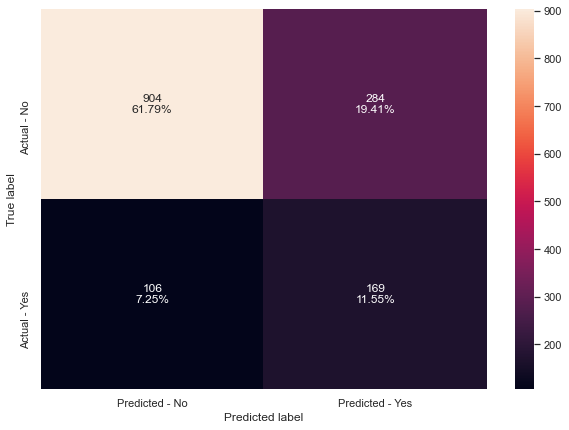

In [169]:
#Calculating different metrics
get_metrics_score(sc2)

#Creating confusion matrix
make_confusion_matrix(sc2,y_test)

**Model performance:**

- Recall: is ok on train and good on test.
- Fit: is overfitting only a little.
- Improvement? This could use more tuning for recall on test.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 12%.

True Negatives (TN): we correctly predicted that they don't purchase a package. 61%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 19%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 7%.
Falsely predict negative 
Type II error

**This model has a very low score of predicting False Negatives when compared to the previous models which is a good sign.**

### SC3: decision tree

Final estimator is post-pruned decision tree classifier.

In [170]:
estimators = [('AdaBoost Classifier',ab), ('Gradient Boosting Classifier',tgb)]

final_estimator = ccdt

sc3= StackingClassifier(estimators=estimators,final_estimator=final_estimator)

sc3.fit(X_train,y_train)

StackingClassifier(estimators=[('AdaBoost Classifier',
                                AdaBoostClassifier(random_state=1)),
                               ('Gradient Boosting Classifier',
                                GradientBoostingClassifier(max_depth=9,
                                                           max_features=0.8999999999999999,
                                                           random_state=1,
                                                           warm_start=True))],
                   final_estimator=DecisionTreeClassifier(ccp_alpha=0.0011947165304032215,
                                                          class_weight={0: 0.15,
                                                                        1: 0.85},
                                                          random_state=1))

Accuracy on training set :  0.9194257251684734
Accuracy on test set :  0.7429938482570062
Recall on training set :  1.0
Recall on test set :  0.8254545454545454
Precision on training set :  0.6997816593886463
Precision on test set :  0.409009009009009
F1-Score on training set :  0.8233782915863841
F1-Score on test set :  0.5469879518072288


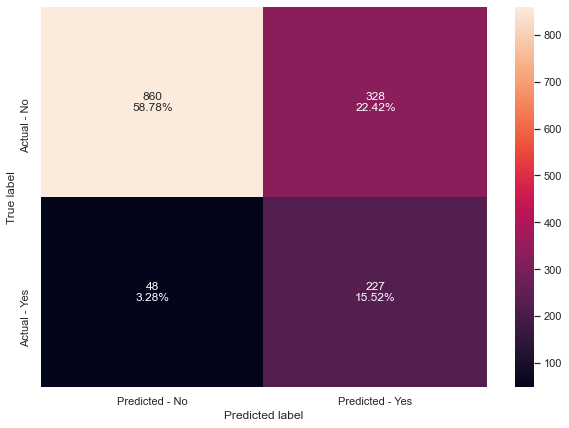

In [171]:
#Calculating different metrics
get_metrics_score(sc3)

#Creating confusion matrix
make_confusion_matrix(sc3,y_test)

**Model performance:**

- Recall: test is good around 80%.
- Fit: is highly overfit.
- Improvement? This could use more tuning for overfitting.

**The confusion matrix on predictions:**

True Positives (TP): we correctly predicted that they do purchase a package: 15%.

True Negatives (TN): we correctly predicted that they don't purchase a package. 56%.

False Positives (FP): we incorrectly predicted that they do purchase a package (a "Type I error") 22%
Falsely predict positive
Type I error

False Negatives (FN): we incorrectly predicted that they don't purchase a package (a "Type II error") 3%
Falsely predict negative 
Type II error

**This model has a very low score of predicting False Negatives when compared to the previous models which is a good sign.**

### Comparing Stacking Classifiers

In [178]:
comparison_frame_st = pd.DataFrame({
    'Model': ['sc1',
              'sc2',
              'sc3'
              ],
    'Train_Recall': [0.72, 0.75, 1.0],
    'Test_Recall': [0.45, 0.61, 0.82]
})
comparison_frame_st

,Model,Train_Recall,Test_Recall
0,sc1,0.72,0.45
1,sc2,0.75,0.61
2,sc3,1.00,0.82


**Conclusion:**

The model with the best Recall on test score is: sc3: Stacking Classifier with base-estimator of complexity-pruned decision tree.

# Comparing All Models

In [173]:
# extract the classifiers to get all the models into a list
%whos

Variable                        Type                          Data/Info
-----------------------------------------------------------------------
AdaBoostClassifier              ABCMeta                       <class 'sklearn.ensemble.<...>ting.AdaBoostClassifier'>
BaggingClassifier               ABCMeta                       <class 'sklearn.ensemble.<...>gging.BaggingClassifier'>
DecisionTreeClassifier          ABCMeta                       <class 'sklearn.tree._cla<...>.DecisionTreeClassifier'>
GradientBoostingClassifier      ABCMeta                       <class 'sklearn.ensemble.<...>dientBoostingClassifier'>
GridSearchCV                    ABCMeta                       <class 'sklearn.model_sel<...>on._search.GridSearchCV'>
ProfileReport                   type                          <class 'pandas_profiling.<...>le_report.ProfileReport'>
RandomForestClassifier          ABCMeta                       <class 'sklearn.ensemble.<...>.RandomForestClassifier'>
SimpleImputer                 

In [174]:
comparison_frame = pd.concat([comparison_frame_dt,
                              comparison_frame_rf,
                              comparison_frame_bc,
                              comparison_frame_bo,
                              comparison_frame_st])

display(comparison_frame.sort_values(by="Test_Recall",ascending=False))

,Model,Train_Recall,Test_Recall
2,tdt2,1.00,1.00
3,TRFC3,1.00,1.00
1,tdt1,1.00,1.00
2,sc3,1.00,0.82
4,ccdt,0.96,0.73
1,bcmd,0.68,0.67
3,tdtmd,0.73,0.66
1,sc2,0.75,0.61
1,TRFC1,0.72,0.59
2,TRFC2,0.92,0.56


In [175]:
# extract the model names from all the df's
models = comparison_frame.Model.to_list()
models

['td',
 'tdt1',
 'tdt2',
 'tdtmd',
 'ccdt',
 'RFC',
 'TRFC1',
 'TRFC2',
 'TRFC3',
 'bc',
 'bcmd',
 'bcht',
 'tbc1',
 'ab',
 'tab',
 'gb',
 'tgb',
 'adgb',
 'xg',
 'htxgb',
 'sc1',
 'sc2',
 'sc3']

In [176]:
# defining list of models
models = [td,
 tdt1,
 tdt2,
 tdtmd,
 ccdt,
 rfc,
 trfc1,
 trfc2,
 trfc3,
 bc,
 bcmd,
 bcht,
 tbc1,
 ab,
 tab,
 gb,
 tgb,
 adgb,
 xg,
 htxgb,
 sc1,
 sc2,
 sc3]

# defining empty lists to add train and test results
acc_train = []
acc_test = []
recall_train = []
recall_test = []
precision_train = []
precision_test = []
f1_train = [] 
f1_test = []

# looping through all the models to get the metrics score - Accuracy, Recall and Precision
for model in models:
    
    j = get_metrics_score(model,False)
    acc_train.append(j[0])
    acc_test.append(j[1])
    recall_train.append(j[2])
    recall_test.append(j[3])
    precision_train.append(j[4])
    precision_test.append(j[5])
    f1_train.append(j[6])
    f1_test.append(j[7])

In [177]:
# create pandas dataframe
comparison_frame = pd.DataFrame({'Model':['Decision Tree',
                                          'Tuned Decision Tree',
                                          'Tuned Decision Tree 2',
                                          'Max Depth Decision Tree',
                                          'Cost Complexity Pruned Decision Tree',
                                          'Random Forest',
                                          'Tuned Random Forest',
                                          'Tuned Random Forest 2',
                                          'Tuned Random Forest 3',
                                          'Bagging Classifier',
                                          'Max Depth Bagging Classifier',
                                          'Bagging Classifier Tuned',
                                          'Bagging Classifier Tuned 2',
                                          'AdaBoost Classifier',
                                          'Tuned AdaBoost Classifier',
                                          'Gradient Boosting Classifier', 
                                          'Tuned Gradient Boosting Classifier',
                                          'AdaBoost-Gradient Boosting Classifier',
                                          'XGBoost Classifier',  
                                          'Tuned XGBoost Classifier', 
                                          'Stacking Classifier',
                                          'Stacking Classifier 2',
                                          'Stacking Classifier 3'], 
                                'Train_Accuracy': acc_train,
                                'Test_Accuracy': acc_test,
                                'Train_Recall':recall_train,
                                'Test_Recall':recall_test,
                                'Train_Precision':precision_train,
                                'Test_Precision':precision_test,
                                'Train_F1-Score':f1_train, 
                                'Test_F1-Score':f1_test
                                }) 

#Sorting models in decreasing order of test recall
comparison_frame.sort_values(by='Test_Recall',ascending=False)

,Model,Train_Accuracy,Test_Accuracy,Train_Recall,Test_Recall,Train_Precision,Test_Precision,Train_F1-Score,Test_F1-Score
1,Tuned Decision Tree,0.19,0.19,1.00,1.00,0.19,0.19,0.32,0.32
2,Tuned Decision Tree 2,0.19,0.19,1.00,1.00,0.19,0.19,0.32,0.32
8,Tuned Random Forest 3,0.19,0.19,1.00,1.00,0.19,0.19,0.32,0.32
22,Stacking Classifier 3,0.92,0.74,1.00,0.83,0.70,0.41,0.82,0.55
4,Cost Complexity Pruned Decision Tree,0.76,0.68,0.96,0.74,0.44,0.34,0.60,0.46
10,Max Depth Bagging Classifier,0.74,0.71,0.69,0.67,0.39,0.35,0.50,0.46
3,Max Depth Decision Tree,0.77,0.73,0.73,0.66,0.44,0.38,0.55,0.48
21,Stacking Classifier 2,0.80,0.73,0.76,0.61,0.48,0.37,0.58,0.46
6,Tuned Random Forest,0.84,0.79,0.72,0.60,0.57,0.46,0.63,0.52
7,Tuned Random Forest 2,0.94,0.83,0.93,0.56,0.77,0.55,0.84,0.56


##### Observations

We ultimately want a balanced model that gives us a good accuracy, precision and a strong recall.

* The model with the best Recall on test is a four-way tie.

* The model with the lowest False Negatives is: Stacking Model 3 @ 3%.

* The most balanced model is Cost Complexity Pruned Decision Tree which has a below 50% threshold on f1-score.

While the aim is to predict the probability of a loan purchase we need to further examine who the target customer are.


# Feature Importance on Best Model

Our best model for this work is the best model from the cost-pruned decision tree. We can say what the model says are the most important features for in the coefficient for the models accuracy. But it doesn't tell us what the most important features are in predicting the outcome of a customer purchase. We are talking about the model and not about the reality of the historical data.

                             Imp
MonthlyIncome               0.19
Age                         0.19
Passport                    0.16
NumberOfTrips               0.07
CityTier_3                  0.07
PreferredPropertyStar       0.06
Gender_Male                 0.05
MaritalStatus_Married       0.04
OwnCar                      0.03
TypeofContact_Self Enquiry  0.03
MaritalStatus_Single        0.03
CityTier_2                  0.02
NumberOfPersonVisiting      0.02
NumberOfChildrenVisiting    0.02
Occupation_Small Business   0.01
Occupation_Salaried         0.01
MaritalStatus_Unmarried     0.01
Occupation_Large Business   0.01
TypeofContact_missing value 0.00


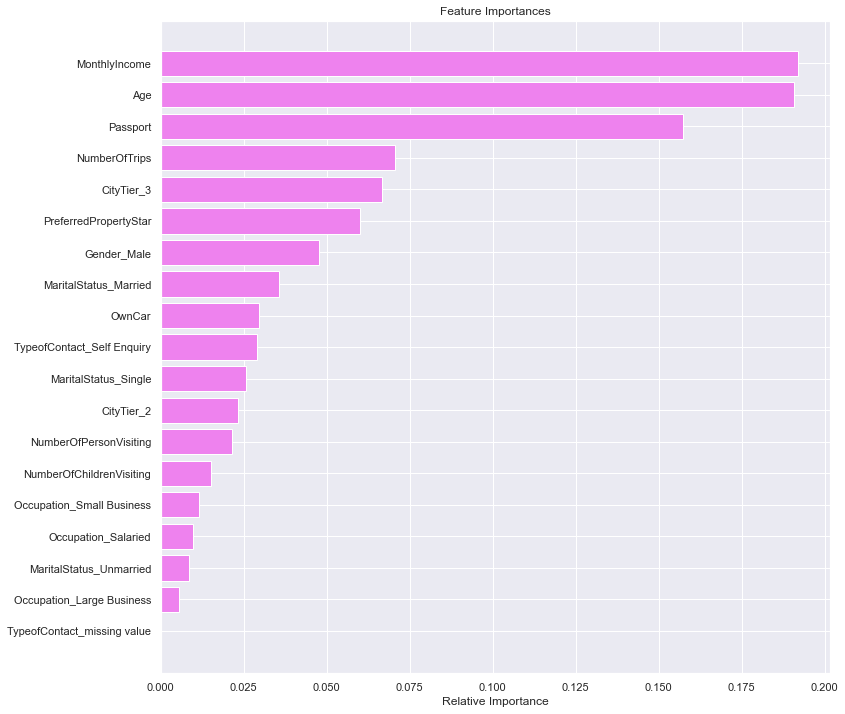

In [179]:
# importance of features in the tree building ( The importance of a feature is computed as the 
#(normalized) total reduction of the criterion brought by that feature. It is also known as the Gini importance )

print (pd.DataFrame(ccdt.feature_importances_, columns = ["Imp"], index = X_train.columns).sort_values(by = 'Imp', ascending = False))

importances = ccdt.feature_importances_
indices = np.argsort(importances)

plt.figure(figsize=(12, 12))
plt.title('Feature Importances')
plt.barh(range(len(indices)),
         importances[indices], color='violet', align='center')
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel('Relative Importance')
plt.show()

Our top 3 features are `Monthly_Income`, `Age` and `Passport`.

# Customer Profile

***Which segment of customers should be targeted more.***

Based on our exploratory (descriptive) data analysis.


`ProdTaken`: Whether the customer has purchased a package or not in the past is our determining factor. All future ones from the model are ones who have in the past.

`Age`: 29 - 36 years old

`TypeofContact`: Self Inquiry

`CityTier`: Tier 1

`Occupation`: Salaried

`Gender`: Male

`NumberOfPersonVisiting`: 3

`PreferredPropertyStar`: 3

`MaritalStatus`: Single

`NumberOfTrips`: 2

`Passport`: 1: Yes

`OwnCar`: 1: Yes

`NumberOfChildrenVisiting`: 1

`Designation`: Executive

`MonthlyIncome`: Gross monthly around 22,178.89 USD ($).

**Customer interaction data**: 

`PitchSatisfactionScore`: 3

`ProductPitched`: Basic

`NumberOfFollowups`: 4

`DurationOfPitch`: 8 to 9 minutes


#  Business Insights & Actions

### Conclusions

**Project Recap**
- We analyzed the travel package purchasing decision of customers using Exploratory Data Analysis.

- We built several models to fit and predict on the dataset using Decision Tree, Random Forest, Bagging, Gradient Boosting, AdaBoost and XGBoost classifiers.

- We visualized different trees to come up with key features and used the importance technique to derive the top features that influence purchasing decisions.

**Objectives**

To predict which customer is more likely to purchase the newly introduced travel package.

***According to the Best Model*** 

* We can predict within 68-76% accuracy the best fit customers for purchasing a travel package.

* We are sensitive to 74-96% of the variance in the decision.

* Our error range from the same model for falsely predicting customers who are not purchasers is ~5%.


### Recommendations

What would your advice be to grow the business?

1. What have we done well in the past and what can we predict on?

* Target marketing to the population sampled and mentioned in the market segmentation. Focus on the important features: income, age and passport holding.

* Bring the customer interaction data from EDA to the sales team to discuss the pros-and-cons of what we found in EDA based on what is possible for them. (do cost-benefit analysis on product lines).

* Not worrying about Designation because the titles across companies/industries are varied in meaning and so the cost of focusing on this variable could be put into other variables.

2. What are opportunities we are missing out on?

* Married and older people who could get some packages with special offerings, coupons or discounts.

* Targeting more freelancers to get their data into the mix.

* Capturing all the available data with data-entry or survey-entry errors or missingness.

### Data scientist things to try

- Try looking at the ID's to know who we are targeting on the best model's predicted data by reinserting the ID column.

- Try changing the classifiers in the stacking algorithm to find better fits and recall.

- Try changing the hyper-parameters of the xgboost to find a better model with greater recall as this model is typically very good for this case.

- Do a Cost-Matrix as a model for this problem and see what comes up. Talk to marketing first about what the cost/benefits are of each category of customer.

- Do misclassification analysis on the segments of the customers that we are not confident in predicting. We can build more heuristic rules about these customers so targeting is more accurate. To say that the model is not so great at predicting on certain profiles for customers.

* External data: Try to investigate what other external factors could influence the purchase of travel packages (i.e., season, weather, major events...)

* Garner additional data through a customer survey asking about travelers attitudes to maintain, enhance or kick-start a healthy lifestyle, and support or increase one's sense of well-being.

# END--------------------------------------------